## Import Packages

In [1]:
%matplotlib inline
%reload_ext autoreload
%autoreload 2

import collections
import datetime
import hashlib
import sys
from typing import Any
import tempfile
from pathlib import Path
import rasterio

import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import pystac
import shapely
import tqdm
from pystac_client import Client
from shapely import wkt

pd.set_option("display.max_colwidth", 250)
sys.path.insert(0, "../")

from src.azure_wrap.ml_client_utils import initialize_blob_service_client, initialize_ml_client, download_blob_directly

from src.utils.utils import initialize_s3_client
from src.data.landsat_data import LandsatGranuleAccess, LandsatQAValues

In [2]:
ml_client = initialize_ml_client()
abs_client = initialize_blob_service_client(ml_client)
s3_client = initialize_s3_client(ml_client)

Found the config file in: /config.json


### How big is a landsat tile?


In [34]:
from src.data.landsat_data import LandsatGranuleAccess
from src.utils.utils import initialize_s3_client

s3_client = initialize_s3_client(ml_client)

item_id = "LC08_L1TP_193038_20191014_20200825_02_T1"
landsat_scene = LandsatGranuleAccess.from_id(item_id)
landsat_scene.prefetch_l1(s3_client, abs_client)

Successfully transferred collection02/level-1/standard/oli-tirs/2019/193/038/LC08_L1TP_193038_20191014_20200825_02_T1/LC08_L1TP_193038_20191014_20200825_02_T1_B1.TIF to l1c-data
Successfully transferred collection02/level-1/standard/oli-tirs/2019/193/038/LC08_L1TP_193038_20191014_20200825_02_T1/LC08_L1TP_193038_20191014_20200825_02_T1_B2.TIF to l1c-data
Successfully transferred collection02/level-1/standard/oli-tirs/2019/193/038/LC08_L1TP_193038_20191014_20200825_02_T1/LC08_L1TP_193038_20191014_20200825_02_T1_B3.TIF to l1c-data
Successfully transferred collection02/level-1/standard/oli-tirs/2019/193/038/LC08_L1TP_193038_20191014_20200825_02_T1/LC08_L1TP_193038_20191014_20200825_02_T1_B4.TIF to l1c-data
Successfully transferred collection02/level-1/standard/oli-tirs/2019/193/038/LC08_L1TP_193038_20191014_20200825_02_T1/LC08_L1TP_193038_20191014_20200825_02_T1_B5.TIF to l1c-data
Successfully transferred collection02/level-1/standard/oli-tirs/2019/193/038/LC08_L1TP_193038_20191014_2020082

In [40]:
from src.data.landsat_data import LANDSAT_STAC_ASSET_MAP

for band in LANDSAT_STAC_ASSET_MAP:
    print(f"Band: {band}, shape: {landsat_scene.get_band(band, abs_client=abs_client).shape}")

Band: coastal, shape: (1, 7941, 7811)
Band: blue, shape: (1, 7941, 7811)
Band: green, shape: (1, 7941, 7811)
Band: red, shape: (1, 7941, 7811)
Band: nir08, shape: (1, 7941, 7811)
Band: swir16, shape: (1, 7941, 7811)
Band: swir22, shape: (1, 7941, 7811)
Band: pan, shape: (1, 15881, 15621)
Band: cirrus, shape: (1, 7941, 7811)
Band: lwir11, shape: (1, 7941, 7811)
Band: lwir12, shape: (1, 7941, 7811)
Band: qa_pixel, shape: (1, 7941, 7811)
Band: qa_radsat, shape: (1, 7941, 7811)


In [41]:
item_id = "LC09_L1TP_193038_20230408_20230408_02_T1"
landsat_scene = LandsatGranuleAccess.from_id(item_id)
landsat_scene.prefetch_l1(s3_client, abs_client)

for band in LANDSAT_STAC_ASSET_MAP:
    print(f"Band: {band}, shape: {landsat_scene.get_band(band, abs_client=abs_client).shape}")

Successfully transferred collection02/level-1/standard/oli-tirs/2023/193/038/LC09_L1TP_193038_20230408_20230408_02_T1/LC09_L1TP_193038_20230408_20230408_02_T1_B1.TIF to l1c-data
Successfully transferred collection02/level-1/standard/oli-tirs/2023/193/038/LC09_L1TP_193038_20230408_20230408_02_T1/LC09_L1TP_193038_20230408_20230408_02_T1_B2.TIF to l1c-data
Successfully transferred collection02/level-1/standard/oli-tirs/2023/193/038/LC09_L1TP_193038_20230408_20230408_02_T1/LC09_L1TP_193038_20230408_20230408_02_T1_B3.TIF to l1c-data
Successfully transferred collection02/level-1/standard/oli-tirs/2023/193/038/LC09_L1TP_193038_20230408_20230408_02_T1/LC09_L1TP_193038_20230408_20230408_02_T1_B4.TIF to l1c-data
Successfully transferred collection02/level-1/standard/oli-tirs/2023/193/038/LC09_L1TP_193038_20230408_20230408_02_T1/LC09_L1TP_193038_20230408_20230408_02_T1_B5.TIF to l1c-data
Successfully transferred collection02/level-1/standard/oli-tirs/2023/193/038/LC09_L1TP_193038_20230408_2023040

In [50]:
from src.data.sentinel2_l1c import Sentinel2L1CItem
from src.utils.parameters import S2_BANDS

s2_scene = Sentinel2L1CItem.from_id("S2B_MSIL2A_20230321T191059_R056_T10UED_20230322T003202")
s2_scene.prefetch_l1c(s3_client, abs_client)

for band in S2_BANDS:
    print(f"Band: {band}, shape: {s2_scene.get_band(band, abs_client=abs_client).shape}")

Band: B01, shape: (1, 1830, 1830)
Band: B02, shape: (1, 10980, 10980)
Band: B03, shape: (1, 10980, 10980)
Band: B04, shape: (1, 10980, 10980)
Band: B05, shape: (1, 5490, 5490)
Band: B06, shape: (1, 5490, 5490)
Band: B07, shape: (1, 5490, 5490)
Band: B08, shape: (1, 10980, 10980)
Band: B09, shape: (1, 1830, 1830)
Band: B11, shape: (1, 5490, 5490)
Band: B12, shape: (1, 5490, 5490)
Band: B8A, shape: (1, 5490, 5490)
Band: SCL, shape: (1, 5490, 5490)


In [51]:
(7931 * 7811) / (5490 * 5490)  # LS tile is ~2x bigger

2.0553694579646384

These are the revamped S2 dataset sizes:
- train = 4562
- val = 348
- h/m/p master set = 699

So for LS lets aim for 
- train = 4562 / 2 = 2281
- val = 348 / 2 = 174
- h/m/p master set = 699 / 2 = 350

# Get WRS catalogue overlapping O&G producing

## Get World Regions

In [4]:
# # get country boundaries
# !curl -L -o data/ne_110m_admin_0_countries.zip https://naciscdn.org/naturalearth/110m/cultural/ne_110m_admin_0_countries.zip
# !unzip -u data/ne_110m_admin_0_countries.zip -d data/ne_110m_admin_0_countries
# !rm data/ne_110m_admin_0_countries.zip

In [5]:
world = gpd.read_file("data/ne_110m_admin_0_countries/")
world.columns

Index(['featurecla', 'scalerank', 'LABELRANK', 'SOVEREIGNT', 'SOV_A3',
       'ADM0_DIF', 'LEVEL', 'TYPE', 'TLC', 'ADMIN',
       ...
       'FCLASS_TR', 'FCLASS_ID', 'FCLASS_PL', 'FCLASS_GR', 'FCLASS_IT',
       'FCLASS_NL', 'FCLASS_SE', 'FCLASS_BD', 'FCLASS_UA', 'geometry'],
      dtype='object', length=169)

In [6]:
# now we're going to map countries in the world dataframeto the EI regions
# This won't be pretty.
# Note: moved Turkey from Europe to Middle East
EI_countries_in_regions = {  # copy-pasted from spreadsheet
    "USA": ["United States of America"],
    "North America wo US": ["Canada", "Mexico"],
    "Europe": [
        "Denmark",
        "Germany",
        "Italy",
        "Netherlands",
        "Norway",
        "Poland",
        "Romania",
        "Ukraine",
        "United Kingdom",
        "Georgia",
    ],
    "CIS": [
        "Armenia",
        "Azerbaijan",
        "Belarus",
        "Kazakhstan",
        "Kyrgyzstan",
        "Moldova",
        "Russia",
        "Tajikistan",
        "Turkmenistan",
        "Uzbekistan",
    ],
    "Middle East": [
        "Bahrain",
        "Iran",
        "Iraq",
        "Israel",
        "Kuwait",
        "Oman",
        "Qatar",
        "Saudi Arabia",
        "Syria",
        "United Arab Emirates",
        "Jordan",
        "Lebanon",
        "Turkey",
    ],
    "Asia": [
        "Bangladesh",
        "Brunei",
        "China",
        "India",
        "Indonesia",
        "Malaysia",
        "Myanmar",
        "Pakistan",
        "Thailand",
        "Vietnam",
    ],
}

world["EI_region"] = world["CONTINENT"].map(
    {
        "Africa": "Africa",
        "Asia": "Asia",
        "Europe": "Europe",
        "North America": "North America wo US",
        "South America": "South and Central America",
        "Oceania": "Australia",
        "Seven seas (open ocean)": "",
        "Antarctica": "",
    }
)

world.loc[world["SUBREGION"] == "Central America", "EI_region"] = "South and Central America"
world.loc[world["REGION_WB"] == "Middle East & North Africa", "EI_region"] = "Middle East"
world.loc[world["CONTINENT"] == "Africa", "EI_region"] = "Africa"
world.loc[world["SUBREGION"] == "Australia and New Zealand", "EI_region"] = "Australia"

EI_country_to_region_map = {
    country: region for (region, country_list) in EI_countries_in_regions.items() for country in country_list
}
# check all EI countries are present in the world dataframe
world_countries_set = set(world.SOVEREIGNT)
for country in EI_country_to_region_map:
    if country == "Bahrain":
        # Bahrain is missing but it's tiny,
        # so let's ignore that
        continue
    world_countries_set.remove(country)  # this raises a KeyError if not present
EI_mapped_countries = world.SOVEREIGNT.map(EI_country_to_region_map)
world["EI_region"] = world.EI_region.where(EI_mapped_countries.isnull(), EI_mapped_countries)

world.EI_region.value_counts()

EI_region
Africa                       51
Europe                       39
Asia                         25
South and Central America    19
Middle East                  14
CIS                          10
North America wo US           8
Australia                     7
USA                           2
                              2
Name: count, dtype: int64

<Axes: >

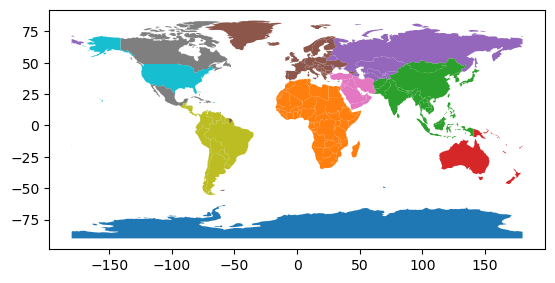

In [7]:
world.plot("EI_region")

In [8]:
EI_geometries = world.dissolve("EI_region")

## WRS tiles: wrs_gdf

In [9]:
# !curl -L -o data/WRS-2_bound_world_0.kml https://d9-wret.s3.us-west-2.amazonaws.com/assets/palladium/production/s3fs-public/atoms/files/WRS-2_bound_world_0.kml

In [10]:
wrs_gdf = gpd.read_file("data/WRS-2_bound_world_0.kml", engine="pyogrio")

# the international date line is a pain in the ass and I don't want to deal with it
wrs_gdf = wrs_gdf[~(wrs_gdf.geometry.bounds["minx"] == -180)]

# remove tiles outside of +-60deg latitude
wrs_gdf = wrs_gdf[(wrs_gdf.geometry.bounds.maxy < 60) & (wrs_gdf.geometry.bounds.miny > -60)]
wrs_gdf.shape

(19201, 12)

In [11]:
wrs_centroid = gpd.GeoDataFrame(geometry=wrs_gdf.geometry.centroid)
joined = gpd.sjoin(wrs_centroid, EI_geometries.reset_index(), how="left", predicate="within")
wrs_gdf["EI_region"] = joined[["EI_region"]]

/tmp/ipykernel_2176351/4195320314.py:1: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  wrs_centroid = gpd.GeoDataFrame(geometry=wrs_gdf.geometry.centroid)


In [12]:
# remove tiles in our Aux/SBR set
# TODO: at chip level, will remove the chips that are used for SBR/aux stuff

# aux_latlongs = pd.read_csv("../src/data/ground_truth_plumes.csv")

# from shapely.geometry import Point

# aux_latlongs["geometry"] = aux_latlongs.apply(lambda row: Point(row["lon"], row["lat"]), axis=1)
# aux_gdf = gpd.GeoDataFrame(aux_latlongs, geometry="geometry", crs="EPSG:4326")  # CRS for lat/lon
# aux_wrs = gpd.sjoin(aux_gdf, wrs_gdf, how="left", predicate="intersects")
# aux_wrs_list = aux_wrs.index_right.unique().tolist()  # 8 wrs

# wrs_gdf = wrs_gdf[~wrs_gdf.index.isin(aux_wrs_list)]

In [13]:
# remove tiles with no region
wrs_has_region = wrs_gdf.EI_region.str.len() > 0
wrs_gdf = wrs_gdf[wrs_has_region]
wrs_gdf.shape

(5195, 13)

Text(0.5, 1.0, 'WRS tiles coloured by EI region')

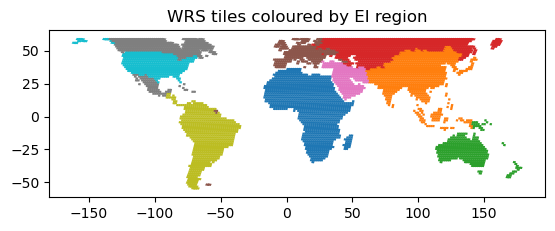

In [14]:
wrs_gdf.plot("EI_region")
plt.title("WRS tiles coloured by EI region")

In [15]:
len(wrs_gdf)  # number of WRS granules

5195

# Classifying wrs scenes into O&G producing

- Here we just define O&G producing as REDACTED fields.
- See Appendix on how to load additional producing datasets

In [ ]:
producing_union = # Union of all producing areas, TODO: Insert as we can't share the one we were using

<Axes: >

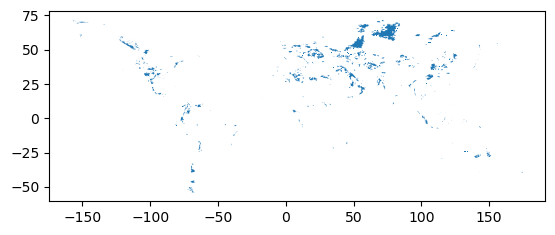

In [20]:
producing_by_region = EI_geometries.intersection(producing_union)
producing_by_region.plot()

In [21]:
def x_intersects_any_in_y(x: gpd.GeoSeries, y: gpd.GeoSeries):
    """Uses geopandas' spatial index to figure out, for each geometry in x,
    whether it intersects with *any* geometry in y.

    Same as `x.intersects(y.union_all())` but much faster.
    """
    if len(y) == 0:
        return np.zeros(len(x), dtype=bool)
    matches, distances = y.sindex.nearest(x, return_all=False, return_distance=True)
    return distances == 0


wrs_intersects_producing = x_intersects_any_in_y(wrs_gdf.geometry, producing_by_region.geometry)

# add that as a column in data frame
wrs_gdf["OG_producing"] = wrs_intersects_producing
wrs_gdf["OG_producing"].value_counts()

OG_producing
False    3876
True     1319
Name: count, dtype: int64

In [22]:
wrs_gdf_overlapping = wrs_gdf[wrs_gdf["OG_producing"] == True].copy()
wrs_gdf_overlapping.shape

(1319, 14)

In [23]:
wrs_gdf_overlapping["overlapping_area"] = wrs_gdf_overlapping.intersection(producing_union).area

/tmp/ipykernel_2176351/823277260.py:1: UserWarning: Geometry is in a geographic CRS. Results from 'area' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  wrs_gdf_overlapping["overlapping_area"] = wrs_gdf_overlapping.intersection(producing_union).area


In [24]:
wrs_gdf_overlapping.explore()

# Get a catalogue of WRS IDs following a target region distribution 

In this section we will create a master csv that would have all the WRS-date samples which will later be split into train/val. The main logic in this catalogue creation is:
- Spatially: choose WRS in producing regions, follow a region distribution dictated by customer needs
- Temporally: random selection, roughly equal split across seasons for each region. Sample additionally when a given date has too many clouds/no data

## Get target distribution per region

- After feedback from Rob & Jack, we've come up with this split for our training tiles: Use 34% US, 24% ME, 12% Africa, 10% CIS, 5% NA without USA, 5% SMA, 5% Asia, 2.5% Australia, 2.5% EU
    - **Note:** This is still somewhat arbitrary 

In [25]:
total_tiles = 2300  # to try and match pre revamp S2 size
num_tiles_by_region = {
    "USA": int(np.round(total_tiles * 0.34)),
    "Middle East": int(np.round(total_tiles * 0.24)),
    "Africa": int(np.round(total_tiles * 0.12)),
    "CIS": int(np.round(total_tiles * 0.10)),
    "North America wo US": int(np.round(total_tiles * 0.05)),
    "South and Central America": int(np.round(total_tiles * 0.05)),
    "Asia": int(np.round(total_tiles * 0.05)),
    "Australia": int(np.round(total_tiles * 0.025)),
    "Europe": int(np.round(total_tiles * 0.025)),
}
num_tiles_by_region

{'USA': 782,
 'Middle East': 552,
 'Africa': 276,
 'CIS': 230,
 'North America wo US': 115,
 'South and Central America': 115,
 'Asia': 115,
 'Australia': 58,
 'Europe': 58}

In [26]:
# wrs_gdf[wrs_gdf["OG_producing"]==True].explore()

In [27]:
print(wrs_gdf[wrs_gdf["OG_producing"] == True].shape)
wrs_gdf[wrs_gdf["OG_producing"] == True].EI_region.value_counts()

(1319, 14)


EI_region
Asia                         298
CIS                          228
Europe                       150
USA                          147
Africa                       138
South and Central America    125
Middle East                  103
North America wo US           92
Australia                     38
Name: count, dtype: int64

## Selecting producing wrs
- For each region, if we need N tiles and have M available wrs tiles:
    - If N < M: Sample N tiles randomly
    - If N > M: Take all M tiles, then sample (N-M) additional tiles from the same pool, repeating up to 3 times if needed
- The sampling is made reproducible by:
    - Using a deterministic seed generated from the region name + base_seed + step
    - Step increases (0,1,2) for each repeated sampling within a region
    - Base seed increments for each new region

In [28]:
# Generate a deterministic seed using hashlib
# Thanks chatgpt
# For the same wrs_gdf, num_tiles_by_region, and total_tiles, we will select the same
# wrs for each region
def generate_seed(region: str, base_seed: int, step: int = 0) -> int:
    region_bytes = region.encode("utf-8")  # Convert region name to bytes
    hash_object = hashlib.md5(region_bytes)  # Create an MD5 hash object
    region_hash = int(hash_object.hexdigest(), 16)  # Convert hash to an integer
    return (region_hash + base_seed + step) % (2**32)  # Keep seed within 32-bit range


wrs_selected = []
seed_count = 3334
for region, num in num_tiles_by_region.items():
    wrs_prod = wrs_gdf[(wrs_gdf.EI_region == region) & (wrs_gdf["OG_producing"] == True)].copy()
    print(f"{region:25}: We have {len(wrs_prod):3} and want {num:3}")

    if num < len(wrs_prod):
        # If we have more tiles than needed, just sample directly
        print(f"  Sampling {num}")
        # Use a unique seed for the initial sampling
        seed = generate_seed(region, seed_count, step=0)
        wrs_selected.append(wrs_prod.sample(num, random_state=seed))

    else:
        # We don't have enough, so take everything first
        print(f"  Taking all {len(wrs_prod)} IDs once")
        wrs_selected.append(wrs_prod)
        num = num - len(wrs_prod)  # remaining tiles needed
        step = 1

        while num > 0:
            if num < len(wrs_prod):
                print(f"  Sampling additional {num}")
                # Use a different unique seed for additional sampling
                seed = generate_seed(region, seed_count, step=step)
                wrs_selected.append(wrs_prod.sample(num, random_state=seed))
                num = 0  # done selecting
            else:
                print(f"  Taking all {len(wrs_prod)} IDs once")
                wrs_selected.append(wrs_prod)
                num = num - len(wrs_prod)
                step += 1  # Increment step for the next unique sampling seed

                # if num < len(wrs_prod):
                #     print(f"  Sampling additional {num}")
                #     # Use yet another unique seed for further sampling
                #     seed = generate_seed(region, seed_count, step=2)
                #     wrs_selected.append(wrs_prod.sample(num, random_state=seed))

    seed_count += 1  # Increment base seed for next region
wrs_selected = pd.concat(wrs_selected)
wrs_selected = wrs_selected.reset_index()
assert len(wrs_selected) == total_tiles

USA                      : We have 147 and want 782
  Taking all 147 IDs once
  Taking all 147 IDs once
  Taking all 147 IDs once
  Taking all 147 IDs once
  Taking all 147 IDs once
  Sampling additional 47
Middle East              : We have 103 and want 552
  Taking all 103 IDs once
  Taking all 103 IDs once
  Taking all 103 IDs once
  Taking all 103 IDs once
  Taking all 103 IDs once
  Sampling additional 37
Africa                   : We have 138 and want 276
  Taking all 138 IDs once
  Taking all 138 IDs once
CIS                      : We have 228 and want 230
  Taking all 228 IDs once
  Sampling additional 2
North America wo US      : We have  92 and want 115
  Taking all 92 IDs once
  Sampling additional 23
South and Central America: We have 125 and want 115
  Sampling 115
Asia                     : We have 298 and want 115
  Sampling 115
Australia                : We have  38 and want  58
  Taking all 38 IDs once
  Sampling additional 20
Europe                   : We have 150 and

AssertionError: 

In [29]:
len(wrs_selected), total_tiles

(2301, 2300)

In [30]:
wrs_selected.explore()

In [31]:
# plt.figure(figsize=(10, 20))
# ax = plt.gca()
# world.plot("EI_region", ax=ax, alpha=0.1)
# wrs_selected.plot(ax=ax, alpha=0.5)
# plt.title("Selected tiles in O&G producing areas")

In [32]:
# how many unique wrs?
wrs_selected["Name"].nunique()

1034

In [33]:
# max number of samples for a given wrs
wrs_selected["Name"].value_counts().max()

6

In [34]:
# wrs_selected = wrs_selected.drop("Description", axis=1)

In [35]:
# Save master wrs set. This will later be split into train/val
master_filename = f"2025_03_03_wrs_within_OG_revamp_{total_tiles}_master_set"
wrs_selected.to_file(
    f"../src/data/tiles/landsat/csv_files/{master_filename}.geojson",
    driver="GeoJSON",
)
wrs_selected.to_csv(
    f"../src/data/tiles/landsat/csv_files/{master_filename}.csv",
    index=False,
)

## Selecting dates at random using the STAC catalog
- From `Selecting producing wrs` we have selected our wrs tiles and determined the number of samples we want from each. This info is stored in `num_samples[wrs]` (see sampling fn, `sample_dates_for_wrs`)
- We sample from the years L9 was available, 2022 onwards
- **Core Sampling Logic:**
    - Each wrs tile gets a deterministic seed: `get_seed_from_string(f"{wrs}_{wrs_counter[wrs]}")`. This ensures we select the same dates each time
    - We set initial quality thresholds of 95% max nodata, 98% max clouds
    - If selected image has high nodata/clouds, we sample additional image with stricter thresholds (40% each)
    - We have an additional check that we don't select 2023 dates for wrs in our detection threshold "test" set

In [36]:
# Get the WRS that intersect with the detection threshold test set.
# Create the detection threshold gdf using the Sentinel MGRS grid.
# Then based on geometry join, figure out the WRS tiles the detection
# threshold MGRS tiles correspond to.

mgrs_gdf = gpd.read_file(
    "data/S2A_OPER_GIP_TILPAR_MPC__20151209T095117_V20150622T000000_21000101T000000_B00.kml", engine="pyogrio"
)
# for some reason each wrs is a GeometryCollection containing polygons and points
# let's get rid of the stupid point
mgrs_gdf = mgrs_gdf.dissolve("Name")  # performs a union on the GeometryCollection
# the international date line is a pain in the ass and I don't want to deal with it
mgrs_gdf = mgrs_gdf[~(mgrs_gdf.geometry.bounds["minx"] == -180)]
# remove tiles outside of +-60deg latitude
mgrs_gdf = mgrs_gdf[(mgrs_gdf.geometry.bounds.maxy < 60) & (mgrs_gdf.geometry.bounds.miny > -60)]

dt_mgrs = pd.read_csv("../src/data/tiles/s2/csv_files/fpr_areas.csv").mgrs.unique().tolist()
dt_gdf = mgrs_gdf[mgrs_gdf.index.isin(dt_mgrs)]
dt_wrs = wrs_selected[wrs_selected.geometry.intersects(dt_gdf.unary_union)].Name.unique().tolist()
len(dt_wrs), dt_wrs[:5]

/anaconda/envs/methane-cv/lib/python3.10/site-packages/pyogrio/geopandas.py:261: UserWarning: More than one layer found in 'S2A_OPER_GIP_TILPAR_MPC__20151209T095117_V20150622T000000_21000101T000000_B00.kml': 'Features' (default), 'Info'. Specify layer parameter to avoid this warning.
  result = read_func(
/tmp/ipykernel_2176351/2730678931.py:19: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  dt_wrs = wrs_selected[wrs_selected.geometry.intersects(dt_gdf.unary_union)].Name.unique().tolist()


(37, ['31_39', '30_39', '29_39', '32_38', '31_38'])

In [37]:
api_url = "https://landsatlook.usgs.gov/stac-server"

client = Client.open(
    api_url,
)
collection = "landsat-c2l1"

# Load in current "test set" aka Detection Threshold tiles
det_thresh_test_set_wrs = dt_wrs

### Sampling Logic Helper Functions ###


def get_seed_from_string(s: str) -> int:
    """Create reproducible seed from string using hashlib."""
    return int(hashlib.sha256(s.encode()).hexdigest(), 16) % (2**32)


def random_date(
    start: datetime.datetime, end: datetime.datetime, rng: np.random.Generator, wrs: str
) -> datetime.datetime:
    while True:
        time_delta = int((end - start).total_seconds())
        random_seconds = int(rng.integers(0, time_delta))
        date = start + datetime.timedelta(seconds=random_seconds)

        # For test set wrs, keep sampling until we get a non-2023 date
        if wrs in det_thresh_test_set_wrs and date.year == 2023:
            print("Got a test set wrs, trying to find non 2023 date...")
            continue

        return date


def random_item_for_wrs(
    wrs: str, rng: np.random.Generator, max_cloud_cover: float = 60, start_year: int = 2016, end_year: int = 2024
):
    start_time = datetime.datetime(start_year, 1, 1)
    end_time = datetime.datetime(end_year, 12, 31)

    end_time = random_date(start_time, end_time, rng, wrs)

    wrs_path = wrs.split("_")[0].zfill(3)  # Ensure 3 digits
    wrs_row = wrs.split("_")[-1].zfill(3)  # Ensure 3 digits

    search = client.search(
        collections=[collection],
        max_items=1,
        datetime=f"{start_time.isoformat()}/{end_time.isoformat()}",
        query={
            "landsat:wrs_path": {"eq": wrs_path},
            "landsat:wrs_row": {"eq": wrs_row},
            "eo:cloud_cover": {"lt": max_cloud_cover},
            "platform": {"in": ["LANDSAT_8", "LANDSAT_9"]},
        },
    )
    return next(search.items())


def item_area(item: pystac.Item) -> float:
    polygon = shapely.geometry.shape(item.geometry)
    return polygon.area

In [38]:
# Load in selected wrs tiles (within producing regions)
wrs_selected = gpd.read_file(f"../src/data/tiles/landsat/csv_files/{master_filename}.geojson")
wrs_selected = wrs_selected.sort_values("Name")
wrs_we_want = wrs_selected["Name"].value_counts().to_dict()
wrs_selected.shape, len(wrs_we_want)

((2301, 15), 1034)

In [39]:
# Now pick a random date with available data for every selected tile
# this takes a bit less than 1 second per tile, about 20 minutes for 2000 tiles


def get_random_item(
    wrs: str,
    wrs_area: float,
    sampled_dates: set,
    thresholds: dict,
    rng: np.random.Generator,
    start_year: int,
    end_year: int,
    verbose: bool = True,
) -> tuple[Any, float, float] | None:
    """Get a random satellite image that meets quality thresholds within the desired date range."""
    try:
        # Attempt to sample a random item
        item = random_item_for_wrs(
            wrs, rng=rng, max_cloud_cover=thresholds["cloud"], start_year=start_year, end_year=end_year
        )

        # Check if date already sampled
        if item.datetime in sampled_dates:
            if verbose:
                print(f"{wrs} - {item.id} --> DONT USE (we have this date already)")
            return None

        # Calculate nodata percentage and cloud cover
        nodata_perc = abs(100 - 100 * item_area(item) / wrs_area)
        s2_date = item.properties["datetime"][:10]
        cloud_perc = item.ext.eo.cloud_cover

        if nodata_perc > thresholds["nodata"]:
            if verbose:
                print(f" --> DONT USE (too much nodata: {nodata_perc:.1f}%)")
            return None

        if verbose:
            print(f" --> USE")
        return item, nodata_perc, cloud_perc

    except Exception as e:
        if verbose:
            print(f"Error sampling item for {wrs}: {e}. Maybe no data between {start_year} and {end_year}. Try again.")
        return None


def sample_dates_for_wrs(
    wrs_selected_df: pd.DataFrame, num_samples: dict[str, int], debug: bool = True, verbose: bool = True
):
    """Sample dates for WRS tiles with quality checks."""

    # Quality thresholds
    INITIAL_THRESHOLDS = {"nodata": 95, "cloud": 98}
    STRICT_THRESHOLDS = {"nodata": 40, "cloud": 40}
    MAX_RETRIES = 100

    # Output tracking
    selected_items = []
    nodata_percentages = []
    cloud_percentages = []
    is_backup_sample = []

    # State tracking
    sampled_dates = collections.defaultdict(set)
    sample_counts = collections.defaultdict(int)
    backup_counts = collections.defaultdict(int)

    # Main sampling loop
    for idx, row in tqdm.tqdm(wrs_selected_df.iterrows(), total=len(wrs_selected_df)):
        if debug:
            if idx == 30:
                break

        wrs = row["Name"]
        wrs_area = row["geometry"].area
        samples_needed = num_samples[wrs]

        # Determine start and end year for temporal diversity

        ### FOR LS ###

        start_year = 2022
        end_year = 2024

        # Keep trying until we have enough samples
        while sample_counts[wrs] < samples_needed:
            # Create reproducible RNG for this WRS tile and sample
            seed = get_seed_from_string(f"{wrs}_sample_{sample_counts[wrs]}")
            rng = np.random.default_rng(seed)

            if verbose:
                print(
                    f"{wrs}: We have {sample_counts[wrs]}/{samples_needed} --> Sample randomly from {start_year}-01-01 to {end_year}-12-31"
                )

            # Try to get a valid sample
            for _ in range(MAX_RETRIES):
                # Try to get primary sample
                result = get_random_item(
                    wrs=wrs,
                    rng=rng,
                    wrs_area=wrs_area,
                    sampled_dates=sampled_dates[wrs],
                    thresholds=INITIAL_THRESHOLDS,
                    start_year=start_year,
                    end_year=end_year,
                    verbose=verbose,
                )

                if result is not None:
                    item, nodata_perc, cloud_perc = result

                    # Record primary sample
                    selected_items.append(item)
                    nodata_percentages.append(nodata_perc)
                    cloud_percentages.append(cloud_perc)
                    is_backup_sample.append(False)
                    sampled_dates[wrs].add(item.datetime)

                    # Check if we need a backup sample. Example: if a tile has 90% nodata + 50% clouds, it is deemed that
                    # 95% of pixels are obscured. Therefore, we have a 95% chance to sample another ID with STRICT_THRESHOLDS
                    total_obscured = nodata_perc + (1 - nodata_perc / 100) * cloud_perc

                    if (
                        rng.random() * 100 < total_obscured
                    ):  # fancy way of randomly deciding to get backup sample, with probability proportional to obscured percentage
                        backup_result = get_random_item(
                            wrs=wrs,
                            rng=rng,
                            wrs_area=wrs_area,
                            sampled_dates=sampled_dates[wrs],
                            thresholds=STRICT_THRESHOLDS,
                            start_year=start_year,
                            end_year=end_year,
                            verbose=verbose,
                        )

                        if backup_result is not None:
                            backup_item, backup_nodata, backup_cloud_perc = backup_result
                            selected_items.append(backup_item)
                            nodata_percentages.append(backup_nodata)
                            cloud_percentages.append(backup_cloud_perc)
                            is_backup_sample.append(True)
                            sampled_dates[wrs].add(backup_item.datetime)
                            backup_counts[wrs] += 1

                    sample_counts[wrs] += 1

                    if verbose:
                        print(
                            f"Sampled {sample_counts[wrs]} items for {wrs} ({backup_counts[wrs]} backups): {sorted([k.date().isoformat() for k in sampled_dates[wrs]])}"
                        )

                    break  # Exit retry loop on success

            else:
                # If we get here, we tried MAX_RETRIES times and failed
                raise ValueError(f"Could not find suitable samples for {wrs} after {MAX_RETRIES} attempts")

    return selected_items, nodata_percentages, cloud_percentages, is_backup_sample

In [45]:
selected_prod_items, nodata_percs, cloud_percs, additional_id_due_to_high_nodata_clouds = sample_dates_for_wrs(
    wrs_selected, wrs_we_want, debug=False, verbose=True
)

  0%|                                                                                                | 0/2301 [00:00<?, ?it/s]

101_22: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


  0%|                                                                                        | 1/2301 [00:00<24:49,  1.54it/s]

 --> USE
Sampled 1 items for 101_22 (0 backups): ['2022-01-11']
102_77: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


  0%|                                                                                        | 2/2301 [00:01<21:37,  1.77it/s]

 --> USE
Sampled 1 items for 102_77 (0 backups): ['2022-05-10']
103_76: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


  0%|                                                                                        | 3/2301 [00:02<27:34,  1.39it/s]

 --> USE
Sampled 1 items for 103_76 (1 backups): ['2022-01-25', '2022-03-30']
103_77: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


  0%|▏                                                                                       | 4/2301 [00:02<26:52,  1.42it/s]

 --> USE
 --> USE
Sampled 1 items for 103_77 (1 backups): ['2022-05-01', '2023-07-07']
104_76: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


  0%|▏                                                                                       | 5/2301 [00:02<19:58,  1.92it/s]

 --> USE
Sampled 1 items for 104_76 (0 backups): ['2022-10-15']
104_77: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 104_77 (0 backups): ['2024-09-02']
104_77: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31


  0%|▏                                                                                       | 6/2301 [00:03<25:23,  1.51it/s]

 --> USE
Sampled 2 items for 104_77 (0 backups): ['2023-10-02', '2024-09-02']
107_32: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


  0%|▎                                                                                       | 8/2301 [00:04<20:10,  1.89it/s]

 --> USE
Sampled 1 items for 107_32 (1 backups): ['2022-08-17', '2024-07-05']
108_25: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


  0%|▎                                                                                       | 9/2301 [00:05<18:56,  2.02it/s]

 --> USE
Sampled 1 items for 108_25 (1 backups): ['2022-05-20', '2023-04-05']
108_27: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


  0%|▍                                                                                      | 10/2301 [00:05<18:37,  2.05it/s]

 --> USE
Sampled 1 items for 108_27 (0 backups): ['2023-01-31']
108_62: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


  0%|▍                                                                                      | 11/2301 [00:05<18:16,  2.09it/s]

 --> USE
Sampled 1 items for 108_62 (0 backups): ['2022-10-27']
109_24: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


  1%|▍                                                                                      | 13/2301 [00:07<18:44,  2.03it/s]

 --> USE
Sampled 1 items for 109_24 (1 backups): ['2023-03-27', '2023-09-03']
10_28: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 10_28 (0 backups): ['2024-01-03']
10_54: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


  1%|▌                                                                                      | 14/2301 [00:07<20:59,  1.82it/s]

 --> USE
Sampled 1 items for 10_54 (1 backups): ['2023-07-11', '2023-12-02']
110_23: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


  1%|▌                                                                                      | 15/2301 [00:08<17:04,  2.23it/s]

 --> USE
Sampled 1 items for 110_23 (0 backups): ['2023-03-02']
110_72: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 1 items for 110_72 (1 backups): ['2023-12-15', '2024-03-04']
110_72: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31


  1%|▌                                                                                      | 16/2301 [00:09<27:18,  1.39it/s]

 --> USE
Sampled 2 items for 110_72 (1 backups): ['2022-01-10', '2023-12-15', '2024-03-04']
110_73: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 110_73 (0 backups): ['2023-05-21']
110_73: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31


  1%|▋                                                                                      | 18/2301 [00:10<22:48,  1.67it/s]

 --> USE
Sampled 2 items for 110_73 (0 backups): ['2023-05-21', '2024-07-26']
113_61: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


  1%|▊                                                                                      | 20/2301 [00:11<20:42,  1.84it/s]

 --> USE
Sampled 1 items for 113_61 (1 backups): ['2023-08-14', '2024-09-17']
113_80: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 113_80 (0 backups): ['2024-04-26']
113_80: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31


  1%|▊                                                                                      | 21/2301 [00:11<21:50,  1.74it/s]

 --> USE
Sampled 2 items for 113_80 (0 backups): ['2022-08-11', '2024-04-26']
113_81: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


  1%|▊                                                                                      | 23/2301 [00:12<19:37,  1.94it/s]

 --> USE
Sampled 1 items for 113_81 (1 backups): ['2023-09-15', '2024-09-17']
113_81: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 113_81 (1 backups): ['2022-12-17', '2023-09-15', '2024-09-17']
115_27: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


  1%|▉                                                                                      | 25/2301 [00:13<15:47,  2.40it/s]

 --> USE
Sampled 1 items for 115_27 (0 backups): ['2024-03-23']
115_28: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


  1%|█                                                                                      | 27/2301 [00:14<17:02,  2.22it/s]

 --> USE
Sampled 1 items for 115_28 (1 backups): ['2023-05-24', '2023-09-13']
115_30: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 115_30 (0 backups): ['2023-01-16']
115_36: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


  1%|█                                                                                      | 28/2301 [00:14<14:38,  2.59it/s]

 --> USE
Sampled 1 items for 115_36 (0 backups): ['2022-04-19']
116_27: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


  1%|█                                                                                      | 29/2301 [00:15<15:23,  2.46it/s]

 --> USE
Sampled 1 items for 116_27 (0 backups): ['2024-06-18']
116_30: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


  1%|█▏                                                                                     | 30/2301 [00:15<15:52,  2.38it/s]

 --> USE
Sampled 1 items for 116_30 (0 backups): ['2024-12-11']
117_28: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


  1%|█▏                                                                                     | 31/2301 [00:15<16:19,  2.32it/s]

 --> USE
Sampled 1 items for 117_28 (0 backups): ['2023-06-07']
117_29: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


  1%|█▏                                                                                     | 32/2301 [00:16<21:50,  1.73it/s]

 --> USE
Sampled 1 items for 117_29 (1 backups): ['2022-09-24', '2023-06-23']
117_57: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


  1%|█▏                                                                                     | 33/2301 [00:17<20:47,  1.82it/s]

 --> USE
Sampled 1 items for 117_57 (1 backups): ['2023-06-23', '2024-04-06']
117_60: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


  1%|█▎                                                                                     | 34/2301 [00:18<24:47,  1.52it/s]

 --> USE
Sampled 1 items for 117_60 (1 backups): ['2023-09-27', '2023-10-29']
117_61: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


  2%|█▎                                                                                     | 35/2301 [00:18<24:27,  1.54it/s]

 --> USE
Sampled 1 items for 117_61 (1 backups): ['2022-01-27', '2022-09-24']
118_30: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


  2%|█▍                                                                                     | 37/2301 [00:20<22:12,  1.70it/s]

 --> USE
Sampled 1 items for 118_30 (1 backups): ['2022-06-27', '2023-10-20']
118_60: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 118_60 (0 backups): ['2023-11-05']
118_61: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


  2%|█▍                                                                                     | 38/2301 [00:20<20:43,  1.82it/s]

 --> USE
Sampled 1 items for 118_61 (0 backups): ['2023-05-13']
119_27: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


  2%|█▍                                                                                     | 39/2301 [00:21<19:50,  1.90it/s]

 --> USE
Sampled 1 items for 119_27 (0 backups): ['2024-05-06']
119_30: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


  2%|█▌                                                                                     | 40/2301 [00:21<21:20,  1.77it/s]

 --> USE
 --> USE
Sampled 1 items for 119_30 (1 backups): ['2022-05-01', '2024-05-22']
119_38: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


  2%|█▌                                                                                     | 41/2301 [00:22<22:29,  1.67it/s]

 --> USE
 --> USE
Sampled 1 items for 119_38 (1 backups): ['2023-04-02', '2023-10-11']
11_61: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


  2%|█▌                                                                                     | 42/2301 [00:23<23:06,  1.63it/s]

 --> USE
Sampled 1 items for 11_61 (1 backups): ['2022-05-28', '2023-08-03']
11_63: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


  2%|█▋                                                                                     | 43/2301 [00:23<18:40,  2.02it/s]

 --> USE
Sampled 1 items for 11_63 (0 backups): ['2024-09-06']
120_28: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


  2%|█▋                                                                                     | 45/2301 [00:23<14:51,  2.53it/s]

 --> USE
Sampled 1 items for 120_28 (0 backups): ['2024-03-10']
120_30: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 120_30 (0 backups): ['2023-02-20']
120_35: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


  2%|█▋                                                                                     | 46/2301 [00:24<20:43,  1.81it/s]

 --> USE
Sampled 1 items for 120_35 (1 backups): ['2022-03-05', '2024-08-01']
120_58: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


  2%|█▊                                                                                     | 47/2301 [00:25<21:47,  1.72it/s]

 --> USE
 --> USE
Sampled 1 items for 120_58 (1 backups): ['2023-08-31', '2023-11-19']
121_28: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


  2%|█▊                                                                                     | 49/2301 [00:26<16:18,  2.30it/s]

 --> USE
Sampled 1 items for 121_28 (0 backups): ['2024-05-20']
121_31: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 121_31 (0 backups): ['2022-01-23']
121_34: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


  2%|█▉                                                                                     | 50/2301 [00:26<13:38,  2.75it/s]

 --> USE
Sampled 1 items for 121_34 (0 backups): ['2024-12-14']
121_35: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


  2%|█▉                                                                                     | 51/2301 [00:26<17:03,  2.20it/s]

 --> USE
Sampled 1 items for 121_35 (1 backups): ['2024-04-18', '2024-06-21']
121_37: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


  2%|█▉                                                                                     | 52/2301 [00:27<20:24,  1.84it/s]

 --> USE
 --> USE
Sampled 1 items for 121_37 (1 backups): ['2022-09-04', '2024-12-14']
121_65: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


  2%|██                                                                                     | 54/2301 [00:28<19:23,  1.93it/s]

 --> USE
Sampled 1 items for 121_65 (1 backups): ['2023-06-19', '2023-07-05']
122_34: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 122_34 (0 backups): ['2023-08-13']
123_28: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


  2%|██                                                                                     | 55/2301 [00:29<24:00,  1.56it/s]

 --> USE
Sampled 1 items for 123_28 (1 backups): ['2022-02-22', '2023-07-19']
123_29: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


  2%|██                                                                                     | 56/2301 [00:30<21:59,  1.70it/s]

 --> USE
Sampled 1 items for 123_29 (0 backups): ['2022-10-20']
123_30: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


  2%|██▏                                                                                    | 57/2301 [00:30<20:34,  1.82it/s]

 --> USE
Sampled 1 items for 123_30 (0 backups): ['2023-01-24']
123_34: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


  3%|██▏                                                                                    | 58/2301 [00:31<21:44,  1.72it/s]

 --> USE
Sampled 1 items for 123_34 (1 backups): ['2023-06-17', '2023-12-26']
124_27: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


  3%|██▏                                                                                    | 59/2301 [00:31<17:43,  2.11it/s]

 --> USE
Sampled 1 items for 124_27 (0 backups): ['2024-01-02']
124_28: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


  3%|██▎                                                                                    | 60/2301 [00:32<17:42,  2.11it/s]

 --> USE
Sampled 1 items for 124_28 (0 backups): ['2024-05-25']
124_34: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


  3%|██▎                                                                                    | 61/2301 [00:32<17:28,  2.14it/s]

 --> USE
Sampled 1 items for 124_34 (0 backups): ['2024-11-01']
124_37: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


  3%|██▎                                                                                    | 62/2301 [00:32<17:16,  2.16it/s]

 --> USE
Sampled 1 items for 124_37 (0 backups): ['2022-04-02']
124_39: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


  3%|██▍                                                                                    | 64/2301 [00:33<14:15,  2.61it/s]

 --> USE
Sampled 1 items for 124_39 (0 backups): ['2022-12-14']
125_26: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 125_26 (0 backups): ['2023-02-23']
125_31: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


  3%|██▍                                                                                    | 65/2301 [00:33<12:15,  3.04it/s]

 --> USE
Sampled 1 items for 125_31 (0 backups): ['2024-12-26']
125_34: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 125_34 (0 backups): ['2022-06-12']


  3%|██▍                                                                                    | 66/2301 [00:33<10:50,  3.44it/s]

125_61: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


  3%|██▌                                                                                    | 67/2301 [00:34<14:42,  2.53it/s]

 --> USE
 --> USE
Sampled 1 items for 125_61 (1 backups): ['2022-12-21', '2023-01-22']
126_36: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


  3%|██▌                                                                                    | 68/2301 [00:34<12:26,  2.99it/s]

 --> USE
Sampled 1 items for 126_36 (0 backups): ['2023-08-09']
126_39: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


  3%|██▌                                                                                    | 69/2301 [00:35<15:56,  2.33it/s]

 --> USE
 --> USE
Sampled 1 items for 126_39 (1 backups): ['2022-05-02', '2023-10-28']
126_60: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


  3%|██▋                                                                                    | 70/2301 [00:36<22:23,  1.66it/s]

 --> USE
Sampled 1 items for 126_60 (1 backups): ['2024-06-08', '2024-07-26']
127_30: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


  3%|██▋                                                                                    | 71/2301 [00:36<21:26,  1.73it/s]

 --> USE
Sampled 1 items for 127_30 (0 backups): ['2022-12-03']
127_32: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


  3%|██▋                                                                                    | 72/2301 [00:37<20:04,  1.85it/s]

 --> USE
Sampled 1 items for 127_32 (0 backups): ['2022-07-28']
127_35: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


  3%|██▊                                                                                    | 73/2301 [00:37<19:09,  1.94it/s]

 --> USE
Sampled 1 items for 127_35 (0 backups): ['2024-04-12']
127_36: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


  3%|██▊                                                                                    | 74/2301 [00:38<23:35,  1.57it/s]

 --> USE
Sampled 1 items for 127_36 (1 backups): ['2022-04-23', '2023-03-25']
127_38: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


  3%|██▊                                                                                    | 76/2301 [00:39<17:16,  2.15it/s]

 --> USE
Sampled 1 items for 127_38 (0 backups): ['2022-08-13']
127_44: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 127_44 (0 backups): ['2023-11-20']
128_29: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


  3%|██▉                                                                                    | 77/2301 [00:39<14:44,  2.52it/s]

 --> USE
Sampled 1 items for 128_29 (0 backups): ['2024-03-18']
128_37: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


  3%|██▉                                                                                    | 78/2301 [00:40<17:49,  2.08it/s]

Error sampling item for 128_37: . Maybe no data between 2022 and 2024. Try again.
Sampled 1 items for 128_37 (0 backups): ['2022-02-09']
128_38: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


  3%|██▉                                                                                    | 79/2301 [00:40<17:35,  2.10it/s]

 --> USE
Sampled 1 items for 128_38 (0 backups): ['2022-03-13']
128_39: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


  3%|███                                                                                    | 80/2301 [00:41<17:31,  2.11it/s]

 --> USE
Sampled 1 items for 128_39 (0 backups): ['2023-09-08']
128_42: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


  4%|███                                                                                    | 81/2301 [00:42<20:31,  1.80it/s]

 --> USE
 --> USE
Sampled 1 items for 128_42 (1 backups): ['2023-05-03', '2024-10-12']
128_49: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


  4%|███                                                                                    | 82/2301 [00:42<24:38,  1.50it/s]

 --> USE
Sampled 1 items for 128_49 (1 backups): ['2023-09-08', '2024-05-05']
128_59: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


  4%|███▏                                                                                   | 83/2301 [00:43<24:25,  1.51it/s]

 --> USE
Sampled 1 items for 128_59 (1 backups): ['2022-06-01', '2022-07-03']
129_29: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


  4%|███▏                                                                                   | 84/2301 [00:43<19:19,  1.91it/s]

 --> USE
Sampled 1 items for 129_29 (0 backups): ['2022-10-30']
129_31: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


  4%|███▏                                                                                   | 85/2301 [00:44<18:41,  1.98it/s]

 --> USE
Sampled 1 items for 129_31 (0 backups): ['2022-10-14']
129_32: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


  4%|███▎                                                                                   | 86/2301 [00:44<18:21,  2.01it/s]

 --> USE
Sampled 1 items for 129_32 (0 backups): ['2022-10-14']
129_41: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


  4%|███▎                                                                                   | 87/2301 [00:45<20:10,  1.83it/s]

 --> USE
Sampled 1 items for 129_41 (1 backups): ['2022-08-27', '2023-07-13']
129_50: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


  4%|███▎                                                                                   | 88/2301 [00:45<19:02,  1.94it/s]

 --> USE
Sampled 1 items for 129_50 (0 backups): ['2022-01-15']
130_19: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


  4%|███▎                                                                                   | 89/2301 [00:46<18:15,  2.02it/s]

 --> USE
Sampled 1 items for 130_19 (0 backups): ['2022-01-22']
130_30: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


  4%|███▍                                                                                   | 90/2301 [00:46<17:59,  2.05it/s]

 --> USE
Sampled 1 items for 130_30 (0 backups): ['2024-01-28']
130_31: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


  4%|███▍                                                                                   | 91/2301 [00:47<17:54,  2.06it/s]

 --> USE
Sampled 1 items for 130_31 (0 backups): ['2023-09-22']
130_38: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


  4%|███▍                                                                                   | 92/2301 [00:47<17:36,  2.09it/s]

 --> USE
Sampled 1 items for 130_38 (0 backups): ['2023-06-02']
130_49: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


  4%|███▌                                                                                   | 93/2301 [00:47<14:41,  2.50it/s]

 --> USE
Sampled 1 items for 130_49 (0 backups): ['2022-06-15']
130_50: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


  4%|███▌                                                                                   | 94/2301 [00:48<20:24,  1.80it/s]

 --> USE
Sampled 1 items for 130_50 (1 backups): ['2022-04-12', '2022-11-06']
131_19: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


  4%|███▋                                                                                   | 96/2301 [00:49<19:10,  1.92it/s]

 --> USE
Sampled 1 items for 131_19 (1 backups): ['2022-06-06', '2023-04-22']
131_43: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 131_43 (0 backups): ['2022-04-19']
131_44: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


  4%|███▋                                                                                   | 98/2301 [00:50<16:25,  2.23it/s]

 --> USE
Sampled 1 items for 131_44 (1 backups): ['2022-04-03', '2023-05-24']
132_19: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 132_19 (0 backups): ['2022-02-05']
132_21: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


  4%|███▋                                                                                   | 99/2301 [00:51<15:52,  2.31it/s]

 --> USE
 --> USE
Sampled 1 items for 132_21 (1 backups): ['2023-06-16', '2024-05-17']
132_22: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


  4%|███▋                                                                                  | 100/2301 [00:51<18:11,  2.02it/s]

 --> USE
Sampled 1 items for 132_22 (1 backups): ['2022-07-31', '2022-12-22']
133_19: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


  4%|███▊                                                                                  | 101/2301 [00:52<17:43,  2.07it/s]

 --> USE
Sampled 1 items for 133_19 (0 backups): ['2024-01-17']
133_20: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


  4%|███▊                                                                                  | 103/2301 [00:52<14:31,  2.52it/s]

 --> USE
Sampled 1 items for 133_20 (0 backups): ['2023-08-26']
133_21: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 133_21 (0 backups): ['2024-02-02']
133_22: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


  5%|███▉                                                                                  | 104/2301 [00:53<20:10,  1.81it/s]

 --> USE
Sampled 1 items for 133_22 (1 backups): ['2022-07-06', '2023-07-09']
133_45: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


  5%|███▉                                                                                  | 106/2301 [00:54<13:34,  2.69it/s]

 --> USE
Sampled 1 items for 133_45 (0 backups): ['2024-03-05']
133_46: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 133_46 (0 backups): ['2024-06-25']
134_19: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


  5%|███▉                                                                                  | 107/2301 [00:54<16:45,  2.18it/s]

 --> USE
Sampled 1 items for 134_19 (1 backups): ['2023-04-11', '2023-05-29']
134_20: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


  5%|████                                                                                  | 108/2301 [00:55<16:45,  2.18it/s]

 --> USE
Sampled 1 items for 134_20 (0 backups): ['2023-01-05']
134_21: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


  5%|████                                                                                  | 109/2301 [00:56<21:51,  1.67it/s]

 --> USE
Sampled 1 items for 134_21 (1 backups): ['2022-12-20', '2023-04-11']
134_22: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


  5%|████                                                                                  | 110/2301 [00:57<22:45,  1.60it/s]

 --> USE
 --> USE
Sampled 1 items for 134_22 (1 backups): ['2023-02-22', '2024-09-04']
134_23: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


  5%|████▏                                                                                 | 111/2301 [00:57<26:28,  1.38it/s]

 --> USE
Sampled 1 items for 134_23 (1 backups): ['2022-09-15', '2023-04-27']
134_32: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


  5%|████▏                                                                                 | 112/2301 [00:58<23:36,  1.55it/s]

 --> USE
Sampled 1 items for 134_32 (0 backups): ['2024-07-18']
134_42: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


  5%|████▏                                                                                 | 113/2301 [00:58<21:35,  1.69it/s]

 --> USE
Sampled 1 items for 134_42 (0 backups): ['2024-06-16']
134_46: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


  5%|████▎                                                                                 | 114/2301 [00:59<22:11,  1.64it/s]

 --> USE
Sampled 1 items for 134_46 (1 backups): ['2022-04-24', '2022-09-15']
135_19: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


  5%|████▎                                                                                 | 115/2301 [01:00<22:33,  1.62it/s]

 --> USE
 --> USE
Sampled 1 items for 135_19 (1 backups): ['2022-07-04', '2024-12-16']
135_20: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


  5%|████▎                                                                                 | 116/2301 [01:00<19:06,  1.91it/s]

 --> USE
Sampled 1 items for 135_20 (0 backups): ['2022-12-27']
135_21: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


  5%|████▎                                                                                 | 117/2301 [01:00<18:19,  1.99it/s]

 --> USE
Sampled 1 items for 135_21 (0 backups): ['2024-03-03']
135_22: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


  5%|████▍                                                                                 | 118/2301 [01:01<17:45,  2.05it/s]

 --> USE
Sampled 1 items for 135_22 (0 backups): ['2022-02-10']
135_23: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


  5%|████▍                                                                                 | 119/2301 [01:01<17:33,  2.07it/s]

 --> USE
Sampled 1 items for 135_23 (0 backups): ['2022-09-06']
135_41: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


  5%|████▌                                                                                 | 121/2301 [01:03<17:45,  2.05it/s]

 --> USE
Sampled 1 items for 135_41 (1 backups): ['2024-03-19', '2024-10-29']
135_42: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 135_42 (0 backups): ['2023-12-14']
136_19: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


  5%|████▌                                                                                 | 122/2301 [01:03<14:35,  2.49it/s]

 --> USE
Sampled 1 items for 136_19 (0 backups): ['2023-04-25']
136_20: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


  5%|████▌                                                                                 | 123/2301 [01:03<17:12,  2.11it/s]

 --> USE
 --> USE
Sampled 1 items for 136_20 (1 backups): ['2022-04-22', '2023-02-04']
136_22: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


  5%|████▋                                                                                 | 124/2301 [01:04<14:07,  2.57it/s]

 --> USE
Sampled 1 items for 136_22 (0 backups): ['2022-12-18']
136_23: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


  5%|████▋                                                                                 | 125/2301 [01:04<19:45,  1.83it/s]

 --> USE
Sampled 1 items for 136_23 (1 backups): ['2023-07-14', '2023-10-02']
136_42: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


  5%|████▋                                                                                 | 126/2301 [01:05<16:11,  2.24it/s]

 --> USE
Sampled 1 items for 136_42 (0 backups): ['2024-01-22']
136_43: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


  6%|████▋                                                                                 | 127/2301 [01:06<21:18,  1.70it/s]

 --> USE
Sampled 1 items for 136_43 (1 backups): ['2024-03-26', '2024-05-13']
136_44: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


  6%|████▊                                                                                 | 128/2301 [01:06<20:00,  1.81it/s]

 --> USE
Sampled 1 items for 136_44 (0 backups): ['2023-04-25']
137_42: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


  6%|████▊                                                                                 | 130/2301 [01:07<18:48,  1.92it/s]

 --> USE
Sampled 1 items for 137_42 (1 backups): ['2023-06-19', '2024-10-27']
138_34: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 138_34 (0 backups): ['2022-08-26']
138_44: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


  6%|████▉                                                                                 | 131/2301 [01:07<15:51,  2.28it/s]

 --> USE
Sampled 1 items for 138_44 (0 backups): ['2023-07-28']
139_44: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


  6%|████▉                                                                                 | 132/2301 [01:08<16:05,  2.25it/s]

 --> USE
Sampled 1 items for 139_44 (0 backups): ['2023-08-20']
140_30: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 140_30 (0 backups): ['2022-11-28']


  6%|█████                                                                                 | 134/2301 [01:08<11:32,  3.13it/s]

140_34: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 140_34 (0 backups): ['2022-06-21']
140_43: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


  6%|█████                                                                                 | 136/2301 [01:09<12:48,  2.82it/s]

 --> USE
Sampled 1 items for 140_43 (1 backups): ['2023-07-26', '2024-08-29']
140_46: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 140_46 (0 backups): ['2022-08-08']
141_22: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


  6%|█████                                                                                 | 137/2301 [01:10<15:58,  2.26it/s]

 --> USE
 --> USE
Sampled 1 items for 141_22 (1 backups): ['2022-09-16', '2024-01-25']
141_23: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


  6%|█████▏                                                                                | 138/2301 [01:11<21:03,  1.71it/s]

 --> USE
Sampled 1 items for 141_23 (1 backups): ['2023-08-02', '2024-08-20']
141_30: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


  6%|█████▏                                                                                | 139/2301 [01:11<19:08,  1.88it/s]

 --> USE
Sampled 1 items for 141_30 (1 backups): ['2023-04-12', '2024-08-04']
141_44: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


  6%|█████▏                                                                                | 140/2301 [01:12<18:19,  1.97it/s]

 --> USE
Sampled 1 items for 141_44 (0 backups): ['2023-01-22']
142_22: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


  6%|█████▎                                                                                | 141/2301 [01:12<17:38,  2.04it/s]

 --> USE
Sampled 1 items for 142_22 (0 backups): ['2022-02-11']
142_29: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


  6%|█████▎                                                                                | 143/2301 [01:13<17:39,  2.04it/s]

 --> USE
Sampled 1 items for 142_29 (1 backups): ['2023-04-03', '2023-06-22']
143_31: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 143_31 (0 backups): ['2023-09-01']
143_53: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


  6%|█████▍                                                                                | 144/2301 [01:14<22:18,  1.61it/s]

 --> USE
Sampled 1 items for 143_53 (1 backups): ['2023-01-04', '2024-06-15']
144_31: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


  6%|█████▍                                                                                | 145/2301 [01:15<22:47,  1.58it/s]

 --> USE
 --> USE
Sampled 1 items for 144_31 (1 backups): ['2023-09-08', '2023-10-10']
145_28: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


  6%|█████▍                                                                                | 146/2301 [01:15<21:54,  1.64it/s]

 --> USE
Sampled 1 items for 145_28 (0 backups): ['2024-11-04']
145_29: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


  6%|█████▍                                                                                | 147/2301 [01:16<20:24,  1.76it/s]

 --> USE
Sampled 1 items for 145_29 (0 backups): ['2023-04-08']
145_30: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


  6%|█████▌                                                                                | 148/2301 [01:16<19:14,  1.87it/s]

 --> USE
Sampled 1 items for 145_30 (0 backups): ['2022-12-17']
145_32: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


  6%|█████▌                                                                                | 149/2301 [01:17<21:26,  1.67it/s]

 --> USE
 --> USE
Sampled 1 items for 145_32 (1 backups): ['2022-08-27', '2023-01-02']
148_33: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


  7%|█████▌                                                                                | 150/2301 [01:17<19:48,  1.81it/s]

 --> USE
Sampled 1 items for 148_33 (0 backups): ['2022-01-20']
149_41: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


  7%|█████▋                                                                                | 151/2301 [01:18<18:47,  1.91it/s]

 --> USE
Sampled 1 items for 149_41 (0 backups): ['2024-02-18']
149_44: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


  7%|█████▋                                                                                | 152/2301 [01:18<18:01,  1.99it/s]

 --> USE
Sampled 1 items for 149_44 (0 backups): ['2024-01-17']
149_45: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


  7%|█████▋                                                                                | 153/2301 [01:19<22:21,  1.60it/s]

 --> USE
Sampled 1 items for 149_45 (1 backups): ['2022-04-01', '2024-09-29']
14_31: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 1 items for 14_31 (1 backups): ['2022-11-25', '2023-02-13']
14_31: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 14_31 (1 backups): ['2022-11-25', '2023-02-13', '2024-08-26']
14_31: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 14_31 (1 backups): ['2022-11-25', '2023-02-13', '2024-05-22', '2024-08-26']
14_31: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 4 items for 14_31 (1 backups): ['2022-07-20', '2022-11-25', '2023-02-13', '2024-05-22', '2024-08-26']
14_31: We have 4/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


  7%|█████▊                                                                                | 154/2301 [01:21<35:50,  1.00s/it]

 --> USE
Sampled 5 items for 14_31 (2 backups): ['2022-06-02', '2022-07-20', '2022-11-25', '2023-02-13', '2023-07-23', '2024-05-22', '2024-08-26']
150_20: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


  7%|█████▉                                                                                | 159/2301 [01:22<15:49,  2.26it/s]

 --> USE
Sampled 1 items for 150_20 (1 backups): ['2023-10-20', '2024-10-06']
150_32: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


  7%|█████▉                                                                                | 160/2301 [01:22<15:59,  2.23it/s]

 --> USE
Sampled 1 items for 150_32 (0 backups): ['2023-05-13']
150_39: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


  7%|██████                                                                                | 161/2301 [01:23<15:30,  2.30it/s]

 --> USE
 --> USE
Sampled 1 items for 150_39 (1 backups): ['2022-01-02', '2023-12-23']
151_19: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


  7%|██████                                                                                | 162/2301 [01:24<17:28,  2.04it/s]

 --> USE
 --> USE
Sampled 1 items for 151_19 (1 backups): ['2022-01-09', '2022-08-05']
151_20: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


  7%|██████                                                                                | 163/2301 [01:24<17:34,  2.03it/s]

 --> USE
Sampled 1 items for 151_20 (0 backups): ['2024-01-15']
151_21: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


  7%|██████▏                                                                               | 164/2301 [01:24<17:12,  2.07it/s]

 --> USE
Sampled 1 items for 151_21 (0 backups): ['2022-01-25']
151_31: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


  7%|██████▏                                                                               | 165/2301 [01:25<16:59,  2.10it/s]

 --> USE
Sampled 1 items for 151_31 (0 backups): ['2024-11-30']
151_32: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


  7%|██████▏                                                                               | 166/2301 [01:25<16:45,  2.12it/s]

 --> USE
Sampled 1 items for 151_32 (0 backups): ['2023-08-08']
151_36: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


  7%|██████▏                                                                               | 167/2301 [01:26<21:10,  1.68it/s]

 --> USE
Sampled 1 items for 151_36 (1 backups): ['2022-10-24', '2024-04-04']
151_38: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


  7%|██████▎                                                                               | 168/2301 [01:27<19:42,  1.80it/s]

 --> USE
Sampled 1 items for 151_38 (0 backups): ['2022-10-24']
151_43: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


  7%|██████▎                                                                               | 169/2301 [01:27<18:39,  1.90it/s]

 --> USE
Sampled 1 items for 151_43 (0 backups): ['2022-12-27']
152_19: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


  7%|██████▎                                                                               | 170/2301 [01:28<20:01,  1.77it/s]

 --> USE
 --> USE
Sampled 1 items for 152_19 (1 backups): ['2022-08-12', '2024-05-13']
152_20: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


  7%|██████▍                                                                               | 171/2301 [01:28<16:06,  2.20it/s]

 --> USE
Sampled 1 items for 152_20 (0 backups): ['2023-02-20']
152_21: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


  8%|██████▍                                                                               | 173/2301 [01:29<16:42,  2.12it/s]

 --> USE
Sampled 1 items for 152_21 (1 backups): ['2022-04-06', '2022-10-31']
152_29: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 152_29 (0 backups): ['2022-02-17']
152_30: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


  8%|██████▌                                                                               | 174/2301 [01:30<16:41,  2.12it/s]

 --> USE
Sampled 1 items for 152_30 (0 backups): ['2024-01-06']
152_31: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


  8%|██████▌                                                                               | 175/2301 [01:31<21:18,  1.66it/s]

 --> USE
Sampled 1 items for 152_31 (1 backups): ['2022-06-09', '2023-03-08']
152_32: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


  8%|██████▌                                                                               | 176/2301 [01:31<19:50,  1.79it/s]

 --> USE
Sampled 1 items for 152_32 (0 backups): ['2023-11-03']
152_37: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


  8%|██████▌                                                                               | 177/2301 [01:31<18:46,  1.89it/s]

 --> USE
Sampled 1 items for 152_37 (0 backups): ['2023-12-05']
152_39: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


  8%|██████▋                                                                               | 178/2301 [01:32<17:58,  1.97it/s]

 --> USE
Sampled 1 items for 152_39 (0 backups): ['2024-05-29']
153_19: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


  8%|██████▋                                                                               | 179/2301 [01:32<17:36,  2.01it/s]

 --> USE
Sampled 1 items for 153_19 (0 backups): ['2022-10-06']
153_20: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


  8%|██████▋                                                                               | 180/2301 [01:33<17:14,  2.05it/s]

 --> USE
Sampled 1 items for 153_20 (0 backups): ['2023-01-10']
153_29: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


  8%|██████▊                                                                               | 181/2301 [01:33<17:59,  1.96it/s]

 --> USE
Sampled 1 items for 153_29 (0 backups): ['2024-04-18']
153_30: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


  8%|██████▊                                                                               | 182/2301 [01:34<19:24,  1.82it/s]

 --> USE
Error sampling item for 153_30: . Maybe no data between 2022 and 2024. Try again.
Sampled 1 items for 153_30 (0 backups): ['2024-09-25']
153_31: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


  8%|██████▊                                                                               | 183/2301 [01:35<20:23,  1.73it/s]

 --> USE
 --> USE
Sampled 1 items for 153_31 (1 backups): ['2022-08-03', '2024-05-04']
153_32: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


  8%|██████▉                                                                               | 184/2301 [01:35<19:12,  1.84it/s]

 --> USE
Sampled 1 items for 153_32 (0 backups): ['2024-05-20']
153_33: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


  8%|██████▉                                                                               | 186/2301 [01:36<12:57,  2.72it/s]

 --> USE
Sampled 1 items for 153_33 (0 backups): ['2024-04-18']
153_34: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 153_34 (0 backups): ['2024-07-07']
154_19: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


  8%|██████▉                                                                               | 187/2301 [01:36<13:59,  2.52it/s]

 --> USE
Sampled 1 items for 154_19 (0 backups): ['2023-07-28']
154_20: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


  8%|███████                                                                               | 188/2301 [01:37<14:39,  2.40it/s]

 --> USE
Sampled 1 items for 154_20 (0 backups): ['2024-10-18']
154_29: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


  8%|███████                                                                               | 189/2301 [01:37<19:52,  1.77it/s]

 --> USE
Sampled 1 items for 154_29 (1 backups): ['2022-07-25', '2023-02-02']
154_30: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


  8%|███████                                                                               | 190/2301 [01:38<20:42,  1.70it/s]

 --> USE
Sampled 1 items for 154_30 (1 backups): ['2022-06-23', '2022-10-13']
154_32: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


  8%|███████▏                                                                              | 191/2301 [01:39<19:19,  1.82it/s]

 --> USE
Sampled 1 items for 154_32 (0 backups): ['2022-06-23']
154_33: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


  8%|███████▏                                                                              | 193/2301 [01:39<14:47,  2.38it/s]

 --> USE
Sampled 1 items for 154_33 (0 backups): ['2022-03-19']
154_34: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 154_34 (0 backups): ['2022-11-30']
155_19: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


  8%|███████▎                                                                              | 194/2301 [01:40<14:34,  2.41it/s]

 --> USE
 --> USE
Sampled 1 items for 155_19 (1 backups): ['2023-08-04', '2024-09-23']
155_20: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


  8%|███████▎                                                                              | 195/2301 [01:40<15:03,  2.33it/s]

 --> USE
Sampled 1 items for 155_20 (0 backups): ['2023-05-16']
155_28: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


  9%|███████▎                                                                              | 197/2301 [01:41<12:48,  2.74it/s]

 --> USE
Sampled 1 items for 155_28 (0 backups): ['2023-07-03']
155_29: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 155_29 (0 backups): ['2024-01-11']
155_33: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


  9%|███████▍                                                                              | 198/2301 [01:41<14:33,  2.41it/s]

 --> USE
Sampled 1 items for 155_33 (0 backups): ['2023-04-30']
155_34: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


  9%|███████▍                                                                              | 199/2301 [01:41<12:18,  2.84it/s]

 --> USE
Sampled 1 items for 155_34 (0 backups): ['2024-09-23']
155_35: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


  9%|███████▌                                                                              | 201/2301 [01:42<11:32,  3.03it/s]

 --> USE
Sampled 1 items for 155_35 (0 backups): ['2024-04-16']
156_19: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 156_19 (0 backups): ['2024-05-25']
156_28: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


  9%|███████▌                                                                              | 202/2301 [01:43<12:56,  2.70it/s]

 --> USE
Sampled 1 items for 156_28 (0 backups): ['2023-04-21']
156_29: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


  9%|███████▌                                                                              | 203/2301 [01:43<11:16,  3.10it/s]

 --> USE
Sampled 1 items for 156_29 (0 backups): ['2024-05-25']
156_32: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


  9%|███████▌                                                                              | 204/2301 [01:44<17:29,  2.00it/s]

 --> USE
Sampled 1 items for 156_32 (1 backups): ['2022-05-04', '2023-07-10']
156_33: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


  9%|███████▋                                                                              | 205/2301 [01:44<17:07,  2.04it/s]

 --> USE
Sampled 1 items for 156_33 (0 backups): ['2023-12-17']
156_34: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 156_34 (0 backups): ['2024-09-14']
156_34: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


  9%|███████▋                                                                              | 206/2301 [01:46<26:35,  1.31it/s]

 --> USE
Sampled 2 items for 156_34 (1 backups): ['2024-05-09', '2024-09-14', '2024-09-30']
157_19: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


  9%|███████▊                                                                              | 208/2301 [01:46<19:25,  1.80it/s]

 --> USE
Sampled 1 items for 157_19 (1 backups): ['2022-04-09', '2024-10-07']
157_28: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


  9%|███████▊                                                                              | 209/2301 [01:47<20:09,  1.73it/s]

 --> USE
 --> USE
Sampled 1 items for 157_28 (1 backups): ['2022-05-27', '2023-10-21']
157_31: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


  9%|███████▊                                                                              | 210/2301 [01:47<19:06,  1.82it/s]

 --> USE
Sampled 1 items for 157_31 (0 backups): ['2022-08-15']
157_32: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


  9%|███████▉                                                                              | 211/2301 [01:48<22:47,  1.53it/s]

 --> USE
Sampled 1 items for 157_32 (1 backups): ['2022-05-11', '2022-06-12']
157_33: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


  9%|███████▉                                                                              | 212/2301 [01:49<22:46,  1.53it/s]

 --> USE
Sampled 1 items for 157_33 (1 backups): ['2022-04-09', '2023-07-17']
157_34: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


  9%|███████▉                                                                              | 213/2301 [01:49<19:03,  1.83it/s]

 --> USE
Sampled 1 items for 157_34 (0 backups): ['2022-02-20']
157_35: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


  9%|███████▉                                                                              | 214/2301 [01:50<20:13,  1.72it/s]

 --> USE
Sampled 1 items for 157_35 (1 backups): ['2022-08-31', '2023-12-08']
157_36: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


  9%|████████                                                                              | 215/2301 [01:50<19:02,  1.83it/s]

 --> USE
Sampled 1 items for 157_36 (0 backups): ['2022-10-18']
157_45: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 157_45 (0 backups): ['2023-05-30']
157_45: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 157_45 (0 backups): ['2023-05-30', '2023-06-15']
157_45: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 157_45 (0 backups): ['2022-12-05', '2023-05-30', '2023-06-15']
157_45: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31


  9%|████████                                                                              | 216/2301 [01:52<31:33,  1.10it/s]

 --> USE
Sampled 4 items for 157_45 (0 backups): ['2022-12-05', '2023-05-30', '2023-06-15', '2024-01-09']
157_45: We have 4/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 5 items for 157_45 (0 backups): ['2022-12-05', '2023-05-30', '2023-06-15', '2023-10-21', '2024-01-09']
158_19: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 10%|████████▎                                                                             | 221/2301 [01:53<13:37,  2.54it/s]

 --> USE
Sampled 1 items for 158_19 (1 backups): ['2022-04-16', '2022-06-19']
158_27: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 10%|████████▎                                                                             | 222/2301 [01:53<13:58,  2.48it/s]

 --> USE
Sampled 1 items for 158_27 (0 backups): ['2023-08-09']
158_28: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 10%|████████▎                                                                             | 224/2301 [01:54<12:37,  2.74it/s]

 --> USE
Sampled 1 items for 158_28 (0 backups): ['2024-04-05']
158_31: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 158_31 (0 backups): ['2022-01-26']
158_32: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 10%|████████▍                                                                             | 225/2301 [01:55<17:04,  2.03it/s]

 --> USE
Sampled 1 items for 158_32 (1 backups): ['2023-07-24', '2023-10-28']
158_33: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 10%|████████▍                                                                             | 226/2301 [01:55<16:44,  2.07it/s]

 --> USE
 --> USE
Sampled 1 items for 158_33 (1 backups): ['2023-01-29', '2024-09-12']
158_34: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 10%|████████▍                                                                             | 227/2301 [01:55<14:05,  2.45it/s]

 --> USE
Sampled 1 items for 158_34 (0 backups): ['2024-07-10']
158_35: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 10%|████████▌                                                                             | 229/2301 [01:56<13:44,  2.51it/s]

 --> USE
Sampled 1 items for 158_35 (1 backups): ['2023-04-03', '2024-10-30']
158_36: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 158_36 (0 backups): ['2024-10-14']
158_44: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 158_44 (0 backups): ['2024-06-08']
158_44: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 158_44 (0 backups): ['2022-05-18', '2024-06-08']
158_44: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 158_44 (0 backups): ['2022-05-18', '2024-02-01', '2024-06-08']
158_44: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31


 10%|████████▌                                                                             | 230/2301 [01:58<22:20,  1.54it/s]

 --> USE
Sampled 4 items for 158_44 (0 backups): ['2022-05-18', '2023-06-06', '2024-02-01', '2024-06-08']
158_44: We have 4/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 5 items for 158_44 (0 backups): ['2022-05-18', '2023-06-06', '2023-06-22', '2024-02-01', '2024-06-08']
158_45: We have 0/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 158_45 (0 backups): ['2022-05-02']
158_45: We have 1/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 158_45 (0 backups): ['2022-05-02', '2023-04-03']
158_45: We have 2/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 158_45 (0 backups): ['2022-02-27', '2022-05-02', '2023-04-03']
158_45: We have 3/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 4 items for 158_45 (0 backups): ['2022-02-27', '2022-05-02', '2023-01-13', '2023-04-03']
158_45: We have 4/6 --> Sample randomly from 2022-01-01 to 2024-12-31


 10%|████████▊                                                                             | 235/2301 [02:00<16:16,  2.12it/s]

 --> USE
Sampled 5 items for 158_45 (0 backups): ['2022-02-27', '2022-05-02', '2023-01-13', '2023-04-03', '2024-06-24']
158_45: We have 5/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 6 items for 158_45 (0 backups): ['2022-02-27', '2022-05-02', '2023-01-13', '2023-04-03', '2023-11-13', '2024-06-24']
158_46: We have 0/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 158_46 (0 backups): ['2023-11-13']
158_46: We have 1/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 158_46 (0 backups): ['2023-11-13', '2024-03-20']
158_46: We have 2/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 158_46 (0 backups): ['2023-10-28', '2023-11-13', '2024-03-20']
158_46: We have 3/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 4 items for 158_46 (0 backups): ['2023-10-28', '2023-11-13', '2024-03-20', '2024-07-10']
158_46: We have 4/6 --> Sample randomly from 2022-01-01 

 10%|█████████                                                                             | 241/2301 [02:01<12:53,  2.66it/s]

 --> USE
Sampled 6 items for 158_46 (0 backups): ['2023-01-29', '2023-10-28', '2023-11-13', '2024-02-17', '2024-03-20', '2024-07-10']
158_47: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 158_47 (0 backups): ['2022-06-03']
158_47: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 158_47 (0 backups): ['2022-06-03', '2023-06-06']
158_47: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 158_47 (0 backups): ['2022-06-03', '2022-12-28', '2023-06-06']
158_47: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 4 items for 158_47 (0 backups): ['2022-06-03', '2022-10-09', '2022-12-28', '2023-06-06']
158_47: We have 4/5 --> Sample randomly from 2022-01-01 to 2024-12-31


 11%|█████████▏                                                                            | 247/2301 [02:03<12:31,  2.73it/s]

 --> USE
Sampled 5 items for 158_47 (0 backups): ['2022-06-03', '2022-07-21', '2022-10-09', '2022-12-28', '2023-06-06']
159_19: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 11%|█████████▍                                                                            | 252/2301 [02:04<08:53,  3.84it/s]

 --> USE
Sampled 1 items for 159_19 (0 backups): ['2023-02-21']
159_27: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 11%|█████████▍                                                                            | 253/2301 [02:04<09:28,  3.60it/s]

 --> USE
Sampled 1 items for 159_27 (0 backups): ['2024-04-12']
159_28: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 11%|█████████▍                                                                            | 254/2301 [02:05<10:06,  3.38it/s]

 --> USE
Sampled 1 items for 159_28 (0 backups): ['2022-02-18']
159_31: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 11%|█████████▌                                                                            | 255/2301 [02:05<09:40,  3.52it/s]

 --> USE
Sampled 1 items for 159_31 (0 backups): ['2024-08-18']
159_32: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 11%|█████████▌                                                                            | 256/2301 [02:06<12:30,  2.73it/s]

 --> USE
Sampled 1 items for 159_32 (1 backups): ['2022-04-07', '2024-04-12']
159_33: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 11%|█████████▋                                                                            | 258/2301 [02:06<11:41,  2.91it/s]

 --> USE
Sampled 1 items for 159_33 (0 backups): ['2022-09-30']
159_34: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 159_34 (0 backups): ['2023-10-19']
159_35: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 159_35 (0 backups): ['2022-04-07']
159_35: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 159_35 (0 backups): ['2022-04-07', '2024-08-02']
159_35: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 159_35 (0 backups): ['2022-04-07', '2023-07-31', '2024-08-02']
159_35: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 4 items for 159_35 (0 backups): ['2022-04-07', '2023-07-31', '2024-06-15', '2024-08-02']
159_35: We have 4/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 11%|█████████▋                                                                            | 259/2301 [02:08<26:38,  1.28it/s]

 --> USE
Sampled 5 items for 159_35 (1 backups): ['2022-04-07', '2023-05-12', '2023-05-28', '2023-07-31', '2024-06-15', '2024-08-02']
159_41: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 159_41 (0 backups): ['2023-03-09']
159_41: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 159_41 (0 backups): ['2023-03-09', '2024-11-22']
159_41: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 159_41 (0 backups): ['2022-03-06', '2023-03-09', '2024-11-22']
159_41: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 4 items for 159_41 (0 backups): ['2022-03-06', '2023-03-09', '2023-04-26', '2024-11-22']
159_41: We have 4/5 --> Sample randomly from 2022-01-01 to 2024-12-31


 11%|█████████▊                                                                            | 264/2301 [02:10<17:26,  1.95it/s]

 --> USE
Sampled 5 items for 159_41 (0 backups): ['2022-03-06', '2023-03-09', '2023-04-26', '2023-06-13', '2024-11-22']
159_44: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 159_44 (0 backups): ['2023-12-22']
159_44: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 2 items for 159_44 (1 backups): ['2022-07-12', '2022-07-28', '2023-12-22']
159_44: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 159_44 (1 backups): ['2022-07-12', '2022-07-28', '2022-11-17', '2023-12-22']
159_44: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31
159_44 - LC09_L1TP_159044_20231222_20231222_02_T1 --> DONT USE (we have this date already)
 --> USE
Sampled 4 items for 159_44 (1 backups): ['2022-07-12', '2022-07-28', '2022-11-17', '2023-08-16', '2023-12-22']
159_44: We have 4/5 --> Sample randomly from 2022-01-01 to 2024-12-31


 12%|██████████                                                                            | 269/2301 [02:13<18:33,  1.82it/s]

 --> USE
Sampled 5 items for 159_44 (1 backups): ['2022-06-10', '2022-07-12', '2022-07-28', '2022-11-17', '2023-08-16', '2023-12-22']
159_45: We have 0/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 159_45 (0 backups): ['2023-05-12']
159_45: We have 1/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 159_45 (0 backups): ['2023-03-25', '2023-05-12']
159_45: We have 2/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 159_45 (0 backups): ['2023-03-25', '2023-05-12', '2024-03-11']
159_45: We have 3/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 4 items for 159_45 (0 backups): ['2023-03-25', '2023-05-12', '2024-03-11', '2024-07-01']
159_45: We have 4/6 --> Sample randomly from 2022-01-01 to 2024-12-31


 12%|██████████▏                                                                           | 274/2301 [02:16<17:54,  1.89it/s]

 --> USE
Sampled 5 items for 159_45 (0 backups): ['2022-04-07', '2023-03-25', '2023-05-12', '2024-03-11', '2024-07-01']
159_45: We have 5/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 6 items for 159_45 (0 backups): ['2022-01-01', '2022-04-07', '2023-03-25', '2023-05-12', '2024-03-11', '2024-07-01']
159_46: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 159_46 (0 backups): ['2022-05-09']
159_46: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 159_46 (0 backups): ['2022-05-09', '2024-10-05']
159_46: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 159_46 (0 backups): ['2022-05-09', '2022-11-01', '2024-10-05']
159_46: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 4 items for 159_46 (0 backups): ['2022-05-09', '2022-07-12', '2022-11-01', '2024-10-05']
159_46: We have 4/5 --> Sample randomly from 2022-01-01 

 12%|██████████▍                                                                           | 280/2301 [02:18<16:16,  2.07it/s]

 --> USE
Sampled 5 items for 159_46 (1 backups): ['2022-05-09', '2022-07-12', '2022-11-01', '2024-07-01', '2024-10-05', '2024-10-21']
159_47: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 159_47 (0 backups): ['2023-10-03']
159_47: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 159_47 (0 backups): ['2022-06-10', '2023-10-03']
159_47: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 159_47 (0 backups): ['2022-06-10', '2023-10-03', '2024-09-19']
159_47: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31


 12%|██████████▋                                                                           | 285/2301 [02:20<14:20,  2.34it/s]

 --> USE
Sampled 4 items for 159_47 (0 backups): ['2022-06-10', '2023-07-31', '2023-10-03', '2024-09-19']
159_47: We have 4/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 5 items for 159_47 (0 backups): ['2022-03-22', '2022-06-10', '2023-07-31', '2023-10-03', '2024-09-19']
159_48: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
Error sampling item for 159_48: . Maybe no data between 2022 and 2024. Try again.
 --> USE
Sampled 1 items for 159_48 (0 backups): ['2023-05-12']
159_48: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
159_48 - LC09_L1TP_159048_20230512_20230512_02_T1 --> DONT USE (we have this date already)
Sampled 2 items for 159_48 (0 backups): ['2023-03-25', '2023-05-12']
159_48: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 159_48 (0 backups): ['2023-02-21', '2023-03-25', '2023-05-12']
159_48: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Error sa

 13%|██████████▊                                                                           | 290/2301 [02:24<18:23,  1.82it/s]

 --> USE
Sampled 5 items for 159_48 (1 backups): ['2022-06-26', '2022-09-14', '2023-02-21', '2023-03-25', '2023-05-12', '2024-06-15']
15_31: We have 0/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 15_31 (0 backups): ['2022-01-16']
15_31: We have 1/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 15_31 (0 backups): ['2022-01-16', '2023-07-14']
15_31: We have 2/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 15_31 (0 backups): ['2022-01-16', '2023-04-09', '2023-07-14']
15_31: We have 3/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 4 items for 15_31 (0 backups): ['2022-01-16', '2023-04-09', '2023-07-14', '2023-10-02']
15_31: We have 4/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 5 items for 15_31 (1 backups): ['2022-01-16', '2023-04-09', '2023-06-28', '2023-07-14', '2023-10-02', '2024-07-16']
15_31: We have 5/6 --> Sample randomly from

 13%|███████████                                                                           | 295/2301 [02:27<19:10,  1.74it/s]

 --> USE
 --> USE
Sampled 6 items for 15_31 (2 backups): ['2022-01-16', '2023-04-09', '2023-06-28', '2023-07-14', '2023-07-30', '2023-10-02', '2024-03-10', '2024-07-16']
15_32: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 15_32 (0 backups): ['2022-12-02']
15_32: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 15_32 (0 backups): ['2022-12-02', '2024-11-05']
15_32: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 3 items for 15_32 (1 backups): ['2022-12-02', '2023-07-14', '2023-09-16', '2024-11-05']
15_32: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31
Error sampling item for 15_32: . Maybe no data between 2022 and 2024. Try again.
 --> USE


 13%|███████████▏                                                                          | 301/2301 [02:30<18:16,  1.82it/s]

 --> USE
Sampled 4 items for 15_32 (2 backups): ['2022-04-22', '2022-12-02', '2023-07-14', '2023-09-16', '2024-11-05', '2024-11-21']
15_32: We have 4/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 5 items for 15_32 (2 backups): ['2022-04-22', '2022-06-25', '2022-12-02', '2023-07-14', '2023-09-16', '2024-11-05', '2024-11-21']
15_44: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 13%|███████████▍                                                                          | 306/2301 [02:31<14:48,  2.25it/s]

 --> USE
Sampled 1 items for 15_44 (1 backups): ['2022-03-05', '2024-04-11']
160_30: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 13%|███████████▍                                                                          | 307/2301 [02:31<14:48,  2.24it/s]

 --> USE
Sampled 1 items for 160_30 (0 backups): ['2022-05-16']
160_31: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 13%|███████████▌                                                                          | 308/2301 [02:32<14:54,  2.23it/s]

 --> USE
Sampled 1 items for 160_31 (0 backups): ['2023-10-10']
160_32: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 13%|███████████▌                                                                          | 310/2301 [02:32<13:26,  2.47it/s]

 --> USE
Sampled 1 items for 160_32 (1 backups): ['2023-01-27', '2024-04-03']
160_33: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 160_33 (0 backups): ['2023-10-10']
160_34: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 160_34 (0 backups): ['2022-08-04']
160_34: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 160_34 (0 backups): ['2022-05-16', '2022-08-04']
160_34: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 3 items for 160_34 (1 backups): ['2022-05-16', '2022-08-04', '2023-11-11', '2024-02-15']
160_34: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
160_34 - LC09_L1TP_160034_20220516_20230416_02_T1 --> DONT USE (we have this date already)
Sampled 4 items for 160_34 (1 backups): ['2022-05-16', '2022-08-04', '2023-11-11', '2023-12-29', '2024-02-15']
160_34: We have 4/5 --> Sample randomly 

 14%|███████████▌                                                                          | 311/2301 [02:35<27:50,  1.19it/s]

 --> USE
Sampled 5 items for 160_34 (1 backups): ['2022-05-16', '2022-06-01', '2022-08-04', '2023-11-11', '2023-12-29', '2024-02-15']
160_41: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 160_41 (0 backups): ['2022-07-03']
160_41: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 160_41 (0 backups): ['2022-07-03', '2023-09-24']
160_41: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 160_41 (0 backups): ['2022-07-03', '2023-09-24', '2024-10-28']
160_41: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 4 items for 160_41 (0 backups): ['2022-07-03', '2022-11-08', '2023-09-24', '2024-10-28']
160_41: We have 4/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 14%|███████████▊                                                                          | 316/2301 [02:37<20:25,  1.62it/s]

 --> USE
Sampled 5 items for 160_41 (1 backups): ['2022-07-03', '2022-11-08', '2022-12-10', '2023-08-23', '2023-09-24', '2024-10-28']
160_43: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 160_43 (0 backups): ['2023-10-10']
160_43: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 160_43 (0 backups): ['2023-10-10', '2024-09-10']
160_43: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
160_43 - LC09_L1TP_160043_20240910_20240910_02_T1 --> DONT USE (we have this date already)
 --> USE
Sampled 3 items for 160_43 (0 backups): ['2023-10-10', '2024-08-25', '2024-09-10']
160_43: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31
160_43 - LC09_L1TP_160043_20231010_20231010_02_T1 --> DONT USE (we have this date already)
 --> USE
Sampled 4 items for 160_43 (0 backups): ['2023-10-10', '2024-07-24', '2024-08-25', '2024-09-10']
160_43: We have 4/5 --> Sample randomly from 2022-01-01 to 2024-

 14%|███████████▉                                                                          | 321/2301 [02:41<21:39,  1.52it/s]

 --> USE
Sampled 5 items for 160_43 (1 backups): ['2022-02-25', '2023-07-22', '2023-10-10', '2024-07-24', '2024-08-25', '2024-09-10']
160_44: We have 0/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 160_44 (0 backups): ['2022-02-25']
160_44: We have 1/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 160_44 (0 backups): ['2022-02-25', '2023-05-03']
160_44: We have 2/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 3 items for 160_44 (1 backups): ['2022-02-25', '2022-11-24', '2023-05-03', '2024-08-25']
160_44: We have 3/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 4 items for 160_44 (2 backups): ['2022-02-25', '2022-11-24', '2023-05-03', '2024-03-18', '2024-07-24', '2024-08-25']
160_44: We have 4/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 5 items for 160_44 (2 backups): ['2022-02-25', '2022-09-05', '2022-11-24', '2023-05-03', '2024-03-1

 14%|████████████▏                                                                         | 326/2301 [02:43<18:40,  1.76it/s]

 --> USE
Sampled 6 items for 160_44 (2 backups): ['2022-02-25', '2022-09-05', '2022-11-24', '2023-05-03', '2023-10-10', '2024-03-18', '2024-07-24', '2024-08-25']
160_45: We have 0/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 160_45 (0 backups): ['2023-02-28']
160_45: We have 1/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 160_45 (0 backups): ['2023-02-28', '2023-11-11']
160_45: We have 2/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 160_45 (0 backups): ['2022-10-07', '2023-02-28', '2023-11-11']
160_45: We have 3/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 4 items for 160_45 (0 backups): ['2022-10-07', '2023-02-28', '2023-11-11', '2024-06-22']
160_45: We have 4/6 --> Sample randomly from 2022-01-01 to 2024-12-31
Error sampling item for 160_45: . Maybe no data between 2022 and 2024. Try again.
 --> USE
Sampled 5 items for 160_45 (0 backups): ['2022-10-07', '2

 14%|████████████▍                                                                         | 332/2301 [02:46<16:27,  1.99it/s]

 --> USE
Sampled 6 items for 160_45 (0 backups): ['2022-10-07', '2023-02-28', '2023-11-11', '2024-03-18', '2024-06-22', '2024-11-13']
160_47: We have 0/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 1 items for 160_47 (1 backups): ['2022-06-01', '2024-05-21']
160_47: We have 1/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 160_47 (1 backups): ['2022-06-01', '2023-11-27', '2024-05-21']
160_47: We have 2/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 160_47 (1 backups): ['2022-06-01', '2023-11-27', '2024-05-21', '2024-07-08']
160_47: We have 3/6 --> Sample randomly from 2022-01-01 to 2024-12-31
160_47 - LC09_L1TP_160047_20231127_20231127_02_T1 --> DONT USE (we have this date already)
 --> USE
Sampled 4 items for 160_47 (1 backups): ['2022-06-01', '2023-11-27', '2024-02-15', '2024-05-21', '2024-07-08']
160_47: We have 4/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sa

 15%|████████████▋                                                                         | 338/2301 [02:49<17:42,  1.85it/s]

 --> USE
Sampled 6 items for 160_47 (2 backups): ['2022-06-01', '2023-05-19', '2023-08-23', '2023-11-27', '2023-12-29', '2024-02-15', '2024-05-21', '2024-07-08']
160_48: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 160_48 (0 backups): ['2022-10-07']
160_48: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 160_48 (0 backups): ['2022-10-07', '2023-11-27']
160_48: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Error sampling item for 160_48: . Maybe no data between 2022 and 2024. Try again.
Sampled 3 items for 160_48 (0 backups): ['2022-10-07', '2023-10-26', '2023-11-27']
160_48: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 4 items for 160_48 (0 backups): ['2022-10-07', '2023-10-26', '2023-11-27', '2024-01-14']
160_48: We have 4/5 --> Sample randomly from 2022-01-01 to 2024-12-31


 15%|████████████▊                                                                         | 344/2301 [02:51<15:13,  2.14it/s]

 --> USE
Sampled 5 items for 160_48 (0 backups): ['2022-10-07', '2023-10-26', '2023-11-27', '2024-01-14', '2024-11-13']
160_72: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 160_72 (0 backups): ['2022-08-20']
160_72: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31


 15%|█████████████                                                                         | 349/2301 [02:52<11:31,  2.82it/s]

 --> USE
Sampled 2 items for 160_72 (0 backups): ['2022-08-20', '2022-12-10']
160_73: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 160_73 (0 backups): ['2023-02-28']
160_73: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 15%|█████████████                                                                         | 351/2301 [02:53<13:20,  2.44it/s]

 --> USE
Sampled 2 items for 160_73 (1 backups): ['2023-02-28', '2023-04-17', '2023-06-04']
161_29: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 15%|█████████████▏                                                                        | 353/2301 [02:53<12:20,  2.63it/s]

 --> USE
Sampled 1 items for 161_29 (0 backups): ['2024-10-03']
161_30: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 15%|█████████████▏                                                                        | 354/2301 [02:54<12:38,  2.57it/s]

 --> USE
Sampled 1 items for 161_30 (0 backups): ['2024-06-29']
161_32: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 15%|█████████████▎                                                                        | 356/2301 [02:54<10:57,  2.96it/s]

 --> USE
Sampled 1 items for 161_32 (0 backups): ['2022-06-08']
161_33: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 161_33 (0 backups): ['2023-04-08']
161_41: We have 0/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 161_41 (0 backups): ['2022-05-23']
161_41: We have 1/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 161_41 (0 backups): ['2022-05-23', '2023-10-17']
161_41: We have 2/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 161_41 (0 backups): ['2022-05-23', '2022-10-14', '2023-10-17']
161_41: We have 3/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 4 items for 161_41 (0 backups): ['2022-05-23', '2022-07-10', '2022-10-14', '2023-10-17']
161_41: We have 4/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 5 items for 161_41 (0 backups): ['2022-05-23', '2022-07-10', '2022-10-14', '2023-06-11', '2023-

 16%|█████████████▎                                                                        | 357/2301 [02:57<26:03,  1.24it/s]

 --> USE
Sampled 6 items for 161_41 (1 backups): ['2022-01-15', '2022-05-23', '2022-07-10', '2022-10-14', '2023-01-18', '2023-06-11', '2023-10-17']
161_44: We have 0/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 1 items for 161_44 (1 backups): ['2022-12-17', '2023-05-10']
161_44: We have 1/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 161_44 (1 backups): ['2022-11-15', '2022-12-17', '2023-05-10']
161_44: We have 2/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 161_44 (1 backups): ['2022-11-15', '2022-12-17', '2023-02-19', '2023-05-10']
161_44: We have 3/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 4 items for 161_44 (1 backups): ['2022-04-21', '2022-11-15', '2022-12-17', '2023-02-19', '2023-05-10']
161_44: We have 4/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 5 items for 161_44 (2 backups): ['2022-04-21', '2022-07-10', '2022-11-1

 16%|█████████████▌                                                                        | 363/2301 [03:00<19:46,  1.63it/s]

 --> USE
Sampled 6 items for 161_44 (2 backups): ['2022-04-21', '2022-07-10', '2022-07-26', '2022-11-15', '2022-12-17', '2023-02-19', '2023-05-10', '2023-07-13']
161_45: We have 0/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 161_45 (0 backups): ['2024-11-20']
161_45: We have 1/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 161_45 (0 backups): ['2022-11-15', '2024-11-20']
161_45: We have 2/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 161_45 (0 backups): ['2022-11-15', '2023-05-26', '2024-11-20']
161_45: We have 3/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 4 items for 161_45 (0 backups): ['2022-11-15', '2023-05-26', '2023-08-30', '2024-11-20']
161_45: We have 4/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 5 items for 161_45 (0 backups): ['2022-11-15', '2023-05-26', '2023-08-30', '2024-11-20', '2024-12-06']
161_45: We have 5/6 --> Samp

 16%|█████████████▊                                                                        | 369/2301 [03:03<18:16,  1.76it/s]

 --> USE
Sampled 6 items for 161_45 (0 backups): ['2022-11-15', '2023-05-26', '2023-08-30', '2024-05-12', '2024-11-20', '2024-12-06']
161_72: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 1 items for 161_72 (1 backups): ['2022-07-26', '2024-03-09']
161_72: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 16%|██████████████                                                                        | 375/2301 [03:05<13:49,  2.32it/s]

 --> USE
Sampled 2 items for 161_72 (2 backups): ['2022-07-26', '2022-12-01', '2023-02-19', '2024-03-09']
162_26: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 16%|██████████████                                                                        | 377/2301 [03:06<13:55,  2.30it/s]

 --> USE
Sampled 1 items for 162_26 (1 backups): ['2022-02-23', '2023-02-10']
162_27: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 16%|██████████████▏                                                                       | 378/2301 [03:06<15:31,  2.06it/s]

 --> USE
Sampled 1 items for 162_27 (1 backups): ['2022-08-18', '2023-09-22']
162_28: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 16%|██████████████▏                                                                       | 379/2301 [03:08<18:02,  1.78it/s]

 --> USE
Sampled 1 items for 162_28 (1 backups): ['2023-11-25', '2024-04-17']
162_29: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 17%|██████████████▏                                                                       | 380/2301 [03:08<16:15,  1.97it/s]

 --> USE
Sampled 1 items for 162_29 (0 backups): ['2023-01-09']
162_30: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 17%|██████████████▏                                                                       | 381/2301 [03:08<16:34,  1.93it/s]

 --> USE
Sampled 1 items for 162_30 (0 backups): ['2024-09-08']
162_31: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 17%|██████████████▎                                                                       | 383/2301 [03:09<16:36,  1.92it/s]

 --> USE
Sampled 1 items for 162_31 (1 backups): ['2022-01-22', '2024-08-07']
162_33: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 162_33 (0 backups): ['2023-09-06']
162_39: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 162_39 (0 backups): ['2024-11-11']
162_39: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 162_39 (0 backups): ['2024-06-20', '2024-11-11']
162_39: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 162_39 (0 backups): ['2024-05-19', '2024-06-20', '2024-11-11']
162_39: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 4 items for 162_39 (0 backups): ['2022-07-17', '2024-05-19', '2024-06-20', '2024-11-11']
162_39: We have 4/5 --> Sample randomly from 2022-01-01 to 2024-12-31


 17%|██████████████▎                                                                       | 384/2301 [03:12<29:57,  1.07it/s]

162_39 - LC09_L1TP_162039_20241111_20241111_02_T1 --> DONT USE (we have this date already)
 --> USE
Sampled 5 items for 162_39 (0 backups): ['2022-07-17', '2022-12-08', '2024-05-19', '2024-06-20', '2024-11-11']
162_40: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 162_40 (0 backups): ['2023-01-25']
162_40: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 2 items for 162_40 (1 backups): ['2023-01-09', '2023-01-25', '2024-06-20']
162_40: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 162_40 (1 backups): ['2022-02-07', '2023-01-09', '2023-01-25', '2024-06-20']
162_40: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 4 items for 162_40 (1 backups): ['2022-02-07', '2022-07-17', '2023-01-09', '2023-01-25', '2024-06-20']
162_40: We have 4/5 --> Sample randomly from 2022-01-01 to 2024-12-31


 17%|██████████████▌                                                                       | 389/2301 [03:13<18:01,  1.77it/s]

 --> USE
Sampled 5 items for 162_40 (1 backups): ['2022-02-07', '2022-07-17', '2023-01-09', '2023-01-25', '2023-09-22', '2024-06-20']
162_41: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 162_41 (0 backups): ['2023-02-10']
162_41: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 162_41 (0 backups): ['2022-02-07', '2023-02-10']
162_41: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 162_41 (0 backups): ['2022-02-07', '2023-01-09', '2023-02-10']
162_41: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31
Error sampling item for 162_41: . Maybe no data between 2022 and 2024. Try again.
 --> USE
Sampled 4 items for 162_41 (0 backups): ['2022-02-07', '2023-01-09', '2023-02-10', '2024-04-01']
162_41: We have 4/5 --> Sample randomly from 2022-01-01 to 2024-12-31


 17%|██████████████▋                                                                       | 394/2301 [03:15<15:23,  2.07it/s]

 --> USE
Sampled 5 items for 162_41 (0 backups): ['2022-02-07', '2022-10-05', '2023-01-09', '2023-02-10', '2024-04-01']
162_44: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 162_44 (0 backups): ['2024-08-23']
162_44: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 162_44 (0 backups): ['2024-06-04', '2024-08-23']
162_44: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 162_44 (0 backups): ['2022-10-21', '2024-06-04', '2024-08-23']
162_44: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 4 items for 162_44 (0 backups): ['2022-10-21', '2024-06-04', '2024-08-23', '2024-10-26']
162_44: We have 4/5 --> Sample randomly from 2022-01-01 to 2024-12-31


 17%|██████████████▉                                                                       | 399/2301 [03:17<13:44,  2.31it/s]

 --> USE
Sampled 5 items for 162_44 (0 backups): ['2022-10-21', '2024-01-28', '2024-06-04', '2024-08-23', '2024-10-26']
162_49: We have 0/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 162_49 (0 backups): ['2022-12-24']
162_49: We have 1/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 2 items for 162_49 (1 backups): ['2022-12-24', '2023-04-15', '2024-04-17']
162_49: We have 2/6 --> Sample randomly from 2022-01-01 to 2024-12-31
162_49 - LC09_L1TP_162049_20221224_20230317_02_T1 --> DONT USE (we have this date already)
 --> USE
Sampled 3 items for 162_49 (1 backups): ['2022-10-05', '2022-12-24', '2023-04-15', '2024-04-17']
162_49: We have 3/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 4 items for 162_49 (1 backups): ['2022-02-23', '2022-10-05', '2022-12-24', '2023-04-15', '2024-04-17']
162_49: We have 4/6 --> Sample randomly from 2022-01-01 to 2024-12-31


 18%|███████████████                                                                       | 404/2301 [03:21<16:42,  1.89it/s]

 --> USE
Sampled 5 items for 162_49 (1 backups): ['2022-02-23', '2022-10-05', '2022-12-24', '2023-04-15', '2024-04-17', '2024-05-19']
162_49: We have 5/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 6 items for 162_49 (1 backups): ['2022-02-23', '2022-10-05', '2022-12-24', '2023-04-15', '2023-12-27', '2024-04-17', '2024-05-19']
163_26: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 18%|███████████████▎                                                                      | 410/2301 [03:21<11:32,  2.73it/s]

 --> USE
 --> USE
Sampled 1 items for 163_26 (1 backups): ['2022-03-18', '2024-03-23']
163_27: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 18%|███████████████▎                                                                      | 411/2301 [03:22<12:29,  2.52it/s]

 --> USE
 --> USE
Sampled 1 items for 163_27 (1 backups): ['2023-03-21', '2023-10-31']
163_28: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 18%|███████████████▍                                                                      | 412/2301 [03:22<11:47,  2.67it/s]

 --> USE
Sampled 1 items for 163_28 (0 backups): ['2023-10-31']
163_30: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 18%|███████████████▍                                                                      | 413/2301 [03:23<12:09,  2.59it/s]

 --> USE
Sampled 1 items for 163_30 (0 backups): ['2023-08-28']
163_31: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 18%|███████████████▍                                                                      | 414/2301 [03:23<12:32,  2.51it/s]

 --> USE
Sampled 1 items for 163_31 (0 backups): ['2022-06-06']
163_32: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 18%|███████████████▌                                                                      | 415/2301 [03:24<14:09,  2.22it/s]

 --> USE
 --> USE
Sampled 1 items for 163_32 (1 backups): ['2023-07-27', '2024-06-11']
163_33: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 18%|███████████████▌                                                                      | 416/2301 [03:24<14:12,  2.21it/s]

 --> USE
Sampled 1 items for 163_33 (0 backups): ['2022-09-10']
163_34: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 18%|███████████████▌                                                                      | 417/2301 [03:25<14:17,  2.20it/s]

 --> USE
Sampled 1 items for 163_34 (0 backups): ['2022-12-31']
163_39: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 163_39 (0 backups): ['2022-05-21']
163_39: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
Error sampling item for 163_39: . Maybe no data between 2022 and 2024. Try again.
 --> USE
Sampled 2 items for 163_39 (0 backups): ['2022-05-21', '2023-06-09']
163_39: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 163_39 (0 backups): ['2022-05-21', '2023-06-09', '2024-08-30']
163_39: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 4 items for 163_39 (0 backups): ['2022-05-21', '2022-09-26', '2023-06-09', '2024-08-30']
163_39: We have 4/5 --> Sample randomly from 2022-01-01 to 2024-12-31


 18%|███████████████▌                                                                      | 418/2301 [03:27<27:57,  1.12it/s]

 --> USE
Sampled 5 items for 163_39 (0 backups): ['2022-05-21', '2022-09-26', '2023-06-09', '2024-08-30', '2024-09-15']
163_40: We have 0/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 163_40 (0 backups): ['2023-10-15']
163_40: We have 1/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 163_40 (0 backups): ['2023-10-15', '2024-11-18']
163_40: We have 2/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 163_40 (0 backups): ['2023-10-15', '2024-06-11', '2024-11-18']
163_40: We have 3/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 4 items for 163_40 (0 backups): ['2023-10-15', '2024-05-10', '2024-06-11', '2024-11-18']
163_40: We have 4/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 5 items for 163_40 (0 backups): ['2023-10-15', '2024-02-20', '2024-05-10', '2024-06-11', '2024-11-18']
163_40: We have 5/6 --> Sample randomly from 2022-01-01 to 2024-12-31


 18%|███████████████▊                                                                      | 423/2301 [03:29<19:33,  1.60it/s]

 --> USE
Sampled 6 items for 163_40 (0 backups): ['2023-10-15', '2023-12-18', '2024-02-20', '2024-05-10', '2024-06-11', '2024-11-18']
163_43: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 163_43 (0 backups): ['2024-06-27']
163_43: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 163_43 (0 backups): ['2024-06-27', '2024-11-18']
163_43: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 163_43 (0 backups): ['2022-10-12', '2024-06-27', '2024-11-18']
163_43: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 4 items for 163_43 (0 backups): ['2022-10-12', '2023-07-11', '2024-06-27', '2024-11-18']
163_43: We have 4/5 --> Sample randomly from 2022-01-01 to 2024-12-31


 19%|████████████████                                                                      | 429/2301 [03:31<13:13,  2.36it/s]

 --> USE
Sampled 5 items for 163_43 (0 backups): ['2022-03-18', '2022-10-12', '2023-07-11', '2024-06-27', '2024-11-18']
163_44: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 1 items for 163_44 (1 backups): ['2023-03-05', '2024-10-17']
163_44: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 163_44 (1 backups): ['2023-03-05', '2024-01-19', '2024-10-17']
163_44: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 163_44 (1 backups): ['2022-06-06', '2023-03-05', '2024-01-19', '2024-10-17']
163_44: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 4 items for 163_44 (1 backups): ['2022-06-06', '2023-02-17', '2023-03-05', '2024-01-19', '2024-10-17']
163_44: We have 4/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 19%|████████████████▏                                                                     | 434/2301 [03:33<12:42,  2.45it/s]

 --> USE
Sampled 5 items for 163_44 (2 backups): ['2022-05-05', '2022-06-06', '2022-07-08', '2023-02-17', '2023-03-05', '2024-01-19', '2024-10-17']
163_49: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 163_49 (0 backups): ['2023-03-05']
163_49: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 163_49 (0 backups): ['2023-03-05', '2024-05-26']
163_49: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 163_49 (0 backups): ['2023-03-05', '2024-05-26', '2024-08-30']
163_49: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 19%|████████████████▍                                                                     | 439/2301 [03:34<11:54,  2.61it/s]

 --> USE
Sampled 4 items for 163_49 (1 backups): ['2023-03-05', '2023-06-25', '2024-01-19', '2024-05-26', '2024-08-30']
163_49: We have 4/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 5 items for 163_49 (1 backups): ['2023-03-05', '2023-06-25', '2024-01-19', '2024-05-26', '2024-06-11', '2024-08-30']
164_21: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 19%|████████████████▌                                                                     | 444/2301 [03:35<08:40,  3.57it/s]

 --> USE
 --> USE
Sampled 1 items for 164_21 (1 backups): ['2022-03-09', '2022-05-28']
164_25: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 19%|████████████████▋                                                                     | 445/2301 [03:35<08:53,  3.48it/s]

Error sampling item for 164_25: . Maybe no data between 2022 and 2024. Try again.
 --> USE
Sampled 1 items for 164_25 (0 backups): ['2022-07-31']
164_26: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 19%|████████████████▋                                                                     | 446/2301 [03:36<10:13,  3.02it/s]

 --> USE
Sampled 1 items for 164_26 (1 backups): ['2022-07-31', '2024-08-05']
164_27: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 19%|████████████████▋                                                                     | 448/2301 [03:37<10:08,  3.04it/s]

 --> USE
Sampled 1 items for 164_27 (0 backups): ['2024-03-30']
164_28: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 164_28 (0 backups): ['2023-09-04']
164_29: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 20%|████████████████▊                                                                     | 449/2301 [03:37<12:01,  2.57it/s]

 --> USE
 --> USE
Sampled 1 items for 164_29 (1 backups): ['2022-12-06', '2024-02-27']
164_30: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 20%|████████████████▊                                                                     | 450/2301 [03:38<12:32,  2.46it/s]

 --> USE
Sampled 1 items for 164_30 (0 backups): ['2024-03-14']
164_32: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 20%|████████████████▊                                                                     | 451/2301 [03:38<12:59,  2.37it/s]

 --> USE
Sampled 1 items for 164_32 (0 backups): ['2023-01-23']
164_35: We have 0/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 164_35 (0 backups): ['2024-07-04']
164_35: We have 1/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 164_35 (0 backups): ['2024-07-04', '2024-09-06']
164_35: We have 2/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 164_35 (0 backups): ['2022-07-15', '2024-07-04', '2024-09-06']
164_35: We have 3/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 4 items for 164_35 (0 backups): ['2022-07-15', '2024-07-04', '2024-09-06', '2024-10-24']
164_35: We have 4/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 5 items for 164_35 (0 backups): ['2022-07-15', '2022-10-03', '2024-07-04', '2024-09-06', '2024-10-24']
164_35: We have 5/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 20%|████████████████▉                                                                     | 452/2301 [03:40<26:54,  1.15it/s]

 --> USE
Sampled 6 items for 164_35 (1 backups): ['2022-07-15', '2022-10-03', '2023-07-02', '2023-08-19', '2024-07-04', '2024-09-06', '2024-10-24']
164_36: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 164_36 (0 backups): ['2023-07-02']
164_36: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 2 items for 164_36 (1 backups): ['2023-05-31', '2023-07-02', '2024-10-24']
164_36: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 164_36 (1 backups): ['2022-04-26', '2023-05-31', '2023-07-02', '2024-10-24']
164_36: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 4 items for 164_36 (1 backups): ['2022-04-26', '2023-05-31', '2023-07-02', '2024-10-24', '2024-12-11']
164_36: We have 4/5 --> Sample randomly from 2022-01-01 to 2024-12-31


 20%|█████████████████                                                                     | 458/2301 [03:43<16:37,  1.85it/s]

 --> USE
Sampled 5 items for 164_36 (1 backups): ['2022-04-26', '2023-05-31', '2023-07-02', '2023-10-06', '2024-10-24', '2024-12-11']
164_38: We have 0/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 1 items for 164_38 (1 backups): ['2022-06-13', '2023-11-07']
164_38: We have 1/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 164_38 (1 backups): ['2022-06-13', '2022-10-03', '2023-11-07']
164_38: We have 2/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 164_38 (1 backups): ['2022-06-13', '2022-10-03', '2023-11-07', '2024-02-27']
164_38: We have 3/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 4 items for 164_38 (1 backups): ['2022-05-28', '2022-06-13', '2022-10-03', '2023-11-07', '2024-02-27']
164_38: We have 4/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 5 items for 164_38 (1 backups): ['2022-04-10', '2022-05-28', '2022-06-13', '2022-10-03', '2023

 20%|█████████████████▎                                                                    | 463/2301 [03:45<16:33,  1.85it/s]

 --> USE
Sampled 6 items for 164_38 (1 backups): ['2022-04-10', '2022-05-28', '2022-06-13', '2022-10-03', '2023-06-16', '2023-11-07', '2024-02-27']
164_39: We have 0/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 164_39 (0 backups): ['2024-07-20']
164_39: We have 1/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 164_39 (0 backups): ['2022-05-28', '2024-07-20']
164_39: We have 2/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 3 items for 164_39 (1 backups): ['2022-04-26', '2022-05-28', '2024-01-10', '2024-07-20']
164_39: We have 3/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 4 items for 164_39 (1 backups): ['2022-04-26', '2022-05-28', '2023-07-18', '2024-01-10', '2024-07-20']
164_39: We have 4/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 5 items for 164_39 (1 backups): ['2022-04-26', '2022-05-12', '2022-05-28', '2023-07-18', '2024-01-10', '2024

 20%|█████████████████▌                                                                    | 469/2301 [03:48<15:56,  1.92it/s]

 --> USE
Sampled 6 items for 164_39 (1 backups): ['2022-04-26', '2022-05-12', '2022-05-28', '2023-04-29', '2023-07-18', '2024-01-10', '2024-07-20']
164_42: We have 0/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 164_42 (0 backups): ['2022-11-20']
164_42: We have 1/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 164_42 (0 backups): ['2022-11-20', '2023-09-20']
164_42: We have 2/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 164_42 (0 backups): ['2022-11-20', '2023-09-20', '2024-10-08']
164_42: We have 3/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 4 items for 164_42 (0 backups): ['2022-11-20', '2023-01-23', '2023-09-20', '2024-10-08']
164_42: We have 4/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 5 items for 164_42 (0 backups): ['2022-03-09', '2022-11-20', '2023-01-23', '2023-09-20', '2024-10-08']
164_42: We have 5/6 --> Sample randomly fr

 21%|█████████████████▊                                                                    | 475/2301 [03:51<15:09,  2.01it/s]

 --> USE
Sampled 6 items for 164_42 (1 backups): ['2022-03-09', '2022-11-20', '2023-01-23', '2023-07-02', '2023-09-20', '2024-06-18', '2024-10-08']
164_43: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 164_43 (0 backups): ['2023-05-15']
164_43: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 164_43 (0 backups): ['2023-05-15', '2024-05-01']
164_43: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 3 items for 164_43 (1 backups): ['2022-05-28', '2023-03-12', '2023-05-15', '2024-05-01']
164_43: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 4 items for 164_43 (2 backups): ['2022-05-28', '2023-03-12', '2023-05-15', '2024-03-14', '2024-05-01', '2024-07-04']
164_43: We have 4/5 --> Sample randomly from 2022-01-01 to 2024-12-31


 21%|█████████████████▉                                                                    | 481/2301 [03:54<15:01,  2.02it/s]

 --> USE
Sampled 5 items for 164_43 (2 backups): ['2022-05-28', '2022-06-29', '2023-03-12', '2023-05-15', '2024-03-14', '2024-05-01', '2024-07-04']
164_44: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 164_44 (0 backups): ['2024-05-17']
164_44: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 164_44 (0 backups): ['2024-05-01', '2024-05-17']
164_44: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 164_44 (0 backups): ['2024-02-27', '2024-05-01', '2024-05-17']
164_44: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31
164_44 - LC09_L1TP_164044_20240227_20240227_02_T1 --> DONT USE (we have this date already)


 21%|██████████████████▏                                                                   | 486/2301 [03:56<13:36,  2.22it/s]

 --> USE
Sampled 4 items for 164_44 (0 backups): ['2024-02-27', '2024-05-01', '2024-05-17', '2024-08-05']
164_44: We have 4/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 5 items for 164_44 (0 backups): ['2023-03-28', '2024-02-27', '2024-05-01', '2024-05-17', '2024-08-05']
164_45: We have 0/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 164_45 (0 backups): ['2022-07-31']
164_45: We have 1/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 164_45 (0 backups): ['2022-07-31', '2022-11-20']
164_45: We have 2/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 3 items for 164_45 (1 backups): ['2022-07-31', '2022-11-20', '2023-01-23', '2023-03-28']
164_45: We have 3/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 4 items for 164_45 (1 backups): ['2022-07-31', '2022-11-20', '2023-01-23', '2023-03-28', '2023-08-19']
164_45: We have 4/6 --> Sample randomly from 20

 21%|██████████████████▎                                                                   | 491/2301 [03:58<13:31,  2.23it/s]

 --> USE
Sampled 6 items for 164_45 (1 backups): ['2022-07-31', '2022-11-04', '2022-11-20', '2023-01-23', '2023-03-28', '2023-08-19', '2023-11-23']
164_49: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 1 items for 164_49 (1 backups): ['2024-05-17', '2024-11-09']
164_49: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 164_49 (1 backups): ['2024-05-17', '2024-09-22', '2024-11-09']
164_49: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 164_49 (1 backups): ['2022-08-16', '2024-05-17', '2024-09-22', '2024-11-09']
164_49: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31
Error sampling item for 164_49: . Maybe no data between 2022 and 2024. Try again.
 --> USE
 --> USE
Sampled 4 items for 164_49 (2 backups): ['2022-08-16', '2023-05-31', '2023-09-04', '2024-05-17', '2024-09-22', '2024-11-09']
164_49: We have 4/5 --> Sample randomly from 2022-01-01 to 202

 22%|██████████████████▌                                                                   | 497/2301 [04:01<14:25,  2.08it/s]

 --> USE
Sampled 5 items for 164_49 (2 backups): ['2022-08-16', '2023-05-31', '2023-09-04', '2024-02-27', '2024-05-17', '2024-09-22', '2024-11-09']
164_50: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 164_50 (0 backups): ['2024-03-30']
164_50: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 164_50 (0 backups): ['2023-01-07', '2024-03-30']
164_50: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 3 items for 164_50 (1 backups): ['2023-01-07', '2023-07-18', '2024-03-30', '2024-11-09']
164_50: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 4 items for 164_50 (1 backups): ['2023-01-07', '2023-07-18', '2024-03-30', '2024-09-22', '2024-11-09']
164_50: We have 4/5 --> Sample randomly from 2022-01-01 to 2024-12-31


 22%|██████████████████▊                                                                   | 502/2301 [04:03<13:27,  2.23it/s]

 --> USE
Sampled 5 items for 164_50 (1 backups): ['2023-01-07', '2023-02-24', '2023-07-18', '2024-03-30', '2024-09-22', '2024-11-09']
165_20: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 22%|██████████████████▉                                                                   | 507/2301 [04:04<10:30,  2.84it/s]

 --> USE
Sampled 1 items for 165_20 (0 backups): ['2022-08-23']
165_21: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 22%|██████████████████▉                                                                   | 508/2301 [04:05<11:52,  2.52it/s]

 --> USE
Sampled 1 items for 165_21 (1 backups): ['2023-03-03', '2023-05-06']
165_22: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 22%|███████████████████                                                                   | 510/2301 [04:05<11:31,  2.59it/s]

 --> USE
Sampled 1 items for 165_22 (0 backups): ['2023-05-22']
165_23: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 165_23 (0 backups): ['2022-12-13']
165_24: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 22%|███████████████████                                                                   | 511/2301 [04:06<10:44,  2.78it/s]

 --> USE
Sampled 1 items for 165_24 (0 backups): ['2022-06-04']
165_25: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 1 items for 165_25 (1 backups): ['2023-06-07', '2023-06-23']


 22%|███████████████████▏                                                                  | 513/2301 [04:06<11:00,  2.71it/s]

165_26: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 165_26 (0 backups): ['2023-06-07']
165_27: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 22%|███████████████████▏                                                                  | 515/2301 [04:07<10:14,  2.91it/s]

 --> USE
Sampled 1 items for 165_27 (0 backups): ['2024-09-29']
165_28: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 165_28 (0 backups): ['2023-01-14']
165_29: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 22%|███████████████████▎                                                                  | 516/2301 [04:08<14:42,  2.02it/s]

 --> USE
Sampled 1 items for 165_29 (1 backups): ['2022-08-23', '2023-02-15']
165_30: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 22%|███████████████████▎                                                                  | 517/2301 [04:08<12:31,  2.37it/s]

 --> USE
Sampled 1 items for 165_30 (0 backups): ['2024-09-29']
165_35: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 165_35 (0 backups): ['2024-01-01']
165_35: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 165_35 (0 backups): ['2023-04-20', '2024-01-01']
165_35: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 3 items for 165_35 (1 backups): ['2022-11-11', '2023-04-04', '2023-04-20', '2024-01-01']
165_35: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 4 items for 165_35 (1 backups): ['2022-11-11', '2023-04-04', '2023-04-20', '2023-07-09', '2024-01-01']
165_35: We have 4/5 --> Sample randomly from 2022-01-01 to 2024-12-31


 23%|███████████████████▎                                                                  | 518/2301 [04:10<23:30,  1.26it/s]

 --> USE
Sampled 5 items for 165_35 (1 backups): ['2022-11-11', '2023-04-04', '2023-04-20', '2023-07-09', '2023-08-10', '2024-01-01']
165_36: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 165_36 (0 backups): ['2024-03-21']
165_36: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 165_36 (0 backups): ['2022-05-03', '2024-03-21']
165_36: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 165_36 (0 backups): ['2022-05-03', '2024-03-21', '2024-07-11']
165_36: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31


 23%|███████████████████▌                                                                  | 523/2301 [04:12<14:09,  2.09it/s]

 --> USE
Sampled 4 items for 165_36 (0 backups): ['2022-05-03', '2024-03-21', '2024-07-11', '2024-12-02']
165_36: We have 4/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 5 items for 165_36 (0 backups): ['2022-05-03', '2022-06-04', '2024-03-21', '2024-07-11', '2024-12-02']
165_37: We have 0/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 165_37 (0 backups): ['2024-07-27']
165_37: We have 1/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 165_37 (0 backups): ['2022-05-03', '2024-07-27']
165_37: We have 2/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 165_37 (0 backups): ['2022-05-03', '2023-08-10', '2024-07-27']
165_37: We have 3/6 --> Sample randomly from 2022-01-01 to 2024-12-31
165_37 - LC09_L1TP_165037_20230810_20230810_02_T1 --> DONT USE (we have this date already)
 --> USE
 --> USE
Sampled 4 items for 165_37 (1 backups): ['2022-05-03', '2023-06-23', '2023-08-10'

 23%|███████████████████▋                                                                  | 528/2301 [04:15<16:23,  1.80it/s]

165_37 - LC09_L1TP_165037_20230623_20230623_02_T1 --> DONT USE (we have this date already)
 --> USE
Sampled 6 items for 165_37 (1 backups): ['2022-05-03', '2023-06-23', '2023-08-10', '2023-10-13', '2024-04-22', '2024-07-27', '2024-12-18']
165_38: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 1 items for 165_38 (1 backups): ['2022-02-28', '2023-09-27']
165_38: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 2 items for 165_38 (2 backups): ['2022-02-28', '2023-09-27', '2024-02-02', '2024-04-06']
165_38: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 3 items for 165_38 (3 backups): ['2022-02-28', '2022-10-26', '2023-09-27', '2024-02-02', '2024-03-05', '2024-04-06']
165_38: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 4 items for 165_38 (3 backups): ['2022-02-28', '2022-10-26', '2023-09-27', '2024-02-02', '2024-03-05', '2024-04-06', '2

 23%|███████████████████▉                                                                  | 534/2301 [04:19<17:40,  1.67it/s]

 --> USE
Sampled 5 items for 165_38 (3 backups): ['2022-02-28', '2022-10-26', '2023-05-22', '2023-09-27', '2024-02-02', '2024-03-05', '2024-04-06', '2024-06-09']
165_39: We have 0/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 165_39 (0 backups): ['2023-07-09']
165_39: We have 1/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 165_39 (0 backups): ['2023-07-09', '2024-06-09']
165_39: We have 2/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 165_39 (0 backups): ['2023-04-20', '2023-07-09', '2024-06-09']
165_39: We have 3/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 4 items for 165_39 (0 backups): ['2023-04-20', '2023-07-09', '2023-11-14', '2024-06-09']
165_39: We have 4/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 23%|████████████████████▏                                                                 | 539/2301 [04:20<14:53,  1.97it/s]

 --> USE
Sampled 5 items for 165_39 (1 backups): ['2023-04-20', '2023-07-09', '2023-11-14', '2024-02-18', '2024-06-09', '2024-10-15']
165_39: We have 5/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 6 items for 165_39 (1 backups): ['2023-04-20', '2023-07-09', '2023-11-14', '2024-02-18', '2024-06-09', '2024-07-11', '2024-10-15']
165_41: We have 0/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 165_41 (0 backups): ['2023-06-23']
165_41: We have 1/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 2 items for 165_41 (1 backups): ['2023-06-23', '2024-03-21', '2024-08-12']
165_41: We have 2/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 165_41 (1 backups): ['2023-06-23', '2024-03-21', '2024-08-12', '2024-09-29']
165_41: We have 3/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 4 items for 165_41 (1 backups): ['2023-06-23', '2023-09-11', '2024-03-21', '2024

 24%|████████████████████▎                                                                 | 545/2301 [04:23<14:08,  2.07it/s]

 --> USE
Sampled 6 items for 165_41 (2 backups): ['2023-03-03', '2023-06-07', '2023-06-23', '2023-09-11', '2024-03-21', '2024-05-08', '2024-08-12', '2024-09-29']
165_42: We have 0/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 165_42 (0 backups): ['2022-02-28']
165_42: We have 1/6 --> Sample randomly from 2022-01-01 to 2024-12-31
Error sampling item for 165_42: . Maybe no data between 2022 and 2024. Try again.
 --> USE
Sampled 2 items for 165_42 (0 backups): ['2022-02-28', '2022-08-07']
165_42: We have 2/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 165_42 (0 backups): ['2022-02-28', '2022-07-06', '2022-08-07']
165_42: We have 3/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 4 items for 165_42 (0 backups): ['2022-02-28', '2022-07-06', '2022-08-07', '2024-06-09']
165_42: We have 4/6 --> Sample randomly from 2022-01-01 to 2024-12-31
165_42 - LC09_L1TP_165042_20220706_20230408_02_T1 --> DONT USE (we

 24%|████████████████████▌                                                                 | 551/2301 [04:25<12:47,  2.28it/s]

 --> USE
Sampled 6 items for 165_42 (0 backups): ['2022-02-28', '2022-07-06', '2022-08-07', '2023-02-15', '2023-08-26', '2024-06-09']
165_43: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 165_43 (0 backups): ['2023-11-30']
165_43: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 165_43 (0 backups): ['2023-11-30', '2024-03-05']
165_43: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 165_43 (0 backups): ['2023-10-13', '2023-11-30', '2024-03-05']
165_43: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 4 items for 165_43 (0 backups): ['2022-11-11', '2023-10-13', '2023-11-30', '2024-03-05']
165_43: We have 4/5 --> Sample randomly from 2022-01-01 to 2024-12-31


 24%|████████████████████▊                                                                 | 557/2301 [04:27<11:51,  2.45it/s]

 --> USE
Sampled 5 items for 165_43 (0 backups): ['2022-11-11', '2023-09-11', '2023-10-13', '2023-11-30', '2024-03-05']
165_44: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 165_44 (0 backups): ['2024-07-27']
165_44: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 165_44 (0 backups): ['2023-07-25', '2024-07-27']
165_44: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 165_44 (0 backups): ['2022-12-13', '2023-07-25', '2024-07-27']
165_44: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31
165_44 - LC09_L1TP_165044_20221213_20230318_02_T1 --> DONT USE (we have this date already)
 --> USE
Sampled 4 items for 165_44 (0 backups): ['2022-12-13', '2023-07-25', '2024-07-11', '2024-07-27']
165_44: We have 4/5 --> Sample randomly from 2022-01-01 to 2024-12-31


 24%|█████████████████████                                                                 | 562/2301 [04:30<12:13,  2.37it/s]

 --> USE
Sampled 5 items for 165_44 (0 backups): ['2022-12-13', '2023-07-25', '2023-09-11', '2024-07-11', '2024-07-27']
165_45: We have 0/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 165_45 (0 backups): ['2024-01-17']
165_45: We have 1/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 165_45 (0 backups): ['2022-07-06', '2024-01-17']
165_45: We have 2/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 165_45 (0 backups): ['2022-07-06', '2023-01-30', '2024-01-17']
165_45: We have 3/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 4 items for 165_45 (0 backups): ['2022-07-06', '2023-01-30', '2024-01-17', '2024-05-08']
165_45: We have 4/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 25%|█████████████████████▏                                                                | 567/2301 [04:33<13:35,  2.13it/s]

 --> USE
Sampled 5 items for 165_45 (1 backups): ['2022-07-06', '2023-01-30', '2024-01-17', '2024-04-22', '2024-05-08', '2024-07-11']
165_45: We have 5/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 6 items for 165_45 (1 backups): ['2022-07-06', '2023-01-30', '2024-01-17', '2024-04-22', '2024-05-08', '2024-07-11', '2024-09-29']
165_49: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 165_49 (0 backups): ['2022-10-26']
165_49: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 165_49 (0 backups): ['2022-03-16', '2022-10-26']
165_49: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 165_49 (0 backups): ['2022-03-16', '2022-10-26', '2024-07-11']
165_49: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 4 items for 165_49 (0 backups): ['2022-03-16', '2022-09-24', '2022-10-26', '2024-07-11']
165_49: We have 4/5 --> Samp

 25%|█████████████████████▍                                                                | 573/2301 [04:34<12:05,  2.38it/s]

 --> USE
Sampled 5 items for 165_49 (0 backups): ['2022-03-16', '2022-09-24', '2022-10-10', '2022-10-26', '2024-07-11']
165_50: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 165_50 (0 backups): ['2023-08-26']
165_50: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 2 items for 165_50 (1 backups): ['2022-09-08', '2023-08-26', '2024-03-05']
165_50: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 165_50 (1 backups): ['2022-09-08', '2023-08-26', '2024-03-05', '2024-09-13']
165_50: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 4 items for 165_50 (2 backups): ['2022-09-08', '2023-08-26', '2023-11-14', '2024-01-17', '2024-03-05', '2024-09-13']
165_50: We have 4/5 --> Sample randomly from 2022-01-01 to 2024-12-31


 25%|█████████████████████▌                                                                | 578/2301 [04:37<12:02,  2.38it/s]

165_50 - LC09_L1TP_165050_20220908_20230329_02_T1 --> DONT USE (we have this date already)
 --> USE
Sampled 5 items for 165_50 (2 backups): ['2022-09-08', '2023-01-14', '2023-08-26', '2023-11-14', '2024-01-17', '2024-03-05', '2024-09-13']
165_67: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 165_67 (0 backups): ['2024-10-31']
165_67: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31


 25%|█████████████████████▊                                                                | 583/2301 [04:37<10:05,  2.84it/s]

 --> USE
Sampled 2 items for 165_67 (0 backups): ['2022-07-06', '2024-10-31']
166_19: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 25%|█████████████████████▉                                                                | 586/2301 [04:38<09:13,  3.10it/s]

 --> USE
Sampled 1 items for 166_19 (0 backups): ['2024-08-19']
166_20: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 166_20 (0 backups): ['2022-03-07']
166_21: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
Error sampling item for 166_21: . Maybe no data between 2022 and 2024. Try again.
 --> USE


 26%|█████████████████████▉                                                                | 588/2301 [04:39<10:52,  2.62it/s]

 --> USE
Sampled 1 items for 166_21 (1 backups): ['2022-09-15', '2023-04-11']
166_22: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 166_22 (0 backups): ['2022-06-27']
166_23: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 26%|██████████████████████                                                                | 589/2301 [04:40<13:27,  2.12it/s]

 --> USE
Sampled 1 items for 166_23 (1 backups): ['2024-03-12', '2024-04-13']
166_24: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 26%|██████████████████████                                                                | 590/2301 [04:41<13:23,  2.13it/s]

 --> USE
Sampled 1 items for 166_24 (0 backups): ['2022-08-30']
166_25: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 26%|██████████████████████▏                                                               | 592/2301 [04:41<10:33,  2.70it/s]

 --> USE
Sampled 1 items for 166_25 (0 backups): ['2024-12-25']
166_26: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 166_26 (0 backups): ['2022-08-14']
166_27: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 26%|██████████████████████▏                                                               | 593/2301 [04:42<11:11,  2.54it/s]

 --> USE
Sampled 1 items for 166_27 (1 backups): ['2022-10-17', '2023-05-13']
166_29: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 166_29 (0 backups): ['2023-08-17']


 26%|██████████████████████▏                                                               | 594/2301 [04:42<09:45,  2.92it/s]

166_32: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 26%|██████████████████████▏                                                               | 595/2301 [04:42<10:35,  2.68it/s]

 --> USE
Sampled 1 items for 166_32 (0 backups): ['2022-02-19']
166_37: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 1 items for 166_37 (1 backups): ['2022-04-08', '2023-01-21']
166_37: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 166_37 (1 backups): ['2022-04-08', '2023-01-21', '2024-04-13']
166_37: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 166_37 (1 backups): ['2022-03-07', '2022-04-08', '2023-01-21', '2024-04-13']
166_37: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31
166_37 - LC09_L1TP_166037_20220307_20230425_02_T1 --> DONT USE (we have this date already)
 --> USE
Sampled 4 items for 166_37 (1 backups): ['2022-03-07', '2022-04-08', '2023-01-21', '2024-04-13', '2024-06-16']
166_37: We have 4/5 --> Sample randomly from 2022-01-01 to 2024-12-31


 26%|██████████████████████▎                                                               | 596/2301 [04:44<23:11,  1.23it/s]

 --> USE
Sampled 5 items for 166_37 (1 backups): ['2022-03-07', '2022-04-08', '2023-01-21', '2024-04-13', '2024-06-16', '2024-08-19']
166_38: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 166_38 (0 backups): ['2022-09-15']
166_38: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 166_38 (0 backups): ['2022-09-15', '2023-02-22']
166_38: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 166_38 (0 backups): ['2022-09-15', '2023-02-22', '2023-04-11']
166_38: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 4 items for 166_38 (0 backups): ['2022-09-15', '2023-02-22', '2023-04-11', '2023-08-17']
166_38: We have 4/5 --> Sample randomly from 2022-01-01 to 2024-12-31
166_38 - LC09_L1TP_166038_20230411_20230411_02_T1 --> DONT USE (we have this date already)
 --> USE


 26%|██████████████████████▍                                                               | 601/2301 [04:46<15:16,  1.86it/s]

 --> USE
Sampled 5 items for 166_38 (1 backups): ['2022-09-15', '2023-02-22', '2023-04-11', '2023-07-16', '2023-08-17', '2023-12-23']
166_39: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 166_39 (0 backups): ['2022-07-29']
166_39: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 166_39 (0 backups): ['2022-07-29', '2024-01-24']
166_39: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 166_39 (0 backups): ['2022-07-29', '2023-03-10', '2024-01-24']
166_39: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 4 items for 166_39 (0 backups): ['2022-07-29', '2023-03-10', '2024-01-24', '2024-03-28']
166_39: We have 4/5 --> Sample randomly from 2022-01-01 to 2024-12-31


 26%|██████████████████████▋                                                               | 606/2301 [04:48<12:39,  2.23it/s]

 --> USE
Sampled 5 items for 166_39 (0 backups): ['2022-07-29', '2023-03-10', '2024-01-24', '2024-03-28', '2024-07-18']
166_40: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 166_40 (0 backups): ['2024-07-02']
166_40: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 166_40 (0 backups): ['2024-03-28', '2024-07-02']
166_40: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
166_40 - LC09_L1TP_166040_20240702_20240702_02_T1 --> DONT USE (we have this date already)
 --> USE
Sampled 3 items for 166_40 (0 backups): ['2022-11-02', '2024-03-28', '2024-07-02']
166_40: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 4 items for 166_40 (0 backups): ['2022-04-08', '2022-11-02', '2024-03-28', '2024-07-02']
166_40: We have 4/5 --> Sample randomly from 2022-01-01 to 2024-12-31


 27%|██████████████████████▊                                                               | 611/2301 [04:50<10:45,  2.62it/s]

 --> USE
Sampled 5 items for 166_40 (0 backups): ['2022-04-08', '2022-11-02', '2023-08-17', '2024-03-28', '2024-07-02']
167_19: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 27%|███████████████████████                                                               | 616/2301 [04:50<08:05,  3.47it/s]

 --> USE
 --> USE
Sampled 1 items for 167_19 (1 backups): ['2022-02-26', '2023-10-11']
167_20: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 27%|███████████████████████                                                               | 617/2301 [04:50<07:48,  3.59it/s]

 --> USE
Sampled 1 items for 167_20 (0 backups): ['2022-03-14']
167_21: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 27%|███████████████████████                                                               | 618/2301 [04:51<09:03,  3.10it/s]

 --> USE
 --> USE
Sampled 1 items for 167_21 (1 backups): ['2022-03-14', '2022-08-21']
167_22: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 27%|███████████████████████▏                                                              | 619/2301 [04:52<11:28,  2.44it/s]

167_22 - LC09_L1TP_167022_20240826_20240826_02_T1 --> DONT USE (we have this date already)
Sampled 1 items for 167_22 (0 backups): ['2024-08-26']
167_23: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 27%|███████████████████████▏                                                              | 620/2301 [04:53<14:00,  2.00it/s]

 --> USE
Sampled 1 items for 167_23 (1 backups): ['2022-09-06', '2024-04-20']
167_24: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 27%|███████████████████████▏                                                              | 622/2301 [04:54<13:56,  2.01it/s]

 --> USE
Sampled 1 items for 167_24 (1 backups): ['2023-01-28', '2023-05-04']
167_27: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 167_27 (0 backups): ['2023-01-28']
167_32: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 27%|███████████████████████▎                                                              | 623/2301 [04:54<14:03,  1.99it/s]

 --> USE
Sampled 1 items for 167_32 (0 backups): ['2023-06-21']
167_33: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 27%|███████████████████████▎                                                              | 624/2301 [04:55<16:57,  1.65it/s]

 --> USE
Sampled 1 items for 167_33 (1 backups): ['2022-05-17', '2022-08-21']
167_36: We have 0/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 1 items for 167_36 (1 backups): ['2022-11-25', '2023-10-11']
167_36: We have 1/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 167_36 (1 backups): ['2022-11-25', '2023-10-11', '2024-11-14']
167_36: We have 2/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 167_36 (1 backups): ['2022-03-30', '2022-11-25', '2023-10-11', '2024-11-14']
167_36: We have 3/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 4 items for 167_36 (1 backups): ['2022-03-30', '2022-07-04', '2022-11-25', '2023-10-11', '2024-11-14']
167_36: We have 4/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 5 items for 167_36 (1 backups): ['2022-03-30', '2022-07-04', '2022-10-08', '2022-11-25', '2023-10-11', '2024-11-14']
167_36: We have 5/6 --> Sample ra

 27%|███████████████████████▎                                                              | 625/2301 [04:59<37:50,  1.35s/it]

 --> USE
 --> USE
Sampled 6 items for 167_36 (2 backups): ['2022-02-10', '2022-03-30', '2022-04-15', '2022-07-04', '2022-10-08', '2022-11-25', '2023-10-11', '2024-11-14']
167_37: We have 0/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 167_37 (0 backups): ['2024-12-16']
167_37: We have 1/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 167_37 (0 backups): ['2022-05-01', '2024-12-16']
167_37: We have 2/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 167_37 (0 backups): ['2022-05-01', '2024-04-20', '2024-12-16']
167_37: We have 3/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 4 items for 167_37 (0 backups): ['2022-05-01', '2024-04-20', '2024-11-14', '2024-12-16']
167_37: We have 4/6 --> Sample randomly from 2022-01-01 to 2024-12-31


 27%|███████████████████████▌                                                              | 631/2301 [05:01<19:27,  1.43it/s]

 --> USE
Sampled 5 items for 167_37 (0 backups): ['2022-02-26', '2022-05-01', '2024-04-20', '2024-11-14', '2024-12-16']
167_37: We have 5/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 6 items for 167_37 (0 backups): ['2022-02-26', '2022-05-01', '2023-12-14', '2024-04-20', '2024-11-14', '2024-12-16']
167_38: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
Error sampling item for 167_38: . Maybe no data between 2022 and 2024. Try again.
 --> USE
Sampled 1 items for 167_38 (0 backups): ['2024-04-04']
167_38: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 167_38 (0 backups): ['2024-01-15', '2024-04-04']
167_38: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 3 items for 167_38 (1 backups): ['2022-05-17', '2022-12-11', '2024-01-15', '2024-04-04']
167_38: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31
167_38 - LC09_L1TP_167038_20221211_20230318_02_T1 --> DON

 28%|███████████████████████▊                                                              | 637/2301 [05:05<17:26,  1.59it/s]

 --> USE
Sampled 5 items for 167_38 (1 backups): ['2022-05-17', '2022-12-11', '2023-01-28', '2023-03-17', '2024-01-15', '2024-04-04']
167_39: We have 0/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 167_39 (0 backups): ['2024-12-16']
167_39: We have 1/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 2 items for 167_39 (1 backups): ['2023-12-30', '2024-04-04', '2024-12-16']
167_39: We have 2/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 167_39 (1 backups): ['2023-12-30', '2024-04-04', '2024-11-30', '2024-12-16']
167_39: We have 3/6 --> Sample randomly from 2022-01-01 to 2024-12-31
167_39 - LC09_L1TP_167039_20231230_20231230_02_T1 --> DONT USE (we have this date already)
 --> USE
Sampled 4 items for 167_39 (1 backups): ['2022-11-09', '2023-12-30', '2024-04-04', '2024-11-30', '2024-12-16']
167_39: We have 4/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 5 items for 167_3

 28%|███████████████████████▉                                                              | 642/2301 [05:07<15:21,  1.80it/s]

 --> USE
Sampled 6 items for 167_39 (1 backups): ['2022-11-09', '2023-12-30', '2024-01-31', '2024-04-04', '2024-06-07', '2024-11-30', '2024-12-16']
167_74: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 1 items for 167_74 (1 backups): ['2022-02-10', '2024-03-03']
167_74: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31


 28%|████████████████████████▏                                                             | 648/2301 [05:08<11:47,  2.34it/s]

 --> USE
Sampled 2 items for 167_74 (1 backups): ['2022-02-10', '2023-07-07', '2024-03-03']
167_75: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 1 items for 167_75 (1 backups): ['2022-02-10', '2023-05-20']
167_75: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31


 28%|████████████████████████▎                                                             | 650/2301 [05:10<12:59,  2.12it/s]

 --> USE
Sampled 2 items for 167_75 (1 backups): ['2022-02-10', '2023-04-02', '2023-05-20']
168_19: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 28%|████████████████████████▎                                                             | 652/2301 [05:10<11:46,  2.34it/s]

 --> USE
Sampled 1 items for 168_19 (0 backups): ['2022-09-29']
168_20: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 28%|████████████████████████▍                                                             | 654/2301 [05:11<11:26,  2.40it/s]

 --> USE
Sampled 1 items for 168_20 (1 backups): ['2024-10-04', '2024-10-20']
168_21: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 168_21 (0 backups): ['2023-04-25']
168_22: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 29%|████████████████████████▌                                                             | 656/2301 [05:12<10:21,  2.65it/s]

 --> USE
Sampled 1 items for 168_22 (0 backups): ['2024-05-13']
168_23: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 168_23 (0 backups): ['2022-04-06']
168_24: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 29%|████████████████████████▌                                                             | 657/2301 [05:12<10:53,  2.52it/s]

 --> USE
Sampled 1 items for 168_24 (0 backups): ['2024-10-20']
168_25: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 29%|████████████████████████▋                                                             | 659/2301 [05:13<09:45,  2.80it/s]

 --> USE
Sampled 1 items for 168_25 (0 backups): ['2024-06-14']
168_27: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 168_27 (0 backups): ['2023-06-28']
168_31: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 29%|████████████████████████▋                                                             | 660/2301 [05:14<13:48,  1.98it/s]

 --> USE
Sampled 1 items for 168_31 (1 backups): ['2024-05-13', '2024-10-04']
168_32: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 29%|████████████████████████▋                                                             | 661/2301 [05:14<11:35,  2.36it/s]

 --> USE
Sampled 1 items for 168_32 (0 backups): ['2022-07-11']
168_35: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 168_35 (0 backups): ['2024-10-04']
168_35: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 168_35 (0 backups): ['2022-06-09', '2024-10-04']
168_35: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
Error sampling item for 168_35: . Maybe no data between 2022 and 2024. Try again.
 --> USE
Sampled 3 items for 168_35 (0 backups): ['2022-03-05', '2022-06-09', '2024-10-04']
168_35: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 4 items for 168_35 (0 backups): ['2022-03-05', '2022-06-09', '2023-01-03', '2024-10-04']
168_35: We have 4/5 --> Sample randomly from 2022-01-01 to 2024-12-31


 29%|████████████████████████▋                                                             | 662/2301 [05:16<28:35,  1.05s/it]

 --> USE
 --> USE
Sampled 5 items for 168_35 (1 backups): ['2022-03-05', '2022-06-09', '2022-07-11', '2023-01-03', '2024-01-06', '2024-10-04']
168_36: We have 0/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 168_36 (0 backups): ['2024-06-30']
168_36: We have 1/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 2 items for 168_36 (1 backups): ['2023-05-11', '2024-01-22', '2024-06-30']
168_36: We have 2/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
168_36 - LC09_L1TP_168036_20240122_20240122_02_T1 --> DONT USE (we have this date already)
Sampled 3 items for 168_36 (1 backups): ['2022-10-31', '2023-05-11', '2024-01-22', '2024-06-30']
168_36: We have 3/6 --> Sample randomly from 2022-01-01 to 2024-12-31
168_36 - LC09_L1TP_168036_20221031_20230324_02_T1 --> DONT USE (we have this date already)
 --> USE
Sampled 4 items for 168_36 (1 backups): ['2022-10-31', '2023-05-11', '2024-01-06', '2024-01-22', '2024-06-30']
168_

 29%|████████████████████████▉                                                             | 667/2301 [05:20<22:41,  1.20it/s]

 --> USE
Sampled 6 items for 168_36 (2 backups): ['2022-10-15', '2022-10-31', '2023-02-20', '2023-05-11', '2023-10-02', '2024-01-06', '2024-01-22', '2024-06-30']
168_37: We have 0/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 168_37 (0 backups): ['2023-06-12']
168_37: We have 1/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 2 items for 168_37 (1 backups): ['2023-06-12', '2023-08-31', '2024-05-13']
168_37: We have 2/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 168_37 (1 backups): ['2023-01-19', '2023-06-12', '2023-08-31', '2024-05-13']
168_37: We have 3/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 4 items for 168_37 (1 backups): ['2022-12-02', '2023-01-19', '2023-06-12', '2023-08-31', '2024-05-13']
168_37: We have 4/6 --> Sample randomly from 2022-01-01 to 2024-12-31
168_37 - LC09_L1TP_168037_20230119_20230313_02_T1 --> DONT USE (we have this date already)
 --> U

 29%|█████████████████████████▏                                                            | 673/2301 [05:23<17:29,  1.55it/s]

 --> USE
Sampled 6 items for 168_37 (1 backups): ['2022-12-02', '2023-01-19', '2023-06-12', '2023-08-31', '2023-10-18', '2023-12-21', '2024-05-13']
168_38: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 168_38 (0 backups): ['2022-07-27']
168_38: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 168_38 (0 backups): ['2022-07-27', '2022-12-18']
168_38: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 168_38 (0 backups): ['2022-07-27', '2022-12-18', '2024-02-07']
168_38: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31
168_38 - LC09_L1TP_168038_20240207_20240207_02_T1 --> DONT USE (we have this date already)
 --> USE
Sampled 4 items for 168_38 (0 backups): ['2022-07-27', '2022-12-18', '2024-01-06', '2024-02-07']
168_38: We have 4/5 --> Sample randomly from 2022-01-01 to 2024-12-31


 30%|█████████████████████████▍                                                            | 679/2301 [05:25<13:41,  1.98it/s]

 --> USE
Sampled 5 items for 168_38 (0 backups): ['2022-06-09', '2022-07-27', '2022-12-18', '2024-01-06', '2024-02-07']
169_19: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 30%|█████████████████████████▌                                                            | 684/2301 [05:25<09:50,  2.74it/s]

 --> USE
Sampled 1 items for 169_19 (1 backups): ['2022-02-08', '2023-08-22']
169_20: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 30%|█████████████████████████▌                                                            | 685/2301 [05:26<11:10,  2.41it/s]

 --> USE
Sampled 1 items for 169_20 (1 backups): ['2022-01-07', '2024-04-02']
169_21: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 30%|█████████████████████████▋                                                            | 686/2301 [05:27<12:42,  2.12it/s]

 --> USE
Sampled 1 items for 169_21 (1 backups): ['2023-09-23', '2024-10-11']
169_22: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 30%|█████████████████████████▋                                                            | 687/2301 [05:28<13:27,  2.00it/s]

 --> USE
Error sampling item for 169_22: . Maybe no data between 2022 and 2024. Try again.
Sampled 1 items for 169_22 (0 backups): ['2023-11-10']
169_23: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 30%|█████████████████████████▋                                                            | 688/2301 [05:29<14:22,  1.87it/s]

 --> USE
 --> USE
Sampled 1 items for 169_23 (1 backups): ['2024-09-25', '2024-10-11']
169_24: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 30%|█████████████████████████▊                                                            | 690/2301 [05:29<12:55,  2.08it/s]

 --> USE
Sampled 1 items for 169_24 (1 backups): ['2023-03-15', '2023-07-21']
169_25: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 169_25 (0 backups): ['2024-12-14']
169_27: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 30%|█████████████████████████▊                                                            | 691/2301 [05:30<12:13,  2.19it/s]

 --> USE
 --> USE
Sampled 1 items for 169_27 (1 backups): ['2022-03-28', '2022-05-31']
169_28: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 30%|█████████████████████████▊                                                            | 692/2301 [05:30<10:28,  2.56it/s]

 --> USE
Sampled 1 items for 169_28 (0 backups): ['2022-05-15']
169_30: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 30%|█████████████████████████▉                                                            | 693/2301 [05:30<10:27,  2.56it/s]

 --> USE
Sampled 1 items for 169_30 (1 backups): ['2023-07-05', '2024-07-07']
169_32: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 30%|█████████████████████████▉                                                            | 694/2301 [05:31<10:32,  2.54it/s]

 --> USE
Sampled 1 items for 169_32 (1 backups): ['2022-07-18', '2023-11-26']
169_34: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 1 items for 169_34 (1 backups): ['2023-05-18', '2024-10-27']
169_34: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 169_34 (1 backups): ['2022-10-06', '2023-05-18', '2024-10-27']
169_34: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 3 items for 169_34 (2 backups): ['2022-03-12', '2022-09-20', '2022-10-06', '2023-05-18', '2024-10-27']
169_34: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 30%|█████████████████████████▉                                                            | 695/2301 [05:33<21:34,  1.24it/s]

 --> USE
Sampled 4 items for 169_34 (3 backups): ['2022-03-12', '2022-09-20', '2022-10-06', '2023-05-18', '2023-09-07', '2024-10-27', '2024-12-14']
169_34: We have 4/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 5 items for 169_34 (3 backups): ['2022-02-08', '2022-03-12', '2022-09-20', '2022-10-06', '2023-05-18', '2023-09-07', '2024-10-27', '2024-12-14']
169_35: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 1 items for 169_35 (1 backups): ['2024-01-29', '2024-09-25']
169_35: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 169_35 (1 backups): ['2022-03-28', '2024-01-29', '2024-09-25']
169_35: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 169_35 (1 backups): ['2022-01-07', '2022-03-28', '2024-01-29', '2024-09-25']
169_35: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 4 items for 169_35 (1 backups): ['2022

 30%|██████████████████████████▏                                                           | 700/2301 [05:35<14:28,  1.84it/s]

 --> USE
Sampled 5 items for 169_35 (1 backups): ['2022-01-07', '2022-03-28', '2022-06-16', '2023-08-06', '2024-01-29', '2024-09-25']
169_36: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 169_36 (0 backups): ['2024-08-24']
169_36: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 169_36 (0 backups): ['2022-03-28', '2024-08-24']
169_36: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 3 items for 169_36 (1 backups): ['2022-02-08', '2022-03-28', '2023-10-25', '2024-08-24']
169_36: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 4 items for 169_36 (2 backups): ['2022-02-08', '2022-03-28', '2022-04-29', '2023-10-25', '2024-08-24', '2024-09-25']
169_36: We have 4/5 --> Sample randomly from 2022-01-01 to 2024-12-31


 31%|██████████████████████████▎                                                           | 705/2301 [05:38<15:45,  1.69it/s]

 --> USE
Sampled 5 items for 169_36 (2 backups): ['2022-02-08', '2022-03-28', '2022-04-29', '2023-08-06', '2023-10-25', '2024-08-24', '2024-09-25']
169_37: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 169_37 (0 backups): ['2022-10-22']
169_37: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 169_37 (0 backups): ['2022-10-22', '2022-12-09']
169_37: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 169_37 (0 backups): ['2022-10-22', '2022-12-09', '2024-11-12']
169_37: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 4 items for 169_37 (0 backups): ['2022-10-22', '2022-12-09', '2024-10-27', '2024-11-12']
169_37: We have 4/5 --> Sample randomly from 2022-01-01 to 2024-12-31
169_37 - LC09_L1TP_169037_20221209_20230318_02_T1 --> DONT USE (we have this date already)


 31%|██████████████████████████▌                                                           | 710/2301 [05:40<14:43,  1.80it/s]

Error sampling item for 169_37: . Maybe no data between 2022 and 2024. Try again.
 --> USE
Sampled 5 items for 169_37 (0 backups): ['2022-02-24', '2022-10-22', '2022-12-09', '2024-10-27', '2024-11-12']
16_31: We have 0/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 16_31 (0 backups): ['2023-12-12']
16_31: We have 1/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 16_31 (0 backups): ['2022-04-29', '2023-12-12']
16_31: We have 2/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 3 items for 16_31 (1 backups): ['2022-04-29', '2022-09-20', '2022-11-23', '2023-12-12']
16_31: We have 3/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 4 items for 16_31 (2 backups): ['2022-04-29', '2022-09-20', '2022-11-23', '2023-10-25', '2023-12-12', '2024-07-23']
16_31: We have 4/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 5 items for 16_31 (2 backups): ['2022-04

 31%|██████████████████████████▋                                                           | 715/2301 [05:44<15:44,  1.68it/s]

16_32: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Error sampling item for 16_32: . Maybe no data between 2022 and 2024. Try again.
Sampled 1 items for 16_32 (0 backups): ['2024-03-17']
16_32: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 16_32 (0 backups): ['2023-05-18', '2024-03-17']
16_32: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 16_32 (0 backups): ['2023-05-18', '2023-10-25', '2024-03-17']
16_32: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 4 items for 16_32 (0 backups): ['2023-05-18', '2023-10-25', '2024-03-17', '2024-09-09']
16_32: We have 4/5 --> Sample randomly from 2022-01-01 to 2024-12-31


 31%|██████████████████████████▉                                                           | 721/2301 [05:46<14:16,  1.84it/s]

 --> USE
Sampled 5 items for 16_32 (0 backups): ['2022-09-20', '2023-05-18', '2023-10-25', '2024-03-17', '2024-09-09']
16_33: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 16_33 (0 backups): ['2022-09-04']
16_33: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 16_33 (0 backups): ['2022-09-04', '2024-05-20']
16_33: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 16_33 (0 backups): ['2022-07-02', '2022-09-04', '2024-05-20']
16_33: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 4 items for 16_33 (0 backups): ['2022-07-02', '2022-09-04', '2023-09-07', '2024-05-20']
16_33: We have 4/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 32%|███████████████████████████▏                                                          | 726/2301 [05:49<13:33,  1.94it/s]

 --> USE
Sampled 5 items for 16_33 (1 backups): ['2022-06-16', '2022-07-02', '2022-09-04', '2023-09-07', '2024-05-20', '2024-07-23']
170_19: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 32%|███████████████████████████▎                                                          | 731/2301 [05:49<10:04,  2.60it/s]

 --> USE
Sampled 1 items for 170_19 (0 backups): ['2023-07-28']
170_20: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 32%|███████████████████████████▎                                                          | 732/2301 [05:50<10:13,  2.56it/s]

 --> USE
Sampled 1 items for 170_20 (0 backups): ['2024-06-12']
170_21: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 32%|███████████████████████████▍                                                          | 733/2301 [05:50<10:25,  2.51it/s]

 --> USE
Sampled 1 items for 170_21 (0 backups): ['2023-02-18']
170_22: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 32%|███████████████████████████▍                                                          | 735/2301 [05:51<11:19,  2.30it/s]

 --> USE
Sampled 1 items for 170_22 (1 backups): ['2022-08-26', '2022-12-16']
170_23: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 170_23 (0 backups): ['2022-08-26']
170_24: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 32%|███████████████████████████▌                                                          | 736/2301 [05:52<12:21,  2.11it/s]

 --> USE
 --> USE
Sampled 1 items for 170_24 (1 backups): ['2023-09-14', '2024-07-14']
170_25: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 32%|███████████████████████████▌                                                          | 737/2301 [05:53<14:34,  1.79it/s]

 --> USE
Sampled 1 items for 170_25 (1 backups): ['2022-01-30', '2022-08-26']
170_26: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 32%|███████████████████████████▌                                                          | 738/2301 [05:54<17:02,  1.53it/s]

 --> USE
Sampled 1 items for 170_26 (1 backups): ['2022-07-09', '2024-11-03']
170_27: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 32%|███████████████████████████▋                                                          | 740/2301 [05:55<12:57,  2.01it/s]

 --> USE
Sampled 1 items for 170_27 (0 backups): ['2022-11-30']
170_28: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 170_28 (0 backups): ['2023-07-28']
170_29: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 32%|███████████████████████████▋                                                          | 742/2301 [05:55<10:32,  2.47it/s]

 --> USE
Sampled 1 items for 170_29 (0 backups): ['2023-06-26']
170_30: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 170_30 (0 backups): ['2024-04-25']
170_34: We have 0/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 1 items for 170_34 (1 backups): ['2023-03-22', '2024-11-19']
170_34: We have 1/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 170_34 (1 backups): ['2023-03-22', '2024-10-18', '2024-11-19']
170_34: We have 2/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 3 items for 170_34 (2 backups): ['2022-06-07', '2023-03-22', '2024-01-04', '2024-10-18', '2024-11-19']
170_34: We have 3/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 4 items for 170_34 (3 backups): ['2022-06-07', '2023-01-01', '2023-03-22', '2023-11-17', '2024-01-04', '2024-10-18', '2024-11-19']
170_34: We have 4/6 --> Sample randomly from 2022-01-01 t

 32%|███████████████████████████▊                                                          | 743/2301 [06:00<40:13,  1.55s/it]

 --> USE
Sampled 6 items for 170_34 (3 backups): ['2022-06-07', '2023-01-01', '2023-02-18', '2023-03-22', '2023-11-17', '2024-01-04', '2024-05-27', '2024-10-18', '2024-11-19']
170_35: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 170_35 (0 backups): ['2024-11-19']
170_35: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 2 items for 170_35 (1 backups): ['2022-11-30', '2024-10-02', '2024-11-19']
170_35: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 170_35 (1 backups): ['2022-11-14', '2022-11-30', '2024-10-02', '2024-11-19']
170_35: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 4 items for 170_35 (2 backups): ['2022-04-04', '2022-11-14', '2022-11-30', '2023-12-19', '2024-10-02', '2024-11-19']
170_35: We have 4/5 --> Sample randomly from 2022-01-01 to 2024-12-31


 33%|███████████████████████████▉                                                          | 749/2301 [06:02<18:17,  1.41it/s]

 --> USE
Sampled 5 items for 170_35 (2 backups): ['2022-04-04', '2022-11-14', '2022-11-30', '2023-09-14', '2023-12-19', '2024-10-02', '2024-11-19']
170_36: We have 0/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 170_36 (0 backups): ['2022-06-23']
170_36: We have 1/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 170_36 (0 backups): ['2022-06-23', '2024-03-08']
170_36: We have 2/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 170_36 (0 backups): ['2022-06-23', '2022-11-14', '2024-03-08']
170_36: We have 3/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 4 items for 170_36 (0 backups): ['2022-06-23', '2022-11-14', '2024-03-08', '2024-06-12']
170_36: We have 4/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 5 items for 170_36 (0 backups): ['2022-06-23', '2022-11-14', '2024-02-21', '2024-03-08', '2024-06-12']
170_36: We have 5/6 --> Sample randomly fr

 33%|████████████████████████████▏                                                         | 754/2301 [06:04<15:38,  1.65it/s]

 --> USE
Sampled 6 items for 170_36 (1 backups): ['2022-06-23', '2022-07-09', '2022-11-14', '2024-01-04', '2024-02-21', '2024-03-08', '2024-06-12']
170_37: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 170_37 (0 backups): ['2024-07-30']
170_37: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 2 items for 170_37 (1 backups): ['2022-04-04', '2024-04-25', '2024-07-30']
170_37: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 170_37 (1 backups): ['2022-04-04', '2024-04-25', '2024-05-27', '2024-07-30']
170_37: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 4 items for 170_37 (1 backups): ['2022-04-04', '2024-02-21', '2024-04-25', '2024-05-27', '2024-07-30']
170_37: We have 4/5 --> Sample randomly from 2022-01-01 to 2024-12-31


 33%|████████████████████████████▍                                                         | 760/2301 [06:06<12:22,  2.08it/s]

 --> USE
Sampled 5 items for 170_37 (1 backups): ['2022-04-04', '2023-01-17', '2024-02-21', '2024-04-25', '2024-05-27', '2024-07-30']
171_21: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 33%|████████████████████████████▌                                                         | 765/2301 [06:07<08:55,  2.87it/s]

 --> USE
Sampled 1 items for 171_21 (0 backups): ['2023-08-04']
171_22: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 33%|████████████████████████████▋                                                         | 766/2301 [06:07<09:13,  2.78it/s]

 --> USE
Sampled 1 items for 171_22 (0 backups): ['2022-06-14']
171_23: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 33%|████████████████████████████▋                                                         | 767/2301 [06:08<10:12,  2.50it/s]

 --> USE
 --> USE
Sampled 1 items for 171_23 (1 backups): ['2023-07-19', '2023-10-23']
171_24: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 33%|████████████████████████████▋                                                         | 768/2301 [06:09<11:58,  2.13it/s]

 --> USE
Sampled 1 items for 171_24 (1 backups): ['2022-03-26', '2023-09-21']
171_25: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 33%|████████████████████████████▋                                                         | 769/2301 [06:09<12:57,  1.97it/s]

 --> USE
Sampled 1 items for 171_25 (1 backups): ['2023-10-23', '2024-02-28']
171_26: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 33%|████████████████████████████▊                                                         | 770/2301 [06:10<14:57,  1.71it/s]

 --> USE
Sampled 1 items for 171_26 (1 backups): ['2024-08-06', '2024-11-26']
171_27: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 34%|████████████████████████████▊                                                         | 771/2301 [06:11<14:15,  1.79it/s]

 --> USE
Sampled 1 items for 171_27 (0 backups): ['2024-08-06']
171_28: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 34%|████████████████████████████▊                                                         | 772/2301 [06:11<13:11,  1.93it/s]

 --> USE
Sampled 1 items for 171_28 (1 backups): ['2024-05-18', '2024-10-25']
171_29: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 34%|████████████████████████████▉                                                         | 773/2301 [06:12<13:24,  1.90it/s]

 --> USE
Sampled 1 items for 171_29 (0 backups): ['2023-01-08']
171_30: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 34%|████████████████████████████▉                                                         | 774/2301 [06:12<12:57,  1.96it/s]

 --> USE
Sampled 1 items for 171_30 (0 backups): ['2024-01-11']
171_33: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 1 items for 171_33 (1 backups): ['2022-04-11', '2024-07-21']
171_33: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 171_33 (1 backups): ['2022-04-11', '2022-06-30', '2024-07-21']
171_33: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 171_33 (1 backups): ['2022-04-11', '2022-06-30', '2024-07-21', '2024-11-10']
171_33: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 4 items for 171_33 (1 backups): ['2022-01-05', '2022-04-11', '2022-06-30', '2024-07-21', '2024-11-10']
171_33: We have 4/5 --> Sample randomly from 2022-01-01 to 2024-12-31


 34%|████████████████████████████▉                                                         | 775/2301 [06:15<26:52,  1.06s/it]

 --> USE
Sampled 5 items for 171_33 (1 backups): ['2022-01-05', '2022-04-11', '2022-06-30', '2022-07-16', '2024-07-21', '2024-11-10']
171_34: We have 0/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 171_34 (0 backups): ['2024-03-31']
171_34: We have 1/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 171_34 (0 backups): ['2024-03-15', '2024-03-31']
171_34: We have 2/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 3 items for 171_34 (1 backups): ['2023-04-14', '2024-03-15', '2024-03-31', '2024-08-22']
171_34: We have 3/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 4 items for 171_34 (1 backups): ['2023-04-14', '2024-03-15', '2024-03-31', '2024-08-22', '2024-11-10']
171_34: We have 4/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 5 items for 171_34 (1 backups): ['2022-07-16', '2023-04-14', '2024-03-15', '2024-03-31', '2024-08-22', '2024-11-10']
171_3

 34%|█████████████████████████████▏                                                        | 780/2301 [06:17<17:09,  1.48it/s]

 --> USE
Sampled 6 items for 171_34 (1 backups): ['2022-07-16', '2022-09-18', '2023-04-14', '2024-03-15', '2024-03-31', '2024-08-22', '2024-11-10']
171_35: We have 0/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 1 items for 171_35 (1 backups): ['2022-04-11', '2024-11-10']
171_35: We have 1/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 171_35 (1 backups): ['2022-01-05', '2022-04-11', '2024-11-10']
171_35: We have 2/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 3 items for 171_35 (2 backups): ['2022-01-05', '2022-04-11', '2022-12-07', '2024-03-15', '2024-11-10']
171_35: We have 3/6 --> Sample randomly from 2022-01-01 to 2024-12-31
171_35 - LC09_L1TP_171035_20240315_20240315_02_T1 --> DONT USE (we have this date already)
 --> USE
Sampled 4 items for 171_35 (2 backups): ['2022-01-05', '2022-04-11', '2022-12-07', '2023-11-24', '2024-03-15', '2024-11-10']
171_35: We have 4/6 --> Sample randomly

 34%|█████████████████████████████▍                                                        | 786/2301 [06:21<17:10,  1.47it/s]

 --> USE
Sampled 6 items for 171_35 (3 backups): ['2022-01-05', '2022-04-11', '2022-04-27', '2022-12-07', '2023-07-19', '2023-11-24', '2024-03-15', '2024-09-23', '2024-11-10']
171_36: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 171_36 (0 backups): ['2024-09-07']
171_36: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 171_36 (0 backups): ['2022-01-05', '2024-09-07']
171_36: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 171_36 (0 backups): ['2022-01-05', '2023-02-09', '2024-09-07']
171_36: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31
171_36 - LC09_L1TP_171036_20230209_20230310_02_T1 --> DONT USE (we have this date already)
 --> USE
 --> USE
Sampled 4 items for 171_36 (1 backups): ['2022-01-05', '2022-04-27', '2023-02-09', '2024-03-15', '2024-09-07']
171_36: We have 4/5 --> Sample randomly from 2022-01-01 to 2024-12-31


 34%|█████████████████████████████▌                                                        | 792/2301 [06:24<14:28,  1.74it/s]

 --> USE
Sampled 5 items for 171_36 (1 backups): ['2022-01-05', '2022-04-27', '2023-02-09', '2024-03-15', '2024-04-16', '2024-09-07']
171_37: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 1 items for 171_37 (1 backups): ['2023-07-03', '2024-01-27']
171_37: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 171_37 (1 backups): ['2023-07-03', '2023-08-20', '2024-01-27']
171_37: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 171_37 (1 backups): ['2023-04-30', '2023-07-03', '2023-08-20', '2024-01-27']
171_37: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 4 items for 171_37 (1 backups): ['2023-04-30', '2023-07-03', '2023-07-19', '2023-08-20', '2024-01-27']
171_37: We have 4/5 --> Sample randomly from 2022-01-01 to 2024-12-31


 35%|█████████████████████████████▊                                                        | 797/2301 [06:26<13:00,  1.93it/s]

 --> USE
Sampled 5 items for 171_37 (1 backups): ['2023-04-30', '2023-07-03', '2023-07-19', '2023-08-20', '2024-01-27', '2024-02-28']
171_38: We have 0/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 171_38 (0 backups): ['2024-12-28']
171_38: We have 1/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 171_38 (0 backups): ['2024-01-11', '2024-12-28']
171_38: We have 2/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 171_38 (0 backups): ['2022-10-04', '2024-01-11', '2024-12-28']
171_38: We have 3/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 4 items for 171_38 (0 backups): ['2022-10-04', '2024-01-11', '2024-04-16', '2024-12-28']
171_38: We have 4/6 --> Sample randomly from 2022-01-01 to 2024-12-31


 35%|█████████████████████████████▉                                                        | 802/2301 [06:28<12:08,  2.06it/s]

 --> USE
Sampled 5 items for 171_38 (0 backups): ['2022-10-04', '2023-12-10', '2024-01-11', '2024-04-16', '2024-12-28']
171_38: We have 5/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 6 items for 171_38 (0 backups): ['2022-10-04', '2023-01-08', '2023-12-10', '2024-01-11', '2024-04-16', '2024-12-28']
171_39: We have 0/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 171_39 (0 backups): ['2022-06-30']
171_39: We have 1/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 171_39 (0 backups): ['2022-06-30', '2023-12-26']
171_39: We have 2/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 171_39 (0 backups): ['2022-05-29', '2022-06-30', '2023-12-26']
171_39: We have 3/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 4 items for 171_39 (0 backups): ['2022-05-29', '2022-06-30', '2023-07-03', '2023-12-26']
171_39: We have 4/6 --> Sample randomly from 2022-01-01 

 35%|██████████████████████████████▏                                                       | 808/2301 [06:31<11:43,  2.12it/s]

 --> USE
Sampled 6 items for 171_39 (0 backups): ['2022-05-29', '2022-06-30', '2023-07-03', '2023-12-26', '2024-04-16', '2024-12-12']
172_23: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 35%|██████████████████████████████▍                                                       | 814/2301 [06:31<08:37,  2.87it/s]

 --> USE
 --> USE
Sampled 1 items for 172_23 (1 backups): ['2023-06-08', '2024-06-10']
172_24: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 35%|██████████████████████████████▍                                                       | 815/2301 [06:32<08:41,  2.85it/s]

 --> USE
 --> USE
Sampled 1 items for 172_24 (1 backups): ['2022-09-25', '2023-07-26']
172_25: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 35%|██████████████████████████████▍                                                       | 816/2301 [06:33<10:15,  2.41it/s]

 --> USE
Sampled 1 items for 172_25 (1 backups): ['2022-06-05', '2024-07-12']
172_26: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 36%|██████████████████████████████▌                                                       | 817/2301 [06:33<10:41,  2.31it/s]

 --> USE
Sampled 1 items for 172_26 (0 backups): ['2023-08-11']
172_28: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 36%|██████████████████████████████▌                                                       | 818/2301 [06:34<10:46,  2.29it/s]

 --> USE
Sampled 1 items for 172_28 (0 backups): ['2023-08-11']
172_29: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 36%|██████████████████████████████▌                                                       | 819/2301 [06:34<10:49,  2.28it/s]

 --> USE
Sampled 1 items for 172_29 (0 backups): ['2022-09-09']
172_33: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 172_33 (0 backups): ['2024-06-26']
172_33: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 2 items for 172_33 (1 backups): ['2022-08-24', '2024-01-18', '2024-06-26']
172_33: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 3 items for 172_33 (2 backups): ['2022-08-24', '2023-11-15', '2023-12-01', '2024-01-18', '2024-06-26']
172_33: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 4 items for 172_33 (2 backups): ['2022-02-13', '2022-08-24', '2023-11-15', '2023-12-01', '2024-01-18', '2024-06-26']
172_33: We have 4/5 --> Sample randomly from 2022-01-01 to 2024-12-31


 36%|██████████████████████████████▋                                                       | 820/2301 [06:37<23:04,  1.07it/s]

 --> USE
Sampled 5 items for 172_33 (2 backups): ['2022-02-13', '2022-08-24', '2023-11-15', '2023-12-01', '2024-01-18', '2024-06-26', '2024-09-14']
172_34: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 172_34 (0 backups): ['2024-07-12']
172_34: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 2 items for 172_34 (1 backups): ['2022-07-23', '2023-12-01', '2024-07-12']
172_34: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 172_34 (1 backups): ['2022-07-23', '2023-12-01', '2024-07-12', '2024-08-13']
172_34: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 4 items for 172_34 (2 backups): ['2022-07-07', '2022-07-23', '2023-06-08', '2023-12-01', '2024-07-12', '2024-08-13']
172_34: We have 4/5 --> Sample randomly from 2022-01-01 to 2024-12-31


 36%|██████████████████████████████▊                                                       | 825/2301 [06:40<17:36,  1.40it/s]

 --> USE
Sampled 5 items for 172_34 (2 backups): ['2022-02-13', '2022-07-07', '2022-07-23', '2023-06-08', '2023-12-01', '2024-07-12', '2024-08-13']
172_35: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 172_35 (0 backups): ['2024-08-29']
172_35: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 172_35 (0 backups): ['2023-04-21', '2024-08-29']
172_35: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 172_35 (0 backups): ['2023-04-21', '2024-06-26', '2024-08-29']
172_35: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 4 items for 172_35 (0 backups): ['2023-04-21', '2024-06-26', '2024-08-29', '2024-10-16']
172_35: We have 4/5 --> Sample randomly from 2022-01-01 to 2024-12-31


 36%|███████████████████████████████                                                       | 830/2301 [06:42<13:32,  1.81it/s]

 --> USE
Sampled 5 items for 172_35 (0 backups): ['2022-05-20', '2023-04-21', '2024-06-26', '2024-08-29', '2024-10-16']
172_36: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 172_36 (0 backups): ['2023-06-08']
172_36: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 172_36 (0 backups): ['2023-05-23', '2023-06-08']
172_36: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 172_36 (0 backups): ['2023-05-23', '2023-06-08', '2024-06-10']
172_36: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 4 items for 172_36 (0 backups): ['2023-05-23', '2023-06-08', '2024-06-10', '2024-07-28']
172_36: We have 4/5 --> Sample randomly from 2022-01-01 to 2024-12-31


 36%|███████████████████████████████▏                                                      | 835/2301 [06:43<11:34,  2.11it/s]

 --> USE
Sampled 5 items for 172_36 (0 backups): ['2023-05-23', '2023-06-08', '2024-06-10', '2024-07-28', '2024-09-30']
172_37: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 1 items for 172_37 (1 backups): ['2022-03-17', '2023-10-30']
172_37: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 172_37 (1 backups): ['2022-03-17', '2023-10-30', '2024-02-19']
172_37: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 172_37 (1 backups): ['2022-03-17', '2022-05-20', '2023-10-30', '2024-02-19']
172_37: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 4 items for 172_37 (1 backups): ['2022-03-17', '2022-05-20', '2023-10-30', '2023-11-15', '2024-02-19']
172_37: We have 4/5 --> Sample randomly from 2022-01-01 to 2024-12-31


 37%|███████████████████████████████▍                                                      | 840/2301 [06:45<10:50,  2.25it/s]

 --> USE
Sampled 5 items for 172_37 (1 backups): ['2022-03-17', '2022-05-20', '2023-06-24', '2023-10-30', '2023-11-15', '2024-02-19']
172_38: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 172_38 (0 backups): ['2023-05-07']
172_38: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 172_38 (0 backups): ['2023-05-07', '2024-05-09']
172_38: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 172_38 (0 backups): ['2023-05-07', '2024-05-09', '2024-09-30']
172_38: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 4 items for 172_38 (0 backups): ['2023-04-21', '2023-05-07', '2024-05-09', '2024-09-30']
172_38: We have 4/5 --> Sample randomly from 2022-01-01 to 2024-12-31


 37%|███████████████████████████████▌                                                      | 845/2301 [06:47<10:28,  2.32it/s]

 --> USE
Sampled 5 items for 172_38 (0 backups): ['2023-04-21', '2023-05-07', '2023-08-27', '2024-05-09', '2024-09-30']
172_39: We have 0/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 172_39 (0 backups): ['2022-07-07']
172_39: We have 1/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 172_39 (0 backups): ['2022-07-07', '2024-01-18']
172_39: We have 2/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 172_39 (0 backups): ['2022-03-01', '2022-07-07', '2024-01-18']
172_39: We have 3/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 4 items for 172_39 (0 backups): ['2022-03-01', '2022-07-07', '2022-11-28', '2024-01-18']
172_39: We have 4/6 --> Sample randomly from 2022-01-01 to 2024-12-31


 37%|███████████████████████████████▊                                                      | 850/2301 [06:50<10:49,  2.23it/s]

 --> USE
Sampled 5 items for 172_39 (0 backups): ['2022-03-01', '2022-07-07', '2022-11-28', '2024-01-18', '2024-04-23']
172_39: We have 5/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 6 items for 172_39 (0 backups): ['2022-03-01', '2022-07-07', '2022-11-28', '2024-01-18', '2024-04-23', '2024-05-25']
172_52: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 1 items for 172_52 (1 backups): ['2024-06-26', '2024-08-29']
172_52: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31


 37%|███████████████████████████████▉                                                      | 856/2301 [06:51<08:54,  2.71it/s]

 --> USE
Sampled 2 items for 172_52 (1 backups): ['2024-06-26', '2024-08-29', '2024-11-01']
172_53: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 1 items for 172_53 (1 backups): ['2022-10-11', '2024-05-25']
172_53: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31


 37%|████████████████████████████████                                                      | 858/2301 [06:52<09:33,  2.52it/s]

 --> USE
Sampled 2 items for 172_53 (1 backups): ['2022-10-11', '2023-12-01', '2024-05-25']
172_80: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 172_80 (0 backups): ['2024-06-10']
172_80: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31


 37%|████████████████████████████████▏                                                     | 860/2301 [06:53<08:40,  2.77it/s]

 --> USE
Sampled 2 items for 172_80 (0 backups): ['2023-04-21', '2024-06-10']
173_24: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 37%|████████████████████████████████▏                                                     | 862/2301 [06:53<07:52,  3.04it/s]

 --> USE
 --> USE
Sampled 1 items for 173_24 (1 backups): ['2022-04-25', '2023-11-06']
173_25: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 38%|████████████████████████████████▎                                                     | 863/2301 [06:54<08:15,  2.90it/s]

 --> USE
Sampled 1 items for 173_25 (0 backups): ['2024-03-13']
173_26: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 173_26 (0 backups): ['2024-02-26']
173_26: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31


 38%|████████████████████████████████▎                                                     | 864/2301 [06:55<10:18,  2.32it/s]

 --> USE
Sampled 2 items for 173_26 (0 backups): ['2024-01-25', '2024-02-26']
173_28: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 38%|████████████████████████████████▎                                                     | 866/2301 [06:55<08:50,  2.70it/s]

 --> USE
Sampled 1 items for 173_28 (0 backups): ['2023-10-21']
173_29: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 38%|████████████████████████████████▍                                                     | 867/2301 [06:55<09:13,  2.59it/s]

 --> USE
Sampled 1 items for 173_29 (0 backups): ['2023-10-05']
173_33: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 173_33 (0 backups): ['2022-01-19']
173_33: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 173_33 (0 backups): ['2022-01-19', '2022-07-14']
173_33: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 173_33 (0 backups): ['2022-01-19', '2022-07-14', '2023-04-28']
173_33: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 4 items for 173_33 (1 backups): ['2022-01-19', '2022-04-25', '2022-07-14', '2023-04-28', '2024-12-26']
173_33: We have 4/5 --> Sample randomly from 2022-01-01 to 2024-12-31


 38%|████████████████████████████████▍                                                     | 868/2301 [06:58<19:13,  1.24it/s]

 --> USE
Sampled 5 items for 173_33 (1 backups): ['2022-01-19', '2022-04-25', '2022-07-14', '2023-04-28', '2023-11-22', '2024-12-26']
173_34: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 173_34 (0 backups): ['2023-08-02']
173_34: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 2 items for 173_34 (1 backups): ['2023-06-15', '2023-08-02', '2024-04-14']
173_34: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 173_34 (1 backups): ['2023-06-15', '2023-08-02', '2024-04-14', '2024-09-21']
173_34: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 4 items for 173_34 (1 backups): ['2022-06-12', '2023-06-15', '2023-08-02', '2024-04-14', '2024-09-21']
173_34: We have 4/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 38%|████████████████████████████████▋                                                     | 873/2301 [07:00<14:38,  1.63it/s]

 --> USE
Sampled 5 items for 173_34 (2 backups): ['2022-06-12', '2022-12-21', '2023-06-15', '2023-08-02', '2023-10-05', '2024-04-14', '2024-09-21']
173_35: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 173_35 (0 backups): ['2023-07-01']
173_35: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 173_35 (0 backups): ['2023-07-01', '2023-11-06']
173_35: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 3 items for 173_35 (1 backups): ['2022-02-04', '2022-02-20', '2023-07-01', '2023-11-06']
173_35: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 4 items for 173_35 (1 backups): ['2022-02-04', '2022-02-20', '2022-04-09', '2023-07-01', '2023-11-06']
173_35: We have 4/5 --> Sample randomly from 2022-01-01 to 2024-12-31


 38%|████████████████████████████████▊                                                     | 878/2301 [07:03<12:41,  1.87it/s]

 --> USE
Sampled 5 items for 173_35 (1 backups): ['2022-02-04', '2022-02-20', '2022-04-09', '2023-01-22', '2023-07-01', '2023-11-06']
173_36: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 1 items for 173_36 (1 backups): ['2023-03-27', '2024-11-24']
173_36: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 173_36 (1 backups): ['2022-05-11', '2023-03-27', '2024-11-24']
173_36: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 3 items for 173_36 (2 backups): ['2022-05-11', '2022-09-16', '2023-03-27', '2024-04-30', '2024-11-24']
173_36: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 4 items for 173_36 (2 backups): ['2022-05-11', '2022-09-16', '2023-03-27', '2024-04-30', '2024-09-21', '2024-11-24']
173_36: We have 4/5 --> Sample randomly from 2022-01-01 to 2024-12-31


 38%|█████████████████████████████████                                                     | 883/2301 [07:05<11:53,  1.99it/s]

 --> USE
Sampled 5 items for 173_36 (2 backups): ['2022-01-03', '2022-05-11', '2022-09-16', '2023-03-27', '2024-04-30', '2024-09-21', '2024-11-24']
173_38: We have 0/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 1 items for 173_38 (1 backups): ['2022-05-27', '2024-11-08']
173_38: We have 1/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 173_38 (1 backups): ['2022-05-27', '2023-02-07', '2024-11-08']
173_38: We have 2/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 173_38 (1 backups): ['2022-05-27', '2023-02-07', '2024-03-13', '2024-11-08']
173_38: We have 3/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 4 items for 173_38 (1 backups): ['2022-05-27', '2022-06-12', '2023-02-07', '2024-03-13', '2024-11-08']
173_38: We have 4/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 5 items for 173_38 (1 backups): ['2022-05-27', '2022-06-12', '2023-02-07', '2023

 39%|█████████████████████████████████▏                                                    | 888/2301 [07:08<12:47,  1.84it/s]

 --> USE
Sampled 6 items for 173_38 (2 backups): ['2022-01-19', '2022-05-27', '2022-06-12', '2023-02-07', '2023-09-03', '2023-10-21', '2024-03-13', '2024-11-08']
173_39: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 173_39 (0 backups): ['2023-02-23']
173_39: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 173_39 (0 backups): ['2023-02-23', '2024-04-14']
173_39: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 3 items for 173_39 (1 backups): ['2022-01-19', '2022-11-19', '2023-02-23', '2024-04-14']
173_39: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 4 items for 173_39 (1 backups): ['2022-01-19', '2022-11-19', '2023-02-23', '2024-04-14', '2024-08-20']
173_39: We have 4/5 --> Sample randomly from 2022-01-01 to 2024-12-31


 39%|█████████████████████████████████▍                                                    | 894/2301 [07:10<11:16,  2.08it/s]

 --> USE
Sampled 5 items for 173_39 (1 backups): ['2022-01-19', '2022-11-19', '2023-02-23', '2023-12-24', '2024-04-14', '2024-08-20']
173_51: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 173_51 (0 backups): ['2022-06-28']
173_51: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31


 39%|█████████████████████████████████▌                                                    | 899/2301 [07:11<09:04,  2.58it/s]

 --> USE
Sampled 2 items for 173_51 (0 backups): ['2022-06-28', '2023-09-19']
173_52: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 1 items for 173_52 (1 backups): ['2022-03-08', '2022-04-25']
173_52: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 39%|█████████████████████████████████▋                                                    | 901/2301 [07:12<10:01,  2.33it/s]

 --> USE
Sampled 2 items for 173_52 (2 backups): ['2022-03-08', '2022-04-25', '2022-09-16', '2023-03-11']
173_53: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 173_53 (0 backups): ['2024-11-08']
173_53: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31


 39%|█████████████████████████████████▋                                                    | 903/2301 [07:13<09:03,  2.57it/s]

 --> USE
Sampled 2 items for 173_53 (0 backups): ['2024-01-25', '2024-11-08']
174_26: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 39%|█████████████████████████████████▊                                                    | 905/2301 [07:13<08:17,  2.81it/s]

 --> USE
Sampled 1 items for 174_26 (0 backups): ['2023-10-12']
174_27: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
Error sampling item for 174_27: . Maybe no data between 2022 and 2024. Try again.
 --> USE


 39%|█████████████████████████████████▊                                                    | 906/2301 [07:15<11:14,  2.07it/s]

 --> USE
Sampled 1 items for 174_27 (1 backups): ['2022-08-22', '2022-12-12']
174_28: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 39%|█████████████████████████████████▉                                                    | 907/2301 [07:15<11:47,  1.97it/s]

 --> USE
 --> USE
Sampled 1 items for 174_28 (1 backups): ['2022-06-19', '2023-11-29']
174_29: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 39%|█████████████████████████████████▉                                                    | 908/2301 [07:16<12:25,  1.87it/s]

 --> USE
 --> USE
Sampled 1 items for 174_29 (1 backups): ['2022-07-21', '2023-10-12']
174_33: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
Error sampling item for 174_33: . Maybe no data between 2022 and 2024. Try again.
 --> USE
Sampled 1 items for 174_33 (0 backups): ['2024-08-27']
174_33: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 174_33 (0 backups): ['2023-04-19', '2024-08-27']
174_33: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 3 items for 174_33 (1 backups): ['2023-04-19', '2023-11-13', '2024-06-24', '2024-08-27']
174_33: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 4 items for 174_33 (1 backups): ['2022-02-11', '2023-04-19', '2023-11-13', '2024-06-24', '2024-08-27']
174_33: We have 4/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 40%|█████████████████████████████████▉                                                    | 909/2301 [07:19<23:56,  1.03s/it]

 --> USE
Sampled 5 items for 174_33 (2 backups): ['2022-02-11', '2022-09-23', '2023-04-19', '2023-11-13', '2023-11-29', '2024-06-24', '2024-08-27']
174_34: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 174_34 (0 backups): ['2022-05-18']
174_34: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 174_34 (0 backups): ['2022-05-18', '2024-06-08']
174_34: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 174_34 (0 backups): ['2022-05-18', '2023-08-09', '2024-06-08']
174_34: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31
174_34 - LC09_L1TP_174034_20220518_20230416_02_T1 --> DONT USE (we have this date already)
 --> USE
 --> USE
Sampled 4 items for 174_34 (1 backups): ['2022-05-18', '2023-01-29', '2023-08-09', '2024-06-08', '2024-08-27']
174_34: We have 4/5 --> Sample randomly from 2022-01-01 to 2024-12-31


 40%|██████████████████████████████████▏                                                   | 914/2301 [07:22<18:29,  1.25it/s]

 --> USE
Sampled 5 items for 174_34 (1 backups): ['2022-05-18', '2023-01-29', '2023-08-09', '2023-12-31', '2024-06-08', '2024-08-27']
174_35: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 174_35 (0 backups): ['2022-10-09']
174_35: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 174_35 (0 backups): ['2022-10-09', '2024-06-08']
174_35: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 174_35 (0 backups): ['2022-04-16', '2022-10-09', '2024-06-08']
174_35: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 4 items for 174_35 (0 backups): ['2022-04-16', '2022-10-09', '2023-07-24', '2024-06-08']
174_35: We have 4/5 --> Sample randomly from 2022-01-01 to 2024-12-31


 40%|██████████████████████████████████▎                                                   | 919/2301 [07:24<14:19,  1.61it/s]

 --> USE
174_35 - LC09_L1TP_174035_20240608_20240608_02_T1 --> DONT USE (we have this date already)
Sampled 5 items for 174_35 (0 backups): ['2022-04-16', '2022-10-09', '2022-12-28', '2023-07-24', '2024-06-08']
174_36: We have 0/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 1 items for 174_36 (1 backups): ['2023-05-05', '2023-10-28']
174_36: We have 1/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 174_36 (1 backups): ['2022-11-26', '2023-05-05', '2023-10-28']
174_36: We have 2/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 3 items for 174_36 (2 backups): ['2022-11-26', '2023-03-02', '2023-05-05', '2023-06-22', '2023-10-28']
174_36: We have 3/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 4 items for 174_36 (3 backups): ['2022-05-02', '2022-10-25', '2022-11-26', '2023-03-02', '2023-05-05', '2023-06-22', '2023-10-28']
174_36: We have 4/6 --> Sample randomly from

 40%|██████████████████████████████████▌                                                   | 924/2301 [07:28<15:32,  1.48it/s]

 --> USE
 --> USE
Sampled 6 items for 174_36 (5 backups): ['2022-05-02', '2022-08-22', '2022-10-25', '2022-11-10', '2022-11-26', '2022-12-28', '2023-03-02', '2023-05-05', '2023-06-22', '2023-10-28', '2024-06-24']
174_38: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 174_38 (0 backups): ['2022-05-18']
174_38: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 174_38 (0 backups): ['2022-01-26', '2022-05-18']
174_38: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 3 items for 174_38 (1 backups): ['2022-01-26', '2022-05-18', '2023-04-03', '2024-12-01']
174_38: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31


 40%|██████████████████████████████████▊                                                   | 930/2301 [07:30<12:40,  1.80it/s]

 --> USE
Sampled 4 items for 174_38 (1 backups): ['2022-01-26', '2022-05-18', '2023-03-02', '2023-04-03', '2024-12-01']
174_38: We have 4/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 5 items for 174_38 (1 backups): ['2022-01-26', '2022-05-18', '2023-03-02', '2023-04-03', '2024-06-24', '2024-12-01']
174_43: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31


 41%|██████████████████████████████████▉                                                   | 935/2301 [07:31<09:29,  2.40it/s]

 --> USE
Sampled 1 items for 174_43 (0 backups): ['2022-09-23']
174_43: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 174_43 (0 backups): ['2022-09-23', '2024-12-01']
174_53: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 1 items for 174_53 (1 backups): ['2024-03-04', '2024-04-05']
174_53: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31


 41%|███████████████████████████████████                                                   | 937/2301 [07:32<10:34,  2.15it/s]

 --> USE
Sampled 2 items for 174_53 (1 backups): ['2022-03-31', '2024-03-04', '2024-04-05']
174_54: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 174_54 (0 backups): ['2023-11-13']
174_54: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31


 41%|███████████████████████████████████                                                   | 939/2301 [07:33<10:23,  2.18it/s]

 --> USE
 --> USE
Sampled 2 items for 174_54 (1 backups): ['2022-01-26', '2023-03-18', '2023-11-13']
175_27: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 41%|███████████████████████████████████▏                                                  | 941/2301 [07:34<09:48,  2.31it/s]

 --> USE
Sampled 1 items for 175_27 (1 backups): ['2024-02-08', '2024-04-12']
175_28: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 41%|███████████████████████████████████▏                                                  | 942/2301 [07:34<09:39,  2.35it/s]

 --> USE
Sampled 1 items for 175_28 (1 backups): ['2022-07-12', '2024-12-08']
175_29: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 41%|███████████████████████████████████▏                                                  | 943/2301 [07:35<11:23,  1.99it/s]

 --> USE
Sampled 1 items for 175_29 (1 backups): ['2022-11-01', '2024-11-06']
175_34: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 175_34 (0 backups): ['2024-10-05']
175_34: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 175_34 (0 backups): ['2024-05-30', '2024-10-05']
175_34: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 175_34 (0 backups): ['2022-06-26', '2024-05-30', '2024-10-05']
175_34: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 4 items for 175_34 (0 backups): ['2022-06-10', '2022-06-26', '2024-05-30', '2024-10-05']
175_34: We have 4/5 --> Sample randomly from 2022-01-01 to 2024-12-31


 41%|███████████████████████████████████▎                                                  | 944/2301 [07:37<15:51,  1.43it/s]

 --> USE
Sampled 5 items for 175_34 (0 backups): ['2022-06-10', '2022-06-26', '2022-12-19', '2024-05-30', '2024-10-05']
175_39: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 175_39 (0 backups): ['2022-02-18']
175_39: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31


 41%|███████████████████████████████████▍                                                  | 949/2301 [07:38<09:10,  2.46it/s]

 --> USE
Sampled 2 items for 175_39 (0 backups): ['2022-02-18', '2023-07-31']
175_40: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 1 items for 175_40 (1 backups): ['2023-02-05', '2023-03-25']
175_40: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31


 41%|███████████████████████████████████▌                                                  | 951/2301 [07:39<10:46,  2.09it/s]

 --> USE
Sampled 2 items for 175_40 (1 backups): ['2023-02-05', '2023-03-25', '2023-05-28']
175_41: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 175_41 (0 backups): ['2023-03-09']
175_41: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31


 41%|███████████████████████████████████▌                                                  | 953/2301 [07:39<09:05,  2.47it/s]

 --> USE
Sampled 2 items for 175_41 (0 backups): ['2022-05-09', '2023-03-09']
175_43: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 175_43 (0 backups): ['2022-09-30']
175_43: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31


 42%|███████████████████████████████████▋                                                  | 955/2301 [07:40<09:25,  2.38it/s]

 --> USE
Sampled 2 items for 175_43 (0 backups): ['2022-09-30', '2023-02-05']
175_52: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 175_52 (0 backups): ['2022-06-10']
175_52: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31


 42%|███████████████████████████████████▊                                                  | 957/2301 [07:41<09:37,  2.33it/s]

 --> USE
Sampled 2 items for 175_52 (0 backups): ['2022-06-10', '2023-02-05']
175_53: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 175_53 (0 backups): ['2023-11-20']
175_53: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31


 42%|███████████████████████████████████▊                                                  | 959/2301 [07:42<08:07,  2.76it/s]

 --> USE
Sampled 2 items for 175_53 (0 backups): ['2023-04-26', '2023-11-20']
176_25: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 42%|███████████████████████████████████▉                                                  | 961/2301 [07:42<07:15,  3.08it/s]

 --> USE
Sampled 1 items for 176_25 (0 backups): ['2023-04-17']
176_39: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 176_39 (0 backups): ['2022-03-13']
176_39: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31


 42%|███████████████████████████████████▉                                                  | 962/2301 [07:43<09:50,  2.27it/s]

 --> USE
Sampled 2 items for 176_39 (0 backups): ['2022-02-25', '2022-03-13']
176_40: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 176_40 (0 backups): ['2022-10-07']
176_40: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31


 42%|████████████████████████████████████                                                  | 964/2301 [07:44<09:56,  2.24it/s]

 --> USE
Sampled 2 items for 176_40 (0 backups): ['2022-10-07', '2024-06-06']
176_52: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 176_52 (0 backups): ['2023-01-27']
176_52: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31


 42%|████████████████████████████████████                                                  | 966/2301 [07:45<09:05,  2.45it/s]

 --> USE
Sampled 2 items for 176_52 (0 backups): ['2022-04-30', '2023-01-27']
176_53: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 1 items for 176_53 (1 backups): ['2024-04-03', '2024-08-25']
176_53: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 42%|████████████████████████████████████▏                                                 | 968/2301 [07:46<12:33,  1.77it/s]

 --> USE
Sampled 2 items for 176_53 (2 backups): ['2022-03-13', '2022-10-07', '2024-04-03', '2024-08-25']
177_25: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 42%|████████████████████████████████████▎                                                 | 970/2301 [07:47<10:52,  2.04it/s]

 --> USE
Sampled 1 items for 177_25 (1 backups): ['2022-10-14', '2022-11-15']
177_39: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 1 items for 177_39 (1 backups): ['2023-02-19', '2024-04-10']
177_39: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 42%|████████████████████████████████████▎                                                 | 971/2301 [07:48<14:11,  1.56it/s]

 --> USE
Sampled 2 items for 177_39 (2 backups): ['2022-04-05', '2023-02-19', '2023-03-23', '2024-04-10']
177_40: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 177_40 (0 backups): ['2024-05-12']
177_40: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31


 42%|████████████████████████████████████▎                                                 | 973/2301 [07:49<12:50,  1.72it/s]

 --> USE
Sampled 2 items for 177_40 (0 backups): ['2023-05-10', '2024-05-12']
178_25: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 42%|████████████████████████████████████▍                                                 | 975/2301 [07:50<11:58,  1.85it/s]

 --> USE
Sampled 1 items for 178_25 (1 backups): ['2024-10-10', '2024-12-13']
178_32: We have 0/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 1 items for 178_32 (1 backups): ['2022-09-03', '2024-12-13']
178_32: We have 1/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 178_32 (1 backups): ['2022-09-03', '2023-08-05', '2024-12-13']
178_32: We have 2/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 3 items for 178_32 (2 backups): ['2022-09-03', '2022-12-08', '2023-03-30', '2023-08-05', '2024-12-13']
178_32: We have 3/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 4 items for 178_32 (3 backups): ['2022-02-23', '2022-05-14', '2022-09-03', '2022-12-08', '2023-03-30', '2023-08-05', '2024-12-13']
178_32: We have 4/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 5 items for 178_32 (4 backups): ['2022-02-23', '2022-05-14', '2022-09-03', '2022-

 42%|████████████████████████████████████▍                                                 | 976/2301 [07:53<22:28,  1.02s/it]

 --> USE
Sampled 6 items for 178_32 (4 backups): ['2022-02-23', '2022-05-14', '2022-09-03', '2022-12-08', '2023-03-30', '2023-07-04', '2023-08-05', '2023-09-06', '2024-04-17', '2024-12-13']
178_39: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 178_39 (0 backups): ['2023-04-15']
178_39: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31


 43%|████████████████████████████████████▋                                                 | 982/2301 [07:54<10:13,  2.15it/s]

 --> USE
Sampled 2 items for 178_39 (0 backups): ['2023-04-15', '2023-08-21']
178_40: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 178_40 (0 backups): ['2022-05-14']
178_40: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31


 43%|████████████████████████████████████▊                                                 | 984/2301 [07:55<09:35,  2.29it/s]

 --> USE
Sampled 2 items for 178_40 (0 backups): ['2022-05-14', '2024-04-01']
179_24: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 43%|████████████████████████████████████▊                                                 | 986/2301 [07:55<08:36,  2.55it/s]

 --> USE
Sampled 1 items for 179_24 (0 backups): ['2024-04-08']
179_26: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 43%|████████████████████████████████████▉                                                 | 987/2301 [07:56<08:19,  2.63it/s]

 --> USE
Sampled 1 items for 179_26 (0 backups): ['2023-05-08']
179_27: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 43%|████████████████████████████████████▉                                                 | 988/2301 [07:56<09:22,  2.33it/s]

 --> USE
Sampled 1 items for 179_27 (1 backups): ['2022-10-28', '2024-05-10']
179_39: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 43%|████████████████████████████████████▉                                                 | 989/2301 [07:57<12:49,  1.70it/s]

 --> USE
Sampled 1 items for 179_39 (1 backups): ['2022-11-13', '2024-06-27']
179_39: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 179_39 (1 backups): ['2022-11-13', '2023-02-17', '2024-06-27']
179_40: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 179_40 (0 backups): ['2023-08-28']
179_40: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31


 43%|█████████████████████████████████████                                                 | 991/2301 [07:58<10:46,  2.03it/s]

 --> USE
Sampled 2 items for 179_40 (0 backups): ['2023-08-28', '2024-12-20']
17_31: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 1 items for 17_31 (1 backups): ['2022-07-25', '2024-06-12']
17_31: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 17_31 (1 backups): ['2022-07-25', '2023-09-30', '2024-06-12']
17_31: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 17_31 (1 backups): ['2022-07-25', '2023-09-30', '2023-11-01', '2024-06-12']
17_31: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 4 items for 17_31 (2 backups): ['2022-05-22', '2022-07-25', '2022-10-29', '2023-09-30', '2023-11-01', '2024-06-12']
17_31: We have 4/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 43%|█████████████████████████████████████                                                 | 993/2301 [08:01<17:46,  1.23it/s]

 --> USE
Sampled 5 items for 17_31 (3 backups): ['2022-05-22', '2022-07-25', '2022-10-29', '2022-11-30', '2023-09-30', '2023-11-01', '2024-06-12', '2024-07-14']
17_32: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 17_32 (0 backups): ['2022-02-15']
17_32: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 17_32 (0 backups): ['2022-02-15', '2024-02-05']
17_32: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 17_32 (0 backups): ['2022-02-15', '2022-10-29', '2024-02-05']
17_32: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 43%|█████████████████████████████████████▎                                                | 998/2301 [08:03<13:13,  1.64it/s]

17_32 - LC09_L1TP_017032_20221029_20230323_02_T1 --> DONT USE (we have this date already)
Sampled 4 items for 17_32 (0 backups): ['2022-02-15', '2022-10-29', '2024-02-05', '2024-04-09']
17_32: We have 4/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 5 items for 17_32 (0 backups): ['2022-02-15', '2022-03-03', '2022-10-29', '2024-02-05', '2024-04-09']
17_33: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 1 items for 17_33 (1 backups): ['2022-01-30', '2024-04-25']
17_33: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 17_33 (1 backups): ['2022-01-30', '2023-06-10', '2024-04-25']
17_33: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
17_33 - LC09_L1TP_017033_20230610_20230610_02_T1 --> DONT USE (we have this date already)
 --> USE
Sampled 3 items for 17_33 (1 backups): ['2022-01-30', '2023-06-10', '2023-08-13', '2024-04-25']
17_33: We have 3/5 --> Sample randomly from 202

 44%|█████████████████████████████████████                                                | 1003/2301 [08:06<11:55,  1.81it/s]

 --> USE
Sampled 5 items for 17_33 (1 backups): ['2022-01-30', '2022-02-15', '2023-06-10', '2023-08-13', '2024-03-24', '2024-04-25']
17_34: We have 0/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 17_34 (0 backups): ['2023-09-30']
17_34: We have 1/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 17_34 (0 backups): ['2023-03-06', '2023-09-30']
17_34: We have 2/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 3 items for 17_34 (1 backups): ['2023-03-06', '2023-09-30', '2023-12-19', '2024-05-11']
17_34: We have 3/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 4 items for 17_34 (2 backups): ['2022-03-03', '2023-03-06', '2023-09-30', '2023-12-19', '2024-02-21', '2024-05-11']
17_34: We have 4/6 --> Sample randomly from 2022-01-01 to 2024-12-31
17_34 - LC09_L1TP_017034_20230930_20230930_02_T1 --> DONT USE (we have this date already)
 --> USE
17_34 - LC09_L1TP_017034_20

 44%|█████████████████████████████████████▏                                               | 1008/2301 [08:09<13:13,  1.63it/s]

 --> USE
Sampled 6 items for 17_34 (3 backups): ['2022-03-03', '2022-08-10', '2022-08-26', '2023-03-06', '2023-09-14', '2023-09-30', '2023-12-19', '2024-02-21', '2024-05-11']
180_24: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 44%|█████████████████████████████████████▍                                               | 1014/2301 [08:10<08:49,  2.43it/s]

 --> USE
Error sampling item for 180_24: . Maybe no data between 2022 and 2024. Try again.
Sampled 1 items for 180_24 (0 backups): ['2022-11-04']
180_32: We have 0/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 180_32 (0 backups): ['2024-05-17']
180_32: We have 1/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 2 items for 180_32 (1 backups): ['2023-07-18', '2024-05-17', '2024-07-04']
180_32: We have 2/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 3 items for 180_32 (2 backups): ['2022-09-01', '2023-07-18', '2023-11-07', '2024-05-17', '2024-07-04']
180_32: We have 3/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 4 items for 180_32 (3 backups): ['2022-01-04', '2022-09-01', '2022-10-03', '2023-07-18', '2023-11-07', '2024-05-17', '2024-07-04']
180_32: We have 4/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 5 items for 180_32 (3 backups): ['20

 44%|█████████████████████████████████████▍                                               | 1015/2301 [08:13<14:43,  1.46it/s]

 --> USE
 --> USE
Sampled 6 items for 180_32 (4 backups): ['2022-01-04', '2022-09-01', '2022-10-03', '2023-04-13', '2023-06-16', '2023-07-18', '2023-11-07', '2024-05-17', '2024-07-04', '2024-07-20']
180_39: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 180_39 (0 backups): ['2024-01-26']
180_39: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31


 44%|█████████████████████████████████████▋                                               | 1021/2301 [08:14<09:24,  2.27it/s]

 --> USE
Sampled 2 items for 180_39 (0 backups): ['2022-06-13', '2024-01-26']
180_53: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 180_53 (0 backups): ['2024-10-24']
180_53: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31


 44%|█████████████████████████████████████▊                                               | 1023/2301 [08:15<09:02,  2.35it/s]

 --> USE
Sampled 2 items for 180_53 (0 backups): ['2022-02-05', '2024-10-24']
180_54: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 180_54 (0 backups): ['2022-12-06']
180_54: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 45%|█████████████████████████████████████▊                                               | 1025/2301 [08:16<09:37,  2.21it/s]

 --> USE
Sampled 2 items for 180_54 (1 backups): ['2022-06-13', '2022-12-06', '2024-11-25']
181_23: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 45%|█████████████████████████████████████▉                                               | 1027/2301 [08:16<08:37,  2.46it/s]

 --> USE
Sampled 1 items for 181_23 (0 backups): ['2023-03-19']
181_25: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 45%|█████████████████████████████████████▉                                               | 1028/2301 [08:17<09:21,  2.27it/s]

 --> USE
Sampled 1 items for 181_25 (1 backups): ['2023-03-19', '2024-08-12']
181_29: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 45%|██████████████████████████████████████                                               | 1029/2301 [08:18<10:11,  2.08it/s]

 --> USE
 --> USE
Sampled 1 items for 181_29 (1 backups): ['2023-03-03', '2023-07-09']
181_31: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 181_31 (0 backups): ['2023-02-15']
181_31: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 181_31 (0 backups): ['2023-02-15', '2024-06-09']
181_31: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 181_31 (0 backups): ['2022-02-12', '2023-02-15', '2024-06-09']
181_31: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 4 items for 181_31 (0 backups): ['2022-02-12', '2022-06-04', '2023-02-15', '2024-06-09']
181_31: We have 4/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 45%|██████████████████████████████████████                                               | 1030/2301 [08:20<16:17,  1.30it/s]

 --> USE
Sampled 5 items for 181_31 (1 backups): ['2022-02-12', '2022-06-04', '2023-02-15', '2023-11-14', '2024-06-09', '2024-10-31']
181_40: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 181_40 (0 backups): ['2024-09-13']
181_40: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31


 45%|██████████████████████████████████████▏                                              | 1035/2301 [08:20<08:34,  2.46it/s]

 --> USE
Sampled 2 items for 181_40 (0 backups): ['2024-09-13', '2024-12-02']
181_41: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 181_41 (0 backups): ['2022-08-07']
181_41: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 45%|██████████████████████████████████████▎                                              | 1037/2301 [08:21<08:40,  2.43it/s]

 --> USE
Sampled 2 items for 181_41 (1 backups): ['2022-08-07', '2023-07-09', '2024-09-29']
181_53: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 181_53 (0 backups): ['2022-03-16']
181_53: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31


 45%|██████████████████████████████████████▍                                              | 1039/2301 [08:22<08:12,  2.56it/s]

 --> USE
Sampled 2 items for 181_53 (0 backups): ['2022-03-16', '2024-01-01']
181_54: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 181_54 (0 backups): ['2024-09-29']
181_54: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31


 45%|██████████████████████████████████████▍                                              | 1041/2301 [08:23<08:34,  2.45it/s]

 --> USE
Sampled 2 items for 181_54 (0 backups): ['2022-10-26', '2024-09-29']
182_23: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 45%|██████████████████████████████████████▌                                              | 1043/2301 [08:23<07:32,  2.78it/s]

 --> USE
Sampled 1 items for 182_23 (0 backups): ['2024-09-04']
182_24: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 45%|██████████████████████████████████████▌                                              | 1044/2301 [08:24<08:31,  2.46it/s]

 --> USE
Sampled 1 items for 182_24 (1 backups): ['2022-02-19', '2024-10-22']
182_27: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 45%|██████████████████████████████████████▋                                              | 1046/2301 [08:25<09:12,  2.27it/s]

 --> USE
Sampled 1 items for 182_27 (1 backups): ['2023-10-04', '2024-08-03']
182_28: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 182_28 (0 backups): ['2023-07-16']
182_31: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 46%|██████████████████████████████████████▋                                              | 1047/2301 [08:26<10:20,  2.02it/s]

 --> USE
Sampled 1 items for 182_31 (1 backups): ['2022-03-23', '2024-02-09']
182_40: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 182_40 (0 backups): ['2024-02-09']
182_40: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31


 46%|██████████████████████████████████████▋                                              | 1048/2301 [08:27<12:32,  1.66it/s]

 --> USE
Sampled 2 items for 182_40 (0 backups): ['2023-04-27', '2024-02-09']
182_41: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 182_41 (0 backups): ['2023-02-06']
182_41: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31


 46%|██████████████████████████████████████▊                                              | 1050/2301 [08:27<10:05,  2.07it/s]

 --> USE
Sampled 2 items for 182_41 (0 backups): ['2023-02-06', '2023-05-13']
182_54: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 1 items for 182_54 (1 backups): ['2022-08-14', '2024-04-29']
182_54: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31


 46%|██████████████████████████████████████▊                                              | 1052/2301 [08:29<11:43,  1.78it/s]

 --> USE
Sampled 2 items for 182_54 (1 backups): ['2022-08-14', '2022-12-20', '2024-04-29']
183_23: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 46%|██████████████████████████████████████▉                                              | 1054/2301 [08:29<09:24,  2.21it/s]

 --> USE
Sampled 1 items for 183_23 (0 backups): ['2023-03-17']
183_24: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 46%|██████████████████████████████████████▉                                              | 1055/2301 [08:30<11:24,  1.82it/s]

 --> USE
Sampled 1 items for 183_24 (1 backups): ['2022-10-08', '2024-07-25']
183_28: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 46%|███████████████████████████████████████                                              | 1056/2301 [08:31<11:19,  1.83it/s]

 --> USE
Sampled 1 items for 183_28 (1 backups): ['2022-08-05', '2023-04-18']
183_30: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 46%|███████████████████████████████████████                                              | 1057/2301 [08:31<11:55,  1.74it/s]

 --> USE
 --> USE
Sampled 1 items for 183_30 (1 backups): ['2022-10-08', '2023-03-17']
183_39: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 183_39 (0 backups): ['2023-03-17']
183_39: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 46%|███████████████████████████████████████                                              | 1058/2301 [08:32<13:20,  1.55it/s]

 --> USE
Sampled 2 items for 183_39 (1 backups): ['2023-03-17', '2023-05-04', '2023-12-30']
183_40: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 183_40 (0 backups): ['2023-08-24']
183_40: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31


 46%|███████████████████████████████████████▏                                             | 1060/2301 [08:33<11:47,  1.75it/s]

 --> USE
Sampled 2 items for 183_40 (0 backups): ['2023-08-24', '2024-01-31']
183_41: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 183_41 (0 backups): ['2023-09-25']
183_41: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31


 46%|███████████████████████████████████████▏                                             | 1062/2301 [08:34<10:04,  2.05it/s]

 --> USE
Sampled 2 items for 183_41 (0 backups): ['2023-09-25', '2024-04-04']
183_53: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 183_53 (0 backups): ['2024-05-22']
183_53: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31
183_53 - LC09_L1TP_183053_20240522_20240522_02_T1 --> DONT USE (we have this date already)
 --> USE


 46%|███████████████████████████████████████▎                                             | 1064/2301 [08:35<11:17,  1.83it/s]

 --> USE
Sampled 2 items for 183_53 (1 backups): ['2023-12-14', '2024-05-22', '2024-09-27']
183_54: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Error sampling item for 183_54: . Maybe no data between 2022 and 2024. Try again.
Sampled 1 items for 183_54 (0 backups): ['2023-07-23']
183_54: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 46%|███████████████████████████████████████▍                                             | 1066/2301 [08:36<11:53,  1.73it/s]

 --> USE
Sampled 2 items for 183_54 (1 backups): ['2023-04-18', '2023-06-21', '2023-07-23']
183_63: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
Error sampling item for 183_63: . Maybe no data between 2022 and 2024. Try again.
 --> USE
Error sampling item for 183_63: . Maybe no data between 2022 and 2024. Try again.
Sampled 1 items for 183_63 (0 backups): ['2024-10-13']
183_63: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 46%|███████████████████████████████████████▍                                             | 1068/2301 [08:38<14:37,  1.40it/s]

 --> USE
Sampled 2 items for 183_63 (1 backups): ['2022-03-30', '2023-01-12', '2024-10-13']
183_64: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 1 items for 183_64 (1 backups): ['2022-03-14', '2024-08-10']
183_64: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31


 47%|███████████████████████████████████████▌                                             | 1070/2301 [08:40<14:13,  1.44it/s]

 --> USE
183_64 - LC09_L1TP_183064_20240810_20240810_02_T1 --> DONT USE (we have this date already)
Sampled 2 items for 183_64 (1 backups): ['2022-03-14', '2022-11-09', '2024-08-10']
184_23: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 47%|███████████████████████████████████████▌                                             | 1072/2301 [08:40<11:16,  1.82it/s]

 --> USE
Sampled 1 items for 184_23 (0 backups): ['2022-10-15']
184_30: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 47%|███████████████████████████████████████▋                                             | 1073/2301 [08:41<12:34,  1.63it/s]

 --> USE
Sampled 1 items for 184_30 (1 backups): ['2022-01-16', '2023-11-19']
184_39: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 184_39 (0 backups): ['2023-02-04']
184_39: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31


 47%|███████████████████████████████████████▋                                             | 1074/2301 [08:42<13:51,  1.48it/s]

 --> USE
Sampled 2 items for 184_39 (0 backups): ['2022-02-17', '2023-02-04']
184_40: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 184_40 (0 backups): ['2023-02-20']
184_40: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31


 47%|███████████████████████████████████████▋                                             | 1076/2301 [08:43<11:11,  1.83it/s]

 --> USE
Sampled 2 items for 184_40 (0 backups): ['2023-02-20', '2024-11-05']
184_41: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 184_41 (0 backups): ['2022-09-29']
184_41: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31


 47%|███████████████████████████████████████▊                                             | 1078/2301 [08:43<08:55,  2.28it/s]

 --> USE
Sampled 2 items for 184_41 (0 backups): ['2022-07-11', '2022-09-29']
184_63: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Error sampling item for 184_63: . Maybe no data between 2022 and 2024. Try again.
Sampled 1 items for 184_63 (0 backups): ['2024-10-20']
184_63: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 2 items for 184_63 (1 backups): ['2023-01-03', '2024-02-07', '2024-10-20']


 47%|███████████████████████████████████████▉                                             | 1080/2301 [08:44<08:33,  2.38it/s]

185_19: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 47%|███████████████████████████████████████▉                                             | 1082/2301 [08:44<07:01,  2.89it/s]

 --> USE
Sampled 1 items for 185_19 (1 backups): ['2022-03-12', '2023-02-27']
185_26: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 47%|████████████████████████████████████████                                             | 1083/2301 [08:45<08:11,  2.48it/s]

 --> USE
 --> USE
Sampled 1 items for 185_26 (1 backups): ['2022-06-16', '2023-03-31']
185_31: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 47%|████████████████████████████████████████                                             | 1084/2301 [08:46<09:08,  2.22it/s]

Error sampling item for 185_31: . Maybe no data between 2022 and 2024. Try again.
 --> USE
Sampled 1 items for 185_31 (0 backups): ['2023-11-26']
185_32: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 47%|████████████████████████████████████████                                             | 1085/2301 [08:46<11:19,  1.79it/s]

185_32 - LC09_L1TP_185032_20230822_20230822_02_T1 --> DONT USE (we have this date already)
Sampled 1 items for 185_32 (0 backups): ['2023-08-22']
185_39: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31


 47%|████████████████████████████████████████                                             | 1086/2301 [08:47<11:43,  1.73it/s]

 --> USE
Sampled 1 items for 185_39 (0 backups): ['2023-02-11']
185_39: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 185_39 (0 backups): ['2022-03-12', '2023-02-11']
185_40: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31


 47%|████████████████████████████████████████▏                                            | 1088/2301 [08:47<08:28,  2.38it/s]

 --> USE
Sampled 1 items for 185_40 (0 backups): ['2023-10-09']
185_40: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 185_40 (0 backups): ['2023-10-09', '2023-12-12']
185_41: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31


 47%|████████████████████████████████████████▎                                            | 1090/2301 [08:48<07:44,  2.60it/s]

 --> USE
Sampled 1 items for 185_41 (0 backups): ['2022-03-28']
185_41: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 185_41 (0 backups): ['2022-03-28', '2024-09-09']
185_61: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 1 items for 185_61 (1 backups): ['2022-01-23', '2024-08-08']
185_61: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31


 47%|████████████████████████████████████████▎                                            | 1092/2301 [08:49<09:52,  2.04it/s]

 --> USE
Sampled 2 items for 185_61 (1 backups): ['2022-01-23', '2023-01-26', '2024-08-08']
185_62: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 1 items for 185_62 (1 backups): ['2022-01-23', '2024-09-25']
185_62: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31


 48%|████████████████████████████████████████▍                                            | 1096/2301 [08:51<08:15,  2.43it/s]

 --> USE
Sampled 2 items for 185_62 (1 backups): ['2022-01-23', '2022-11-23', '2024-09-25']
186_19: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 186_19 (0 backups): ['2023-11-17']
186_24: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 48%|████████████████████████████████████████▌                                            | 1097/2301 [08:51<07:26,  2.70it/s]

 --> USE
Sampled 1 items for 186_24 (0 backups): ['2022-07-25']
186_25: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 48%|████████████████████████████████████████▌                                            | 1098/2301 [08:52<08:37,  2.32it/s]

 --> USE
 --> USE
Sampled 1 items for 186_25 (1 backups): ['2022-10-13', '2023-01-17']
186_26: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 48%|████████████████████████████████████████▌                                            | 1099/2301 [08:52<07:36,  2.64it/s]

 --> USE
Sampled 1 items for 186_26 (0 backups): ['2023-03-22']
186_27: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 48%|████████████████████████████████████████▋                                            | 1100/2301 [08:52<06:43,  2.98it/s]

 --> USE
Sampled 1 items for 186_27 (0 backups): ['2023-02-02']
186_28: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 48%|████████████████████████████████████████▋                                            | 1101/2301 [08:53<08:24,  2.38it/s]

 --> USE
Sampled 1 items for 186_28 (1 backups): ['2024-02-21', '2024-05-27']
186_39: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 186_39 (0 backups): ['2022-04-20']
186_39: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31


 48%|████████████████████████████████████████▋                                            | 1102/2301 [08:54<11:04,  1.81it/s]

 --> USE
Sampled 2 items for 186_39 (0 backups): ['2022-04-20', '2024-09-16']
186_40: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 186_40 (0 backups): ['2022-01-14']
186_40: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 48%|████████████████████████████████████████▊                                            | 1104/2301 [08:55<10:58,  1.82it/s]

 --> USE
Sampled 2 items for 186_40 (1 backups): ['2022-01-14', '2022-08-10', '2024-07-30']
186_49: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 186_49 (0 backups): ['2022-08-26']
186_49: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31


 48%|████████████████████████████████████████▊                                            | 1106/2301 [08:56<10:14,  1.94it/s]

 --> USE
Sampled 2 items for 186_49 (0 backups): ['2022-08-26', '2023-03-06']
186_57: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 1 items for 186_57 (1 backups): ['2024-03-24', '2024-07-30']
186_57: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31


 48%|████████████████████████████████████████▉                                            | 1108/2301 [08:57<11:25,  1.74it/s]

 --> USE
Sampled 2 items for 186_57 (1 backups): ['2023-09-14', '2024-03-24', '2024-07-30']
186_58: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 186_58 (0 backups): ['2023-07-12']
186_58: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31


 48%|█████████████████████████████████████████                                            | 1110/2301 [08:59<11:37,  1.71it/s]

 --> USE
 --> USE
Sampled 2 items for 186_58 (1 backups): ['2023-07-12', '2024-06-12', '2024-10-18']
186_59: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 1 items for 186_59 (1 backups): ['2022-01-14', '2024-10-18']
186_59: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 48%|█████████████████████████████████████████                                            | 1112/2301 [09:00<13:40,  1.45it/s]

 --> USE
Sampled 2 items for 186_59 (2 backups): ['2022-01-14', '2024-06-28', '2024-10-18', '2024-12-05']
186_60: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 186_60 (0 backups): ['2024-03-24']
186_60: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 48%|█████████████████████████████████████████▏                                           | 1114/2301 [09:02<13:42,  1.44it/s]

 --> USE
Sampled 2 items for 186_60 (1 backups): ['2022-08-26', '2023-02-18', '2024-03-24']
186_61: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 1 items for 186_61 (1 backups): ['2022-06-07', '2022-11-30']
186_61: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31


 49%|█████████████████████████████████████████▏                                           | 1116/2301 [09:03<12:46,  1.55it/s]

 --> USE
Sampled 2 items for 186_61 (1 backups): ['2022-06-07', '2022-11-30', '2024-01-20']
187_19: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 49%|█████████████████████████████████████████▎                                           | 1118/2301 [09:03<10:14,  1.93it/s]

 --> USE
Sampled 1 items for 187_19 (0 backups): ['2024-01-11']
187_22: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 49%|█████████████████████████████████████████▎                                           | 1119/2301 [09:04<10:37,  1.85it/s]

 --> USE
Sampled 1 items for 187_22 (1 backups): ['2022-03-26', '2024-01-11']
187_49: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 187_49 (0 backups): ['2022-12-23']
187_49: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31


 49%|█████████████████████████████████████████▎                                           | 1120/2301 [09:05<12:17,  1.60it/s]

 --> USE
Sampled 2 items for 187_49 (0 backups): ['2022-10-20', '2022-12-23']
187_57: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 187_57 (0 backups): ['2024-08-06']
187_57: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31


 49%|█████████████████████████████████████████▍                                           | 1122/2301 [09:06<11:13,  1.75it/s]

 --> USE
Sampled 2 items for 187_57 (0 backups): ['2022-05-29', '2024-08-06']
188_21: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 49%|█████████████████████████████████████████▌                                           | 1124/2301 [09:06<09:31,  2.06it/s]

 --> USE
 --> USE
Sampled 1 items for 188_21 (1 backups): ['2023-06-24', '2024-04-23']
188_22: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 49%|█████████████████████████████████████████▌                                           | 1125/2301 [09:07<10:09,  1.93it/s]

 --> USE
 --> USE
Sampled 1 items for 188_22 (1 backups): ['2023-07-10', '2024-11-01']
188_25: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 49%|█████████████████████████████████████████▌                                           | 1126/2301 [09:08<10:43,  1.83it/s]

 --> USE
 --> USE
Sampled 1 items for 188_25 (1 backups): ['2023-10-14', '2024-05-25']
188_27: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 49%|█████████████████████████████████████████▋                                           | 1127/2301 [09:09<11:41,  1.67it/s]

 --> USE
Sampled 1 items for 188_27 (1 backups): ['2022-09-09', '2024-03-06']
188_29: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 49%|█████████████████████████████████████████▋                                           | 1128/2301 [09:09<10:57,  1.78it/s]

 --> USE
Sampled 1 items for 188_29 (0 backups): ['2023-01-15']
188_32: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 49%|█████████████████████████████████████████▋                                           | 1129/2301 [09:09<10:27,  1.87it/s]

 --> USE
Sampled 1 items for 188_32 (0 backups): ['2024-03-22']
188_39: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 188_39 (0 backups): ['2024-02-19']
188_39: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31


 49%|█████████████████████████████████████████▋                                           | 1130/2301 [09:10<12:31,  1.56it/s]

 --> USE
Sampled 2 items for 188_39 (0 backups): ['2024-02-19', '2024-11-17']
188_40: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 188_40 (0 backups): ['2024-09-30']
188_40: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31


 49%|█████████████████████████████████████████▊                                           | 1132/2301 [09:11<10:56,  1.78it/s]

 --> USE
Sampled 2 items for 188_40 (0 backups): ['2023-12-17', '2024-09-30']
188_41: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 188_41 (0 backups): ['2024-10-16']
188_41: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31


 49%|█████████████████████████████████████████▉                                           | 1134/2301 [09:12<09:09,  2.13it/s]

 --> USE
Sampled 2 items for 188_41 (0 backups): ['2023-09-12', '2024-10-16']
188_42: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31


 49%|█████████████████████████████████████████▉                                           | 1136/2301 [09:13<08:09,  2.38it/s]

 --> USE
Sampled 1 items for 188_42 (0 backups): ['2023-05-23']
188_42: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 188_42 (0 backups): ['2023-05-23', '2023-09-12']
188_56: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 188_56 (0 backups): ['2023-03-20']
188_56: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 49%|██████████████████████████████████████████                                           | 1138/2301 [09:14<09:14,  2.10it/s]

 --> USE
Sampled 2 items for 188_56 (1 backups): ['2022-06-21', '2023-03-20', '2024-02-19']
189_22: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 50%|██████████████████████████████████████████                                           | 1140/2301 [09:15<09:51,  1.96it/s]

 --> USE
Sampled 1 items for 189_22 (1 backups): ['2024-06-17', '2024-11-08']
189_24: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 50%|██████████████████████████████████████████▏                                          | 1141/2301 [09:16<10:21,  1.87it/s]

 --> USE
 --> USE
Sampled 1 items for 189_24 (1 backups): ['2023-09-03', '2024-10-07']
189_27: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 50%|██████████████████████████████████████████▏                                          | 1142/2301 [09:16<10:49,  1.78it/s]

 --> USE
Sampled 1 items for 189_27 (1 backups): ['2022-11-03', '2022-12-05']
189_38: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 189_38 (0 backups): ['2023-01-06']
189_38: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31


 50%|██████████████████████████████████████████▏                                          | 1143/2301 [09:17<12:03,  1.60it/s]

 --> USE
 --> USE
Sampled 2 items for 189_38 (1 backups): ['2022-04-25', '2023-01-06', '2024-01-25']
189_39: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 189_39 (0 backups): ['2023-07-01']
189_39: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31


 50%|██████████████████████████████████████████▎                                          | 1145/2301 [09:18<09:43,  1.98it/s]

 --> USE
Sampled 2 items for 189_39 (0 backups): ['2023-05-30', '2023-07-01']
189_40: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 189_40 (0 backups): ['2022-07-30']
189_40: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31


 50%|██████████████████████████████████████████▎                                          | 1147/2301 [09:18<07:31,  2.55it/s]

 --> USE
Sampled 2 items for 189_40 (0 backups): ['2022-07-30', '2024-10-07']
189_41: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 189_41 (0 backups): ['2022-02-04']
189_41: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 2 items for 189_41 (1 backups): ['2022-02-04', '2022-12-21', '2024-09-21']


 50%|██████████████████████████████████████████▍                                          | 1149/2301 [09:19<07:44,  2.48it/s]

189_42: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 189_42 (0 backups): ['2022-08-15']
189_42: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31


 50%|██████████████████████████████████████████▌                                          | 1151/2301 [09:19<06:24,  2.99it/s]

 --> USE
Sampled 2 items for 189_42 (0 backups): ['2022-08-15', '2023-04-12']
189_55: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 1 items for 189_55 (1 backups): ['2022-03-24', '2024-01-25']
189_55: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 50%|██████████████████████████████████████████▌                                          | 1153/2301 [09:20<07:28,  2.56it/s]

 --> USE
Sampled 2 items for 189_55 (2 backups): ['2022-03-24', '2022-04-25', '2024-01-25', '2024-03-13']
189_56: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 1 items for 189_56 (1 backups): ['2024-10-07', '2024-10-23']
189_56: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 50%|██████████████████████████████████████████▋                                          | 1155/2301 [09:22<09:05,  2.10it/s]

 --> USE
Sampled 2 items for 189_56 (2 backups): ['2023-03-27', '2024-07-03', '2024-10-07', '2024-10-23']
189_57: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 1 items for 189_57 (1 backups): ['2023-06-15', '2024-06-17']
189_57: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31


 50%|██████████████████████████████████████████▋                                          | 1157/2301 [09:23<09:49,  1.94it/s]

 --> USE
Sampled 2 items for 189_57 (1 backups): ['2023-06-15', '2024-04-14', '2024-06-17']
18_30: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 1 items for 18_30 (1 backups): ['2022-11-21', '2024-06-19']
18_30: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 50%|██████████████████████████████████████████▊                                          | 1159/2301 [09:24<11:23,  1.67it/s]

 --> USE
Sampled 2 items for 18_30 (2 backups): ['2022-11-21', '2023-10-23', '2024-03-15', '2024-06-19']
18_31: We have 0/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 18_31 (0 backups): ['2022-09-02']
18_31: We have 1/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 18_31 (0 backups): ['2022-08-01', '2022-09-02']
18_31: We have 2/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 3 items for 18_31 (1 backups): ['2022-08-01', '2022-09-02', '2023-08-04', '2024-11-26']
18_31: We have 3/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 4 items for 18_31 (2 backups): ['2022-05-13', '2022-08-01', '2022-09-02', '2023-08-04', '2024-08-06', '2024-11-26']
18_31: We have 4/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 5 items for 18_31 (2 backups): ['2022-04-11', '2022-05-13', '2022-08-01', '2022-09-02', '2023-08-04', '2024-08-06', '2024-11-26']
18_31: 

 50%|██████████████████████████████████████████▉                                          | 1161/2301 [09:27<16:28,  1.15it/s]

 --> USE
Sampled 6 items for 18_31 (2 backups): ['2022-04-11', '2022-05-13', '2022-08-01', '2022-09-02', '2023-08-04', '2023-08-20', '2024-08-06', '2024-11-26']
18_32: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 1 items for 18_32 (1 backups): ['2024-02-12', '2024-05-02']
18_32: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 18_32 (1 backups): ['2023-08-04', '2024-02-12', '2024-05-02']
18_32: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 18_32 (1 backups): ['2023-02-25', '2023-08-04', '2024-02-12', '2024-05-02']
18_32: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 4 items for 18_32 (1 backups): ['2023-02-25', '2023-08-04', '2024-01-11', '2024-02-12', '2024-05-02']
18_32: We have 4/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 5 items for 18_32 (2 backups): ['2022-06-30', '2023-02-25', '2023-0

 51%|███████████████████████████████████████████                                          | 1167/2301 [09:30<11:30,  1.64it/s]

18_33: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 18_33 (0 backups): ['2024-11-26']
18_33: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 18_33 (0 backups): ['2022-08-17', '2024-11-26']
18_33: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 18_33 (0 backups): ['2022-08-17', '2022-09-02', '2024-11-26']
18_33: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 4 items for 18_33 (0 backups): ['2022-08-17', '2022-09-02', '2023-10-23', '2024-11-26']
18_33: We have 4/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 51%|███████████████████████████████████████████▎                                         | 1172/2301 [09:33<11:04,  1.70it/s]

 --> USE
Sampled 5 items for 18_33 (1 backups): ['2022-08-17', '2022-09-02', '2023-08-20', '2023-10-23', '2024-02-12', '2024-11-26']
18_34: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
Got a test set wrs, trying to find non 2023 date...
 --> USE
 --> USE
Sampled 1 items for 18_34 (1 backups): ['2024-06-03', '2024-08-06']
18_34: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
Got a test set wrs, trying to find non 2023 date...
 --> USE
Sampled 2 items for 18_34 (1 backups): ['2024-01-11', '2024-06-03', '2024-08-06']
18_34: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
Error sampling item for 18_34: . Maybe no data between 2022 and 2024. Try again.
18_34 - LC09_L1TP_018034_20240603_20240604_02_T1 --> DONT USE (we have this date already)
Got a test set wrs, trying to find non 2023 date...
 --> USE
Sampled 3 items for 18_34 (1 backups): ['2022-02-06', '2024-01-11', '2024-06-03', '2024-08-06']
18_34: We have 3/5 --> Sample randomly from 2022-01

 51%|███████████████████████████████████████████▍                                         | 1177/2301 [09:35<10:50,  1.73it/s]

 --> USE
Sampled 5 items for 18_34 (1 backups): ['2022-02-06', '2024-01-11', '2024-06-03', '2024-08-06', '2024-09-23', '2024-10-25']
190_25: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 51%|███████████████████████████████████████████▋                                         | 1182/2301 [09:36<08:16,  2.26it/s]

 --> USE
Sampled 1 items for 190_25 (1 backups): ['2022-07-21', '2024-09-28']
190_26: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 51%|███████████████████████████████████████████▋                                         | 1183/2301 [09:37<08:36,  2.16it/s]

 --> USE
 --> USE
Sampled 1 items for 190_26 (1 backups): ['2023-10-12', '2023-12-31']
190_31: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 51%|███████████████████████████████████████████▋                                         | 1184/2301 [09:38<08:35,  2.17it/s]

 --> USE
Sampled 1 items for 190_31 (0 backups): ['2023-10-28']
190_37: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31


 51%|███████████████████████████████████████████▊                                         | 1185/2301 [09:38<08:25,  2.21it/s]

 --> USE
Sampled 1 items for 190_37 (0 backups): ['2024-07-10']
190_37: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 190_37 (0 backups): ['2022-05-18', '2024-07-10']
190_38: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 190_38 (0 backups): ['2023-12-31']
190_38: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31


 52%|███████████████████████████████████████████▊                                         | 1187/2301 [09:39<08:32,  2.17it/s]

 --> USE
Sampled 2 items for 190_38 (0 backups): ['2022-09-23', '2023-12-31']
190_39: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 190_39 (0 backups): ['2024-06-08']
190_39: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31


 52%|███████████████████████████████████████████▉                                         | 1189/2301 [09:40<08:32,  2.17it/s]

 --> USE
Sampled 2 items for 190_39 (0 backups): ['2022-05-02', '2024-06-08']
190_40: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 190_40 (0 backups): ['2023-08-25']
190_40: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31


 52%|███████████████████████████████████████████▉                                         | 1191/2301 [09:41<08:26,  2.19it/s]

 --> USE
Sampled 2 items for 190_40 (0 backups): ['2022-01-26', '2023-08-25']
190_41: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 190_41 (0 backups): ['2022-09-23']
190_41: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31


 52%|████████████████████████████████████████████                                         | 1193/2301 [09:41<07:43,  2.39it/s]

 --> USE
Sampled 2 items for 190_41 (0 backups): ['2022-09-23', '2024-05-07']
190_42: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 190_42 (0 backups): ['2022-07-21']
190_42: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 52%|████████████████████████████████████████████▏                                        | 1195/2301 [09:42<07:49,  2.36it/s]

 --> USE
Sampled 2 items for 190_42 (1 backups): ['2022-07-21', '2023-12-15', '2024-04-05']
191_24: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 52%|████████████████████████████████████████████▏                                        | 1197/2301 [09:43<06:43,  2.74it/s]

 --> USE
Sampled 1 items for 191_24 (0 backups): ['2022-03-22']
191_28: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 52%|████████████████████████████████████████████▎                                        | 1198/2301 [09:43<07:00,  2.62it/s]

 --> USE
Sampled 1 items for 191_28 (0 backups): ['2022-04-07']
191_35: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 1 items for 191_35 (1 backups): ['2024-06-15', '2024-10-05']
191_35: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31


 52%|████████████████████████████████████████████▎                                        | 1199/2301 [09:44<10:14,  1.79it/s]

 --> USE
Sampled 2 items for 191_35 (1 backups): ['2023-04-26', '2024-06-15', '2024-10-05']
191_36: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31


 52%|████████████████████████████████████████████▎                                        | 1201/2301 [09:45<08:45,  2.09it/s]

 --> USE
Sampled 1 items for 191_36 (0 backups): ['2023-11-20']
191_36: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 191_36 (0 backups): ['2023-11-20', '2024-08-02']
191_37: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 52%|████████████████████████████████████████████▍                                        | 1203/2301 [09:46<09:20,  1.96it/s]

 --> USE
Sampled 1 items for 191_37 (1 backups): ['2022-02-02', '2024-05-30']
191_37: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 191_37 (1 backups): ['2022-02-02', '2022-05-09', '2024-05-30']
191_38: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 191_38 (0 backups): ['2024-05-14']
191_38: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31


 52%|████████████████████████████████████████████▌                                        | 1205/2301 [09:47<08:14,  2.22it/s]

 --> USE
Sampled 2 items for 191_38 (0 backups): ['2023-01-20', '2024-05-14']
191_39: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 191_39 (0 backups): ['2023-01-20']
191_39: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31


 52%|████████████████████████████████████████████▌                                        | 1207/2301 [09:48<07:28,  2.44it/s]

 --> USE
Sampled 2 items for 191_39 (0 backups): ['2022-02-02', '2023-01-20']
191_40: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 191_40 (0 backups): ['2024-09-03']
191_40: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31


 53%|████████████████████████████████████████████▋                                        | 1209/2301 [09:48<07:16,  2.50it/s]

 --> USE
Sampled 2 items for 191_40 (0 backups): ['2022-04-23', '2024-09-03']
191_41: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 191_41 (0 backups): ['2023-11-04']
191_41: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31


 53%|████████████████████████████████████████████▊                                        | 1213/2301 [09:49<05:22,  3.38it/s]

 --> USE
Sampled 2 items for 191_41 (0 backups): ['2023-11-04', '2024-01-07']
192_23: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 192_23 (0 backups): ['2022-10-07']
192_24: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 53%|████████████████████████████████████████████▊                                        | 1214/2301 [09:50<06:31,  2.78it/s]

 --> USE
 --> USE
Sampled 1 items for 192_24 (1 backups): ['2023-11-27', '2024-07-08']
192_26: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 53%|████████████████████████████████████████████▉                                        | 1215/2301 [09:51<07:44,  2.34it/s]

 --> USE
Sampled 1 items for 192_26 (1 backups): ['2022-12-10', '2023-03-16']
192_28: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 53%|████████████████████████████████████████████▉                                        | 1216/2301 [09:51<07:50,  2.31it/s]

 --> USE
Sampled 1 items for 192_28 (0 backups): ['2024-01-14']
192_30: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 53%|████████████████████████████████████████████▉                                        | 1217/2301 [09:51<07:56,  2.27it/s]

 --> USE
Sampled 1 items for 192_30 (0 backups): ['2023-07-06']
192_35: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 1 items for 192_35 (1 backups): ['2024-05-05', '2024-12-15']
192_35: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31


 53%|████████████████████████████████████████████▉                                        | 1218/2301 [09:53<11:04,  1.63it/s]

 --> USE
Sampled 2 items for 192_35 (1 backups): ['2023-11-27', '2024-05-05', '2024-12-15']
192_36: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 192_36 (0 backups): ['2023-08-23']
192_36: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31


 53%|█████████████████████████████████████████████                                        | 1220/2301 [09:53<09:08,  1.97it/s]

 --> USE
Sampled 2 items for 192_36 (0 backups): ['2023-08-23', '2024-07-24']
192_37: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 192_37 (0 backups): ['2023-04-17']
192_37: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31


 53%|█████████████████████████████████████████████▏                                       | 1222/2301 [09:54<08:51,  2.03it/s]

 --> USE
Sampled 2 items for 192_37 (0 backups): ['2023-04-17', '2023-06-04']
192_38: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 192_38 (0 backups): ['2023-05-03']
192_38: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31


 53%|█████████████████████████████████████████████▏                                       | 1224/2301 [09:55<08:23,  2.14it/s]

 --> USE
Sampled 2 items for 192_38 (0 backups): ['2022-07-03', '2023-05-03']
192_39: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
Got a test set wrs, trying to find non 2023 date...
 --> USE
Sampled 1 items for 192_39 (0 backups): ['2024-06-06']
192_39: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31


 53%|█████████████████████████████████████████████▎                                       | 1226/2301 [09:56<07:31,  2.38it/s]

 --> USE
Sampled 2 items for 192_39 (0 backups): ['2022-07-19', '2024-06-06']
192_40: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
Got a test set wrs, trying to find non 2023 date...
 --> USE
Sampled 1 items for 192_40 (0 backups): ['2022-03-29']
192_40: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31


 53%|█████████████████████████████████████████████▎                                       | 1228/2301 [09:56<06:57,  2.57it/s]

 --> USE
Sampled 2 items for 192_40 (0 backups): ['2022-03-29', '2022-12-10']
192_41: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 192_41 (0 backups): ['2024-02-15']
192_41: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31


 54%|█████████████████████████████████████████████▌                                       | 1232/2301 [09:57<05:37,  3.17it/s]

 --> USE
Sampled 2 items for 192_41 (0 backups): ['2022-11-24', '2024-02-15']
193_29: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 193_29 (0 backups): ['2023-11-18']
193_36: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 193_36 (0 backups): ['2023-06-11']
193_36: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31


 54%|█████████████████████████████████████████████▌                                       | 1233/2301 [09:58<06:44,  2.64it/s]

 --> USE
Sampled 2 items for 193_36 (0 backups): ['2022-05-07', '2023-06-11']
193_37: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 193_37 (0 backups): ['2023-03-23']
193_37: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31


 54%|█████████████████████████████████████████████▌                                       | 1235/2301 [09:59<07:43,  2.30it/s]

Error sampling item for 193_37: . Maybe no data between 2022 and 2024. Try again.
 --> USE
Sampled 2 items for 193_37 (0 backups): ['2023-03-23', '2023-06-11']
193_38: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31


 54%|█████████████████████████████████████████████▋                                       | 1237/2301 [10:00<07:03,  2.51it/s]

 --> USE
Sampled 1 items for 193_38 (0 backups): ['2024-07-31']
193_38: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 193_38 (0 backups): ['2023-07-29', '2024-07-31']
193_39: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 193_39 (0 backups): ['2024-06-29']
193_39: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31


 54%|█████████████████████████████████████████████▊                                       | 1239/2301 [10:01<07:20,  2.41it/s]

 --> USE
Sampled 2 items for 193_39 (0 backups): ['2022-01-15', '2024-06-29']
193_40: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 193_40 (0 backups): ['2024-10-03']
193_40: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31


 54%|█████████████████████████████████████████████▊                                       | 1241/2301 [10:01<07:02,  2.51it/s]

 --> USE
Sampled 2 items for 193_40 (0 backups): ['2024-09-17', '2024-10-03']
194_24: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 54%|█████████████████████████████████████████████▉                                       | 1243/2301 [10:02<05:53,  2.99it/s]

 --> USE
Sampled 1 items for 194_24 (1 backups): ['2023-03-30', '2024-02-29']
194_37: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 1 items for 194_37 (1 backups): ['2023-02-26', '2024-05-19']
194_37: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31


 54%|█████████████████████████████████████████████▉                                       | 1244/2301 [10:03<09:30,  1.85it/s]

 --> USE
Sampled 2 items for 194_37 (1 backups): ['2022-03-11', '2023-02-26', '2024-05-19']
194_38: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31


 54%|██████████████████████████████████████████████                                       | 1246/2301 [10:04<08:11,  2.14it/s]

 --> USE
Sampled 1 items for 194_38 (0 backups): ['2022-11-06']
194_38: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 194_38 (0 backups): ['2022-05-14', '2022-11-06']
194_39: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31


 54%|██████████████████████████████████████████████                                       | 1248/2301 [10:05<07:24,  2.37it/s]

 --> USE
Sampled 1 items for 194_39 (0 backups): ['2022-09-19']
194_39: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 194_39 (0 backups): ['2022-05-14', '2022-09-19']
194_40: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 194_40 (0 backups): ['2024-09-08']
194_40: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31
Got a test set wrs, trying to find non 2023 date...
Got a test set wrs, trying to find non 2023 date...
 --> USE


 54%|██████████████████████████████████████████████▏                                      | 1250/2301 [10:06<08:54,  1.97it/s]

 --> USE
Sampled 2 items for 194_40 (1 backups): ['2022-02-07', '2022-05-30', '2024-09-08']
194_41: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 194_41 (0 backups): ['2024-01-28']
194_41: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31


 54%|██████████████████████████████████████████████▏                                      | 1252/2301 [10:07<08:00,  2.18it/s]

 --> USE
Sampled 2 items for 194_41 (0 backups): ['2023-07-04', '2024-01-28']
194_42: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 194_42 (0 backups): ['2024-01-28']
194_42: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 54%|██████████████████████████████████████████████▎                                      | 1254/2301 [10:08<08:33,  2.04it/s]

 --> USE
Sampled 2 items for 194_42 (1 backups): ['2022-05-14', '2023-11-09', '2024-01-28']
195_24: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 55%|██████████████████████████████████████████████▍                                      | 1256/2301 [10:09<08:20,  2.09it/s]

 --> USE
Sampled 1 items for 195_24 (1 backups): ['2022-05-21', '2022-06-22']
195_25: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 55%|██████████████████████████████████████████████▍                                      | 1257/2301 [10:09<08:53,  1.96it/s]

 --> USE
Sampled 1 items for 195_25 (1 backups): ['2022-09-10', '2023-04-06']
195_26: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 55%|██████████████████████████████████████████████▍                                      | 1258/2301 [10:10<09:18,  1.87it/s]

 --> USE
 --> USE
Sampled 1 items for 195_26 (1 backups): ['2022-01-13', '2023-03-21']
195_29: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 55%|██████████████████████████████████████████████▌                                      | 1259/2301 [10:10<07:56,  2.19it/s]

 --> USE
Sampled 1 items for 195_29 (0 backups): ['2024-03-23']
195_35: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 195_35 (0 backups): ['2024-10-01']
195_35: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31


 55%|██████████████████████████████████████████████▌                                      | 1260/2301 [10:11<10:08,  1.71it/s]

 --> USE
Sampled 2 items for 195_35 (0 backups): ['2023-12-02', '2024-10-01']
195_37: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 1 items for 195_37 (1 backups): ['2023-07-11', '2024-01-19']
195_37: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31


 55%|██████████████████████████████████████████████▌                                      | 1262/2301 [10:13<11:38,  1.49it/s]

 --> USE
Sampled 2 items for 195_37 (1 backups): ['2023-07-11', '2024-01-19', '2024-06-27']
195_38: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 1 items for 195_38 (1 backups): ['2023-09-13', '2024-05-10']
195_38: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 195_38 (1 backups): ['2022-11-29', '2023-09-13', '2024-05-10']


 55%|██████████████████████████████████████████████▋                                      | 1264/2301 [10:14<10:22,  1.67it/s]

195_40: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 195_40 (0 backups): ['2022-11-13']
195_40: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31


 55%|██████████████████████████████████████████████▊                                      | 1266/2301 [10:14<08:49,  1.96it/s]

 --> USE
Sampled 2 items for 195_40 (0 backups): ['2022-11-13', '2023-07-11']
195_41: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 195_41 (0 backups): ['2024-11-18']
195_41: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31


 55%|██████████████████████████████████████████████▊                                      | 1268/2301 [10:15<07:46,  2.22it/s]

 --> USE
Sampled 2 items for 195_41 (0 backups): ['2022-09-10', '2024-11-18']
195_42: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 195_42 (0 backups): ['2024-09-15']
195_42: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 55%|██████████████████████████████████████████████▉                                      | 1270/2301 [10:17<09:05,  1.89it/s]

 --> USE
Sampled 2 items for 195_42 (1 backups): ['2022-06-22', '2023-08-28', '2024-09-15']
195_43: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 195_43 (0 backups): ['2023-08-28']
195_43: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31


 55%|██████████████████████████████████████████████▉                                      | 1272/2301 [10:17<08:43,  1.97it/s]

 --> USE
Sampled 2 items for 195_43 (0 backups): ['2022-08-09', '2023-08-28']
196_35: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 196_35 (0 backups): ['2022-05-28']
196_35: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 55%|███████████████████████████████████████████████                                      | 1274/2301 [10:18<08:16,  2.07it/s]

 --> USE
Sampled 2 items for 196_35 (1 backups): ['2022-05-12', '2022-05-28', '2023-04-29']
196_37: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 196_37 (0 backups): ['2022-09-01']
196_37: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31


 55%|███████████████████████████████████████████████▏                                     | 1276/2301 [10:19<07:32,  2.26it/s]

 --> USE
Sampled 2 items for 196_37 (0 backups): ['2022-09-01', '2023-03-28']
196_38: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31


 56%|███████████████████████████████████████████████▏                                     | 1278/2301 [10:20<06:54,  2.47it/s]

 --> USE
Sampled 1 items for 196_38 (0 backups): ['2023-06-16']
196_38: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 196_38 (0 backups): ['2023-06-16', '2023-09-20']
196_40: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 1 items for 196_40 (1 backups): ['2022-10-03', '2023-05-31']
196_40: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31


 56%|███████████████████████████████████████████████▎                                     | 1280/2301 [10:21<08:21,  2.04it/s]

 --> USE
Sampled 2 items for 196_40 (1 backups): ['2022-10-03', '2023-02-24', '2023-05-31']
196_41: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 196_41 (0 backups): ['2024-07-04']
196_41: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31


 56%|███████████████████████████████████████████████▎                                     | 1282/2301 [10:21<06:49,  2.49it/s]

 --> USE
Sampled 2 items for 196_41 (0 backups): ['2022-11-20', '2024-07-04']
196_42: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31


 56%|███████████████████████████████████████████████▍                                     | 1284/2301 [10:22<06:33,  2.58it/s]

 --> USE
Sampled 1 items for 196_42 (0 backups): ['2023-08-19']
196_42: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 196_42 (0 backups): ['2022-06-29', '2023-08-19']
197_23: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 56%|███████████████████████████████████████████████▌                                     | 1286/2301 [10:23<05:45,  2.94it/s]

 --> USE
Sampled 1 items for 197_23 (0 backups): ['2022-07-06']
197_24: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 56%|███████████████████████████████████████████████▌                                     | 1287/2301 [10:23<07:26,  2.27it/s]

 --> USE
Sampled 1 items for 197_24 (1 backups): ['2022-10-26', '2024-07-27']
197_38: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31


 56%|███████████████████████████████████████████████▌                                     | 1288/2301 [10:24<08:10,  2.07it/s]

 --> USE
Sampled 1 items for 197_38 (0 backups): ['2022-11-11']
197_38: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 197_38 (0 backups): ['2022-11-11', '2024-07-27']
197_39: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 197_39 (0 backups): ['2022-09-08']
197_39: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31


 56%|███████████████████████████████████████████████▋                                     | 1290/2301 [10:25<07:59,  2.11it/s]

 --> USE
Sampled 2 items for 197_39 (0 backups): ['2022-07-22', '2022-09-08']
197_40: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 197_40 (0 backups): ['2022-04-17']
197_40: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31


 56%|███████████████████████████████████████████████▋                                     | 1292/2301 [10:26<07:10,  2.34it/s]

 --> USE
Sampled 2 items for 197_40 (0 backups): ['2022-04-17', '2024-03-21']
197_41: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 197_41 (0 backups): ['2022-12-13']
197_41: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31


 56%|███████████████████████████████████████████████▊                                     | 1294/2301 [10:27<07:53,  2.13it/s]

 --> USE
 --> USE
Sampled 2 items for 197_41 (1 backups): ['2022-04-17', '2022-12-13', '2022-12-29']
198_27: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 56%|███████████████████████████████████████████████▊                                     | 1296/2301 [10:28<07:56,  2.11it/s]

 --> USE
Sampled 1 items for 198_27 (1 backups): ['2023-02-06', '2023-10-04']
198_38: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 198_38 (0 backups): ['2023-08-17']
198_38: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31


 56%|███████████████████████████████████████████████▉                                     | 1297/2301 [10:28<08:31,  1.96it/s]

 --> USE
Sampled 2 items for 198_38 (0 backups): ['2023-08-17', '2024-03-28']
198_39: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 198_39 (0 backups): ['2022-05-10']
198_39: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31


 56%|███████████████████████████████████████████████▉                                     | 1299/2301 [10:29<08:13,  2.03it/s]

 --> USE
Sampled 2 items for 198_39 (0 backups): ['2022-05-10', '2024-10-22']
199_36: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 199_36 (0 backups): ['2024-01-15']
199_36: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 57%|████████████████████████████████████████████████                                     | 1301/2301 [10:31<08:38,  1.93it/s]

 --> USE
Sampled 2 items for 199_36 (1 backups): ['2024-01-15', '2024-04-04', '2024-08-26']
19_30: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 57%|████████████████████████████████████████████████▏                                    | 1303/2301 [10:31<08:18,  2.00it/s]

 --> USE
Sampled 1 items for 19_30 (1 backups): ['2023-08-27', '2024-05-25']
19_31: We have 0/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 1 items for 19_31 (1 backups): ['2022-02-13', '2024-08-13']
19_31: We have 1/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 2 items for 19_31 (2 backups): ['2022-02-13', '2024-01-02', '2024-04-07', '2024-08-13']
19_31: We have 2/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 19_31 (2 backups): ['2022-02-13', '2022-07-07', '2024-01-02', '2024-04-07', '2024-08-13']
19_31: We have 3/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 4 items for 19_31 (3 backups): ['2022-02-13', '2022-07-07', '2022-11-12', '2024-01-02', '2024-04-07', '2024-08-13', '2024-09-14']
19_31: We have 4/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 5 items for 19_31 (4 backups): ['2022-02-13', '2022-07-07', '2022-11-12', '20

 57%|████████████████████████████████████████████████▏                                    | 1304/2301 [10:35<17:08,  1.03s/it]

 --> USE
Sampled 6 items for 19_31 (4 backups): ['2022-02-13', '2022-07-07', '2022-11-12', '2023-03-20', '2023-07-26', '2024-01-02', '2024-04-07', '2024-08-13', '2024-09-14', '2024-11-17']
19_32: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 19_32 (0 backups): ['2022-04-02']
19_32: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
Got a test set wrs, trying to find non 2023 date...
Got a test set wrs, trying to find non 2023 date...
19_32 - LC09_L1TP_019032_20220402_20230423_02_T1 --> DONT USE (we have this date already)
 --> USE
Sampled 2 items for 19_32 (0 backups): ['2022-04-02', '2024-04-07']
19_32: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 19_32 (0 backups): ['2022-04-02', '2022-07-07', '2024-04-07']
19_32: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31
Got a test set wrs, trying to find non 2023 date...
 --> USE
 --> USE
Sampled 4 items for 19_32 (1 backups): [

 57%|████████████████████████████████████████████████▍                                    | 1310/2301 [10:38<11:52,  1.39it/s]

Error sampling item for 19_32: . Maybe no data between 2022 and 2024. Try again.
Sampled 5 items for 19_32 (1 backups): ['2022-04-02', '2022-05-20', '2022-07-07', '2022-09-09', '2024-04-07', '2024-04-23']
19_33: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 1 items for 19_33 (1 backups): ['2022-02-13', '2024-08-13']
19_33: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 19_33 (1 backups): ['2022-02-13', '2024-08-13', '2024-10-16']
19_33: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 19_33 (1 backups): ['2022-02-13', '2022-09-25', '2024-08-13', '2024-10-16']
19_33: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31
19_33 - LC09_L1TP_019033_20220213_20230427_02_T1 --> DONT USE (we have this date already)
 --> USE
 --> USE
Sampled 4 items for 19_33 (2 backups): ['2022-02-13', '2022-09-25', '2023-12-17', '2024-02-03', '2024-08-13', '2024-10-16']
19_33

 57%|████████████████████████████████████████████████▌                                    | 1315/2301 [10:43<13:18,  1.23it/s]

19_33 - LC09_L1TP_019033_20240203_20240203_02_T1 --> DONT USE (we have this date already)
Sampled 5 items for 19_33 (2 backups): ['2022-02-13', '2022-09-25', '2022-10-27', '2023-12-17', '2024-02-03', '2024-08-13', '2024-10-16']
19_34: We have 0/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 19_34 (0 backups): ['2022-07-23']
19_34: We have 1/6 --> Sample randomly from 2022-01-01 to 2024-12-31
Got a test set wrs, trying to find non 2023 date...
 --> USE
Sampled 2 items for 19_34 (0 backups): ['2022-07-23', '2022-10-27']
19_34: We have 2/6 --> Sample randomly from 2022-01-01 to 2024-12-31
Got a test set wrs, trying to find non 2023 date...
 --> USE
 --> USE
Sampled 3 items for 19_34 (1 backups): ['2022-07-23', '2022-10-27', '2024-01-02', '2024-02-19']
19_34: We have 3/6 --> Sample randomly from 2022-01-01 to 2024-12-31
Got a test set wrs, trying to find non 2023 date...
19_34 - LC09_L1GT_019034_20240102_20240102_02_T2 --> DONT USE (we have this date alrea

 57%|████████████████████████████████████████████████▊                                    | 1320/2301 [10:47<13:40,  1.20it/s]

 --> USE
Sampled 6 items for 19_34 (3 backups): ['2022-07-23', '2022-09-09', '2022-09-25', '2022-10-27', '2024-01-02', '2024-02-19', '2024-05-09', '2024-09-14', '2024-10-16']
19_48: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 58%|████████████████████████████████████████████████▉                                    | 1326/2301 [10:48<08:56,  1.82it/s]

 --> USE
 --> USE
Sampled 1 items for 19_48 (1 backups): ['2022-04-18', '2023-10-14']
1_54: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 58%|█████████████████████████████████████████████████                                    | 1327/2301 [10:48<08:50,  1.84it/s]

 --> USE
Sampled 1 items for 1_54 (0 backups): ['2024-10-18']
1_63: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 58%|█████████████████████████████████████████████████                                    | 1328/2301 [10:49<08:46,  1.85it/s]

 --> USE
Sampled 1 items for 1_63 (0 backups): ['2023-07-28']
1_64: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 58%|█████████████████████████████████████████████████                                    | 1329/2301 [10:50<09:37,  1.68it/s]

 --> USE
Sampled 1 items for 1_64 (1 backups): ['2022-12-16', '2023-12-19']
200_31: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 58%|█████████████████████████████████████████████████▏                                   | 1330/2301 [10:50<09:45,  1.66it/s]

 --> USE
 --> USE
Sampled 1 items for 200_31 (1 backups): ['2023-10-02', '2024-04-27']
200_36: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 200_36 (0 backups): ['2023-12-21']
200_36: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31


 58%|█████████████████████████████████████████████████▏                                   | 1331/2301 [10:51<10:43,  1.51it/s]

 --> USE
Sampled 2 items for 200_36 (0 backups): ['2023-09-16', '2023-12-21']
201_24: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 58%|█████████████████████████████████████████████████▏                                   | 1333/2301 [10:52<08:53,  1.81it/s]

 --> USE
 --> USE
Sampled 1 items for 201_24 (1 backups): ['2022-01-07', '2023-11-10']
201_30: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 58%|█████████████████████████████████████████████████▎                                   | 1335/2301 [10:52<06:42,  2.40it/s]

 --> USE
Sampled 1 items for 201_30 (0 backups): ['2023-05-02']
201_31: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 201_31 (0 backups): ['2022-07-02']
201_34: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 58%|█████████████████████████████████████████████████▎                                   | 1336/2301 [10:53<06:47,  2.37it/s]

 --> USE
Sampled 1 items for 201_34 (0 backups): ['2022-01-07']
201_36: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 201_36 (0 backups): ['2023-04-16']
201_36: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31


 58%|█████████████████████████████████████████████████▍                                   | 1337/2301 [10:54<09:41,  1.66it/s]

 --> USE
 --> USE
Sampled 2 items for 201_36 (1 backups): ['2022-03-28', '2023-04-16', '2023-10-25']
201_37: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31


 58%|█████████████████████████████████████████████████▍                                   | 1339/2301 [10:54<07:49,  2.05it/s]

 --> USE
Sampled 1 items for 201_37 (0 backups): ['2024-10-11']
201_37: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 201_37 (0 backups): ['2023-11-10', '2024-10-11']
202_24: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
Error sampling item for 202_24: . Maybe no data between 2022 and 2024. Try again.


 58%|█████████████████████████████████████████████████▌                                   | 1341/2301 [10:55<06:47,  2.36it/s]

 --> USE
Sampled 1 items for 202_24 (0 backups): ['2023-09-14']
202_37: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 202_37 (0 backups): ['2024-06-12']
202_37: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 58%|█████████████████████████████████████████████████▌                                   | 1342/2301 [10:57<10:05,  1.58it/s]

 --> USE
Sampled 2 items for 202_37 (1 backups): ['2023-01-01', '2023-12-03', '2024-06-12']
202_38: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31


 58%|█████████████████████████████████████████████████▋                                   | 1344/2301 [10:57<08:14,  1.94it/s]

 --> USE
Sampled 1 items for 202_38 (0 backups): ['2023-12-03']
202_38: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 202_38 (0 backups): ['2023-12-03', '2024-02-21']
203_23: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 58%|█████████████████████████████████████████████████▋                                   | 1346/2301 [10:58<08:07,  1.96it/s]

 --> USE
Sampled 1 items for 203_23 (1 backups): ['2024-02-12', '2024-09-07']
203_24: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 59%|█████████████████████████████████████████████████▊                                   | 1347/2301 [10:59<09:25,  1.69it/s]

 --> USE
Sampled 1 items for 203_24 (1 backups): ['2022-01-05', '2022-04-27']
203_38: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 203_38 (0 backups): ['2024-03-15']
203_38: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31


 59%|█████████████████████████████████████████████████▊                                   | 1348/2301 [11:00<10:48,  1.47it/s]

 --> USE
Sampled 2 items for 203_38 (0 backups): ['2022-10-20', '2024-03-15']
204_23: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 59%|█████████████████████████████████████████████████▊                                   | 1350/2301 [11:01<09:24,  1.69it/s]

 --> USE
Sampled 1 items for 204_23 (1 backups): ['2023-05-23', '2024-09-30']
205_50: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31


 59%|█████████████████████████████████████████████████▉                                   | 1351/2301 [11:02<09:36,  1.65it/s]

 --> USE
Sampled 1 items for 205_50 (0 backups): ['2024-06-01']
205_50: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 205_50 (0 backups): ['2023-10-05', '2024-06-01']
206_21: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 59%|█████████████████████████████████████████████████▉                                   | 1353/2301 [11:02<07:19,  2.16it/s]

 --> USE
Sampled 1 items for 206_21 (0 backups): ['2024-08-11']
20_26: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 59%|██████████████████████████████████████████████████                                   | 1354/2301 [11:03<07:54,  1.99it/s]

 --> USE
 --> USE
Sampled 1 items for 20_26 (1 backups): ['2022-08-15', '2023-11-22']
20_29: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 20_29 (0 backups): ['2024-06-17']
20_29: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 2 items for 20_29 (1 backups): ['2022-12-21', '2023-11-22', '2024-06-17']
20_29: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 20_29 (1 backups): ['2022-12-21', '2023-11-22', '2024-02-26', '2024-06-17']
20_29: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 4 items for 20_29 (2 backups): ['2022-12-21', '2023-11-22', '2023-12-24', '2024-02-26', '2024-06-17', '2024-09-05']
20_29: We have 4/5 --> Sample randomly from 2022-01-01 to 2024-12-31
20_29 - LC09_L1TP_020029_20221221_20230317_02_T2 --> DONT USE (we have this date already)
 --> USE


 59%|██████████████████████████████████████████████████                                   | 1355/2301 [11:06<17:37,  1.12s/it]

 --> USE
Sampled 5 items for 20_29 (3 backups): ['2022-12-21', '2023-04-28', '2023-11-22', '2023-12-08', '2023-12-24', '2024-02-26', '2024-06-17', '2024-09-05']
20_37: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 20_37 (0 backups): ['2022-03-24']
20_37: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
Got a test set wrs, trying to find non 2023 date...
Got a test set wrs, trying to find non 2023 date...
 --> USE
 --> USE
Sampled 2 items for 20_37 (1 backups): ['2022-03-24', '2024-05-16', '2024-10-23']
20_37: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 20_37 (1 backups): ['2022-03-24', '2024-03-13', '2024-05-16', '2024-10-23']
20_37: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
20_37 - LC09_L1TP_020037_20220324_20230424_02_T1 --> DONT USE (we have this date already)
Sampled 4 items for 20_37 (1 backups): ['2022-03-24', '2022-09-16', '2024-03-13', '2024-05-1

 59%|██████████████████████████████████████████████████▏                                  | 1360/2301 [11:08<10:14,  1.53it/s]

 --> USE
Sampled 5 items for 20_37 (1 backups): ['2022-03-24', '2022-08-31', '2022-09-16', '2024-03-13', '2024-05-16', '2024-10-23']
20_48: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 59%|██████████████████████████████████████████████████▍                                  | 1365/2301 [11:09<06:45,  2.31it/s]

 --> USE
Sampled 1 items for 20_48 (1 backups): ['2022-12-05', '2024-05-16']
215_64: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 59%|██████████████████████████████████████████████████▍                                  | 1366/2301 [11:09<06:53,  2.26it/s]

 --> USE
Sampled 1 items for 215_64 (0 backups): ['2024-07-25']
215_67: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 59%|██████████████████████████████████████████████████▍                                  | 1367/2301 [11:10<07:20,  2.12it/s]

 --> USE
 --> USE
Sampled 1 items for 215_67 (1 backups): ['2022-05-01', '2022-05-17']
215_68: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 59%|██████████████████████████████████████████████████▌                                  | 1368/2301 [11:11<07:52,  1.97it/s]

 --> USE
 --> USE
Sampled 1 items for 215_68 (1 backups): ['2022-12-27', '2023-11-28']
216_64: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 59%|██████████████████████████████████████████████████▌                                  | 1369/2301 [11:11<08:16,  1.88it/s]

 --> USE
 --> USE
Sampled 1 items for 216_64 (1 backups): ['2022-02-01', '2023-12-21']
216_68: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 60%|██████████████████████████████████████████████████▌                                  | 1370/2301 [11:12<09:32,  1.63it/s]

 --> USE
Sampled 1 items for 216_68 (1 backups): ['2022-04-06', '2023-06-12']
216_69: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 60%|██████████████████████████████████████████████████▋                                  | 1371/2301 [11:13<10:00,  1.55it/s]

 --> USE
Sampled 1 items for 216_69 (1 backups): ['2022-04-06', '2022-10-31']
216_73: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 60%|██████████████████████████████████████████████████▋                                  | 1372/2301 [11:14<11:07,  1.39it/s]

 --> USE
Sampled 1 items for 216_73 (1 backups): ['2023-09-16', '2024-03-10']
21_26: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 1 items for 21_26 (1 backups): ['2022-01-26', '2024-07-26']
21_26: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31
21_26 - LC09_L1TP_021026_20240726_20240726_02_T1 --> DONT USE (we have this date already)
 --> USE


 60%|██████████████████████████████████████████████████▋                                  | 1373/2301 [11:16<17:32,  1.13s/it]

Error sampling item for 21_26: . Maybe no data between 2022 and 2024. Try again.
Sampled 2 items for 21_26 (1 backups): ['2022-01-26', '2024-07-26', '2024-11-15']
21_29: We have 0/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 1 items for 21_29 (1 backups): ['2023-07-24', '2023-08-25']
21_29: We have 1/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 2 items for 21_29 (2 backups): ['2022-07-05', '2023-07-24', '2023-08-25', '2024-03-04']
21_29: We have 2/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 3 items for 21_29 (3 backups): ['2022-07-05', '2022-11-26', '2023-07-24', '2023-08-25', '2024-03-04', '2024-10-14']
21_29: We have 3/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 4 items for 21_29 (3 backups): ['2022-07-05', '2022-11-26', '2023-06-22', '2023-07-24', '2023-08-25', '2024-03-04', '2024-10-14']
21_29: We have 4/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --

 60%|██████████████████████████████████████████████████▊                                  | 1375/2301 [11:19<20:37,  1.34s/it]

 --> USE
 --> USE
Sampled 6 items for 21_29 (5 backups): ['2022-07-05', '2022-11-26', '2023-02-14', '2023-03-18', '2023-06-22', '2023-07-24', '2023-08-25', '2024-02-01', '2024-03-04', '2024-09-28', '2024-10-14']
21_37: We have 0/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 21_37 (0 backups): ['2023-12-31']
21_37: We have 1/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 21_37 (0 backups): ['2022-02-11', '2023-12-31']
21_37: We have 2/6 --> Sample randomly from 2022-01-01 to 2024-12-31
Got a test set wrs, trying to find non 2023 date...
Got a test set wrs, trying to find non 2023 date...
 --> USE
Sampled 3 items for 21_37 (0 backups): ['2022-02-11', '2023-12-31', '2024-10-14']
21_37: We have 3/6 --> Sample randomly from 2022-01-01 to 2024-12-31
21_37 - LC09_L1TP_021037_20241014_20241014_02_T1 --> DONT USE (we have this date already)
 --> USE
Sampled 4 items for 21_37 (0 backups): ['2022-02-11', '2023-12-31', '2024-04-0

 60%|███████████████████████████████████████████████████                                  | 1381/2301 [11:22<12:04,  1.27it/s]

 --> USE
Sampled 6 items for 21_37 (1 backups): ['2022-02-11', '2023-12-31', '2024-04-05', '2024-08-11', '2024-09-12', '2024-09-28', '2024-10-14']
21_38: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 21_38 (0 backups): ['2022-09-07']
21_38: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 21_38 (0 backups): ['2022-05-18', '2022-09-07']
21_38: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
Got a test set wrs, trying to find non 2023 date...
Got a test set wrs, trying to find non 2023 date...
 --> USE
Got a test set wrs, trying to find non 2023 date...
Got a test set wrs, trying to find non 2023 date...
 --> USE
Sampled 3 items for 21_38 (1 backups): ['2022-05-18', '2022-09-07', '2024-08-11', '2024-10-30']
21_38: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31
Got a test set wrs, trying to find non 2023 date...
Got a test set wrs, trying to find non 2023 date...
Got a test 

 60%|███████████████████████████████████████████████████▏                                 | 1387/2301 [11:26<10:22,  1.47it/s]

 --> USE
Sampled 5 items for 21_38 (3 backups): ['2022-05-18', '2022-08-06', '2022-09-07', '2022-11-10', '2024-02-01', '2024-06-08', '2024-08-11', '2024-10-30']
21_47: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 21_47 (0 backups): ['2024-04-21']


 60%|███████████████████████████████████████████████████▍                                 | 1392/2301 [11:26<06:47,  2.23it/s]

21_48: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 61%|███████████████████████████████████████████████████▍                                 | 1393/2301 [11:26<06:55,  2.18it/s]

 --> USE
Sampled 1 items for 21_48 (0 backups): ['2024-11-15']
220_63: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 61%|███████████████████████████████████████████████████▍                                 | 1394/2301 [11:27<07:45,  1.95it/s]

 --> USE
Sampled 1 items for 220_63 (1 backups): ['2022-09-25', '2023-10-30']
220_64: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 61%|███████████████████████████████████████████████████▌                                 | 1396/2301 [11:28<06:49,  2.21it/s]

 --> USE
Sampled 1 items for 220_64 (0 backups): ['2024-01-18']
220_76: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 220_76 (0 backups): ['2024-12-03']
220_77: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 61%|███████████████████████████████████████████████████▌                                 | 1397/2301 [11:29<07:40,  1.96it/s]

 --> USE
 --> USE
Sampled 1 items for 220_77 (1 backups): ['2023-03-04', '2023-09-12']
221_63: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 61%|███████████████████████████████████████████████████▋                                 | 1398/2301 [11:30<09:13,  1.63it/s]

 --> USE
Sampled 1 items for 221_63 (1 backups): ['2022-08-31', '2022-09-16']
222_76: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 61%|███████████████████████████████████████████████████▋                                 | 1399/2301 [11:30<08:45,  1.72it/s]

 --> USE
Sampled 1 items for 222_76 (0 backups): ['2024-12-17']
226_98: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 61%|███████████████████████████████████████████████████▋                                 | 1400/2301 [11:31<10:12,  1.47it/s]

 --> USE
Sampled 1 items for 226_98 (1 backups): ['2024-06-04', '2024-11-27']
227_97: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 61%|███████████████████████████████████████████████████▊                                 | 1401/2301 [11:32<10:07,  1.48it/s]

 --> USE
 --> USE
Sampled 1 items for 227_97 (1 backups): ['2023-02-17', '2024-12-20']
228_93: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 61%|███████████████████████████████████████████████████▊                                 | 1402/2301 [11:33<11:08,  1.34it/s]

 --> USE
Sampled 1 items for 228_93 (1 backups): ['2023-01-23', '2024-01-26']
228_95: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 61%|███████████████████████████████████████████████████▊                                 | 1403/2301 [11:33<09:35,  1.56it/s]

 --> USE
Sampled 1 items for 228_95 (1 backups): ['2022-02-21', '2022-10-03']
228_96: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 61%|███████████████████████████████████████████████████▊                                 | 1404/2301 [11:34<10:49,  1.38it/s]

 --> USE
Sampled 1 items for 228_96 (1 backups): ['2022-12-06', '2023-07-02']
228_97: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 61%|███████████████████████████████████████████████████▉                                 | 1405/2301 [11:35<11:40,  1.28it/s]

 --> USE
Sampled 1 items for 228_97 (1 backups): ['2022-09-17', '2022-10-19']
228_98: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 61%|███████████████████████████████████████████████████▉                                 | 1406/2301 [11:35<10:16,  1.45it/s]

 --> USE
Sampled 1 items for 228_98 (0 backups): ['2022-05-28']
229_56: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 229_56 (0 backups): ['2022-09-08']


 61%|███████████████████████████████████████████████████▉                                 | 1407/2301 [11:36<08:07,  1.83it/s]

229_62: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 61%|████████████████████████████████████████████████████                                 | 1409/2301 [11:36<06:15,  2.38it/s]

 --> USE
Sampled 1 items for 229_62 (0 backups): ['2022-08-23']
229_76: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 229_76 (0 backups): ['2024-03-21']
229_91: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 61%|████████████████████████████████████████████████████                                 | 1410/2301 [11:36<05:32,  2.68it/s]

 --> USE
Sampled 1 items for 229_91 (0 backups): ['2024-06-09']
229_92: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 61%|████████████████████████████████████████████████████                                 | 1411/2301 [11:37<06:47,  2.19it/s]

 --> USE
Sampled 1 items for 229_92 (1 backups): ['2022-05-03', '2023-01-30']
229_93: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 61%|████████████████████████████████████████████████████▏                                | 1413/2301 [11:38<06:20,  2.33it/s]

 --> USE
Sampled 1 items for 229_93 (1 backups): ['2022-03-16', '2023-05-22']
229_95: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 229_95 (0 backups): ['2022-12-13']
229_96: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 61%|████████████████████████████████████████████████████▏                                | 1414/2301 [11:39<07:14,  2.04it/s]

 --> USE
Sampled 1 items for 229_96 (1 backups): ['2022-01-27', '2023-11-30']
229_97: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 61%|████████████████████████████████████████████████████▎                                | 1415/2301 [11:39<08:10,  1.81it/s]

 --> USE
Sampled 1 items for 229_97 (1 backups): ['2022-02-12', '2022-11-27']
22_26: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 62%|████████████████████████████████████████████████████▎                                | 1416/2301 [11:40<08:31,  1.73it/s]

 --> USE
Sampled 1 items for 22_26 (1 backups): ['2022-02-02', '2023-08-16']
22_28: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 1 items for 22_28 (1 backups): ['2023-05-12', '2024-05-14']
22_28: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 22_28 (1 backups): ['2023-01-04', '2023-05-12', '2024-05-14']
22_28: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 3 items for 22_28 (2 backups): ['2022-08-13', '2022-11-01', '2023-01-04', '2023-05-12', '2024-05-14']
22_28: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 4 items for 22_28 (3 backups): ['2022-08-13', '2022-11-01', '2023-01-04', '2023-05-12', '2024-03-11', '2024-05-14', '2024-08-02']
22_28: We have 4/5 --> Sample randomly from 2022-01-01 to 2024-12-31


 62%|████████████████████████████████████████████████████▎                                | 1417/2301 [11:43<18:50,  1.28s/it]

 --> USE
Sampled 5 items for 22_28 (3 backups): ['2022-08-13', '2022-11-01', '2023-01-04', '2023-05-12', '2023-08-16', '2024-03-11', '2024-05-14', '2024-08-02']
22_29: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
Error sampling item for 22_29: . Maybe no data between 2022 and 2024. Try again.
 --> USE
Sampled 1 items for 22_29 (0 backups): ['2022-07-28']
22_29: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 2 items for 22_29 (1 backups): ['2022-07-28', '2023-04-10', '2023-11-04']
22_29: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 3 items for 22_29 (2 backups): ['2022-06-26', '2022-07-28', '2023-04-10', '2023-11-04', '2024-01-07']
22_29: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31
22_29 - LC09_L1TP_022029_20220728_20230406_02_T1 --> DONT USE (we have this date already)
 --> USE
 --> USE
Sampled 4 items for 22_29 (3 backups): ['2022-06-26', '2022-07-28', '2022-11-01', '

 62%|████████████████████████████████████████████████████▌                                | 1422/2301 [11:47<13:46,  1.06it/s]

22_37: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 1 items for 22_37 (1 backups): ['2022-11-01', '2023-08-16']
22_37: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 2 items for 22_37 (2 backups): ['2022-04-07', '2022-11-01', '2023-08-16', '2023-11-20']
22_37: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 3 items for 22_37 (3 backups): ['2022-02-18', '2022-04-07', '2022-11-01', '2023-08-16', '2023-11-20', '2024-02-24']
22_37: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 4 items for 22_37 (3 backups): ['2022-02-18', '2022-04-07', '2022-11-01', '2023-08-16', '2023-11-20', '2024-02-24', '2024-07-01']
22_37: We have 4/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 62%|████████████████████████████████████████████████████▋                                | 1427/2301 [11:50<11:06,  1.31it/s]

 --> USE
Sampled 5 items for 22_37 (4 backups): ['2022-02-18', '2022-04-07', '2022-11-01', '2023-07-15', '2023-08-16', '2023-11-20', '2024-02-24', '2024-07-01', '2024-08-18']
22_38: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 1 items for 22_38 (1 backups): ['2022-07-28', '2022-11-17']
22_38: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 2 items for 22_38 (2 backups): ['2022-07-28', '2022-11-17', '2022-12-19', '2023-01-04']
22_38: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
22_38 - LC09_L1TP_022038_20220728_20230406_02_T1 --> DONT USE (we have this date already)
Sampled 3 items for 22_38 (2 backups): ['2022-07-28', '2022-11-17', '2022-12-19', '2023-01-04', '2024-07-17']
22_38: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 4 items for 22_38 (2 backups): ['2022-07-28', '2022-11-17', '2022-12-19', '2023-01-04', '2024-04-12', '2024-07-17']
22_38: 

 62%|████████████████████████████████████████████████████▉                                | 1432/2301 [11:53<09:51,  1.47it/s]

 --> USE
 --> USE
Sampled 5 items for 22_38 (3 backups): ['2022-04-07', '2022-07-28', '2022-11-17', '2022-12-19', '2023-01-04', '2023-06-13', '2024-04-12', '2024-07-17']
22_39: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 1 items for 22_39 (1 backups): ['2023-12-22', '2024-02-08']
22_39: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 2 items for 22_39 (2 backups): ['2023-07-31', '2023-08-16', '2023-12-22', '2024-02-08']
22_39: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 3 items for 22_39 (3 backups): ['2022-05-09', '2023-07-31', '2023-08-16', '2023-12-22', '2024-02-08', '2024-02-24']
22_39: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 4 items for 22_39 (4 backups): ['2022-05-09', '2023-03-25', '2023-06-13', '2023-07-31', '2023-08-16', '2023-12-22', '2024-02-08', '2024-02-24']
22_39: We have 4/5 --> Sample randomly fro

 62%|█████████████████████████████████████████████████████                                | 1437/2301 [11:56<09:29,  1.52it/s]

 --> USE
Sampled 5 items for 22_39 (5 backups): ['2022-05-09', '2022-05-25', '2022-10-16', '2023-03-25', '2023-06-13', '2023-07-31', '2023-08-16', '2023-12-22', '2024-02-08', '2024-02-24']
22_48: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 63%|█████████████████████████████████████████████████████▎                               | 1442/2301 [11:56<06:36,  2.16it/s]

 --> USE
Sampled 1 items for 22_48 (0 backups): ['2022-12-03']
230_62: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 63%|█████████████████████████████████████████████████████▎                               | 1444/2301 [11:57<06:09,  2.32it/s]

 --> USE
Sampled 1 items for 230_62 (0 backups): ['2024-09-04']
230_72: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 230_72 (0 backups): ['2022-12-20']
230_73: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 63%|█████████████████████████████████████████████████████▍                               | 1445/2301 [11:57<06:12,  2.29it/s]

 --> USE
Sampled 1 items for 230_73 (0 backups): ['2023-01-21']
230_74: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 63%|█████████████████████████████████████████████████████▍                               | 1446/2301 [11:58<06:07,  2.33it/s]

 --> USE
Sampled 1 items for 230_74 (1 backups): ['2023-06-14', '2023-10-20']
230_75: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 63%|█████████████████████████████████████████████████████▍                               | 1448/2301 [11:58<05:19,  2.67it/s]

 --> USE
Sampled 1 items for 230_75 (1 backups): ['2022-04-24', '2022-10-01']
230_76: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 230_76 (0 backups): ['2022-07-13']
230_86: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 63%|█████████████████████████████████████████████████████▌                               | 1449/2301 [11:59<05:35,  2.54it/s]

 --> USE
Sampled 1 items for 230_86 (0 backups): ['2023-05-29']
230_87: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 63%|█████████████████████████████████████████████████████▌                               | 1450/2301 [11:59<06:03,  2.34it/s]

 --> USE
Sampled 1 items for 230_87 (0 backups): ['2024-06-16']
230_91: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 63%|█████████████████████████████████████████████████████▌                               | 1451/2301 [12:00<05:57,  2.38it/s]

 --> USE
Sampled 1 items for 230_91 (1 backups): ['2023-05-13', '2024-03-12']
230_92: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 63%|█████████████████████████████████████████████████████▋                               | 1452/2301 [12:00<06:51,  2.06it/s]

 --> USE
Sampled 1 items for 230_92 (1 backups): ['2022-06-27', '2024-02-09']
230_93: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 63%|█████████████████████████████████████████████████████▋                               | 1454/2301 [12:01<05:39,  2.49it/s]

 --> USE
Sampled 1 items for 230_93 (0 backups): ['2024-03-12']
230_95: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 230_95 (0 backups): ['2024-01-24']
230_96: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 63%|█████████████████████████████████████████████████████▋                               | 1455/2301 [12:01<05:53,  2.39it/s]

 --> USE
Sampled 1 items for 230_96 (0 backups): ['2023-05-29']
231_72: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 63%|█████████████████████████████████████████████████████▊                               | 1457/2301 [12:02<05:02,  2.79it/s]

 --> USE
Sampled 1 items for 231_72 (0 backups): ['2024-10-13']
231_73: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 231_73 (0 backups): ['2022-10-24']
231_75: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 63%|█████████████████████████████████████████████████████▊                               | 1458/2301 [12:02<04:25,  3.18it/s]

 --> USE
Sampled 1 items for 231_75 (0 backups): ['2024-10-13']
231_76: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 63%|█████████████████████████████████████████████████████▉                               | 1459/2301 [12:03<05:03,  2.77it/s]

 --> USE
Sampled 1 items for 231_76 (0 backups): ['2024-05-06']
231_83: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 63%|█████████████████████████████████████████████████████▉                               | 1461/2301 [12:03<04:39,  3.01it/s]

 --> USE
Sampled 1 items for 231_83 (0 backups): ['2022-05-17']
231_84: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 231_84 (0 backups): ['2023-10-27']
231_85: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 64%|██████████████████████████████████████████████████████                               | 1463/2301 [12:04<04:25,  3.16it/s]

 --> USE
Sampled 1 items for 231_85 (0 backups): ['2024-04-20']
231_86: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 231_86 (0 backups): ['2022-04-15']
231_87: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 64%|██████████████████████████████████████████████████████                               | 1464/2301 [12:04<04:59,  2.80it/s]

 --> USE
Sampled 1 items for 231_87 (0 backups): ['2023-05-20']
232_72: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 64%|██████████████████████████████████████████████████████                               | 1465/2301 [12:05<07:24,  1.88it/s]

Error sampling item for 232_72: . Maybe no data between 2022 and 2024. Try again.
Sampled 1 items for 232_72 (0 backups): ['2023-07-14']
232_83: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 64%|██████████████████████████████████████████████████████▏                              | 1466/2301 [12:06<06:02,  2.30it/s]

 --> USE
Sampled 1 items for 232_83 (0 backups): ['2022-12-18']
232_84: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 64%|██████████████████████████████████████████████████████▏                              | 1467/2301 [12:07<08:06,  1.72it/s]

 --> USE
Sampled 1 items for 232_84 (1 backups): ['2024-06-14', '2024-07-16']
232_85: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 1 items for 232_85 (1 backups): ['2023-06-28', '2024-05-29']


 64%|██████████████████████████████████████████████████████▏                              | 1468/2301 [12:07<08:28,  1.64it/s]

232_86: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 64%|██████████████████████████████████████████████████████▎                              | 1469/2301 [12:08<07:49,  1.77it/s]

 --> USE
Sampled 1 items for 232_86 (0 backups): ['2023-05-27']
232_87: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 64%|██████████████████████████████████████████████████████▎                              | 1470/2301 [12:08<07:21,  1.88it/s]

 --> USE
Sampled 1 items for 232_87 (0 backups): ['2022-08-12']
233_63: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 64%|██████████████████████████████████████████████████████▎                              | 1471/2301 [12:08<06:04,  2.28it/s]

 --> USE
Sampled 1 items for 233_63 (0 backups): ['2024-07-07']
233_64: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 64%|██████████████████████████████████████████████████████▍                              | 1472/2301 [12:09<06:13,  2.22it/s]

 --> USE
Sampled 1 items for 233_64 (0 backups): ['2023-07-05']
23_38: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
Error sampling item for 23_38: . Maybe no data between 2022 and 2024. Try again.
 --> USE
Sampled 1 items for 23_38 (0 backups): ['2022-11-08']
23_38: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 23_38 (0 backups): ['2022-11-08', '2024-08-25']
23_38: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 3 items for 23_38 (1 backups): ['2022-11-08', '2024-02-15', '2024-06-06', '2024-08-25']
23_38: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 4 items for 23_38 (2 backups): ['2022-07-19', '2022-11-08', '2022-12-26', '2024-02-15', '2024-06-06', '2024-08-25']
23_38: We have 4/5 --> Sample randomly from 2022-01-01 to 2024-12-31


 64%|██████████████████████████████████████████████████████▍                              | 1473/2301 [12:12<17:15,  1.25s/it]

 --> USE
Sampled 5 items for 23_38 (2 backups): ['2022-07-19', '2022-11-08', '2022-12-26', '2024-01-30', '2024-02-15', '2024-06-06', '2024-08-25']
23_39: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 23_39 (0 backups): ['2022-02-09']
23_39: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Error sampling item for 23_39: . Maybe no data between 2022 and 2024. Try again.
Sampled 2 items for 23_39 (0 backups): ['2022-02-09', '2024-08-25']
23_39: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 23_39 (0 backups): ['2022-02-09', '2023-11-27', '2024-08-25']
23_39: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 4 items for 23_39 (1 backups): ['2022-02-09', '2023-07-22', '2023-11-27', '2024-08-09', '2024-08-25']
23_39: We have 4/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 64%|██████████████████████████████████████████████████████▊                              | 1483/2301 [12:16<06:17,  2.17it/s]

23_39 - LC09_L1TP_023039_20240622_20240622_02_T1 --> DONT USE (we have this date already)
Sampled 5 items for 23_39 (1 backups): ['2022-02-09', '2023-07-22', '2023-11-27', '2024-06-22', '2024-08-09', '2024-08-25']
23_48: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 23_48 (0 backups): ['2022-04-14']
24_35: We have 0/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 1 items for 24_35 (1 backups): ['2022-10-30', '2024-02-06']
24_35: We have 1/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 24_35 (1 backups): ['2022-10-30', '2023-03-23', '2024-02-06']
24_35: We have 2/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 24_35 (1 backups): ['2022-10-30', '2023-03-07', '2023-03-23', '2024-02-06']
24_35: We have 3/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 4 items for 24_35 (1 backups): ['2022-10-30', '2023-03-07', '2023-03-23', '2023

 64%|██████████████████████████████████████████████████████▊                              | 1484/2301 [12:18<09:14,  1.47it/s]

 --> USE
Sampled 6 items for 24_35 (1 backups): ['2022-10-30', '2023-03-07', '2023-03-23', '2023-04-24', '2023-10-01', '2024-02-06', '2024-12-06']
24_36: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 24_36 (0 backups): ['2024-05-12']
24_36: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 24_36 (0 backups): ['2022-10-14', '2024-05-12']
24_36: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 3 items for 24_36 (1 backups): ['2022-04-05', '2022-07-26', '2022-10-14', '2024-05-12']
24_36: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 4 items for 24_36 (1 backups): ['2022-04-05', '2022-05-07', '2022-07-26', '2022-10-14', '2024-05-12']
24_36: We have 4/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 65%|███████████████████████████████████████████████████████                              | 1490/2301 [12:20<06:37,  2.04it/s]

 --> USE
Sampled 5 items for 24_36 (2 backups): ['2022-04-05', '2022-05-07', '2022-07-26', '2022-10-14', '2023-03-23', '2024-05-12', '2024-08-16']
24_37: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 1 items for 24_37 (1 backups): ['2022-04-21', '2022-12-17']
24_37: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 24_37 (1 backups): ['2022-04-21', '2022-12-17', '2024-06-13']
24_37: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 24_37 (1 backups): ['2022-04-21', '2022-09-28', '2022-12-17', '2024-06-13']
24_37: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 65%|███████████████████████████████████████████████████████▏                             | 1495/2301 [12:22<06:48,  1.97it/s]

 --> USE
Sampled 4 items for 24_37 (2 backups): ['2022-04-21', '2022-09-28', '2022-12-17', '2023-04-24', '2024-06-13', '2024-11-04']
24_37: We have 4/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 5 items for 24_37 (2 backups): ['2022-04-21', '2022-09-28', '2022-12-17', '2023-04-24', '2024-06-13', '2024-11-04', '2024-12-22']
24_38: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 24_38 (0 backups): ['2024-10-19']
24_38: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 2 items for 24_38 (1 backups): ['2023-01-02', '2023-10-01', '2024-10-19']
24_38: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 24_38 (1 backups): ['2023-01-02', '2023-05-26', '2023-10-01', '2024-10-19']
24_38: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 4 items for 24_38 (1 backups): ['2023-01-02', '2023-05-26', '2023-10-01', '2024-10-19', '2

 65%|███████████████████████████████████████████████████████▍                             | 1500/2301 [12:25<07:06,  1.88it/s]

 --> USE
Sampled 5 items for 24_38 (1 backups): ['2023-01-02', '2023-05-26', '2023-06-11', '2023-10-01', '2024-10-19', '2024-12-06']
24_39: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 1 items for 24_39 (1 backups): ['2022-04-05', '2022-06-24']
24_39: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 2 items for 24_39 (2 backups): ['2022-04-05', '2022-06-24', '2023-02-19', '2023-08-30']
24_39: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 24_39 (2 backups): ['2022-04-05', '2022-06-24', '2023-02-19', '2023-08-14', '2023-08-30']
24_39: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31
Error sampling item for 24_39: . Maybe no data between 2022 and 2024. Try again.
 --> USE
Sampled 4 items for 24_39 (2 backups): ['2022-04-05', '2022-06-24', '2022-07-26', '2023-02-19', '2023-08-14', '2023-08-30']
24_39: We have 4/5 --> Sample randomly from 2022-01-01 to 

 66%|███████████████████████████████████████████████████████▊                             | 1510/2301 [12:29<05:11,  2.54it/s]

 --> USE
Sampled 5 items for 24_39 (3 backups): ['2022-04-05', '2022-06-24', '2022-07-26', '2022-12-01', '2023-02-19', '2023-08-14', '2023-08-30', '2024-02-22']
24_47: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 24_47 (0 backups): ['2024-03-09']
24_48: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 66%|███████████████████████████████████████████████████████▊                             | 1511/2301 [12:29<05:28,  2.40it/s]

 --> USE
Sampled 1 items for 24_48 (1 backups): ['2022-04-05', '2024-01-21']
25_35: We have 0/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 1 items for 25_35 (1 backups): ['2023-12-11', '2023-12-27']
25_35: We have 1/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 25_35 (1 backups): ['2023-08-21', '2023-12-11', '2023-12-27']
25_35: We have 2/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 25_35 (1 backups): ['2023-08-21', '2023-12-11', '2023-12-27', '2024-05-19']
25_35: We have 3/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 4 items for 25_35 (1 backups): ['2022-12-24', '2023-08-21', '2023-12-11', '2023-12-27', '2024-05-19']
25_35: We have 4/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 5 items for 25_35 (1 backups): ['2022-07-01', '2022-12-24', '2023-08-21', '2023-12-11', '2023-12-27', '2024-05-19']
25_35: We have 5/6 --> Sample randomly from 

 66%|███████████████████████████████████████████████████████▊                             | 1512/2301 [12:32<09:10,  1.43it/s]

 --> USE
Sampled 6 items for 25_35 (1 backups): ['2022-07-01', '2022-12-24', '2023-06-02', '2023-08-21', '2023-12-11', '2023-12-27', '2024-05-19']
25_36: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 1 items for 25_36 (1 backups): ['2022-08-18', '2023-10-08']
25_36: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 2 items for 25_36 (2 backups): ['2022-08-18', '2023-10-08', '2023-10-24', '2024-01-28']
25_36: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 25_36 (2 backups): ['2022-08-18', '2023-10-08', '2023-10-24', '2024-01-28', '2024-11-11']
25_36: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 4 items for 25_36 (2 backups): ['2022-08-18', '2023-10-08', '2023-10-24', '2024-01-28', '2024-07-06', '2024-11-11']
25_36: We have 4/5 --> Sample randomly from 2022-01-01 to 2024-12-31


 66%|████████████████████████████████████████████████████████                             | 1518/2301 [12:34<07:02,  1.85it/s]

 --> USE
Sampled 5 items for 25_36 (2 backups): ['2022-02-07', '2022-08-18', '2023-10-08', '2023-10-24', '2024-01-28', '2024-07-06', '2024-11-11']
25_37: We have 0/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 25_37 (0 backups): ['2022-04-28']
25_37: We have 1/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 25_37 (0 backups): ['2022-04-28', '2023-07-20']
25_37: We have 2/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 25_37 (0 backups): ['2022-04-28', '2022-11-22', '2023-07-20']
25_37: We have 3/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 4 items for 25_37 (0 backups): ['2022-04-28', '2022-09-03', '2022-11-22', '2023-07-20']
25_37: We have 4/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 66%|████████████████████████████████████████████████████████▎                            | 1523/2301 [12:37<06:43,  1.93it/s]

 --> USE
Sampled 5 items for 25_37 (1 backups): ['2022-04-28', '2022-09-03', '2022-11-22', '2023-07-20', '2024-03-16', '2024-10-10']
25_37: We have 5/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 6 items for 25_37 (1 backups): ['2022-01-22', '2022-04-28', '2022-09-03', '2022-11-22', '2023-07-20', '2024-03-16', '2024-10-10']
25_38: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 25_38 (0 backups): ['2024-07-06']
25_38: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 25_38 (0 backups): ['2023-05-17', '2024-07-06']
25_38: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 3 items for 25_38 (1 backups): ['2023-03-30', '2023-05-17', '2024-07-06', '2024-11-11']
25_38: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 4 items for 25_38 (1 backups): ['2023-03-30', '2023-05-17', '2023-08-05', '2024-07-06', '2024-11-11']
25

 66%|████████████████████████████████████████████████████████▍                            | 1529/2301 [12:39<05:58,  2.15it/s]

 --> USE
Sampled 5 items for 25_38 (1 backups): ['2023-03-30', '2023-05-17', '2023-08-05', '2024-07-06', '2024-09-24', '2024-11-11']
25_39: We have 0/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 1 items for 25_39 (1 backups): ['2022-11-22', '2023-10-24']
25_39: We have 1/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 2 items for 25_39 (2 backups): ['2022-11-06', '2022-11-22', '2023-10-24', '2024-11-11']
25_39: We have 2/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 25_39 (2 backups): ['2022-11-06', '2022-11-22', '2023-05-17', '2023-10-24', '2024-11-11']
25_39: We have 3/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 4 items for 25_39 (2 backups): ['2022-08-02', '2022-11-06', '2022-11-22', '2023-05-17', '2023-10-24', '2024-11-11']
25_39: We have 4/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 5 items for 25_39 (2 backups): ['2022-08-02', '2022-1

 67%|████████████████████████████████████████████████████████▋                            | 1534/2301 [12:42<06:43,  1.90it/s]

 --> USE
Sampled 6 items for 25_39 (2 backups): ['2022-08-02', '2022-11-06', '2022-11-22', '2022-12-24', '2023-05-17', '2023-10-24', '2024-09-08', '2024-11-11']
25_46: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 67%|████████████████████████████████████████████████████████▉                            | 1540/2301 [12:43<04:53,  2.60it/s]

 --> USE
Sampled 1 items for 25_46 (1 backups): ['2024-02-13', '2024-10-26']
25_47: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 67%|████████████████████████████████████████████████████████▉                            | 1541/2301 [12:44<04:57,  2.55it/s]

 --> USE
Sampled 1 items for 25_47 (0 backups): ['2024-10-26']
26_34: We have 0/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 26_34 (0 backups): ['2022-02-14']
26_34: We have 1/6 --> Sample randomly from 2022-01-01 to 2024-12-31
26_34 - LC09_L1TP_026034_20220214_20230427_02_T1 --> DONT USE (we have this date already)
 --> USE
Sampled 2 items for 26_34 (0 backups): ['2022-02-14', '2023-10-31']
26_34: We have 2/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 26_34 (0 backups): ['2022-02-14', '2023-10-31', '2024-11-18']
26_34: We have 3/6 --> Sample randomly from 2022-01-01 to 2024-12-31
26_34 - LC09_L1TP_026034_20231031_20231031_02_T1 --> DONT USE (we have this date already)
 --> USE
 --> USE
Sampled 4 items for 26_34 (1 backups): ['2022-02-14', '2022-03-02', '2022-05-05', '2023-10-31', '2024-11-18']
26_34: We have 4/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 67%|████████████████████████████████████████████████████████▉                            | 1542/2301 [12:48<09:34,  1.32it/s]

 --> USE
Sampled 5 items for 26_34 (2 backups): ['2022-02-14', '2022-03-02', '2022-05-05', '2023-10-15', '2023-10-31', '2024-01-03', '2024-11-18']
26_34: We have 5/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 6 items for 26_34 (2 backups): ['2022-02-14', '2022-03-02', '2022-05-05', '2022-09-10', '2023-10-15', '2023-10-31', '2024-01-03', '2024-11-18']
26_36: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 26_36 (0 backups): ['2022-01-13']
26_36: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 26_36 (0 backups): ['2022-01-13', '2024-05-10']
26_36: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
Error sampling item for 26_36: . Maybe no data between 2022 and 2024. Try again.
 --> USE
Sampled 3 items for 26_36 (0 backups): ['2022-01-13', '2024-05-10', '2024-10-17']
26_36: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 4 items for 26_36 

 67%|█████████████████████████████████████████████████████████▏                           | 1548/2301 [12:50<07:13,  1.74it/s]

 --> USE
Sampled 5 items for 26_36 (0 backups): ['2022-01-13', '2022-04-03', '2022-12-15', '2024-05-10', '2024-10-17']
26_37: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 1 items for 26_37 (1 backups): ['2022-01-29', '2023-05-08']
26_37: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 26_37 (1 backups): ['2022-01-29', '2023-05-08', '2023-08-28']
26_37: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 26_37 (1 backups): ['2022-01-29', '2022-12-15', '2023-05-08', '2023-08-28']
26_37: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 4 items for 26_37 (1 backups): ['2022-01-29', '2022-12-15', '2023-05-08', '2023-08-28', '2024-10-17']
26_37: We have 4/5 --> Sample randomly from 2022-01-01 to 2024-12-31


 67%|█████████████████████████████████████████████████████████▎                           | 1553/2301 [12:53<07:05,  1.76it/s]

 --> USE
Sampled 5 items for 26_37 (1 backups): ['2022-01-29', '2022-12-15', '2023-05-08', '2023-08-28', '2024-07-29', '2024-10-17']
26_38: We have 0/6 --> Sample randomly from 2022-01-01 to 2024-12-31
Error sampling item for 26_38: . Maybe no data between 2022 and 2024. Try again.
 --> USE
Sampled 1 items for 26_38 (0 backups): ['2023-03-05']
26_38: We have 1/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 2 items for 26_38 (1 backups): ['2022-04-19', '2023-03-05', '2024-08-14']
26_38: We have 2/6 --> Sample randomly from 2022-01-01 to 2024-12-31
26_38 - LC09_L1TP_026038_20230305_20230307_02_T1 --> DONT USE (we have this date already)
 --> USE
Sampled 3 items for 26_38 (1 backups): ['2022-04-19', '2022-07-08', '2023-03-05', '2024-08-14']
26_38: We have 3/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
26_38 - LC09_L1TP_026038_20230305_20230307_02_T1 --> DONT USE (we have this date already)
Sampled 4 items for 26_38 (1 backups): ['2022-04-19',

 68%|█████████████████████████████████████████████████████████▌                           | 1558/2301 [12:57<08:15,  1.50it/s]

 --> USE
Sampled 6 items for 26_38 (2 backups): ['2022-04-19', '2022-07-08', '2023-03-05', '2023-05-24', '2023-10-31', '2024-01-03', '2024-08-14', '2024-09-15']
26_39: We have 0/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 26_39 (0 backups): ['2022-08-09']
26_39: We have 1/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 26_39 (0 backups): ['2022-08-09', '2024-05-10']
26_39: We have 2/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 3 items for 26_39 (1 backups): ['2022-08-09', '2024-03-23', '2024-05-10', '2024-05-26']
26_39: We have 3/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 4 items for 26_39 (2 backups): ['2022-05-21', '2022-08-09', '2024-01-03', '2024-03-23', '2024-05-10', '2024-05-26']
26_39: We have 4/6 --> Sample randomly from 2022-01-01 to 2024-12-31
26_39 - LC09_L1TP_026039_20240510_20240510_02_T1 --> DONT USE (we have this date already)
26_39 - 

 68%|█████████████████████████████████████████████████████████▊                           | 1564/2301 [13:01<08:02,  1.53it/s]

 --> USE
Sampled 6 items for 26_39 (2 backups): ['2022-04-03', '2022-05-21', '2022-08-09', '2024-01-03', '2024-02-20', '2024-03-23', '2024-05-10', '2024-05-26']
26_40: We have 0/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 26_40 (0 backups): ['2024-08-14']
26_40: We have 1/6 --> Sample randomly from 2022-01-01 to 2024-12-31
26_40 - LC09_L1TP_026040_20240814_20240814_02_T1 --> DONT USE (we have this date already)
 --> USE
 --> USE
Sampled 2 items for 26_40 (1 backups): ['2023-06-25', '2023-10-15', '2024-08-14']
26_40: We have 2/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 26_40 (1 backups): ['2022-03-18', '2023-06-25', '2023-10-15', '2024-08-14']
26_40: We have 3/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 4 items for 26_40 (1 backups): ['2022-03-18', '2023-06-25', '2023-10-15', '2024-05-10', '2024-08-14']
26_40: We have 4/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 

 68%|█████████████████████████████████████████████████████████▉                           | 1570/2301 [13:04<07:30,  1.62it/s]

 --> USE
Sampled 6 items for 26_40 (1 backups): ['2022-02-14', '2022-03-18', '2023-06-25', '2023-10-15', '2024-03-23', '2024-05-10', '2024-08-14']
26_42: We have 0/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 1 items for 26_42 (1 backups): ['2022-09-26', '2023-07-27']
26_42: We have 1/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 2 items for 26_42 (2 backups): ['2022-09-26', '2022-12-15', '2023-04-06', '2023-07-27']
26_42: We have 2/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 26_42 (2 backups): ['2022-02-14', '2022-09-26', '2022-12-15', '2023-04-06', '2023-07-27']
26_42: We have 3/6 --> Sample randomly from 2022-01-01 to 2024-12-31
26_42 - LC09_L1TP_026042_20221215_20230317_02_T1 --> DONT USE (we have this date already)
 --> USE
 --> USE
Sampled 4 items for 26_42 (3 backups): ['2022-02-14', '2022-09-26', '2022-10-12', '2022-12-15', '2022-12-31', '2023-04-06', '2023-07-27']
26_42: We ha

 68%|██████████████████████████████████████████████████████████▏                          | 1576/2301 [13:08<07:33,  1.60it/s]

 --> USE
Sampled 6 items for 26_42 (4 backups): ['2022-02-14', '2022-08-25', '2022-09-26', '2022-10-12', '2022-12-15', '2022-12-31', '2023-04-06', '2023-07-27', '2023-09-29', '2024-08-14']
26_43: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 26_43 (0 backups): ['2023-08-28']
26_43: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31


 69%|██████████████████████████████████████████████████████████▍                          | 1582/2301 [13:09<05:48,  2.07it/s]

 --> USE
 --> USE
Sampled 2 items for 26_43 (1 backups): ['2022-04-19', '2023-08-28', '2023-11-16']
26_44: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 26_44 (0 backups): ['2024-05-10']
26_44: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31


 69%|██████████████████████████████████████████████████████████▌                          | 1584/2301 [13:10<05:33,  2.15it/s]

 --> USE
Sampled 2 items for 26_44 (0 backups): ['2024-02-04', '2024-05-10']
26_45: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 69%|██████████████████████████████████████████████████████████▌                          | 1586/2301 [13:10<05:05,  2.34it/s]

 --> USE
Sampled 1 items for 26_45 (0 backups): ['2022-01-13']
26_46: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 26_46 (0 backups): ['2024-06-27']
26_46: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31


 69%|██████████████████████████████████████████████████████████▌                          | 1587/2301 [13:11<05:41,  2.09it/s]

 --> USE
Sampled 2 items for 26_46 (0 backups): ['2023-08-28', '2024-06-27']
27_33: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 27_33 (0 backups): ['2022-10-03']
27_33: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 2 items for 27_33 (1 backups): ['2022-10-03', '2024-05-17', '2024-11-09']
27_33: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 3 items for 27_33 (2 backups): ['2022-10-03', '2023-04-29', '2023-10-22', '2024-05-17', '2024-11-09']
27_33: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 4 items for 27_33 (2 backups): ['2022-10-03', '2023-04-29', '2023-08-19', '2023-10-22', '2024-05-17', '2024-11-09']
27_33: We have 4/5 --> Sample randomly from 2022-01-01 to 2024-12-31


 69%|██████████████████████████████████████████████████████████▋                          | 1589/2301 [13:14<08:03,  1.47it/s]

 --> USE
Sampled 5 items for 27_33 (2 backups): ['2022-10-03', '2023-04-29', '2023-08-19', '2023-10-22', '2023-11-23', '2024-05-17', '2024-11-09']
27_34: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 27_34 (0 backups): ['2022-11-20']
27_34: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 2 items for 27_34 (1 backups): ['2022-03-25', '2022-11-20', '2024-01-10']
27_34: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 27_34 (1 backups): ['2022-03-25', '2022-07-31', '2022-11-20', '2024-01-10']
27_34: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31
27_34 - LC09_L1TP_027034_20221120_20230321_02_T1 --> DONT USE (we have this date already)
 --> USE
27_34 - LC09_L1TP_027034_20240110_20240110_02_T1 --> DONT USE (we have this date already)
Sampled 4 items for 27_34 (1 backups): ['2022-03-25', '2022-07-31', '2022-11-20', '2024-01-10', '2024-05-01']
27_34: We 

 69%|██████████████████████████████████████████████████████████▉                          | 1594/2301 [13:17<07:51,  1.50it/s]

 --> USE
Sampled 5 items for 27_34 (1 backups): ['2022-03-25', '2022-04-26', '2022-07-31', '2022-11-20', '2024-01-10', '2024-05-01']
27_35: We have 0/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 1 items for 27_35 (1 backups): ['2023-10-06', '2024-09-06']
27_35: We have 1/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 2 items for 27_35 (2 backups): ['2022-07-15', '2023-10-06', '2024-03-14', '2024-09-06']
27_35: We have 2/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 27_35 (2 backups): ['2022-07-15', '2022-08-16', '2023-10-06', '2024-03-14', '2024-09-06']
27_35: We have 3/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 4 items for 27_35 (2 backups): ['2022-07-15', '2022-08-16', '2023-05-31', '2023-10-06', '2024-03-14', '2024-09-06']
27_35: We have 4/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 5 items for 27_35 (3 backups): ['2022-07-15'

 69%|███████████████████████████████████████████████████████████                          | 1599/2301 [13:21<08:16,  1.41it/s]

 --> USE
Sampled 6 items for 27_35 (3 backups): ['2022-07-15', '2022-08-16', '2023-05-31', '2023-10-06', '2024-03-14', '2024-03-30', '2024-08-05', '2024-08-21', '2024-09-06']
27_36: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
Got a test set wrs, trying to find non 2023 date...
 --> USE
Sampled 1 items for 27_36 (0 backups): ['2022-09-17']
27_36: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Got a test set wrs, trying to find non 2023 date...
 --> USE
Sampled 2 items for 27_36 (1 backups): ['2022-09-01', '2022-09-17', '2022-10-19']
27_36: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 27_36 (1 backups): ['2022-09-01', '2022-09-17', '2022-10-19', '2024-03-30']
27_36: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 4 items for 27_36 (1 backups): ['2022-09-01', '2022-09-17', '2022-10-03', '2022-10-19', '2024-03-30']
27_36: We have 4/5 --> Sample randomly from 2022-01-01 to 

 70%|███████████████████████████████████████████████████████████▎                         | 1605/2301 [13:24<07:21,  1.57it/s]

 --> USE
Sampled 5 items for 27_36 (2 backups): ['2022-02-21', '2022-05-12', '2022-09-01', '2022-09-17', '2022-10-03', '2022-10-19', '2024-03-30']
27_37: We have 0/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 1 items for 27_37 (1 backups): ['2022-04-10', '2022-06-29']
27_37: We have 1/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Got a test set wrs, trying to find non 2023 date...
 --> USE
Sampled 2 items for 27_37 (2 backups): ['2022-02-05', '2022-04-10', '2022-06-29', '2022-09-01']
27_37: We have 2/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Got a test set wrs, trying to find non 2023 date...
Got a test set wrs, trying to find non 2023 date...
Got a test set wrs, trying to find non 2023 date...
 --> USE
Sampled 3 items for 27_37 (3 backups): ['2022-02-05', '2022-04-10', '2022-06-29', '2022-09-01', '2022-11-20', '2024-03-14']
27_37: We have 3/6 --> Sample randomly from 2022-01-01 to 2024-12-31
Got a test set wrs, trying 

 70%|███████████████████████████████████████████████████████████▍                         | 1610/2301 [13:28<07:31,  1.53it/s]

 --> USE
Sampled 6 items for 27_37 (5 backups): ['2022-02-05', '2022-04-10', '2022-04-26', '2022-06-29', '2022-07-31', '2022-09-01', '2022-09-17', '2022-11-20', '2024-03-14', '2024-08-05', '2024-11-09']
27_38: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Got a test set wrs, trying to find non 2023 date...
 --> USE
Sampled 1 items for 27_38 (1 backups): ['2022-10-03', '2024-03-30']
27_38: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 27_38 (1 backups): ['2022-04-10', '2022-10-03', '2024-03-30']
27_38: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
Got a test set wrs, trying to find non 2023 date...
 --> USE
 --> USE
Sampled 3 items for 27_38 (2 backups): ['2022-04-10', '2022-06-13', '2022-10-03', '2022-12-06', '2024-03-30']
27_38: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 4 items for 27_38 (2 backups): ['2022-04-10', '2022-06-13', '2022-10-03', '2022-12-06', '2024-0

 70%|███████████████████████████████████████████████████████████▋                         | 1616/2301 [13:30<06:46,  1.69it/s]

 --> USE
Sampled 5 items for 27_38 (2 backups): ['2022-04-10', '2022-06-13', '2022-09-17', '2022-10-03', '2022-12-06', '2024-03-30', '2024-08-21']
27_39: We have 0/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 1 items for 27_39 (1 backups): ['2022-11-04', '2023-06-16']
27_39: We have 1/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 27_39 (1 backups): ['2022-11-04', '2023-02-08', '2023-06-16']
27_39: We have 2/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 27_39 (1 backups): ['2022-11-04', '2023-02-08', '2023-06-16', '2023-12-09']
27_39: We have 3/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 4 items for 27_39 (1 backups): ['2022-11-04', '2023-02-08', '2023-06-16', '2023-12-09', '2024-11-25']
27_39: We have 4/6 --> Sample randomly from 2022-01-01 to 2024-12-31


 70%|███████████████████████████████████████████████████████████▉                         | 1621/2301 [13:33<06:11,  1.83it/s]

 --> USE
Sampled 5 items for 27_39 (1 backups): ['2022-06-29', '2022-11-04', '2023-02-08', '2023-06-16', '2023-12-09', '2024-11-25']
27_39: We have 5/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 6 items for 27_39 (1 backups): ['2022-05-12', '2022-06-29', '2022-11-04', '2023-02-08', '2023-06-16', '2023-12-09', '2024-11-25']
27_40: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 27_40 (0 backups): ['2023-09-20']
27_40: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 27_40 (0 backups): ['2022-10-19', '2023-09-20']
27_40: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 27_40 (0 backups): ['2022-10-19', '2023-09-20', '2024-02-11']
27_40: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31


 71%|████████████████████████████████████████████████████████████                         | 1627/2301 [13:35<05:14,  2.14it/s]

 --> USE
Sampled 4 items for 27_40 (0 backups): ['2022-10-19', '2023-08-19', '2023-09-20', '2024-02-11']
27_40: We have 4/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 5 items for 27_40 (0 backups): ['2022-04-10', '2022-10-19', '2023-08-19', '2023-09-20', '2024-02-11']
27_41: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 27_41 (0 backups): ['2022-01-04']
27_41: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 27_41 (0 backups): ['2022-01-04', '2022-02-05']
27_41: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
27_41 - LC09_L1TP_027041_20220104_20230502_02_T1 --> DONT USE (we have this date already)
 --> USE
Sampled 3 items for 27_41 (0 backups): ['2022-01-04', '2022-02-05', '2022-08-16']
27_41: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 4 items for 27_41 (0 backups): ['2022-01-04', '2022-02-05', '2022-08-16', '2023-04-29']
27_41

 71%|████████████████████████████████████████████████████████████▎                        | 1632/2301 [13:37<05:17,  2.11it/s]

27_41 - LC09_L1TP_027041_20220104_20230502_02_T1 --> DONT USE (we have this date already)
Sampled 5 items for 27_41 (0 backups): ['2022-01-04', '2022-02-05', '2022-08-16', '2023-04-29', '2023-12-25']
27_42: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 27_42 (0 backups): ['2024-10-24']
27_42: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31


 71%|████████████████████████████████████████████████████████████▌                        | 1639/2301 [13:38<03:43,  2.97it/s]

 --> USE
Sampled 2 items for 27_42 (0 backups): ['2023-12-09', '2024-10-24']
27_43: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 27_43 (0 backups): ['2022-05-12']
28_34: We have 0/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 1 items for 28_34 (1 backups): ['2022-06-04', '2024-05-24']
28_34: We have 1/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 28_34 (1 backups): ['2022-06-04', '2023-06-07', '2024-05-24']
28_34: We have 2/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 28_34 (1 backups): ['2022-06-04', '2023-06-07', '2023-08-26', '2024-05-24']
28_34: We have 3/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 4 items for 28_34 (2 backups): ['2022-06-04', '2022-12-29', '2023-06-07', '2023-08-26', '2024-05-24', '2024-06-25']
28_34: We have 4/6 --> Sample randomly from 2022-01-01 to 2024-12-31
28_34 - LC09_L1TP_0280

 71%|████████████████████████████████████████████████████████████▌                        | 1640/2301 [13:42<07:05,  1.55it/s]

 --> USE
Sampled 6 items for 28_34 (2 backups): ['2022-05-19', '2022-06-04', '2022-12-29', '2023-05-22', '2023-06-07', '2023-08-26', '2024-05-24', '2024-06-25']
28_35: We have 0/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 1 items for 28_35 (1 backups): ['2024-02-02', '2024-06-09']
28_35: We have 1/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 28_35 (1 backups): ['2024-02-02', '2024-06-09', '2024-12-02']
28_35: We have 2/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Got a test set wrs, trying to find non 2023 date...
 --> USE
Sampled 3 items for 28_35 (2 backups): ['2022-05-19', '2024-02-02', '2024-06-09', '2024-09-29', '2024-12-02']
28_35: We have 3/6 --> Sample randomly from 2022-01-01 to 2024-12-31
Got a test set wrs, trying to find non 2023 date...
 --> USE
Sampled 4 items for 28_35 (2 backups): ['2022-05-19', '2024-02-02', '2024-06-09', '2024-09-29', '2024-10-31', '2024-12-02']
28_35: We have 4/6 --

 72%|████████████████████████████████████████████████████████████▊                        | 1646/2301 [13:46<07:18,  1.49it/s]

Error sampling item for 28_35: . Maybe no data between 2022 and 2024. Try again.
 --> USE
Sampled 6 items for 28_35 (3 backups): ['2022-05-19', '2022-10-26', '2024-02-02', '2024-04-06', '2024-06-09', '2024-08-12', '2024-09-29', '2024-10-31', '2024-12-02']
28_36: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
Got a test set wrs, trying to find non 2023 date...
Got a test set wrs, trying to find non 2023 date...
Got a test set wrs, trying to find non 2023 date...
 --> USE
Sampled 1 items for 28_36 (0 backups): ['2022-04-01']
28_36: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
Got a test set wrs, trying to find non 2023 date...
 --> USE
Sampled 2 items for 28_36 (0 backups): ['2022-04-01', '2022-10-26']
28_36: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 28_36 (0 backups): ['2022-04-01', '2022-10-26', '2024-12-18']
28_36: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 4 items for 

 72%|█████████████████████████████████████████████████████████████                        | 1652/2301 [13:48<05:51,  1.85it/s]

 --> USE
Sampled 5 items for 28_36 (0 backups): ['2022-04-01', '2022-10-26', '2024-09-13', '2024-10-15', '2024-12-18']
28_37: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
Got a test set wrs, trying to find non 2023 date...
 --> USE
 --> USE
Sampled 1 items for 28_37 (1 backups): ['2022-12-13', '2024-05-24']
28_37: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
28_37 - LC09_L1TP_028037_20221213_20230318_02_T1 --> DONT USE (we have this date already)
 --> USE
Sampled 2 items for 28_37 (1 backups): ['2022-10-26', '2022-12-13', '2024-05-24']
28_37: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 3 items for 28_37 (2 backups): ['2022-10-10', '2022-10-26', '2022-12-13', '2024-05-24', '2024-11-16']
28_37: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 4 items for 28_37 (2 backups): ['2022-10-10', '2022-10-26', '2022-12-13', '2024-05-24', '2024-08-12', '2024-11-16']
28_37: We have 4/5 --> Sa

 72%|█████████████████████████████████████████████████████████████▏                       | 1657/2301 [13:50<05:18,  2.02it/s]

 --> USE
Sampled 5 items for 28_37 (2 backups): ['2022-09-24', '2022-10-10', '2022-10-26', '2022-12-13', '2024-05-24', '2024-08-12', '2024-11-16']
28_38: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
Got a test set wrs, trying to find non 2023 date...
 --> USE
Sampled 1 items for 28_38 (0 backups): ['2024-06-25']
28_38: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 28_38 (0 backups): ['2024-03-05', '2024-06-25']
28_38: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 3 items for 28_38 (1 backups): ['2022-05-03', '2022-08-07', '2024-03-05', '2024-06-25']
28_38: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 4 items for 28_38 (1 backups): ['2022-05-03', '2022-08-07', '2024-03-05', '2024-06-25', '2024-12-18']
28_38: We have 4/5 --> Sample randomly from 2022-01-01 to 2024-12-31


 72%|█████████████████████████████████████████████████████████████▍                       | 1662/2301 [13:53<05:26,  1.96it/s]

 --> USE
Sampled 5 items for 28_38 (1 backups): ['2022-05-03', '2022-08-07', '2022-11-11', '2024-03-05', '2024-06-25', '2024-12-18']
28_39: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 28_39 (0 backups): ['2024-06-09']
28_39: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 28_39 (0 backups): ['2023-11-14', '2024-06-09']
28_39: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 28_39 (0 backups): ['2023-07-09', '2023-11-14', '2024-06-09']
28_39: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 4 items for 28_39 (0 backups): ['2023-01-14', '2023-07-09', '2023-11-14', '2024-06-09']
28_39: We have 4/5 --> Sample randomly from 2022-01-01 to 2024-12-31


 72%|█████████████████████████████████████████████████████████████▌                       | 1667/2301 [13:55<05:13,  2.02it/s]

 --> USE
Sampled 5 items for 28_39 (0 backups): ['2022-11-27', '2023-01-14', '2023-07-09', '2023-11-14', '2024-06-09']
28_40: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 28_40 (0 backups): ['2024-09-13']
28_40: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Error sampling item for 28_40: . Maybe no data between 2022 and 2024. Try again.
Sampled 2 items for 28_40 (0 backups): ['2023-10-29', '2024-09-13']
28_40: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 28_40 (0 backups): ['2022-08-07', '2023-10-29', '2024-09-13']
28_40: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 4 items for 28_40 (1 backups): ['2022-08-07', '2023-06-07', '2023-10-29', '2024-03-05', '2024-09-13']
28_40: We have 4/5 --> Sample randomly from 2022-01-01 to 2024-12-31


 73%|█████████████████████████████████████████████████████████████▊                       | 1672/2301 [13:58<05:28,  1.91it/s]

 --> USE
Sampled 5 items for 28_40 (1 backups): ['2022-08-07', '2023-06-07', '2023-10-29', '2024-03-05', '2024-03-21', '2024-09-13']
28_41: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 28_41 (0 backups): ['2022-08-07']
28_41: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 73%|█████████████████████████████████████████████████████████████▉                       | 1677/2301 [13:59<04:18,  2.41it/s]

 --> USE
Sampled 2 items for 28_41 (1 backups): ['2022-07-06', '2022-08-07', '2023-01-30']
28_42: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 73%|██████████████████████████████████████████████████████████████                       | 1679/2301 [13:59<03:49,  2.71it/s]

 --> USE
Sampled 1 items for 28_42 (0 backups): ['2023-07-25']
29_34: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 29_34 (0 backups): ['2024-07-18']
29_34: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 29_34 (0 backups): ['2023-01-21', '2024-07-18']
29_34: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 29_34 (0 backups): ['2023-01-21', '2024-07-18', '2024-10-22']
29_34: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 4 items for 29_34 (1 backups): ['2022-07-13', '2023-01-21', '2023-05-13', '2024-07-18', '2024-10-22']
29_34: We have 4/5 --> Sample randomly from 2022-01-01 to 2024-12-31


 73%|██████████████████████████████████████████████████████████████                       | 1680/2301 [14:01<05:38,  1.83it/s]

 --> USE
Sampled 5 items for 29_34 (1 backups): ['2022-03-07', '2022-07-13', '2023-01-21', '2023-05-13', '2024-07-18', '2024-10-22']
29_35: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 29_35 (0 backups): ['2024-05-15']
29_35: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 2 items for 29_35 (1 backups): ['2024-05-15', '2024-07-02', '2024-09-04']
29_35: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
Got a test set wrs, trying to find non 2023 date...
Got a test set wrs, trying to find non 2023 date...
 --> USE
Got a test set wrs, trying to find non 2023 date...
 --> USE
Sampled 3 items for 29_35 (2 backups): ['2022-03-23', '2024-02-25', '2024-05-15', '2024-07-02', '2024-09-04']
29_35: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 4 items for 29_35 (2 backups): ['2022-03-23', '2024-02-25', '2024-05-15', '2024-07-02', '2024-09-04', '2024-09-20']
29_35: We h

 73%|██████████████████████████████████████████████████████████████▏                      | 1685/2301 [14:05<06:22,  1.61it/s]

29_35 - LC09_L1TP_029035_20240515_20240516_02_T1 --> DONT USE (we have this date already)
Sampled 5 items for 29_35 (2 backups): ['2022-03-23', '2022-07-29', '2024-02-25', '2024-05-15', '2024-07-02', '2024-09-04', '2024-09-20']
29_36: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 29_36 (0 backups): ['2024-06-16']
29_36: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
Got a test set wrs, trying to find non 2023 date...
 --> USE
Got a test set wrs, trying to find non 2023 date...
Got a test set wrs, trying to find non 2023 date...
Got a test set wrs, trying to find non 2023 date...
Got a test set wrs, trying to find non 2023 date...
 --> USE
Sampled 2 items for 29_36 (1 backups): ['2022-10-01', '2024-06-16', '2024-11-23']
29_36: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
Got a test set wrs, trying to find non 2023 date...
Got a test set wrs, trying to find non 2023 date...
Got a test set wrs, trying to find non

 73%|██████████████████████████████████████████████████████████████▍                      | 1690/2301 [14:08<06:28,  1.57it/s]

 --> USE
Sampled 5 items for 29_36 (3 backups): ['2022-02-19', '2022-05-10', '2022-10-01', '2023-12-07', '2024-05-15', '2024-06-16', '2024-08-19', '2024-11-23']
29_37: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
Got a test set wrs, trying to find non 2023 date...
 --> USE
Got a test set wrs, trying to find non 2023 date...
Got a test set wrs, trying to find non 2023 date...
 --> USE
Sampled 1 items for 29_37 (1 backups): ['2022-10-01', '2022-12-20']
29_37: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 29_37 (1 backups): ['2022-01-18', '2022-10-01', '2022-12-20']
29_37: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
Got a test set wrs, trying to find non 2023 date...
Got a test set wrs, trying to find non 2023 date...
 --> USE
Got a test set wrs, trying to find non 2023 date...
Got a test set wrs, trying to find non 2023 date...
Got a test set wrs, trying to find non 2023 date...
Got a test set wrs, trying to 

 74%|██████████████████████████████████████████████████████████████▌                      | 1695/2301 [14:11<06:20,  1.59it/s]

 --> USE
Sampled 5 items for 29_37 (3 backups): ['2022-01-18', '2022-05-10', '2022-10-01', '2022-10-17', '2022-12-20', '2024-02-25', '2024-05-15', '2024-08-19']
29_38: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 29_38 (0 backups): ['2024-11-23']
29_38: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 29_38 (0 backups): ['2022-03-23', '2024-11-23']
29_38: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 3 items for 29_38 (1 backups): ['2022-03-23', '2022-08-14', '2022-12-20', '2024-11-23']
29_38: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31
29_38 - LC09_L1TP_029038_20241123_20241123_02_T1 --> DONT USE (we have this date already)
 --> USE
Got a test set wrs, trying to find non 2023 date...
Got a test set wrs, trying to find non 2023 date...
 --> USE
Sampled 4 items for 29_38 (2 backups): ['2022-03-23', '2022-08-14', '2022-12-20', '2024-04-13', '

 74%|██████████████████████████████████████████████████████████████▊                      | 1700/2301 [14:14<06:07,  1.64it/s]

 --> USE
Sampled 5 items for 29_38 (2 backups): ['2022-03-23', '2022-08-14', '2022-09-15', '2022-12-20', '2024-04-13', '2024-11-07', '2024-11-23']
29_39: We have 0/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 29_39 (0 backups): ['2024-08-19']
29_39: We have 1/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 29_39 (0 backups): ['2024-08-19', '2024-11-23']
29_39: We have 2/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Got a test set wrs, trying to find non 2023 date...
 --> USE
Sampled 3 items for 29_39 (1 backups): ['2022-05-10', '2024-08-19', '2024-10-06', '2024-11-23']
29_39: We have 3/6 --> Sample randomly from 2022-01-01 to 2024-12-31
Got a test set wrs, trying to find non 2023 date...
 --> USE
 --> USE
Sampled 4 items for 29_39 (2 backups): ['2022-05-10', '2022-12-20', '2024-01-24', '2024-08-19', '2024-10-06', '2024-11-23']
29_39: We have 4/6 --> Sample randomly from 2022-01-01 to 2024-12-31
29_39 - 

 74%|██████████████████████████████████████████████████████████████▉                      | 1705/2301 [14:18<06:55,  1.43it/s]

 --> USE
Sampled 6 items for 29_39 (3 backups): ['2022-04-08', '2022-05-10', '2022-11-02', '2022-12-20', '2024-01-24', '2024-03-28', '2024-08-19', '2024-10-06', '2024-11-23']
29_40: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
Got a test set wrs, trying to find non 2023 date...


 74%|███████████████████████████████████████████████████████████████▏                     | 1711/2301 [14:19<04:48,  2.04it/s]

 --> USE
Got a test set wrs, trying to find non 2023 date...
 --> USE
Sampled 1 items for 29_40 (1 backups): ['2022-10-01', '2024-09-20']
29_41: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 1 items for 29_41 (1 backups): ['2022-04-08', '2023-04-27']
29_41: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31


 74%|███████████████████████████████████████████████████████████████▏                     | 1712/2301 [14:20<05:28,  1.79it/s]

 --> USE
Sampled 2 items for 29_41 (1 backups): ['2022-04-08', '2023-04-27', '2024-03-28']
2_53: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 74%|███████████████████████████████████████████████████████████████▎                     | 1714/2301 [14:21<05:16,  1.85it/s]

 --> USE
Sampled 1 items for 2_53 (1 backups): ['2022-05-13', '2024-11-26']
2_54: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 2_54 (0 backups): ['2023-11-08']


 75%|███████████████████████████████████████████████████████████████▎                     | 1715/2301 [14:21<04:53,  2.00it/s]

30_34: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 30_34 (0 backups): ['2023-06-05']
30_34: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 2 items for 30_34 (1 backups): ['2022-09-06', '2023-06-05', '2023-07-07']
30_34: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 30_34 (1 backups): ['2022-09-06', '2023-06-05', '2023-07-07', '2024-03-03']
30_34: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 4 items for 30_34 (1 backups): ['2022-09-06', '2023-06-05', '2023-07-07', '2023-12-30', '2024-03-03']
30_34: We have 4/5 --> Sample randomly from 2022-01-01 to 2024-12-31


 75%|███████████████████████████████████████████████████████████████▍                     | 1716/2301 [14:24<07:37,  1.28it/s]

 --> USE
Sampled 5 items for 30_34 (1 backups): ['2022-04-15', '2022-09-06', '2023-06-05', '2023-07-07', '2023-12-30', '2024-03-03']
30_35: We have 0/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 30_35 (0 backups): ['2022-02-10']
30_35: We have 1/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 30_35 (0 backups): ['2022-02-10', '2024-04-04']
30_35: We have 2/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 30_35 (0 backups): ['2022-02-10', '2022-06-18', '2024-04-04']
30_35: We have 3/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 4 items for 30_35 (0 backups): ['2022-02-10', '2022-06-18', '2024-04-04', '2024-10-13']
30_35: We have 4/6 --> Sample randomly from 2022-01-01 to 2024-12-31
Got a test set wrs, trying to find non 2023 date...
Got a test set wrs, trying to find non 2023 date...
Got a test set wrs, trying to find non 2023 date...
 --> USE
Sampled 5 items for 3

 75%|███████████████████████████████████████████████████████████████▌                     | 1721/2301 [14:27<06:47,  1.43it/s]

 --> USE
Sampled 6 items for 30_35 (1 backups): ['2022-02-10', '2022-03-30', '2022-06-18', '2024-01-15', '2024-03-03', '2024-04-04', '2024-10-13']
30_36: We have 0/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 1 items for 30_36 (1 backups): ['2024-02-16', '2024-09-11']
30_36: We have 1/6 --> Sample randomly from 2022-01-01 to 2024-12-31
Got a test set wrs, trying to find non 2023 date...
 --> USE
Got a test set wrs, trying to find non 2023 date...
 --> USE
Sampled 2 items for 30_36 (2 backups): ['2022-07-20', '2024-02-16', '2024-04-04', '2024-09-11']
30_36: We have 2/6 --> Sample randomly from 2022-01-01 to 2024-12-31
30_36 - LC09_L1TP_030036_20240911_20240911_02_T1 --> DONT USE (we have this date already)
Got a test set wrs, trying to find non 2023 date...
 --> USE
Sampled 3 items for 30_36 (2 backups): ['2022-07-20', '2024-02-16', '2024-03-03', '2024-04-04', '2024-09-11']
30_36: We have 3/6 --> Sample randomly from 2022-01-01 to 2024-12-31
30_36 - LC09

 75%|███████████████████████████████████████████████████████████████▊                     | 1727/2301 [14:32<07:36,  1.26it/s]

 --> USE
Sampled 6 items for 30_36 (2 backups): ['2022-07-20', '2024-01-15', '2024-02-16', '2024-03-03', '2024-04-04', '2024-06-23', '2024-09-11', '2024-11-14']
30_37: We have 0/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 1 items for 30_37 (1 backups): ['2023-01-28', '2023-09-25']
30_37: We have 1/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 2 items for 30_37 (2 backups): ['2023-01-28', '2023-05-20', '2023-09-25', '2023-10-11']
30_37: We have 2/6 --> Sample randomly from 2022-01-01 to 2024-12-31
30_37 - LC09_L1TP_030037_20230128_20230311_02_T1 --> DONT USE (we have this date already)
 --> USE
Sampled 3 items for 30_37 (2 backups): ['2023-01-12', '2023-01-28', '2023-05-20', '2023-09-25', '2023-10-11']
30_37: We have 3/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 4 items for 30_37 (2 backups): ['2022-03-30', '2023-01-12', '2023-01-28', '2023-05-20', '2023-09-25', '2023-10-11']
30_37: We have 4/6 --

 75%|████████████████████████████████████████████████████████████████                     | 1733/2301 [14:36<06:39,  1.42it/s]

 --> USE
Sampled 5 items for 30_37 (2 backups): ['2022-03-30', '2023-01-12', '2023-01-28', '2023-05-20', '2023-09-25', '2023-10-11', '2023-11-28']
30_37: We have 5/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 6 items for 30_37 (2 backups): ['2022-03-30', '2023-01-12', '2023-01-28', '2023-05-20', '2023-09-25', '2023-10-11', '2023-11-28', '2024-10-29']
30_38: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 30_38 (0 backups): ['2024-07-09']
30_38: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 30_38 (0 backups): ['2022-11-25', '2024-07-09']
30_38: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 3 items for 30_38 (1 backups): ['2022-11-25', '2023-05-20', '2024-07-09', '2024-10-29']
30_38: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 4 items for 30_38 (1 backups): ['2022-09-06', '2022-11-25', '2023-05-20', '2

 76%|████████████████████████████████████████████████████████████████▏                    | 1739/2301 [14:39<05:44,  1.63it/s]

 --> USE
 --> USE
Sampled 5 items for 30_38 (2 backups): ['2022-09-06', '2022-09-22', '2022-11-25', '2023-02-13', '2023-05-20', '2024-07-09', '2024-10-29']
30_39: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
Got a test set wrs, trying to find non 2023 date...
Got a test set wrs, trying to find non 2023 date...
Got a test set wrs, trying to find non 2023 date...
 --> USE
Got a test set wrs, trying to find non 2023 date...
 --> USE
Sampled 1 items for 30_39 (1 backups): ['2022-02-26', '2024-12-16']
30_39: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
30_39 - LC09_L1TP_030039_20220226_20230426_02_T1 --> DONT USE (we have this date already)
 --> USE
 --> USE
Sampled 2 items for 30_39 (2 backups): ['2022-01-25', '2022-02-26', '2022-06-02', '2024-12-16']
30_39: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
30_39 - LC09_L1TP_030039_20220226_20230426_02_T1 --> DONT USE (we have this date already)
 --> USE
Got a test set wrs, trying to find non 2

 76%|████████████████████████████████████████████████████████████████▍                    | 1744/2301 [14:43<06:13,  1.49it/s]

 --> USE
Sampled 5 items for 30_39 (4 backups): ['2022-01-25', '2022-02-26', '2022-06-02', '2022-06-18', '2022-11-25', '2024-01-15', '2024-03-19', '2024-06-23', '2024-12-16']
31_32: We have 0/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 1 items for 31_32 (1 backups): ['2023-01-19', '2023-02-04']
31_32: We have 1/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 31_32 (1 backups): ['2022-02-17', '2023-01-19', '2023-02-04']
31_32: We have 2/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 31_32 (1 backups): ['2022-02-17', '2022-12-18', '2023-01-19', '2023-02-04']
31_32: We have 3/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 4 items for 31_32 (1 backups): ['2022-02-17', '2022-12-18', '2023-01-19', '2023-02-04', '2024-09-18']
31_32: We have 4/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 5 items for 31_32 (1 backups): ['2022-02-17', '2022-11-16', '2

 76%|████████████████████████████████████████████████████████████████▌                    | 1749/2301 [14:45<05:37,  1.64it/s]

 --> USE
Sampled 6 items for 31_32 (2 backups): ['2022-02-17', '2022-11-16', '2022-12-18', '2023-01-19', '2023-02-04', '2023-05-27', '2024-09-18', '2024-11-05']
31_33: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 31_33 (0 backups): ['2024-08-17']
31_33: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 31_33 (0 backups): ['2023-02-20', '2024-08-17']
31_33: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 31_33 (0 backups): ['2023-02-20', '2024-01-06', '2024-08-17']
31_33: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 4 items for 31_33 (1 backups): ['2023-02-20', '2023-06-28', '2023-11-03', '2024-01-06', '2024-08-17']
31_33: We have 4/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 76%|████████████████████████████████████████████████████████████████▊                    | 1755/2301 [14:48<05:05,  1.79it/s]

 --> USE
Sampled 5 items for 31_33 (2 backups): ['2023-02-20', '2023-06-28', '2023-11-03', '2023-12-05', '2024-01-06', '2024-08-17', '2024-11-21']
31_34: We have 0/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 31_34 (0 backups): ['2022-03-21']
31_34: We have 1/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 31_34 (0 backups): ['2022-03-21', '2024-01-22']
31_34: We have 2/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 3 items for 31_34 (1 backups): ['2022-03-21', '2022-12-18', '2023-09-16', '2024-01-22']
31_34: We have 3/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 4 items for 31_34 (1 backups): ['2022-03-21', '2022-12-18', '2023-08-15', '2023-09-16', '2024-01-22']
31_34: We have 4/6 --> Sample randomly from 2022-01-01 to 2024-12-31


 76%|█████████████████████████████████████████████████████████████████                    | 1760/2301 [14:51<05:10,  1.74it/s]

 --> USE
Sampled 5 items for 31_34 (1 backups): ['2022-03-21', '2022-10-15', '2022-12-18', '2023-08-15', '2023-09-16', '2024-01-22']
31_34: We have 5/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 6 items for 31_34 (1 backups): ['2022-03-21', '2022-10-15', '2022-12-18', '2023-01-03', '2023-08-15', '2023-09-16', '2024-01-22']
31_35: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
Got a test set wrs, trying to find non 2023 date...
 --> USE
 --> USE
Sampled 1 items for 31_35 (1 backups): ['2022-03-21', '2023-12-21']
31_35: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 31_35 (1 backups): ['2022-03-21', '2023-12-21', '2024-09-18']
31_35: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Got a test set wrs, trying to find non 2023 date...
 --> USE
Sampled 3 items for 31_35 (2 backups): ['2022-03-21', '2022-05-08', '2022-05-24', '2023-12-21', '2024-09-18']
31_35: We have 3/5 --> Sample rando

 77%|█████████████████████████████████████████████████████████████████▏                   | 1766/2301 [14:54<04:56,  1.81it/s]

 --> USE
Sampled 5 items for 31_35 (3 backups): ['2022-03-21', '2022-05-08', '2022-05-24', '2022-06-09', '2023-12-21', '2024-09-18', '2024-10-20', '2024-11-21']
31_36: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 1 items for 31_36 (1 backups): ['2022-05-08', '2024-05-29']
31_36: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
Got a test set wrs, trying to find non 2023 date...
Got a test set wrs, trying to find non 2023 date...
 --> USE
Sampled 2 items for 31_36 (1 backups): ['2022-05-08', '2024-05-29', '2024-08-17']
31_36: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
Got a test set wrs, trying to find non 2023 date...
 --> USE
 --> USE
Sampled 3 items for 31_36 (2 backups): ['2022-03-21', '2022-05-08', '2022-10-31', '2024-05-29', '2024-08-17']
31_36: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 4 items for 31_36 (2 backups): ['2022-03-21', '2022-05-08', '2022-06-25', '2022-10-31

 77%|█████████████████████████████████████████████████████████████████▍                   | 1771/2301 [14:56<04:48,  1.84it/s]

 --> USE
Got a test set wrs, trying to find non 2023 date...
Got a test set wrs, trying to find non 2023 date...
 --> USE
Sampled 5 items for 31_36 (3 backups): ['2022-03-21', '2022-05-08', '2022-06-25', '2022-10-31', '2022-12-18', '2024-05-29', '2024-08-17', '2024-09-18']
31_37: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
Got a test set wrs, trying to find non 2023 date...
Got a test set wrs, trying to find non 2023 date...
 --> USE
Sampled 1 items for 31_37 (0 backups): ['2024-12-23']
31_37: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 31_37 (0 backups): ['2024-03-10', '2024-12-23']
31_37: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 31_37 (0 backups): ['2022-07-27', '2024-03-10', '2024-12-23']
31_37: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31
Got a test set wrs, trying to find non 2023 date...
 --> USE
Sampled 4 items for 31_37 (0 backups): ['2022-06-09', 

 77%|█████████████████████████████████████████████████████████████████▌                   | 1776/2301 [14:58<04:17,  2.04it/s]

 --> USE
Sampled 5 items for 31_37 (0 backups): ['2022-06-09', '2022-07-27', '2022-08-12', '2024-03-10', '2024-12-23']
31_38: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Error sampling item for 31_38: . Maybe no data between 2022 and 2024. Try again.
Sampled 1 items for 31_38 (0 backups): ['2024-12-07']
31_38: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 31_38 (0 backups): ['2022-03-21', '2024-12-07']
31_38: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 31_38 (0 backups): ['2022-01-16', '2022-03-21', '2024-12-07']
31_38: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31
31_38 - LC09_L1TP_031038_20220321_20230424_02_T1 --> DONT USE (we have this date already)
Got a test set wrs, trying to find non 2023 date...
 --> USE
Sampled 4 items for 31_38 (0 backups): ['2022-01-16', '2022-03-21', '2024-01-22', '2024-12-07']
31_38: We have 4/5 --> Sample randomly from 20

 77%|█████████████████████████████████████████████████████████████████▊                   | 1781/2301 [15:01<04:33,  1.90it/s]

 --> USE
Sampled 5 items for 31_38 (0 backups): ['2022-01-16', '2022-03-21', '2024-01-22', '2024-06-14', '2024-12-07']
31_39: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 31_39 (0 backups): ['2022-02-17']
31_39: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
Got a test set wrs, trying to find non 2023 date...
Got a test set wrs, trying to find non 2023 date...
 --> USE
Sampled 2 items for 31_39 (0 backups): ['2022-02-17', '2024-10-04']
31_39: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 31_39 (0 backups): ['2022-02-17', '2022-04-06', '2024-10-04']
31_39: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 4 items for 31_39 (1 backups): ['2022-02-17', '2022-04-06', '2022-04-22', '2022-10-15', '2024-10-04']
31_39: We have 4/5 --> Sample randomly from 2022-01-01 to 2024-12-31


 78%|█████████████████████████████████████████████████████████████████▉                   | 1786/2301 [15:03<04:01,  2.13it/s]

 --> USE
Sampled 5 items for 31_39 (1 backups): ['2022-02-17', '2022-04-06', '2022-04-22', '2022-10-15', '2024-01-06', '2024-10-04']
32_26: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 32_26 (0 backups): ['2022-06-16']
32_26: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 32_26 (0 backups): ['2022-06-16', '2022-11-23']
32_26: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 3 items for 32_26 (1 backups): ['2022-03-28', '2022-06-16', '2022-11-23', '2023-01-10']
32_26: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31
32_26 - LC09_L1GT_032026_20230110_20230314_02_T2 --> DONT USE (we have this date already)
 --> USE
Sampled 4 items for 32_26 (1 backups): ['2022-03-28', '2022-06-16', '2022-11-23', '2023-01-10', '2024-01-29']
32_26: We have 4/5 --> Sample randomly from 2022-01-01 to 2024-12-31


 78%|██████████████████████████████████████████████████████████████████▏                  | 1791/2301 [15:06<04:12,  2.02it/s]

 --> USE
Sampled 5 items for 32_26 (1 backups): ['2022-03-28', '2022-06-16', '2022-11-23', '2023-01-10', '2023-03-31', '2024-01-29']
32_32: We have 0/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 32_32 (0 backups): ['2022-10-22']
32_32: We have 1/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 32_32 (0 backups): ['2022-10-22', '2023-06-19']
32_32: We have 2/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 32_32 (0 backups): ['2022-10-22', '2023-06-19', '2023-11-10']
32_32: We have 3/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 4 items for 32_32 (0 backups): ['2022-02-08', '2022-10-22', '2023-06-19', '2023-11-10']
32_32: We have 4/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 5 items for 32_32 (0 backups): ['2022-02-08', '2022-10-22', '2023-02-11', '2023-06-19', '2023-11-10']
32_32: We have 5/6 --> Sample randomly from 2022-01-01 to 2024-12-3

 78%|██████████████████████████████████████████████████████████████████▎                  | 1796/2301 [15:08<04:10,  2.01it/s]

 --> USE
Sampled 6 items for 32_32 (0 backups): ['2022-02-08', '2022-06-16', '2022-10-22', '2023-02-11', '2023-06-19', '2023-11-10']
32_33: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 1 items for 32_33 (1 backups): ['2022-03-12', '2023-05-18']
32_33: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 32_33 (1 backups): ['2022-03-12', '2023-05-18', '2024-05-04']
32_33: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 32_33 (1 backups): ['2022-03-12', '2023-05-18', '2024-05-04', '2024-07-23']
32_33: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 4 items for 32_33 (1 backups): ['2022-03-12', '2023-05-18', '2023-11-10', '2024-05-04', '2024-07-23']
32_33: We have 4/5 --> Sample randomly from 2022-01-01 to 2024-12-31


 78%|██████████████████████████████████████████████████████████████████▌                  | 1802/2301 [15:11<03:56,  2.11it/s]

 --> USE
Sampled 5 items for 32_33 (1 backups): ['2022-03-12', '2023-05-18', '2023-11-10', '2024-05-04', '2024-07-23', '2024-11-28']
32_34: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 32_34 (0 backups): ['2024-01-13']
32_34: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 32_34 (0 backups): ['2022-12-09', '2024-01-13']
32_34: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
32_34 - LC09_L1TP_032034_20240824_20240824_02_T1 --> DONT USE (we have this date already)
Sampled 3 items for 32_34 (0 backups): ['2022-12-09', '2024-01-13', '2024-08-24']
32_34: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 4 items for 32_34 (0 backups): ['2022-12-09', '2024-01-13', '2024-08-24', '2024-09-09']
32_34: We have 4/5 --> Sample randomly from 2022-01-01 to 2024-12-31


 79%|██████████████████████████████████████████████████████████████████▊                  | 1807/2301 [15:14<04:08,  1.98it/s]

 --> USE
Sampled 5 items for 32_34 (0 backups): ['2022-12-09', '2024-01-13', '2024-08-24', '2024-09-09', '2024-12-14']
32_35: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 32_35 (0 backups): ['2024-05-20']
32_35: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 32_35 (0 backups): ['2024-05-20', '2024-11-12']
32_35: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 3 items for 32_35 (1 backups): ['2024-03-17', '2024-05-20', '2024-09-25', '2024-11-12']
32_35: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 4 items for 32_35 (1 backups): ['2022-12-09', '2024-03-17', '2024-05-20', '2024-09-25', '2024-11-12']
32_35: We have 4/5 --> Sample randomly from 2022-01-01 to 2024-12-31


 79%|██████████████████████████████████████████████████████████████████▉                  | 1812/2301 [15:16<03:58,  2.05it/s]

 --> USE
Sampled 5 items for 32_35 (1 backups): ['2022-11-07', '2022-12-09', '2024-03-17', '2024-05-20', '2024-09-25', '2024-11-12']
32_37: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 1 items for 32_37 (1 backups): ['2022-07-18', '2022-08-19']
32_37: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
Got a test set wrs, trying to find non 2023 date...
Got a test set wrs, trying to find non 2023 date...
 --> USE
Sampled 2 items for 32_37 (1 backups): ['2022-04-13', '2022-07-18', '2022-08-19']
32_37: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
Got a test set wrs, trying to find non 2023 date...
 --> USE
Sampled 3 items for 32_37 (1 backups): ['2022-04-13', '2022-07-18', '2022-08-19', '2022-10-22']
32_37: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 4 items for 32_37 (1 backups): ['2022-04-13', '2022-07-18', '2022-08-19', '2022-10-22', '2024-07-23']
32_37: We have 4/5 --> Sample rand

 79%|███████████████████████████████████████████████████████████████████                  | 1817/2301 [15:18<03:52,  2.08it/s]

 --> USE
Sampled 5 items for 32_37 (1 backups): ['2022-02-08', '2022-04-13', '2022-07-18', '2022-08-19', '2022-10-22', '2024-07-23']
32_38: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 32_38 (0 backups): ['2022-06-16']
32_38: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 32_38 (0 backups): ['2022-06-16', '2022-10-06']
32_38: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
Got a test set wrs, trying to find non 2023 date...
 --> USE
Sampled 3 items for 32_38 (0 backups): ['2022-06-16', '2022-10-06', '2024-12-14']
32_38: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 4 items for 32_38 (0 backups): ['2022-06-16', '2022-09-20', '2022-10-06', '2024-12-14']
32_38: We have 4/5 --> Sample randomly from 2022-01-01 to 2024-12-31


 79%|███████████████████████████████████████████████████████████████████▎                 | 1822/2301 [15:20<03:43,  2.14it/s]

 --> USE
Sampled 5 items for 32_38 (0 backups): ['2022-06-16', '2022-09-20', '2022-10-06', '2024-02-14', '2024-12-14']
33_25: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 1 items for 33_25 (1 backups): ['2024-04-09', '2024-10-18']
33_25: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31


 79%|███████████████████████████████████████████████████████████████████▍                 | 1827/2301 [15:22<03:12,  2.46it/s]

 --> USE
 --> USE
Sampled 2 items for 33_25 (2 backups): ['2023-09-14', '2024-01-04', '2024-04-09', '2024-10-18']
33_26: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 33_26 (0 backups): ['2023-03-06']
33_26: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 33_26 (0 backups): ['2022-04-20', '2023-03-06']
33_26: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 33_26 (0 backups): ['2022-04-20', '2023-01-01', '2023-03-06']
33_26: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31
Error sampling item for 33_26: . Maybe no data between 2022 and 2024. Try again.
 --> USE
Sampled 4 items for 33_26 (0 backups): ['2022-04-20', '2023-01-01', '2023-03-06', '2024-10-02']
33_26: We have 4/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 79%|███████████████████████████████████████████████████████████████████▌                 | 1829/2301 [15:24<04:07,  1.91it/s]

 --> USE
Sampled 5 items for 33_26 (1 backups): ['2022-04-20', '2022-11-30', '2023-01-01', '2023-03-06', '2024-02-21', '2024-10-02']
33_27: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 33_27 (0 backups): ['2022-02-15']
33_27: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 2 items for 33_27 (1 backups): ['2022-02-15', '2024-03-08', '2024-04-09']
33_27: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 33_27 (1 backups): ['2022-02-15', '2023-08-29', '2024-03-08', '2024-04-09']
33_27: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 4 items for 33_27 (2 backups): ['2022-02-15', '2023-08-29', '2023-12-03', '2024-03-08', '2024-04-09', '2024-08-31']
33_27: We have 4/5 --> Sample randomly from 2022-01-01 to 2024-12-31


 80%|███████████████████████████████████████████████████████████████████▋                 | 1834/2301 [15:27<04:03,  1.92it/s]

 --> USE
Sampled 5 items for 33_27 (2 backups): ['2022-02-15', '2022-10-29', '2023-08-29', '2023-12-03', '2024-03-08', '2024-04-09', '2024-08-31']
33_28: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 33_28 (0 backups): ['2022-09-27']
33_28: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 33_28 (0 backups): ['2022-09-27', '2024-12-05']
33_28: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 3 items for 33_28 (1 backups): ['2022-06-07', '2022-09-27', '2024-05-11', '2024-12-05']
33_28: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 4 items for 33_28 (2 backups): ['2022-04-20', '2022-06-07', '2022-09-27', '2024-05-11', '2024-10-02', '2024-12-05']
33_28: We have 4/5 --> Sample randomly from 2022-01-01 to 2024-12-31


 80%|███████████████████████████████████████████████████████████████████▉                 | 1839/2301 [15:29<03:39,  2.10it/s]

 --> USE
Sampled 5 items for 33_28 (2 backups): ['2022-04-20', '2022-06-07', '2022-09-27', '2023-09-30', '2024-05-11', '2024-10-02', '2024-12-05']
33_30: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 33_30 (0 backups): ['2022-11-30']
33_30: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 33_30 (0 backups): ['2022-11-30', '2023-06-26']
33_30: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 33_30 (0 backups): ['2022-11-30', '2023-06-26', '2024-09-16']
33_30: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 4 items for 33_30 (0 backups): ['2022-04-20', '2022-11-30', '2023-06-26', '2024-09-16']
33_30: We have 4/5 --> Sample randomly from 2022-01-01 to 2024-12-31


 80%|████████████████████████████████████████████████████████████████████                 | 1844/2301 [15:30<03:20,  2.28it/s]

 --> USE
Sampled 5 items for 33_30 (0 backups): ['2022-04-20', '2022-09-27', '2022-11-30', '2023-06-26', '2024-09-16']
33_31: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 1 items for 33_31 (1 backups): ['2024-01-20', '2024-05-11']
33_31: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 33_31 (1 backups): ['2024-01-20', '2024-05-11', '2024-09-16']
33_31: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 33_31 (1 backups): ['2023-07-28', '2024-01-20', '2024-05-11', '2024-09-16']
33_31: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 80%|████████████████████████████████████████████████████████████████████▎                | 1849/2301 [15:33<03:16,  2.30it/s]

 --> USE
Sampled 4 items for 33_31 (2 backups): ['2023-07-28', '2024-01-20', '2024-02-05', '2024-05-11', '2024-09-16', '2024-11-03']
33_31: We have 4/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 5 items for 33_31 (2 backups): ['2023-05-09', '2023-07-28', '2024-01-20', '2024-02-05', '2024-05-11', '2024-09-16', '2024-11-03']
33_32: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 33_32 (0 backups): ['2022-10-13']
33_32: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 33_32 (0 backups): ['2022-10-13', '2024-07-30']
33_32: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 33_32 (0 backups): ['2022-10-13', '2024-04-25', '2024-07-30']
33_32: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 4 items for 33_32 (1 backups): ['2022-08-10', '2022-10-13', '2023-12-03', '2024-04-25', '2024-07-30']
33_32: We have 4

 81%|████████████████████████████████████████████████████████████████████▍                | 1854/2301 [15:34<03:05,  2.41it/s]

 --> USE
Sampled 5 items for 33_32 (1 backups): ['2022-08-10', '2022-10-13', '2023-12-03', '2024-04-25', '2024-05-27', '2024-07-30']
33_33: We have 0/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 33_33 (0 backups): ['2024-09-16']
33_33: We have 1/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 33_33 (0 backups): ['2024-02-05', '2024-09-16']
33_33: We have 2/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 33_33 (0 backups): ['2022-04-04', '2024-02-05', '2024-09-16']
33_33: We have 3/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 4 items for 33_33 (0 backups): ['2022-04-04', '2023-10-16', '2024-02-05', '2024-09-16']
33_33: We have 4/6 --> Sample randomly from 2022-01-01 to 2024-12-31
33_33 - LC09_L1TP_033033_20240916_20240916_02_T1 --> DONT USE (we have this date already)
 --> USE
Sampled 5 items for 33_33 (0 backups): ['2022-04-04', '2022-09-11', '2023-10-16', '2024

 81%|████████████████████████████████████████████████████████████████████▋                | 1859/2301 [15:37<03:21,  2.19it/s]

 --> USE
Sampled 6 items for 33_33 (0 backups): ['2022-04-04', '2022-06-07', '2022-09-11', '2023-10-16', '2024-02-05', '2024-09-16']
33_34: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 33_34 (0 backups): ['2022-01-14']
33_34: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 33_34 (0 backups): ['2022-01-14', '2022-12-16']
33_34: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 33_34 (0 backups): ['2022-01-14', '2022-12-16', '2024-11-03']
33_34: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 81%|████████████████████████████████████████████████████████████████████▉                | 1865/2301 [15:39<03:07,  2.33it/s]

 --> USE
Sampled 4 items for 33_34 (1 backups): ['2022-01-14', '2022-12-16', '2023-03-22', '2023-06-26', '2024-11-03']
33_34: We have 4/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 5 items for 33_34 (1 backups): ['2022-01-14', '2022-09-27', '2022-12-16', '2023-03-22', '2023-06-26', '2024-11-03']
34_25: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 81%|█████████████████████████████████████████████████████████████████████                | 1870/2301 [15:40<02:28,  2.90it/s]

 --> USE
Sampled 1 items for 34_25 (1 backups): ['2022-12-07', '2023-09-21']
34_26: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 1 items for 34_26 (1 backups): ['2024-02-12', '2024-03-15']
34_26: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 34_26 (1 backups): ['2023-10-07', '2024-02-12', '2024-03-15']
34_26: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 3 items for 34_26 (2 backups): ['2022-02-06', '2023-01-08', '2023-10-07', '2024-02-12', '2024-03-15']
34_26: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 4 items for 34_26 (2 backups): ['2022-02-06', '2023-01-08', '2023-10-07', '2023-11-08', '2024-02-12', '2024-03-15']
34_26: We have 4/5 --> Sample randomly from 2022-01-01 to 2024-12-31


 81%|█████████████████████████████████████████████████████████████████████                | 1871/2301 [15:43<03:35,  1.99it/s]

 --> USE
Sampled 5 items for 34_26 (2 backups): ['2022-02-06', '2022-09-02', '2023-01-08', '2023-10-07', '2023-11-08', '2024-02-12', '2024-03-15']
34_27: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 34_27 (0 backups): ['2023-11-24']
34_27: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 2 items for 34_27 (1 backups): ['2022-09-02', '2023-11-24', '2024-09-23']
34_27: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 34_27 (1 backups): ['2022-09-02', '2023-06-01', '2023-11-24', '2024-09-23']
34_27: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31


 82%|█████████████████████████████████████████████████████████████████████▎               | 1876/2301 [15:45<03:31,  2.01it/s]

 --> USE
Sampled 4 items for 34_27 (1 backups): ['2022-09-02', '2023-06-01', '2023-11-24', '2024-09-23', '2024-10-25']
34_27: We have 4/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 5 items for 34_27 (1 backups): ['2022-01-05', '2022-09-02', '2023-06-01', '2023-11-24', '2024-09-23', '2024-10-25']
34_28: We have 0/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 34_28 (0 backups): ['2022-06-14']
34_28: We have 1/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 2 items for 34_28 (1 backups): ['2022-02-06', '2022-06-14', '2024-09-23']
34_28: We have 2/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 34_28 (1 backups): ['2022-02-06', '2022-06-14', '2024-03-15', '2024-09-23']
34_28: We have 3/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 4 items for 34_28 (1 backups): ['2022-02-06', '2022-06-14', '2022-06-30', '2024-03-15', '2024-09-23']
34_28: We have 4

 82%|█████████████████████████████████████████████████████████████████████▍               | 1881/2301 [15:48<03:53,  1.80it/s]

 --> USE
Sampled 6 items for 34_28 (2 backups): ['2022-01-05', '2022-02-06', '2022-06-14', '2022-06-30', '2024-03-15', '2024-07-05', '2024-09-23', '2024-12-12']
34_29: We have 0/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 34_29 (0 backups): ['2024-05-18']
34_29: We have 1/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 34_29 (0 backups): ['2024-05-18', '2024-07-05']
34_29: We have 2/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 3 items for 34_29 (1 backups): ['2023-07-19', '2024-04-16', '2024-05-18', '2024-07-05']
34_29: We have 3/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 4 items for 34_29 (1 backups): ['2023-07-19', '2024-04-16', '2024-05-02', '2024-05-18', '2024-07-05']
34_29: We have 4/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 5 items for 34_29 (1 backups): ['2023-02-25', '2023-07-19', '2024-04-16', '2024-05-02', '2024-05-18', '2

 82%|█████████████████████████████████████████████████████████████████████▋               | 1887/2301 [15:51<03:28,  1.99it/s]

 --> USE
Sampled 6 items for 34_29 (1 backups): ['2023-02-25', '2023-07-19', '2024-04-16', '2024-05-02', '2024-05-18', '2024-06-03', '2024-07-05']
34_30: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 34_30 (0 backups): ['2024-10-25']
34_30: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 2 items for 34_30 (1 backups): ['2023-07-19', '2024-06-03', '2024-10-25']
34_30: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 34_30 (1 backups): ['2023-05-16', '2023-07-19', '2024-06-03', '2024-10-25']
34_30: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 4 items for 34_30 (1 backups): ['2023-05-16', '2023-07-19', '2023-10-07', '2024-06-03', '2024-10-25']
34_30: We have 4/5 --> Sample randomly from 2022-01-01 to 2024-12-31


 82%|█████████████████████████████████████████████████████████████████████▉               | 1893/2301 [15:53<03:11,  2.14it/s]

 --> USE
Sampled 5 items for 34_30 (1 backups): ['2023-01-08', '2023-05-16', '2023-07-19', '2023-10-07', '2024-06-03', '2024-10-25']
34_31: We have 0/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 34_31 (0 backups): ['2023-04-30']
34_31: We have 1/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 34_31 (0 backups): ['2022-11-21', '2023-04-30']
34_31: We have 2/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 3 items for 34_31 (1 backups): ['2022-11-21', '2023-04-30', '2023-09-05', '2023-10-07']
34_31: We have 3/6 --> Sample randomly from 2022-01-01 to 2024-12-31
34_31 - LC09_L1TP_034031_20230905_20230905_02_T1 --> DONT USE (we have this date already)
 --> USE
 --> USE
Sampled 4 items for 34_31 (2 backups): ['2022-09-18', '2022-11-21', '2023-04-30', '2023-09-05', '2023-09-21', '2023-10-07']
34_31: We have 4/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 5 items for 34_31 (

 82%|██████████████████████████████████████████████████████████████████████               | 1898/2301 [15:56<03:27,  1.94it/s]

 --> USE
Sampled 6 items for 34_31 (2 backups): ['2022-09-18', '2022-11-21', '2023-04-30', '2023-05-16', '2023-09-05', '2023-09-21', '2023-10-07', '2024-10-09']
34_32: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 1 items for 34_32 (1 backups): ['2022-01-05', '2024-07-05']
34_32: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 34_32 (1 backups): ['2022-01-05', '2022-08-01', '2024-07-05']
34_32: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 34_32 (1 backups): ['2022-01-05', '2022-08-01', '2024-07-05', '2024-12-12']
34_32: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 4 items for 34_32 (1 backups): ['2022-01-05', '2022-08-01', '2024-02-28', '2024-07-05', '2024-12-12']
34_32: We have 4/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 83%|██████████████████████████████████████████████████████████████████████▎              | 1904/2301 [15:59<03:09,  2.09it/s]

 --> USE
Sampled 5 items for 34_32 (2 backups): ['2022-01-05', '2022-08-01', '2022-12-07', '2023-02-25', '2024-02-28', '2024-07-05', '2024-12-12']
34_34: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 34_34 (0 backups): ['2022-03-26']
34_34: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 34_34 (0 backups): ['2022-03-26', '2024-05-02']
34_34: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 3 items for 34_34 (1 backups): ['2022-03-26', '2022-05-29', '2023-02-09', '2024-05-02']
34_34: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31


 83%|██████████████████████████████████████████████████████████████████████▌              | 1909/2301 [16:01<03:03,  2.14it/s]

 --> USE
Sampled 4 items for 34_34 (1 backups): ['2022-03-26', '2022-05-29', '2023-02-09', '2024-05-02', '2024-11-26']
34_34: We have 4/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 5 items for 34_34 (1 backups): ['2022-03-26', '2022-05-29', '2023-02-09', '2024-02-12', '2024-05-02', '2024-11-26']
34_35: We have 0/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 34_35 (0 backups): ['2023-05-16']
34_35: We have 1/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 2 items for 34_35 (1 backups): ['2023-04-14', '2023-05-16', '2024-07-05']
34_35: We have 2/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 34_35 (1 backups): ['2022-11-21', '2023-04-14', '2023-05-16', '2024-07-05']
34_35: We have 3/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 4 items for 34_35 (1 backups): ['2022-01-05', '2022-11-21', '2023-04-14', '2023-05-16', '2024-07-05']
34_35: We have 4

 83%|██████████████████████████████████████████████████████████████████████▋              | 1914/2301 [16:03<03:02,  2.12it/s]

 --> USE
Sampled 6 items for 34_35 (1 backups): ['2022-01-05', '2022-05-29', '2022-11-21', '2023-03-29', '2023-04-14', '2023-05-16', '2024-07-05']
35_25: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 83%|██████████████████████████████████████████████████████████████████████▉              | 1920/2301 [16:04<02:19,  2.72it/s]

 --> USE
Sampled 1 items for 35_25 (1 backups): ['2023-03-20', '2023-04-05']
35_26: We have 0/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 1 items for 35_26 (1 backups): ['2023-03-04', '2024-04-07']
35_26: We have 1/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 35_26 (1 backups): ['2023-03-04', '2023-12-17', '2024-04-07']
35_26: We have 2/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 35_26 (1 backups): ['2022-11-12', '2023-03-04', '2023-12-17', '2024-04-07']
35_26: We have 3/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 4 items for 35_26 (1 backups): ['2022-11-12', '2023-03-04', '2023-12-17', '2024-04-07', '2024-08-13']
35_26: We have 4/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 5 items for 35_26 (2 backups): ['2022-02-13', '2022-11-12', '2023-03-04', '2023-04-05', '2023-12-17', '2024-04-07', '2024-08-13']
35_26: We have 5/6 --

 83%|██████████████████████████████████████████████████████████████████████▉              | 1921/2301 [16:08<03:42,  1.71it/s]

35_26 - LC09_L1TP_035026_20231217_20231217_02_T1 --> DONT USE (we have this date already)
Sampled 6 items for 35_26 (2 backups): ['2022-02-13', '2022-11-12', '2023-03-04', '2023-04-05', '2023-12-17', '2024-04-07', '2024-08-13', '2024-09-14']
35_27: We have 0/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 1 items for 35_27 (1 backups): ['2023-09-28', '2024-05-25']
35_27: We have 1/6 --> Sample randomly from 2022-01-01 to 2024-12-31
Error sampling item for 35_27: . Maybe no data between 2022 and 2024. Try again.
 --> USE
Sampled 2 items for 35_27 (1 backups): ['2023-09-28', '2024-01-18', '2024-05-25']
35_27: We have 2/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 35_27 (1 backups): ['2023-05-23', '2023-09-28', '2024-01-18', '2024-05-25']
35_27: We have 3/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 4 items for 35_27 (2 backups): ['2022-04-02', '2022-11-12', '2023-05-23', '2023-09-28', '2024

 84%|███████████████████████████████████████████████████████████████████████▏             | 1927/2301 [16:12<04:02,  1.54it/s]

 --> USE
Sampled 6 items for 35_27 (2 backups): ['2022-04-02', '2022-11-12', '2022-11-28', '2023-05-23', '2023-09-28', '2024-01-18', '2024-05-25', '2024-12-03']
35_28: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 1 items for 35_28 (1 backups): ['2022-10-11', '2022-11-28']
35_28: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 2 items for 35_28 (2 backups): ['2022-06-21', '2022-10-11', '2022-11-28', '2024-11-01']
35_28: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 35_28 (2 backups): ['2022-06-21', '2022-10-11', '2022-11-28', '2023-09-28', '2024-11-01']
35_28: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 4 items for 35_28 (2 backups): ['2022-06-21', '2022-07-23', '2022-10-11', '2022-11-28', '2023-09-28', '2024-11-01']
35_28: We have 4/5 --> Sample randomly from 2022-01-01 to 2024-12-31


 84%|███████████████████████████████████████████████████████████████████████▍             | 1933/2301 [16:15<03:30,  1.75it/s]

 --> USE
Sampled 5 items for 35_28 (2 backups): ['2022-06-21', '2022-07-23', '2022-10-11', '2022-11-28', '2022-12-30', '2023-09-28', '2024-11-01']
35_29: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 35_29 (0 backups): ['2023-01-15']
35_29: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 35_29 (0 backups): ['2022-03-17', '2023-01-15']
35_29: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 35_29 (0 backups): ['2022-03-17', '2023-01-15', '2024-12-03']
35_29: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 4 items for 35_29 (0 backups): ['2022-03-17', '2022-09-25', '2023-01-15', '2024-12-03']
35_29: We have 4/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 84%|███████████████████████████████████████████████████████████████████████▌             | 1938/2301 [16:17<03:14,  1.86it/s]

 --> USE
Sampled 5 items for 35_29 (1 backups): ['2022-03-17', '2022-09-25', '2023-01-15', '2023-03-04', '2024-06-26', '2024-12-03']
35_30: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 1 items for 35_30 (1 backups): ['2022-04-02', '2023-05-23']
35_30: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 2 items for 35_30 (2 backups): ['2022-04-02', '2023-05-23', '2023-08-11', '2023-09-28']
35_30: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 3 items for 35_30 (3 backups): ['2022-04-02', '2022-06-05', '2023-05-23', '2023-08-11', '2023-09-28', '2024-08-29']
35_30: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 4 items for 35_30 (3 backups): ['2022-04-02', '2022-06-05', '2023-05-23', '2023-08-11', '2023-09-28', '2024-05-25', '2024-08-29']
35_30: We have 4/5 --> Sample randomly from 2022-01-01 to 2024-12-31
35_30 - LC09_L1TP_035030_20220402

 84%|███████████████████████████████████████████████████████████████████████▊             | 1943/2301 [16:20<03:27,  1.73it/s]

 --> USE
 --> USE
Sampled 5 items for 35_30 (4 backups): ['2022-03-17', '2022-04-02', '2022-06-05', '2023-05-23', '2023-08-11', '2023-09-28', '2023-10-30', '2024-05-25', '2024-08-29']
35_31: We have 0/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 1 items for 35_31 (1 backups): ['2022-04-18', '2024-11-01']
35_31: We have 1/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 2 items for 35_31 (2 backups): ['2022-04-18', '2023-05-23', '2023-06-24', '2024-11-01']
35_31: We have 2/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 3 items for 35_31 (3 backups): ['2022-04-18', '2022-11-12', '2022-12-30', '2023-05-23', '2023-06-24', '2024-11-01']
35_31: We have 3/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 4 items for 35_31 (4 backups): ['2022-04-18', '2022-06-05', '2022-11-12', '2022-12-30', '2023-05-23', '2023-06-24', '2023-09-28', '2024-11-01']
35_31: We have 4/6 --> Sampl

 85%|███████████████████████████████████████████████████████████████████████▉             | 1948/2301 [16:24<03:38,  1.62it/s]

35_31 - LC09_L1TP_035031_20221112_20230322_02_T1 --> DONT USE (we have this date already)
Sampled 6 items for 35_31 (4 backups): ['2022-04-18', '2022-06-05', '2022-11-12', '2022-12-30', '2023-03-04', '2023-05-23', '2023-06-24', '2023-09-28', '2024-11-01', '2024-11-17']
35_32: We have 0/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 35_32 (0 backups): ['2024-06-26']
35_32: We have 1/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 35_32 (0 backups): ['2023-10-14', '2024-06-26']
35_32: We have 2/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 35_32 (0 backups): ['2022-04-18', '2023-10-14', '2024-06-26']
35_32: We have 3/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 4 items for 35_32 (0 backups): ['2022-04-18', '2023-10-14', '2024-06-26', '2024-07-28']
35_32: We have 4/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 5 items for 35_32 (1 ba

 85%|████████████████████████████████████████████████████████████████████████▏            | 1954/2301 [16:28<03:39,  1.58it/s]

 --> USE
Sampled 6 items for 35_32 (2 backups): ['2022-03-01', '2022-03-17', '2022-04-18', '2023-10-14', '2024-06-10', '2024-06-26', '2024-07-28', '2024-12-03']
35_33: We have 0/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 35_33 (0 backups): ['2022-10-11']
35_33: We have 1/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 35_33 (0 backups): ['2022-01-28', '2022-10-11']
35_33: We have 2/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 3 items for 35_33 (1 backups): ['2022-01-28', '2022-09-25', '2022-10-11', '2024-03-06']
35_33: We have 3/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 4 items for 35_33 (1 backups): ['2022-01-28', '2022-09-25', '2022-10-11', '2023-06-24', '2024-03-06']
35_33: We have 4/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 5 items for 35_33 (1 backups): ['2022-01-28', '2022-09-25', '2022-10-11', '2023-01-31', '2023-06-24', '2

 85%|████████████████████████████████████████████████████████████████████████▍            | 1960/2301 [16:31<03:14,  1.76it/s]

35_34: We have 0/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 35_34 (0 backups): ['2024-03-22']
35_34: We have 1/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 35_34 (0 backups): ['2022-10-11', '2024-03-22']
35_34: We have 2/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 35_34 (0 backups): ['2022-08-08', '2022-10-11', '2024-03-22']
35_34: We have 3/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 4 items for 35_34 (0 backups): ['2022-05-20', '2022-08-08', '2022-10-11', '2024-03-22']
35_34: We have 4/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 5 items for 35_34 (0 backups): ['2022-05-20', '2022-08-08', '2022-10-11', '2023-04-21', '2024-03-22']
35_34: We have 5/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 85%|████████████████████████████████████████████████████████████████████████▌            | 1966/2301 [16:33<02:53,  1.93it/s]

35_34 - LC09_L1TP_035034_20240423_20240423_02_T1 --> DONT USE (we have this date already)
Sampled 6 items for 35_34 (0 backups): ['2022-05-20', '2022-08-08', '2022-10-11', '2023-04-21', '2024-03-22', '2024-04-23']
35_35: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 1 items for 35_35 (1 backups): ['2022-05-20', '2024-11-01']
35_35: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 35_35 (1 backups): ['2022-05-20', '2023-06-08', '2024-11-01']
35_35: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 35_35 (1 backups): ['2022-05-04', '2022-05-20', '2023-06-08', '2024-11-01']
35_35: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 4 items for 35_35 (2 backups): ['2022-05-04', '2022-05-20', '2023-06-08', '2023-06-24', '2023-07-10', '2024-11-01']
35_35: We have 4/5 --> Sample randomly from 2022-01-01 to 2024-12-31


 86%|████████████████████████████████████████████████████████████████████████▊            | 1972/2301 [16:36<02:45,  1.98it/s]

 --> USE
Sampled 5 items for 35_35 (2 backups): ['2022-05-04', '2022-05-20', '2023-06-08', '2023-06-24', '2023-07-10', '2024-02-03', '2024-11-01']
36_25: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 86%|█████████████████████████████████████████████████████████████████████████            | 1977/2301 [16:37<02:15,  2.40it/s]

 --> USE
Sampled 1 items for 36_25 (1 backups): ['2022-02-04', '2023-05-30']
36_26: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 36_26 (0 backups): ['2022-11-19']
36_26: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 2 items for 36_26 (1 backups): ['2022-09-16', '2022-11-19', '2023-01-06']
36_26: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 36_26 (1 backups): ['2022-09-16', '2022-11-03', '2022-11-19', '2023-01-06']
36_26: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 4 items for 36_26 (1 backups): ['2022-09-16', '2022-11-03', '2022-11-19', '2023-01-06', '2024-08-20']
36_26: We have 4/5 --> Sample randomly from 2022-01-01 to 2024-12-31


 86%|█████████████████████████████████████████████████████████████████████████            | 1978/2301 [16:39<02:52,  1.88it/s]

 --> USE
Sampled 5 items for 36_26 (1 backups): ['2022-08-15', '2022-09-16', '2022-11-03', '2022-11-19', '2023-01-06', '2024-08-20']
36_27: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 1 items for 36_27 (1 backups): ['2022-11-19', '2023-10-05']
36_27: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 36_27 (1 backups): ['2022-11-19', '2023-10-05', '2023-11-06']
36_27: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 3 items for 36_27 (2 backups): ['2022-11-19', '2023-10-05', '2023-11-06', '2024-03-13', '2024-11-08']
36_27: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 4 items for 36_27 (2 backups): ['2022-11-19', '2023-09-19', '2023-10-05', '2023-11-06', '2024-03-13', '2024-11-08']
36_27: We have 4/5 --> Sample randomly from 2022-01-01 to 2024-12-31


 86%|█████████████████████████████████████████████████████████████████████████▎           | 1983/2301 [16:41<02:34,  2.05it/s]

 --> USE
Sampled 5 items for 36_27 (2 backups): ['2022-06-28', '2022-11-19', '2023-09-19', '2023-10-05', '2023-11-06', '2024-03-13', '2024-11-08']
36_28: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 36_28 (0 backups): ['2022-03-24']
36_28: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 36_28 (0 backups): ['2022-03-24', '2023-04-28']
36_28: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 36_28 (0 backups): ['2022-03-24', '2022-11-19', '2023-04-28']
36_28: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 4 items for 36_28 (0 backups): ['2022-03-24', '2022-08-31', '2022-11-19', '2023-04-28']
36_28: We have 4/5 --> Sample randomly from 2022-01-01 to 2024-12-31


 86%|█████████████████████████████████████████████████████████████████████████▍           | 1988/2301 [16:42<02:12,  2.36it/s]

 --> USE
Sampled 5 items for 36_28 (0 backups): ['2022-02-04', '2022-03-24', '2022-08-31', '2022-11-19', '2023-04-28']
36_29: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 1 items for 36_29 (1 backups): ['2023-02-23', '2024-12-10']
36_29: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 36_29 (1 backups): ['2022-04-09', '2023-02-23', '2024-12-10']
36_29: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 3 items for 36_29 (2 backups): ['2022-04-09', '2023-02-23', '2023-08-18', '2024-08-20', '2024-12-10']
36_29: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 4 items for 36_29 (3 backups): ['2022-04-09', '2023-02-23', '2023-08-18', '2024-06-01', '2024-06-17', '2024-08-20', '2024-12-10']
36_29: We have 4/5 --> Sample randomly from 2022-01-01 to 2024-12-31


 87%|█████████████████████████████████████████████████████████████████████████▌           | 1993/2301 [16:45<02:22,  2.16it/s]

 --> USE
Sampled 5 items for 36_29 (3 backups): ['2022-04-09', '2023-02-23', '2023-08-18', '2023-09-19', '2024-06-01', '2024-06-17', '2024-08-20', '2024-12-10']
36_30: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 1 items for 36_30 (1 backups): ['2023-02-07', '2023-10-21']
36_30: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 36_30 (1 backups): ['2023-02-07', '2023-10-21', '2024-08-20']
36_30: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
36_30 - LC09_L1TP_036030_20230207_20230311_02_T1 --> DONT USE (we have this date already)
 --> USE
Sampled 3 items for 36_30 (1 backups): ['2023-02-07', '2023-10-21', '2024-01-25', '2024-08-20']
36_30: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 4 items for 36_30 (2 backups): ['2022-10-02', '2022-12-05', '2023-02-07', '2023-10-21', '2024-01-25', '2024-08-20']
36_30: We have 4/5 --> Sample randomly from 2022-

 87%|█████████████████████████████████████████████████████████████████████████▊           | 1998/2301 [16:48<02:26,  2.07it/s]

 --> USE
 --> USE
Sampled 5 items for 36_30 (3 backups): ['2022-04-25', '2022-10-02', '2022-11-19', '2022-12-05', '2023-02-07', '2023-10-21', '2024-01-25', '2024-08-20']
36_31: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 36_31 (0 backups): ['2022-02-04']
36_31: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 36_31 (0 backups): ['2022-02-04', '2023-01-22']
36_31: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 3 items for 36_31 (1 backups): ['2022-02-04', '2022-05-27', '2022-06-28', '2023-01-22']
36_31: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 4 items for 36_31 (2 backups): ['2022-02-04', '2022-05-27', '2022-06-28', '2023-01-22', '2023-05-14', '2023-10-21']
36_31: We have 4/5 --> Sample randomly from 2022-01-01 to 2024-12-31


 87%|█████████████████████████████████████████████████████████████████████████▉           | 2003/2301 [16:51<02:35,  1.92it/s]

 --> USE
Sampled 5 items for 36_31 (2 backups): ['2022-02-04', '2022-05-27', '2022-06-28', '2022-10-18', '2023-01-22', '2023-05-14', '2023-10-21']
36_32: We have 0/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 36_32 (0 backups): ['2023-02-23']
36_32: We have 1/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 36_32 (0 backups): ['2022-11-19', '2023-02-23']
36_32: We have 2/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 36_32 (0 backups): ['2022-11-19', '2023-02-23', '2023-10-05']
36_32: We have 3/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 4 items for 36_32 (0 backups): ['2022-02-04', '2022-11-19', '2023-02-23', '2023-10-05']
36_32: We have 4/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 5 items for 36_32 (0 backups): ['2022-02-04', '2022-11-19', '2023-02-23', '2023-10-05', '2024-02-26']
36_32: We have 5/6 --> Sample randomly from 2022-01-0

 87%|██████████████████████████████████████████████████████████████████████████▏          | 2008/2301 [16:53<02:21,  2.08it/s]

 --> USE
Sampled 6 items for 36_32 (0 backups): ['2022-02-04', '2022-11-19', '2023-02-23', '2023-10-05', '2024-02-26', '2024-07-03']
36_33: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 36_33 (0 backups): ['2024-06-17']
36_33: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 36_33 (0 backups): ['2024-06-17', '2024-09-05']
36_33: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 36_33 (0 backups): ['2024-06-17', '2024-09-05', '2024-11-08']
36_33: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31
36_33 - LC09_L1TP_036033_20241108_20241108_02_T1 --> DONT USE (we have this date already)
 --> USE
Sampled 4 items for 36_33 (0 backups): ['2022-04-25', '2024-06-17', '2024-09-05', '2024-11-08']
36_33: We have 4/5 --> Sample randomly from 2022-01-01 to 2024-12-31


 88%|██████████████████████████████████████████████████████████████████████████▍          | 2014/2301 [16:55<02:07,  2.26it/s]

 --> USE
Sampled 5 items for 36_33 (0 backups): ['2022-04-25', '2024-06-17', '2024-08-20', '2024-09-05', '2024-11-08']
36_34: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 36_34 (0 backups): ['2023-02-07']
36_34: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 36_34 (0 backups): ['2023-02-07', '2024-02-26']
36_34: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 36_34 (0 backups): ['2023-02-07', '2023-03-11', '2024-02-26']
36_34: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 4 items for 36_34 (0 backups): ['2022-05-27', '2023-02-07', '2023-03-11', '2024-02-26']
36_34: We have 4/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 5 items for 36_34 (1 backups): ['2022-05-27', '2022-06-28', '2022-08-31', '2023-02-07', '2023-03-11', '2024-02-26']


 88%|██████████████████████████████████████████████████████████████████████████▌          | 2019/2301 [16:57<02:02,  2.30it/s]

37_24: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 88%|██████████████████████████████████████████████████████████████████████████▊          | 2024/2301 [16:58<01:36,  2.87it/s]

 --> USE
Sampled 1 items for 37_24 (1 backups): ['2022-08-06', '2022-08-22']
37_25: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 37_25 (0 backups): ['2022-05-18']
37_25: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31


 88%|██████████████████████████████████████████████████████████████████████████▊          | 2025/2301 [16:59<01:50,  2.50it/s]

 --> USE
Sampled 2 items for 37_25 (0 backups): ['2022-05-18', '2022-06-03']
37_26: We have 0/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 1 items for 37_26 (1 backups): ['2023-05-05', '2023-08-25']
37_26: We have 1/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 2 items for 37_26 (2 backups): ['2023-05-05', '2023-08-25', '2023-11-29', '2024-09-12']
37_26: We have 2/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 37_26 (2 backups): ['2023-05-05', '2023-07-08', '2023-08-25', '2023-11-29', '2024-09-12']
37_26: We have 3/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 4 items for 37_26 (3 backups): ['2023-05-05', '2023-07-08', '2023-08-25', '2023-11-29', '2024-04-21', '2024-08-27', '2024-09-12']
37_26: We have 4/6 --> Sample randomly from 2022-01-01 to 2024-12-31


 88%|██████████████████████████████████████████████████████████████████████████▉          | 2027/2301 [17:02<02:52,  1.59it/s]

 --> USE
Sampled 5 items for 37_26 (3 backups): ['2022-08-06', '2023-05-05', '2023-07-08', '2023-08-25', '2023-11-29', '2024-04-21', '2024-08-27', '2024-09-12']
37_26: We have 5/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 6 items for 37_26 (3 backups): ['2022-08-06', '2023-05-05', '2023-07-08', '2023-08-25', '2023-11-29', '2024-02-17', '2024-04-21', '2024-08-27', '2024-09-12']
37_27: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 37_27 (0 backups): ['2024-06-24']
37_27: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 37_27 (0 backups): ['2022-08-22', '2024-06-24']
37_27: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
Error sampling item for 37_27: . Maybe no data between 2022 and 2024. Try again.
 --> USE
Sampled 3 items for 37_27 (0 backups): ['2022-08-22', '2023-05-21', '2024-06-24']
37_27: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> US

 88%|███████████████████████████████████████████████████████████████████████████          | 2033/2301 [17:05<02:28,  1.81it/s]

 --> USE
Sampled 5 items for 37_27 (1 backups): ['2022-02-27', '2022-08-22', '2023-01-29', '2023-02-14', '2023-05-21', '2024-06-24']
37_28: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 37_28 (0 backups): ['2022-08-22']
37_28: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 37_28 (0 backups): ['2022-08-22', '2023-09-10']
37_28: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 37_28 (0 backups): ['2022-08-22', '2023-09-10', '2024-08-27']
37_28: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 4 items for 37_28 (0 backups): ['2022-08-22', '2023-08-09', '2023-09-10', '2024-08-27']
37_28: We have 4/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 89%|███████████████████████████████████████████████████████████████████████████▎         | 2038/2301 [17:07<02:17,  1.91it/s]

 --> USE
Sampled 5 items for 37_28 (1 backups): ['2022-08-22', '2023-08-09', '2023-09-10', '2023-12-15', '2024-04-21', '2024-08-27']
37_29: We have 0/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 37_29 (0 backups): ['2023-09-26']
37_29: We have 1/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 37_29 (0 backups): ['2023-09-26', '2023-10-28']
37_29: We have 2/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 37_29 (0 backups): ['2023-09-26', '2023-10-28', '2024-02-17']
37_29: We have 3/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 4 items for 37_29 (0 backups): ['2023-03-18', '2023-09-26', '2023-10-28', '2024-02-17']
37_29: We have 4/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 5 items for 37_29 (0 backups): ['2023-03-18', '2023-09-26', '2023-10-28', '2024-02-17', '2024-12-01']
37_29: We have 5/6 --> Sample randomly from 2022-01-01 to 2024-12-3

 89%|███████████████████████████████████████████████████████████████████████████▍         | 2043/2301 [17:10<02:12,  1.95it/s]

 --> USE
Sampled 6 items for 37_29 (1 backups): ['2023-03-18', '2023-06-22', '2023-09-26', '2023-10-28', '2023-12-31', '2024-02-17', '2024-12-01']
37_30: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 37_30 (0 backups): ['2023-01-13']
37_30: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 2 items for 37_30 (1 backups): ['2023-01-13', '2023-04-19', '2023-08-09']
37_30: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 37_30 (1 backups): ['2023-01-13', '2023-04-19', '2023-08-09', '2024-02-17']
37_30: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 4 items for 37_30 (1 backups): ['2023-01-13', '2023-04-19', '2023-08-09', '2023-09-10', '2024-02-17']
37_30: We have 4/5 --> Sample randomly from 2022-01-01 to 2024-12-31


 89%|███████████████████████████████████████████████████████████████████████████▋         | 2049/2301 [17:11<01:47,  2.34it/s]

 --> USE
 --> USE
Sampled 5 items for 37_30 (2 backups): ['2023-01-13', '2023-04-19', '2023-08-09', '2023-09-10', '2024-01-16', '2024-02-17', '2024-07-26']
37_31: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 1 items for 37_31 (1 backups): ['2023-09-10', '2023-11-13']
37_31: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 2 items for 37_31 (2 backups): ['2022-10-09', '2023-09-10', '2023-11-13', '2024-10-30']
37_31: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 37_31 (2 backups): ['2022-10-09', '2023-09-10', '2023-11-13', '2024-08-27', '2024-10-30']
37_31: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 4 items for 37_31 (2 backups): ['2022-10-09', '2023-09-10', '2023-11-13', '2024-02-17', '2024-08-27', '2024-10-30']
37_31: We have 4/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 89%|███████████████████████████████████████████████████████████████████████████▉         | 2054/2301 [17:15<02:06,  1.95it/s]

37_31 - LC09_L1TP_037031_20240827_20240827_02_T1 --> DONT USE (we have this date already)
Sampled 5 items for 37_31 (2 backups): ['2022-10-09', '2023-09-10', '2023-11-13', '2024-02-17', '2024-05-23', '2024-08-27', '2024-10-30']
37_32: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 37_32 (0 backups): ['2024-07-10']
37_32: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 37_32 (0 backups): ['2022-12-28', '2024-07-10']
37_32: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 3 items for 37_32 (1 backups): ['2022-11-10', '2022-12-28', '2023-07-08', '2024-07-10']
37_32: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 4 items for 37_32 (2 backups): ['2022-11-10', '2022-12-28', '2023-07-08', '2023-08-25', '2024-06-08', '2024-07-10']
37_32: We have 4/5 --> Sample randomly from 2022-01-01 to 2024-12-31


 89%|████████████████████████████████████████████████████████████████████████████         | 2059/2301 [17:17<01:59,  2.02it/s]

 --> USE
Sampled 5 items for 37_32 (2 backups): ['2022-11-10', '2022-12-28', '2023-07-08', '2023-08-25', '2024-06-08', '2024-06-24', '2024-07-10']
37_33: We have 0/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 1 items for 37_33 (1 backups): ['2022-11-10', '2023-10-12']
37_33: We have 1/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 37_33 (1 backups): ['2022-05-18', '2022-11-10', '2023-10-12']
37_33: We have 2/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 37_33 (1 backups): ['2022-05-18', '2022-11-10', '2023-10-12', '2023-11-13']
37_33: We have 3/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 4 items for 37_33 (2 backups): ['2022-05-18', '2022-11-10', '2023-01-29', '2023-10-12', '2023-11-13', '2024-12-01']
37_33: We have 4/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 5 items for 37_33 (2 backups): ['2022-05-18', '2022-11-10', '2023-0

 90%|████████████████████████████████████████████████████████████████████████████▏        | 2064/2301 [17:20<02:07,  1.86it/s]

 --> USE
 --> USE
Sampled 6 items for 37_33 (3 backups): ['2022-05-18', '2022-09-07', '2022-11-10', '2023-01-29', '2023-10-12', '2023-11-13', '2023-12-15', '2024-03-20', '2024-12-01']
38_23: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 90%|████████████████████████████████████████████████████████████████████████████▍        | 2070/2301 [17:20<01:24,  2.73it/s]

 --> USE
Sampled 1 items for 38_23 (0 backups): ['2022-07-28']
38_24: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 38_24 (0 backups): ['2023-09-17']
38_24: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 90%|████████████████████████████████████████████████████████████████████████████▌        | 2072/2301 [17:21<01:29,  2.55it/s]

 --> USE
Sampled 2 items for 38_24 (1 backups): ['2022-02-02', '2023-05-28', '2023-09-17']
38_25: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 90%|████████████████████████████████████████████████████████████████████████████▌        | 2073/2301 [17:22<01:30,  2.52it/s]

 --> USE
Sampled 1 items for 38_25 (0 backups): ['2022-01-01']
38_26: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 38_26 (0 backups): ['2024-11-06']
38_26: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 2 items for 38_26 (1 backups): ['2022-01-17', '2024-01-23', '2024-11-06']
38_26: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 38_26 (1 backups): ['2022-01-17', '2024-01-23', '2024-03-27', '2024-11-06']
38_26: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 4 items for 38_26 (1 backups): ['2022-01-17', '2023-03-25', '2024-01-23', '2024-03-27', '2024-11-06']
38_26: We have 4/5 --> Sample randomly from 2022-01-01 to 2024-12-31
38_26 - LC09_L1TP_038026_20230325_20230326_02_T1 --> DONT USE (we have this date already)
 --> USE


 90%|████████████████████████████████████████████████████████████████████████████▌        | 2074/2301 [17:25<02:34,  1.47it/s]

 --> USE
Sampled 5 items for 38_26 (2 backups): ['2022-01-17', '2022-07-12', '2023-03-25', '2024-01-23', '2024-03-27', '2024-04-28', '2024-11-06']
38_27: We have 0/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 1 items for 38_27 (1 backups): ['2023-09-01', '2024-01-23']
38_27: We have 1/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 38_27 (1 backups): ['2022-08-29', '2023-09-01', '2024-01-23']
38_27: We have 2/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 38_27 (1 backups): ['2022-08-29', '2023-09-01', '2023-11-04', '2024-01-23']
38_27: We have 3/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 4 items for 38_27 (2 backups): ['2022-01-17', '2022-08-29', '2023-03-09', '2023-09-01', '2023-11-04', '2024-01-23']
38_27: We have 4/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 5 items for 38_27 (2 backups): ['2022-01-17', '2022-08-29', '2023-0

 90%|████████████████████████████████████████████████████████████████████████████▊        | 2079/2301 [17:28<02:27,  1.50it/s]

 --> USE
Sampled 6 items for 38_27 (2 backups): ['2022-01-17', '2022-08-29', '2022-10-16', '2023-03-09', '2023-09-01', '2023-11-04', '2023-12-22', '2024-01-23']
38_30: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 38_30 (0 backups): ['2024-12-08']
38_30: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 2 items for 38_30 (1 backups): ['2023-10-19', '2024-04-28', '2024-12-08']
38_30: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 3 items for 38_30 (2 backups): ['2022-05-09', '2023-01-20', '2023-10-19', '2024-04-28', '2024-12-08']
38_30: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
38_30 - LC09_L1TP_038030_20231019_20231019_02_T1 --> DONT USE (we have this date already)
Sampled 4 items for 38_30 (2 backups): ['2022-05-09', '2023-01-20', '2023-10-19', '2023-12-06', '2024-04-28', '2024-12-08']
38_30: We have 4/5 --> Sample randomly from 2022-

 91%|█████████████████████████████████████████████████████████████████████████████        | 2085/2301 [17:32<02:18,  1.56it/s]

 --> USE
Sampled 5 items for 38_30 (3 backups): ['2022-05-09', '2023-01-20', '2023-10-03', '2023-10-19', '2023-12-06', '2024-04-28', '2024-06-15', '2024-12-08']
38_31: We have 0/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 1 items for 38_31 (1 backups): ['2023-01-20', '2024-04-28']
38_31: We have 1/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 38_31 (1 backups): ['2023-01-20', '2023-09-17', '2024-04-28']
38_31: We have 2/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 3 items for 38_31 (2 backups): ['2022-11-17', '2023-01-20', '2023-09-17', '2024-04-28', '2024-10-05']
38_31: We have 3/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 4 items for 38_31 (2 backups): ['2022-11-17', '2023-01-20', '2023-09-17', '2024-04-28', '2024-08-18', '2024-10-05']
38_31: We have 4/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 5 items for 38_31 (3 backups):

 91%|█████████████████████████████████████████████████████████████████████████████▏       | 2090/2301 [17:35<02:17,  1.54it/s]

 --> USE
Sampled 6 items for 38_31 (3 backups): ['2022-11-17', '2022-12-03', '2023-01-20', '2023-04-26', '2023-09-17', '2024-04-28', '2024-06-15', '2024-08-18', '2024-10-05']
38_32: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 1 items for 38_32 (1 backups): ['2022-01-17', '2022-06-26']
38_32: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 38_32 (1 backups): ['2022-01-17', '2022-06-26', '2023-05-12']
38_32: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 38_32 (1 backups): ['2022-01-17', '2022-06-10', '2022-06-26', '2023-05-12']
38_32: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 91%|█████████████████████████████████████████████████████████████████████████████▍       | 2096/2301 [17:38<01:58,  1.73it/s]

 --> USE
Sampled 4 items for 38_32 (2 backups): ['2022-01-01', '2022-01-17', '2022-06-10', '2022-06-26', '2022-11-01', '2023-05-12']
38_32: We have 4/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 5 items for 38_32 (2 backups): ['2022-01-01', '2022-01-17', '2022-06-10', '2022-06-26', '2022-11-01', '2023-05-12', '2023-09-17']
39_23: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 1 items for 39_23 (1 backups): ['2022-01-08', '2024-07-24']
39_23: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31


 91%|█████████████████████████████████████████████████████████████████████████████▌       | 2101/2301 [17:39<01:33,  2.14it/s]

 --> USE
Sampled 2 items for 39_23 (1 backups): ['2022-01-08', '2023-10-10', '2024-07-24']
39_24: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 91%|█████████████████████████████████████████████████████████████████████████████▋       | 2103/2301 [17:40<01:32,  2.15it/s]

 --> USE
Sampled 1 items for 39_24 (1 backups): ['2022-03-13', '2022-06-17']
39_25: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 39_25 (0 backups): ['2024-03-18']
39_25: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31


 91%|█████████████████████████████████████████████████████████████████████████████▋       | 2104/2301 [17:40<01:37,  2.03it/s]

 --> USE
Sampled 2 items for 39_25 (0 backups): ['2022-10-07', '2024-03-18']
39_26: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 39_26 (0 backups): ['2023-06-04']
39_26: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 2 items for 39_26 (1 backups): ['2022-01-08', '2023-06-04', '2023-09-08']
39_26: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 39_26 (1 backups): ['2022-01-08', '2023-05-19', '2023-06-04', '2023-09-08']
39_26: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 4 items for 39_26 (1 backups): ['2022-01-08', '2022-03-29', '2023-05-19', '2023-06-04', '2023-09-08']
39_26: We have 4/5 --> Sample randomly from 2022-01-01 to 2024-12-31


 92%|█████████████████████████████████████████████████████████████████████████████▊       | 2106/2301 [17:43<02:07,  1.53it/s]

 --> USE
Sampled 5 items for 39_26 (1 backups): ['2022-01-08', '2022-03-29', '2022-12-10', '2023-05-19', '2023-06-04', '2023-09-08']
3_26: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 92%|█████████████████████████████████████████████████████████████████████████████▉       | 2111/2301 [17:43<01:18,  2.43it/s]

 --> USE
Sampled 1 items for 3_26 (0 backups): ['2024-05-09']
3_27: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 92%|██████████████████████████████████████████████████████████████████████████████       | 2112/2301 [17:44<01:18,  2.39it/s]

 --> USE
Sampled 1 items for 3_27 (0 backups): ['2023-05-07']
3_53: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 92%|██████████████████████████████████████████████████████████████████████████████       | 2114/2301 [17:45<01:11,  2.60it/s]

 --> USE
Sampled 1 items for 3_53 (0 backups): ['2022-02-13']
3_54: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 3_54 (0 backups): ['2023-08-27']
40_21: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 92%|██████████████████████████████████████████████████████████████████████████████▏      | 2115/2301 [17:45<01:14,  2.50it/s]

 --> USE
Sampled 1 items for 40_21 (1 backups): ['2022-04-21', '2024-03-25']
40_22: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 92%|██████████████████████████████████████████████████████████████████████████████▏      | 2116/2301 [17:45<01:13,  2.53it/s]

 --> USE
Sampled 1 items for 40_22 (1 backups): ['2022-06-08', '2023-12-04']
40_23: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 92%|██████████████████████████████████████████████████████████████████████████████▏      | 2117/2301 [17:46<01:12,  2.55it/s]

 --> USE
Sampled 1 items for 40_23 (1 backups): ['2022-02-16', '2024-06-29']
40_24: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 92%|██████████████████████████████████████████████████████████████████████████████▏      | 2118/2301 [17:46<01:14,  2.46it/s]

 --> USE
Sampled 1 items for 40_24 (0 backups): ['2023-02-03']
40_25: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 92%|██████████████████████████████████████████████████████████████████████████████▎      | 2119/2301 [17:47<01:16,  2.38it/s]

 --> USE
Sampled 1 items for 40_25 (0 backups): ['2023-02-03']
40_26: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 1 items for 40_26 (1 backups): ['2023-04-08', '2024-06-29']
40_26: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 2 items for 40_26 (2 backups): ['2022-09-28', '2022-10-14', '2023-04-08', '2024-06-29']
40_26: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 40_26 (2 backups): ['2022-09-28', '2022-10-14', '2023-04-08', '2023-11-18', '2024-06-29']
40_26: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 4 items for 40_26 (3 backups): ['2022-09-28', '2022-10-14', '2023-04-08', '2023-06-11', '2023-11-18', '2024-04-26', '2024-06-29']
40_26: We have 4/5 --> Sample randomly from 2022-01-01 to 2024-12-31


 92%|██████████████████████████████████████████████████████████████████████████████▎      | 2120/2301 [17:50<03:34,  1.18s/it]

 --> USE
Sampled 5 items for 40_26 (3 backups): ['2022-06-24', '2022-09-28', '2022-10-14', '2023-04-08', '2023-06-11', '2023-11-18', '2024-04-26', '2024-06-29']
41_20: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 92%|██████████████████████████████████████████████████████████████████████████████▍      | 2125/2301 [17:51<01:25,  2.05it/s]

 --> USE
Sampled 1 items for 41_20 (1 backups): ['2022-12-24', '2023-01-25']
41_21: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 92%|██████████████████████████████████████████████████████████████████████████████▌      | 2127/2301 [17:51<01:14,  2.33it/s]

 --> USE
Sampled 1 items for 41_21 (0 backups): ['2024-09-24']
41_22: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 41_22 (0 backups): ['2024-02-13']
41_23: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 92%|██████████████████████████████████████████████████████████████████████████████▌      | 2128/2301 [17:52<01:15,  2.29it/s]

 --> USE
Sampled 1 items for 41_23 (0 backups): ['2024-09-24']
41_24: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 93%|██████████████████████████████████████████████████████████████████████████████▋      | 2129/2301 [17:53<01:33,  1.83it/s]

 --> USE
Sampled 1 items for 41_24 (1 backups): ['2022-11-22', '2023-02-10']
41_25: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 93%|██████████████████████████████████████████████████████████████████████████████▋      | 2130/2301 [17:53<01:38,  1.74it/s]

 --> USE
Sampled 1 items for 41_25 (1 backups): ['2022-07-17', '2023-07-20']
41_26: We have 0/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 41_26 (0 backups): ['2023-04-15']
41_26: We have 1/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 2 items for 41_26 (1 backups): ['2023-04-15', '2023-08-05', '2023-11-09']
41_26: We have 2/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 41_26 (1 backups): ['2023-04-15', '2023-08-05', '2023-11-09', '2024-09-08']
41_26: We have 3/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 4 items for 41_26 (2 backups): ['2023-02-10', '2023-04-15', '2023-07-20', '2023-08-05', '2023-11-09', '2024-09-08']
41_26: We have 4/6 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 5 items for 41_26 (2 backups): ['2023-02-10', '2023-04-15', '2023-07-20', '2023-08-05', '2023-09-06', '2023-11-09', '2024-09-08']
41_26: We have 5/6 --

 93%|██████████████████████████████████████████████████████████████████████████████▋      | 2131/2301 [17:56<03:34,  1.26s/it]

 --> USE
Sampled 6 items for 41_26 (2 backups): ['2022-05-14', '2023-02-10', '2023-04-15', '2023-07-20', '2023-08-05', '2023-09-06', '2023-11-09', '2024-09-08']
41_36: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 41_36 (0 backups): ['2022-06-15']
41_36: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 41_36 (0 backups): ['2022-06-15', '2024-08-23']
41_36: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 3 items for 41_36 (1 backups): ['2022-06-15', '2024-08-23', '2024-11-11', '2024-12-13']
41_36: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31
41_36 - LC09_L1TP_041036_20220615_20230412_02_T1 --> DONT USE (we have this date already)


 93%|██████████████████████████████████████████████████████████████████████████████▉      | 2137/2301 [17:59<01:59,  1.37it/s]

 --> USE
Sampled 4 items for 41_36 (1 backups): ['2022-06-15', '2022-09-19', '2024-08-23', '2024-11-11', '2024-12-13']
41_36: We have 4/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 5 items for 41_36 (1 backups): ['2022-05-30', '2022-06-15', '2022-09-19', '2024-08-23', '2024-11-11', '2024-12-13']
42_20: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 93%|███████████████████████████████████████████████████████████████████████████████▏     | 2142/2301 [18:00<01:17,  2.05it/s]

 --> USE
Sampled 1 items for 42_20 (1 backups): ['2023-04-22', '2024-04-24']
42_21: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 93%|███████████████████████████████████████████████████████████████████████████████▏     | 2143/2301 [18:01<01:16,  2.06it/s]

 --> USE
Sampled 1 items for 42_21 (0 backups): ['2023-12-18']
42_22: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 93%|███████████████████████████████████████████████████████████████████████████████▏     | 2144/2301 [18:02<01:25,  1.84it/s]

 --> USE
Sampled 1 items for 42_22 (1 backups): ['2022-03-18', '2023-05-24']
42_23: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 93%|███████████████████████████████████████████████████████████████████████████████▎     | 2146/2301 [18:02<01:12,  2.14it/s]

 --> USE
Sampled 1 items for 42_23 (0 backups): ['2023-03-05']
42_24: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 42_24 (0 backups): ['2023-11-16']
42_25: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 93%|███████████████████████████████████████████████████████████████████████████████▎     | 2147/2301 [18:03<01:17,  1.99it/s]

 --> USE
Sampled 1 items for 42_25 (1 backups): ['2022-01-13', '2023-04-06']
42_26: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 1 items for 42_26 (1 backups): ['2022-01-13', '2023-08-12']
42_26: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 2 items for 42_26 (2 backups): ['2022-01-13', '2022-10-12', '2023-08-12', '2023-11-16']
42_26: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
42_26 - LC09_L1TP_042026_20231116_20231116_02_T1 --> DONT USE (we have this date already)
 --> USE
Sampled 3 items for 42_26 (2 backups): ['2022-01-13', '2022-08-09', '2022-10-12', '2023-08-12', '2023-11-16']
42_26: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 4 items for 42_26 (3 backups): ['2022-01-13', '2022-08-09', '2022-10-12', '2023-07-27', '2023-08-12', '2023-08-28', '2023-11-16']
42_26: We have 4/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 93%|███████████████████████████████████████████████████████████████████████████████▎     | 2148/2301 [18:07<03:37,  1.42s/it]

 --> USE
Sampled 5 items for 42_26 (4 backups): ['2022-01-13', '2022-06-06', '2022-07-08', '2022-08-09', '2022-10-12', '2023-07-27', '2023-08-12', '2023-08-28', '2023-11-16']
42_35: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 42_35 (0 backups): ['2024-09-15']
42_35: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 42_35 (0 backups): ['2024-09-15', '2024-10-17']
42_35: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 42_35 (0 backups): ['2023-04-06', '2024-09-15', '2024-10-17']
42_35: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 4 items for 42_35 (1 backups): ['2022-01-13', '2022-08-25', '2023-04-06', '2024-09-15', '2024-10-17']
42_35: We have 4/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 94%|███████████████████████████████████████████████████████████████████████████████▌     | 2153/2301 [18:10<02:13,  1.11it/s]

 --> USE
Sampled 5 items for 42_35 (2 backups): ['2022-01-13', '2022-08-25', '2023-04-06', '2023-10-31', '2023-12-02', '2024-09-15', '2024-10-17']
42_36: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 1 items for 42_36 (1 backups): ['2023-05-24', '2024-06-27']
42_36: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
42_36 - LC09_L1TP_042036_20240627_20240627_02_T1 --> DONT USE (we have this date already)
 --> USE
 --> USE
Sampled 2 items for 42_36 (2 backups): ['2023-05-24', '2024-06-27', '2024-10-17', '2024-12-04']
42_36: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
42_36 - LC09_L1TP_042036_20241204_20241204_02_T1 --> DONT USE (we have this date already)
 --> USE
 --> USE
Sampled 3 items for 42_36 (3 backups): ['2022-01-13', '2023-02-01', '2023-05-24', '2024-06-27', '2024-10-17', '2024-12-04']
42_36: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31
Error sampling item for 42_36: . Maybe no data between 

 94%|███████████████████████████████████████████████████████████████████████████████▋     | 2158/2301 [18:14<02:02,  1.17it/s]

 --> USE
Sampled 5 items for 42_36 (3 backups): ['2022-01-13', '2023-02-01', '2023-04-06', '2023-05-08', '2023-05-24', '2024-06-27', '2024-10-17', '2024-12-04']
43_20: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 94%|███████████████████████████████████████████████████████████████████████████████▉     | 2163/2301 [18:15<01:15,  1.82it/s]

 --> USE
Sampled 1 items for 43_20 (0 backups): ['2022-10-03']
43_21: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 94%|███████████████████████████████████████████████████████████████████████████████▉     | 2164/2301 [18:16<01:17,  1.78it/s]

 --> USE
Sampled 1 items for 43_21 (1 backups): ['2023-10-06', '2024-03-30']
43_22: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 94%|███████████████████████████████████████████████████████████████████████████████▉     | 2165/2301 [18:16<01:17,  1.75it/s]

 --> USE
43_22 - LC09_L1TP_043022_20220104_20230502_02_T1 --> DONT USE (we have this date already)
Sampled 1 items for 43_22 (0 backups): ['2022-01-04']
43_23: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 43_23 (0 backups): ['2022-09-01']
43_23: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31


 94%|████████████████████████████████████████████████████████████████████████████████     | 2166/2301 [18:17<01:24,  1.60it/s]

 --> USE
Sampled 2 items for 43_23 (0 backups): ['2022-09-01', '2023-02-08']
43_24: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 43_24 (0 backups): ['2023-03-12']
43_24: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 94%|████████████████████████████████████████████████████████████████████████████████     | 2168/2301 [18:18<01:16,  1.75it/s]

 --> USE
Sampled 2 items for 43_24 (1 backups): ['2022-03-25', '2023-03-12', '2024-10-24']
44_20: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 94%|████████████████████████████████████████████████████████████████████████████████▏    | 2171/2301 [18:19<01:02,  2.10it/s]

 --> USE
Sampled 1 items for 44_20 (1 backups): ['2024-02-18', '2024-09-29']
44_21: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 44_21 (0 backups): ['2024-04-06']
44_22: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 1 items for 44_22 (1 backups): ['2022-03-16', '2023-05-22']
44_22: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 94%|████████████████████████████████████████████████████████████████████████████████▏    | 2172/2301 [18:21<01:37,  1.32it/s]

 --> USE
Sampled 2 items for 44_22 (2 backups): ['2022-03-16', '2022-04-01', '2023-05-22', '2024-02-02']
44_23: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 44_23 (0 backups): ['2022-05-03']
44_23: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31


 94%|████████████████████████████████████████████████████████████████████████████████▎    | 2174/2301 [18:22<01:16,  1.67it/s]

 --> USE
Sampled 2 items for 44_23 (0 backups): ['2022-05-03', '2024-05-08']
44_24: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 95%|████████████████████████████████████████████████████████████████████████████████▍    | 2176/2301 [18:23<01:08,  1.81it/s]

 --> USE
Sampled 1 items for 44_24 (1 backups): ['2022-10-26', '2023-11-30']
44_33: We have 0/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 1 items for 44_33 (1 backups): ['2023-07-09', '2024-01-01']
44_33: We have 1/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 44_33 (1 backups): ['2023-07-09', '2023-11-30', '2024-01-01']
44_33: We have 2/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 44_33 (1 backups): ['2022-04-01', '2023-07-09', '2023-11-30', '2024-01-01']
44_33: We have 3/5 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 4 items for 44_33 (1 backups): ['2022-04-01', '2023-07-09', '2023-11-30', '2024-01-01', '2024-12-02']
44_33: We have 4/5 --> Sample randomly from 2022-01-01 to 2024-12-31


 95%|████████████████████████████████████████████████████████████████████████████████▍    | 2177/2301 [18:25<01:56,  1.06it/s]

 --> USE
Sampled 5 items for 44_33 (1 backups): ['2022-04-01', '2023-06-07', '2023-07-09', '2023-11-30', '2024-01-01', '2024-12-02']
45_20: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 95%|████████████████████████████████████████████████████████████████████████████████▌    | 2182/2301 [18:26<00:53,  2.23it/s]

 --> USE
Sampled 1 items for 45_20 (0 backups): ['2024-09-04']
45_21: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 1 items for 45_21 (1 backups): ['2024-03-28', '2024-04-13']
45_21: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 95%|████████████████████████████████████████████████████████████████████████████████▋    | 2183/2301 [18:27<01:07,  1.74it/s]

 --> USE
Sampled 2 items for 45_21 (2 backups): ['2022-05-26', '2022-11-02', '2024-03-28', '2024-04-13']
45_22: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 95%|████████████████████████████████████████████████████████████████████████████████▋    | 2185/2301 [18:28<01:02,  1.86it/s]

 --> USE
Sampled 1 items for 45_22 (1 backups): ['2022-06-27', '2024-10-22']
45_23: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 95%|████████████████████████████████████████████████████████████████████████████████▊    | 2186/2301 [18:28<00:55,  2.08it/s]

 --> USE
Sampled 1 items for 45_23 (0 backups): ['2023-10-04']
46_20: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 95%|████████████████████████████████████████████████████████████████████████████████▊    | 2188/2301 [18:29<00:50,  2.24it/s]

 --> USE
Sampled 1 items for 46_20 (1 backups): ['2023-09-09', '2024-03-19']
46_21: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 46_21 (0 backups): ['2022-03-14']
46_22: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 95%|████████████████████████████████████████████████████████████████████████████████▉    | 2190/2301 [18:30<00:43,  2.58it/s]

 --> USE
Sampled 1 items for 46_22 (0 backups): ['2024-07-09']
46_23: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 46_23 (0 backups): ['2022-12-11']
47_19: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 95%|████████████████████████████████████████████████████████████████████████████████▉    | 2191/2301 [18:30<00:44,  2.45it/s]

 --> USE
Sampled 1 items for 47_19 (0 backups): ['2023-07-14']
47_20: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 47_20 (0 backups): ['2023-10-18']
47_20: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31


 95%|████████████████████████████████████████████████████████████████████████████████▉    | 2192/2301 [18:30<00:44,  2.46it/s]

 --> USE
Sampled 2 items for 47_20 (0 backups): ['2023-07-30', '2023-10-18']
47_21: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 95%|█████████████████████████████████████████████████████████████████████████████████    | 2194/2301 [18:31<00:35,  3.05it/s]

 --> USE
Sampled 1 items for 47_21 (0 backups): ['2023-05-27']
47_22: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 47_22 (0 backups): ['2023-05-27']
47_22: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31


 95%|█████████████████████████████████████████████████████████████████████████████████    | 2195/2301 [18:31<00:36,  2.91it/s]

 --> USE
Sampled 2 items for 47_22 (0 backups): ['2023-05-27', '2023-07-30']
48_19: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 95%|█████████████████████████████████████████████████████████████████████████████████▏   | 2197/2301 [18:32<00:34,  3.01it/s]

 --> USE
 --> USE
Sampled 1 items for 48_19 (1 backups): ['2022-02-08', '2022-09-20']
48_20: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 96%|█████████████████████████████████████████████████████████████████████████████████▏   | 2199/2301 [18:33<00:32,  3.15it/s]

 --> USE
Sampled 1 items for 48_20 (0 backups): ['2024-05-20']
48_21: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 48_21 (0 backups): ['2022-03-28']
48_22: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 96%|█████████████████████████████████████████████████████████████████████████████████▎   | 2200/2301 [18:33<00:34,  2.96it/s]

 --> USE
 --> USE
Sampled 1 items for 48_22 (1 backups): ['2022-10-06', '2023-11-26']
49_19: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 49_19 (0 backups): ['2023-08-29']
49_19: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31
49_19 - LC09_L1TP_049019_20230829_20230830_02_T1 --> DONT USE (we have this date already)


 96%|█████████████████████████████████████████████████████████████████████████████████▎   | 2201/2301 [18:34<00:57,  1.73it/s]

 --> USE
Sampled 2 items for 49_19 (0 backups): ['2023-05-25', '2023-08-29']
49_20: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 96%|█████████████████████████████████████████████████████████████████████████████████▍   | 2203/2301 [18:35<00:51,  1.89it/s]

 --> USE
Sampled 1 items for 49_20 (1 backups): ['2023-04-07', '2023-09-14']
49_21: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 96%|█████████████████████████████████████████████████████████████████████████████████▍   | 2204/2301 [18:36<00:49,  1.95it/s]

 --> USE
Sampled 1 items for 49_21 (0 backups): ['2023-05-09']
4_26: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 96%|█████████████████████████████████████████████████████████████████████████████████▍   | 2205/2301 [18:36<00:47,  2.01it/s]

 --> USE
Sampled 1 items for 4_26 (0 backups): ['2022-04-09']
4_53: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 96%|█████████████████████████████████████████████████████████████████████████████████▍   | 2206/2301 [18:37<00:46,  2.05it/s]

 --> USE
Sampled 1 items for 4_53 (0 backups): ['2024-12-26']
4_54: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 96%|█████████████████████████████████████████████████████████████████████████████████▌   | 2207/2301 [18:37<00:45,  2.08it/s]

 --> USE
Sampled 1 items for 4_54 (0 backups): ['2024-09-05']
4_68: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 96%|█████████████████████████████████████████████████████████████████████████████████▌   | 2208/2301 [18:37<00:45,  2.06it/s]

 --> USE
Sampled 1 items for 4_68 (0 backups): ['2022-12-05']
50_19: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 50_19 (0 backups): ['2022-02-22']
50_19: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31


 96%|█████████████████████████████████████████████████████████████████████████████████▌   | 2209/2301 [18:38<00:49,  1.86it/s]

 --> USE
Sampled 2 items for 50_19 (0 backups): ['2022-02-22', '2024-02-12']
50_20: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 96%|█████████████████████████████████████████████████████████████████████████████████▋   | 2211/2301 [18:39<00:39,  2.29it/s]

 --> USE
 --> USE
Sampled 1 items for 50_20 (1 backups): ['2022-02-06', '2023-12-10']
50_21: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 96%|█████████████████████████████████████████████████████████████████████████████████▋   | 2212/2301 [18:39<00:34,  2.54it/s]

 --> USE
Sampled 1 items for 50_21 (0 backups): ['2024-08-22']
51_19: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 96%|█████████████████████████████████████████████████████████████████████████████████▋   | 2213/2301 [18:40<00:40,  2.18it/s]

 --> USE
Sampled 1 items for 51_19 (1 backups): ['2022-04-02', '2024-09-30']
5_54: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 96%|█████████████████████████████████████████████████████████████████████████████████▊   | 2214/2301 [18:41<00:50,  1.72it/s]

 --> USE
Sampled 1 items for 5_54 (1 backups): ['2022-03-31', '2023-04-03']
5_55: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 96%|█████████████████████████████████████████████████████████████████████████████████▊   | 2215/2301 [18:41<00:51,  1.66it/s]

 --> USE
Sampled 1 items for 5_55 (1 backups): ['2022-08-06', '2023-12-31']
5_56: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 96%|█████████████████████████████████████████████████████████████████████████████████▊   | 2216/2301 [18:42<00:47,  1.78it/s]

 --> USE
Sampled 1 items for 5_56 (0 backups): ['2024-05-23']
5_68: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 96%|█████████████████████████████████████████████████████████████████████████████████▉   | 2217/2301 [18:42<00:50,  1.68it/s]

 --> USE
 --> USE
Sampled 1 items for 5_68 (1 backups): ['2023-12-15', '2024-04-21']
6_52: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 96%|█████████████████████████████████████████████████████████████████████████████████▉   | 2218/2301 [18:43<00:58,  1.42it/s]

 --> USE
Sampled 1 items for 6_52 (1 backups): ['2022-10-16', '2024-05-30']
6_53: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 96%|█████████████████████████████████████████████████████████████████████████████████▉   | 2219/2301 [18:44<00:51,  1.58it/s]

 --> USE
Sampled 1 items for 6_53 (0 backups): ['2022-09-30']
6_55: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 97%|██████████████████████████████████████████████████████████████████████████████████   | 2221/2301 [18:45<00:40,  1.98it/s]

 --> USE
Sampled 1 items for 6_55 (1 backups): ['2023-05-12', '2024-06-15']
6_56: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 6_56 (0 backups): ['2024-01-23']
6_57: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 97%|██████████████████████████████████████████████████████████████████████████████████   | 2222/2301 [18:46<00:49,  1.59it/s]

 --> USE
Sampled 1 items for 6_57 (1 backups): ['2022-12-19', '2024-03-11']
6_58: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 97%|██████████████████████████████████████████████████████████████████████████████████   | 2223/2301 [18:47<00:55,  1.40it/s]

 --> USE
Sampled 1 items for 6_58 (1 backups): ['2022-06-10', '2024-08-18']
6_63: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 97%|██████████████████████████████████████████████████████████████████████████████████▏  | 2224/2301 [18:47<00:49,  1.57it/s]

 --> USE
Sampled 1 items for 6_63 (0 backups): ['2024-07-01']
6_64: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 97%|██████████████████████████████████████████████████████████████████████████████████▏  | 2225/2301 [18:48<00:48,  1.55it/s]

 --> USE
Sampled 1 items for 6_64 (1 backups): ['2022-05-25', '2022-11-01']
6_66: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 97%|██████████████████████████████████████████████████████████████████████████████████▏  | 2226/2301 [18:48<00:50,  1.49it/s]

 --> USE
Sampled 1 items for 6_66 (1 backups): ['2022-09-14', '2023-11-04']
73_87: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 97%|██████████████████████████████████████████████████████████████████████████████████▎  | 2227/2301 [18:49<00:46,  1.59it/s]

 --> USE
Sampled 1 items for 73_87 (0 backups): ['2024-07-22']
7_52: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 97%|██████████████████████████████████████████████████████████████████████████████████▎  | 2228/2301 [18:49<00:44,  1.64it/s]

 --> USE
Sampled 1 items for 7_52 (1 backups): ['2022-09-21', '2022-10-23']
7_54: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 97%|██████████████████████████████████████████████████████████████████████████████████▎  | 2229/2301 [18:50<00:44,  1.61it/s]

 --> USE
Sampled 1 items for 7_54 (1 backups): ['2022-09-21', '2024-06-22']
7_55: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 97%|██████████████████████████████████████████████████████████████████████████████████▍  | 2230/2301 [18:51<00:40,  1.74it/s]

 --> USE
Sampled 1 items for 7_55 (0 backups): ['2024-04-19']
7_56: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 97%|██████████████████████████████████████████████████████████████████████████████████▍  | 2231/2301 [18:51<00:38,  1.84it/s]

 --> USE
Sampled 1 items for 7_56 (0 backups): ['2022-07-03']
7_57: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 97%|██████████████████████████████████████████████████████████████████████████████████▍  | 2232/2301 [18:52<00:35,  1.93it/s]

 --> USE
Sampled 1 items for 7_57 (0 backups): ['2023-08-23']
7_58: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 97%|██████████████████████████████████████████████████████████████████████████████████▍  | 2233/2301 [18:52<00:43,  1.57it/s]

Error sampling item for 7_58: . Maybe no data between 2022 and 2024. Try again.
Sampled 1 items for 7_58 (0 backups): ['2022-12-26']
7_59: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 97%|██████████████████████████████████████████████████████████████████████████████████▌  | 2234/2301 [18:53<00:39,  1.71it/s]

 --> USE
Sampled 1 items for 7_59 (0 backups): ['2024-12-15']
7_62: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 97%|██████████████████████████████████████████████████████████████████████████████████▌  | 2235/2301 [18:53<00:37,  1.76it/s]

 --> USE
Sampled 1 items for 7_62 (0 backups): ['2023-07-22']
7_63: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 97%|██████████████████████████████████████████████████████████████████████████████████▌  | 2236/2301 [18:54<00:42,  1.55it/s]

 --> USE
Sampled 1 items for 7_63 (1 backups): ['2022-11-24', '2024-09-10']
7_64: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 97%|██████████████████████████████████████████████████████████████████████████████████▋  | 2237/2301 [18:55<00:48,  1.32it/s]

Error sampling item for 7_64: . Maybe no data between 2022 and 2024. Try again.
Sampled 1 items for 7_64 (0 backups): ['2022-07-19']
7_66: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 97%|██████████████████████████████████████████████████████████████████████████████████▋  | 2238/2301 [18:56<00:42,  1.49it/s]

 --> USE
Sampled 1 items for 7_66 (0 backups): ['2023-06-20']
8_29: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 97%|██████████████████████████████████████████████████████████████████████████████████▋  | 2239/2301 [18:56<00:37,  1.64it/s]

 --> USE
Sampled 1 items for 8_29 (0 backups): ['2024-10-19']
8_53: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 97%|██████████████████████████████████████████████████████████████████████████████████▋  | 2240/2301 [18:57<00:43,  1.42it/s]

 --> USE
Sampled 1 items for 8_53 (1 backups): ['2022-05-23', '2024-07-31']
8_54: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 97%|██████████████████████████████████████████████████████████████████████████████████▊  | 2241/2301 [18:58<00:47,  1.27it/s]

 --> USE
Sampled 1 items for 8_54 (1 backups): ['2022-04-05', '2023-08-14']
8_55: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 97%|██████████████████████████████████████████████████████████████████████████████████▊  | 2242/2301 [18:59<00:44,  1.34it/s]

 --> USE
 --> USE
Sampled 1 items for 8_55 (1 backups): ['2023-10-01', '2024-01-21']
8_56: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 97%|██████████████████████████████████████████████████████████████████████████████████▊  | 2243/2301 [18:59<00:41,  1.40it/s]

 --> USE
 --> USE
Sampled 1 items for 8_56 (1 backups): ['2022-01-15', '2023-08-14']
8_57: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 98%|██████████████████████████████████████████████████████████████████████████████████▉  | 2244/2301 [19:00<00:39,  1.45it/s]

 --> USE
Sampled 1 items for 8_57 (1 backups): ['2023-01-02', '2024-06-29']
8_58: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 98%|██████████████████████████████████████████████████████████████████████████████████▉  | 2245/2301 [19:01<00:38,  1.47it/s]

 --> USE
Sampled 1 items for 8_58 (1 backups): ['2022-09-28', '2023-02-03']
8_59: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 98%|██████████████████████████████████████████████████████████████████████████████████▉  | 2246/2301 [19:02<00:40,  1.34it/s]

 --> USE
Sampled 1 items for 8_59 (1 backups): ['2022-01-31', '2024-03-25']
8_60: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 98%|███████████████████████████████████████████████████████████████████████████████████  | 2248/2301 [19:02<00:27,  1.93it/s]

 --> USE
Sampled 1 items for 8_60 (0 backups): ['2024-06-29']
8_61: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 8_61 (0 backups): ['2023-08-30']
90_79: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 90_79 (0 backups): ['2024-12-20']
90_79: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31


 98%|███████████████████████████████████████████████████████████████████████████████████  | 2249/2301 [19:03<00:32,  1.58it/s]

 --> USE
90_79 - LC09_L1TP_090079_20241220_20241221_02_T1 --> DONT USE (we have this date already)
Sampled 2 items for 90_79 (0 backups): ['2023-02-01', '2024-12-20']
91_77: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 91_77 (0 backups): ['2023-05-31']
91_77: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31


 98%|███████████████████████████████████████████████████████████████████████████████████▏ | 2253/2301 [19:04<00:18,  2.58it/s]

 --> USE
Sampled 2 items for 91_77 (0 backups): ['2022-06-29', '2023-05-31']
91_78: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 91_78 (0 backups): ['2024-04-15']
91_79: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 1 items for 91_79 (1 backups): ['2022-11-20', '2024-08-21']
91_79: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31


 98%|███████████████████████████████████████████████████████████████████████████████████▎ | 2254/2301 [19:06<00:28,  1.62it/s]

 --> USE
Sampled 2 items for 91_79 (1 backups): ['2022-11-20', '2024-08-21', '2024-11-25']
91_86: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 98%|███████████████████████████████████████████████████████████████████████████████████▎ | 2256/2301 [19:07<00:24,  1.81it/s]

 --> USE
Sampled 1 items for 91_86 (1 backups): ['2022-03-25', '2024-09-06']
92_77: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 98%|███████████████████████████████████████████████████████████████████████████████████▎ | 2257/2301 [19:07<00:21,  2.09it/s]

 --> USE
Sampled 1 items for 92_77 (0 backups): ['2022-07-22']
92_78: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31


 98%|███████████████████████████████████████████████████████████████████████████████████▍ | 2258/2301 [19:08<00:22,  1.92it/s]

 --> USE
Sampled 1 items for 92_78 (0 backups): ['2023-05-22']
92_78: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 92_78 (0 backups): ['2023-01-15', '2023-05-22']
92_79: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31


 98%|███████████████████████████████████████████████████████████████████████████████████▍ | 2260/2301 [19:08<00:18,  2.24it/s]

 --> USE
Sampled 1 items for 92_79 (0 backups): ['2022-06-21']
92_79: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 92_79 (0 backups): ['2022-06-21', '2023-04-21']
93_75: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 98%|███████████████████████████████████████████████████████████████████████████████████▌ | 2262/2301 [19:09<00:14,  2.72it/s]

 --> USE
Sampled 1 items for 93_75 (0 backups): ['2023-08-18']
93_76: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 93_76 (0 backups): ['2024-04-14']
93_76: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 98%|███████████████████████████████████████████████████████████████████████████████████▌ | 2263/2301 [19:10<00:19,  1.92it/s]

 --> USE
Sampled 2 items for 93_76 (1 backups): ['2022-02-04', '2023-12-24', '2024-04-14']
93_77: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 98%|███████████████████████████████████████████████████████████████████████████████████▋ | 2265/2301 [19:11<00:17,  2.00it/s]

 --> USE
Sampled 1 items for 93_77 (1 backups): ['2022-10-02', '2023-11-22']
93_78: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 93_78 (0 backups): ['2024-05-16']
93_78: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 98%|███████████████████████████████████████████████████████████████████████████████████▋ | 2266/2301 [19:12<00:22,  1.54it/s]

 --> USE
Sampled 2 items for 93_78 (1 backups): ['2022-06-12', '2023-01-06', '2024-05-16']
94_75: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 99%|███████████████████████████████████████████████████████████████████████████████████▊ | 2269/2301 [19:13<00:13,  2.32it/s]

 --> USE
Sampled 1 items for 94_75 (0 backups): ['2023-05-21']
95_78: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 95_78 (0 backups): ['2022-02-18']
95_79: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 99%|███████████████████████████████████████████████████████████████████████████████████▊ | 2270/2301 [19:13<00:13,  2.29it/s]

 --> USE
Sampled 1 items for 95_79 (0 backups): ['2024-05-30']
96_78: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 96_78 (0 backups): ['2022-06-17']
96_78: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31


 99%|███████████████████████████████████████████████████████████████████████████████████▉ | 2271/2301 [19:14<00:16,  1.83it/s]

 --> USE
 --> USE
Sampled 2 items for 96_78 (1 backups): ['2022-06-17', '2023-04-01', '2024-10-28']
96_79: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 99%|████████████████████████████████████████████████████████████████████████████████████ | 2274/2301 [19:15<00:11,  2.45it/s]

 --> USE
Sampled 1 items for 96_79 (1 backups): ['2022-07-03', '2024-05-05']
96_80: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 96_80 (0 backups): ['2022-10-07']
97_77: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 97_77 (0 backups): ['2023-03-23']
97_77: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31


 99%|████████████████████████████████████████████████████████████████████████████████████ | 2275/2301 [19:16<00:14,  1.85it/s]

 --> USE
Sampled 2 items for 97_77 (0 backups): ['2023-03-23', '2024-09-01']
97_78: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 99%|████████████████████████████████████████████████████████████████████████████████████ | 2277/2301 [19:16<00:09,  2.43it/s]

 --> USE
Sampled 1 items for 97_78 (0 backups): ['2022-07-10']
97_79: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 97_79 (0 backups): ['2022-12-17']
97_79: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31


 99%|████████████████████████████████████████████████████████████████████████████████████▏| 2278/2301 [19:17<00:12,  1.88it/s]

 --> USE
Sampled 2 items for 97_79 (0 backups): ['2022-06-24', '2022-12-17']
97_80: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31


 99%|████████████████████████████████████████████████████████████████████████████████████▏| 2280/2301 [19:18<00:09,  2.22it/s]

 --> USE
Sampled 1 items for 97_80 (0 backups): ['2023-03-23']
97_80: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 97_80 (0 backups): ['2023-03-23', '2024-07-15']
98_64: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 99%|████████████████████████████████████████████████████████████████████████████████████▎| 2282/2301 [19:19<00:09,  2.03it/s]

 --> USE
Sampled 1 items for 98_64 (1 backups): ['2022-03-27', '2023-02-26']
98_64: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 98_64 (1 backups): ['2022-03-27', '2023-02-26', '2023-10-08']
98_65: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 99%|████████████████████████████████████████████████████████████████████████████████████▎| 2284/2301 [19:19<00:06,  2.77it/s]

 --> USE
Sampled 1 items for 98_65 (0 backups): ['2022-03-11']
98_79: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 98_79 (0 backups): ['2022-06-15']
98_79: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 99%|████████████████████████████████████████████████████████████████████████████████████▍| 2285/2301 [19:21<00:08,  1.78it/s]

 --> USE
Sampled 2 items for 98_79 (1 backups): ['2022-06-15', '2022-11-06', '2023-01-25']
98_80: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 98_80 (0 backups): ['2022-02-07']
98_80: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31


 99%|████████████████████████████████████████████████████████████████████████████████████▍| 2287/2301 [19:22<00:07,  1.78it/s]

 --> USE
 --> USE
Sampled 2 items for 98_80 (1 backups): ['2022-02-07', '2022-09-03', '2024-08-23']
99_64: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 99%|████████████████████████████████████████████████████████████████████████████████████▌| 2289/2301 [19:22<00:05,  2.23it/s]

 --> USE
Sampled 1 items for 99_64 (0 backups): ['2022-04-19']
99_65: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 1 items for 99_65 (1 backups): ['2024-04-24', '2024-12-04']
99_65: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31


100%|████████████████████████████████████████████████████████████████████████████████████▌| 2290/2301 [19:23<00:06,  1.64it/s]

 --> USE
 --> USE
Sampled 2 items for 99_65 (2 backups): ['2022-03-02', '2022-06-06', '2024-04-24', '2024-12-04']
9_28: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


100%|████████████████████████████████████████████████████████████████████████████████████▋| 2292/2301 [19:25<00:05,  1.70it/s]

 --> USE
Sampled 1 items for 9_28 (1 backups): ['2022-01-22', '2023-07-04']
9_28: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 9_28 (1 backups): ['2022-01-22', '2023-07-04', '2023-09-22']
9_53: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


100%|████████████████████████████████████████████████████████████████████████████████████▋| 2294/2301 [19:25<00:03,  2.15it/s]

 --> USE
Sampled 1 items for 9_53 (0 backups): ['2022-04-28']
9_54: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


100%|████████████████████████████████████████████████████████████████████████████████████▊| 2295/2301 [19:26<00:03,  1.79it/s]

 --> USE
Sampled 1 items for 9_54 (1 backups): ['2022-10-21', '2023-03-30']
9_57: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


100%|████████████████████████████████████████████████████████████████████████████████████▊| 2296/2301 [19:26<00:02,  1.86it/s]

 --> USE
Sampled 1 items for 9_57 (0 backups): ['2023-09-22']
9_58: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


100%|████████████████████████████████████████████████████████████████████████████████████▉| 2298/2301 [19:28<00:01,  1.86it/s]

 --> USE
Sampled 1 items for 9_58 (1 backups): ['2023-09-22', '2024-09-24']
9_59: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 9_59 (0 backups): ['2022-01-06']
9_60: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


100%|████████████████████████████████████████████████████████████████████████████████████▉| 2299/2301 [19:28<00:01,  1.76it/s]

 --> USE
Sampled 1 items for 9_60 (1 backups): ['2023-01-25', '2023-11-09']
9_61: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


100%|████████████████████████████████████████████████████████████████████████████████████▉| 2300/2301 [19:29<00:00,  1.69it/s]

 --> USE
 --> USE
Sampled 1 items for 9_61 (1 backups): ['2022-11-22', '2024-07-06']
9_63: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
Error sampling item for 9_63: . Maybe no data between 2022 and 2024. Try again.


100%|█████████████████████████████████████████████████████████████████████████████████████| 2301/2301 [19:30<00:00,  1.97it/s]

 --> USE
Sampled 1 items for 9_63 (0 backups): ['2024-08-07']


In [46]:
# Convert to df
selected_prod_df = pd.DataFrame(
    [
        {
            "wrs": f'{item.properties["landsat:wrs_path"]}_{item.properties["landsat:wrs_row"]}',
            "date": item.datetime.date().isoformat(),
            "datetime": item.datetime.isoformat(),
            "ID": item.id,
            "cloud_percent": item.ext.eo.cloud_cover,
        }
        for item in selected_prod_items
    ]
).sort_values(["wrs", "date"])
selected_prod_df["selected_due_to_high_nodata_clouds"] = additional_id_due_to_high_nodata_clouds
selected_prod_df["nodata_perc"] = [abs(np.round(k, 3)) for k in nodata_percs]
print(selected_prod_df.shape)
selected_prod_df.sample(10)

(3006, 7)


,wrs,date,datetime,ID,cloud_percent,selected_due_to_high_nodata_clouds,nodata_perc
15,109_024,2023-09-03,2023-09-03T01:23:45.979450+00:00,LC09_L1TP_109024_20230903_20230903_02_T1,59.01,False,4.219
1312,181_041,2022-08-07,2022-08-07T08:55:41.660406+00:00,LC09_L1TP_181041_20220807_20230403_02_T1,0.00,False,3.947
1717,203_024,2022-01-05,2022-01-05T11:05:01.674539+00:00,LC09_L1TP_203024_20220105_20230502_02_T1,19.68,False,5.267
2884,005_055,2022-08-06,2022-08-06T14:53:32.192238+00:00,LC09_L1GT_005055_20220806_20230403_02_T2,83.10,False,4.139
1705,201_036,2023-10-25,2023-10-25T10:57:24.106406+00:00,LC09_L1TP_201036_20231025_20231025_02_T1,13.55,False,5.442
2531,035_032,2024-06-26,2024-06-26T17:48:42.784326+00:00,LC09_L1TP_035032_20240626_20240627_02_T1,30.99,False,4.492
378,159_048,2023-02-21,2023-02-21T06:42:42.811888+00:00,LC09_L1TP_159048_20230221_20230308_02_T1,0.19,False,4.463
1,102_077,2022-05-10,2022-05-10T01:01:19.636768+00:00,LC09_L1TP_102077_20220510_20230417_02_T1,1.76,False,4.673
379,159_048,2022-06-26,2022-06-26T06:42:16.003836+00:00,LC09_L1TP_159048_20220626_20230409_02_T1,40.24,False,3.995
2319,031_039,2022-04-06,2022-04-06T17:27:39.319451+00:00,LC09_L1TP_031039_20220406_20230422_02_T1,0.00,False,3.872


In [47]:
# Save final samples as csv
final_df_filename = f"2025_03_03_wrs_with_IDs_within_OG_{len(selected_prod_df)}"
selected_prod_df.to_csv(
    f"../src/data/tiles/landsat/csv_files/{final_df_filename}.csv",
    index=False,
)

## Add more IDs for Hassi/Marcellus/Permian

In [40]:
wrs_selected = pd.read_csv("../src/data/tiles/landsat/csv_files/2025_03_03_wrs_with_IDs_within_OG_2988.csv")

if "EI_region" not in wrs_selected.columns:
    # Join with wrs_gdf to get region col
    wrs_gdf["wrs"] = wrs_gdf["Name"].apply(lambda x: str(f"{x.split('_')[0].zfill(3)}_{x.split('_')[1].zfill(3)}"))
    wrs_selected = pd.merge(wrs_selected, wrs_gdf[["wrs", "EI_region", "geometry"]], on="wrs", how="left")

In [41]:
region_geoms = [
    gpd.read_file("../src/data/ancillary/hassi.geojson").geometry.iloc[0].buffer(1.5).simplify(0.1),
    gpd.read_file("../src/data/ancillary/marcellus.geojson").geometry.iloc[0],
    gpd.read_file("../src/data/ancillary/permian.geojson").geometry.iloc[0],
]
regions = gpd.GeoDataFrame(
    {
        "region": [
            "hassi",
            "marcellus",
            "permian",
        ]
    },
    geometry=region_geoms,
    crs="EPSG:4326",
)
regions.explore()

In [42]:
# Calculate overlap with hassi/marcellus/permian
wrs_selected["inside_val_regions"] = x_intersects_any_in_y(wrs_selected.geometry, regions.geometry)
wrs_selected["inside_hassi"] = x_intersects_any_in_y(
    wrs_selected.geometry, regions[regions["region"] == "hassi"].geometry
)
wrs_selected["inside_marcellus"] = x_intersects_any_in_y(
    wrs_selected.geometry, regions[regions["region"] == "marcellus"].geometry
)
wrs_selected["inside_permian"] = x_intersects_any_in_y(
    wrs_selected.geometry, regions[regions["region"] == "permian"].geometry
)

wrs_gdf["inside_val_regions"] = x_intersects_any_in_y(wrs_gdf.geometry, regions.geometry)
wrs_gdf["inside_hassi"] = x_intersects_any_in_y(wrs_gdf.geometry, regions[regions["region"] == "hassi"].geometry)
wrs_gdf["inside_marcellus"] = x_intersects_any_in_y(
    wrs_gdf.geometry, regions[regions["region"] == "marcellus"].geometry
)
wrs_gdf["inside_permian"] = x_intersects_any_in_y(wrs_gdf.geometry, regions[regions["region"] == "permian"].geometry)

In [43]:
wrs_selected[["inside_hassi", "inside_marcellus", "inside_permian", "inside_val_regions"]].value_counts()

inside_hassi  inside_marcellus  inside_permian  inside_val_regions
False         False             False           False                 2751
              True              False           True                   129
              False             True            True                    89
True          False             False           True                    19
Name: count, dtype: int64

In [44]:
val_ids = wrs_selected[wrs_selected["inside_val_regions"] == True].index.tolist()
len(val_ids), len(set(val_ids))

(237, 237)

In [45]:
wrs_gdf[["inside_hassi", "inside_marcellus", "inside_permian", "inside_val_regions"]].value_counts()

inside_hassi  inside_marcellus  inside_permian  inside_val_regions
False         False             False           False                 5154
              True              False           True                    19
              False             True            True                    13
True          False             False           True                     9
Name: count, dtype: int64

In [46]:
val_ids = wrs_gdf[wrs_gdf["inside_val_regions"] == True].index.tolist()
len(val_ids), len(set(val_ids))

(41, 41)

In [47]:
unique_wrs_counts = wrs_selected.groupby(["inside_hassi", "inside_marcellus", "inside_permian", "inside_val_regions"])[
    "wrs"
].nunique()

print(unique_wrs_counts)

inside_hassi  inside_marcellus  inside_permian  inside_val_regions
False         False             False           False                 994
                                True            True                   13
              True              False           True                   18
True          False             False           True                    9
Name: wrs, dtype: int64


So far we have these many samples in the validation regions:
- Hassi = 19, 9/9 unique WRS
- Permian = 93 13/13 unique WRS
- Marcellus = 128 18/19 unique WRS

These are how many WRS intersect each region:
- Hassi = 9
- Permian = 13
- Marcellus = 19

Now, lets sample more points to add to the master region set. Then later we will be split into train/val later. There should be at least one sample for each unique WRS (100% spatial coverage in master set).

In [48]:
we_want_ids_per_wrs_for_hassi = 15
we_want_ids_per_wrs_for_permian = 9
we_want_ids_per_wrs_for_marcellus = 8

already_sampled_dates = collections.defaultdict(list)
wrs_additional = []
cols = [
    "Name",
    "wrs",
    "geometry",
    "EI_region",
    "OG_producing",
    "inside_val_regions",
    "inside_hassi",
    "inside_marcellus",
    "inside_permian",
]

# Add Hassi samples to master set. Get we_want_ids_per_wrs_for_hassi per tile
for wrs in wrs_gdf[wrs_gdf["inside_hassi"] == True].wrs.tolist():
    already_sampled_dates[wrs] = wrs_selected[wrs_selected["wrs"] == wrs]["datetime"].tolist()
    print(f"{wrs}: {len(already_sampled_dates[wrs])=}")
    how_many = we_want_ids_per_wrs_for_hassi - len(already_sampled_dates[wrs])
    if how_many > 0:
        for k in range(how_many):
            wrs_additional.append(wrs_gdf[wrs_gdf.wrs == wrs].reset_index()[cols])

# Add Permian samples to master set. Get we_want_ids_per_wrs_for_permian per tile
for wrs in wrs_gdf[wrs_gdf["inside_permian"] == True].wrs.tolist():
    already_sampled_dates[wrs] = wrs_selected[wrs_selected["wrs"] == wrs]["datetime"].tolist()
    print(f"{wrs}: {len(already_sampled_dates[wrs])=}")
    how_many = we_want_ids_per_wrs_for_permian - len(already_sampled_dates[wrs])
    if how_many > 0:
        for k in range(how_many):
            wrs_additional.append(wrs_gdf[wrs_gdf.wrs == wrs].reset_index()[cols])

# Add Marcellus samples to master set.
for wrs in wrs_gdf[wrs_gdf["inside_marcellus"] == True].wrs.tolist():
    already_sampled_dates[wrs] = wrs_selected[wrs_selected["wrs"] == wrs]["datetime"].tolist()
    print(f"{wrs}: {len(already_sampled_dates[wrs])=}")
    how_many = we_want_ids_per_wrs_for_marcellus - len(already_sampled_dates[wrs])
    if how_many > 0:
        for k in range(how_many):
            wrs_additional.append(wrs_gdf[wrs_gdf.wrs == wrs].reset_index()[cols])

wrs_additional = pd.concat(wrs_additional, ignore_index=True)
wrs_additional.shape

194_039: len(already_sampled_dates[wrs])=2
193_039: len(already_sampled_dates[wrs])=2
192_039: len(already_sampled_dates[wrs])=2
194_038: len(already_sampled_dates[wrs])=2
193_038: len(already_sampled_dates[wrs])=2
192_038: len(already_sampled_dates[wrs])=2
194_037: len(already_sampled_dates[wrs])=3
193_037: len(already_sampled_dates[wrs])=2
192_037: len(already_sampled_dates[wrs])=2
030_039: len(already_sampled_dates[wrs])=7
029_039: len(already_sampled_dates[wrs])=8
028_039: len(already_sampled_dates[wrs])=7
031_038: len(already_sampled_dates[wrs])=5
030_038: len(already_sampled_dates[wrs])=6
029_038: len(already_sampled_dates[wrs])=7
028_038: len(already_sampled_dates[wrs])=5
031_037: len(already_sampled_dates[wrs])=5
030_037: len(already_sampled_dates[wrs])=8
029_037: len(already_sampled_dates[wrs])=8
031_036: len(already_sampled_dates[wrs])=7
030_036: len(already_sampled_dates[wrs])=8
029_036: len(already_sampled_dates[wrs])=8
018_035: len(already_sampled_dates[wrs])=0
019_034: le

(170, 9)

In [49]:
wrs_additional[["inside_hassi", "inside_marcellus", "inside_permian"]].value_counts()

inside_hassi  inside_marcellus  inside_permian
True          False             False             116
False         False             True               28
              True              False              26
Name: count, dtype: int64

In [89]:
# Now pick a random date with available data for every selected tile
# this takes a bit less than 1 second per tile, about 20 minutes for 2000 tiles


def get_random_unique_date_item(
    wrs: str,
    wrs_area: float,
    sampled_dates: set,
    existing_ids: set,
    thresholds: dict,
    rng: np.random.Generator,
    start_year: int,
    end_year: int,
    verbose: bool = True,
) -> tuple[Any, float, float] | None:
    """Get a random satellite image that meets quality thresholds within the desired date range."""
    try:
        # Attempt to sample a random item
        item = random_item_for_wrs(
            wrs, rng=rng, max_cloud_cover=thresholds["cloud"], start_year=start_year, end_year=end_year
        )

        # Check if date already sampled in current run or exists in wrs_selected
        if item.datetime in sampled_dates or item.id in existing_ids:
            if verbose:
                print(f"{wrs} - {item.id} --> DONT USE (we have this date already)")
            return None

        # Calculate nodata percentage and cloud cover
        nodata_perc = abs(100 - 100 * item_area(item) / wrs_area)
        s2_date = item.properties["datetime"][:10]
        cloud_perc = item.ext.eo.cloud_cover

        if nodata_perc > thresholds["nodata"]:
            if verbose:
                print(f" --> DONT USE (too much nodata: {nodata_perc:.1f}%)")
            return None

        if verbose:
            print(f" --> USE")
        return item, nodata_perc, cloud_perc

    except Exception as e:
        if verbose:
            print(f"Error sampling item for {wrs}: {e}. Maybe no data between {start_year} and {end_year}. Try again.")
        return None


def sample_dates_for_additional_wrs(
    wrs_selected_df: pd.DataFrame,
    num_samples: dict[str, int],
    existing_ids_df: pd.DataFrame,
    debug: bool = True,
    verbose: bool = True,
):
    """Sample dates for WRS tiles with quality checks."""

    # Quality thresholds
    INITIAL_THRESHOLDS = {"nodata": 95, "cloud": 98}
    STRICT_THRESHOLDS = {"nodata": 40, "cloud": 40}
    MAX_RETRIES = 100

    # Output tracking
    selected_items = []
    nodata_percentages = []
    cloud_percentages = []
    is_backup_sample = []

    # State tracking
    sampled_dates = collections.defaultdict(set)
    sample_counts = collections.defaultdict(int)
    backup_counts = collections.defaultdict(int)

    # Create a mapping of existing dates per WRS tile
    existing_ids = collections.defaultdict(set)
    if existing_ids_df is not None:
        for wrs, group in existing_ids_df.groupby("wrs"):
            existing_ids[wrs].update(group["ID"].tolist())

    # Main sampling loop
    for idx, row in tqdm.tqdm(wrs_selected_df.iterrows(), total=len(wrs_selected_df)):
        if debug:
            if idx == 1:
                break

        wrs = row["wrs"]
        wrs_area = row["geometry"].area
        samples_needed = num_samples[wrs]

        # Determine start and end year for temporal diversity

        ### FOR LS ###

        start_year = 2022
        end_year = 2024

        # Keep trying until we have enough samples
        while sample_counts[wrs] < samples_needed:
            # Create reproducible RNG for this WRS tile and sample
            seed = get_seed_from_string(f"{wrs}_sample_{sample_counts[wrs]}")
            rng = np.random.default_rng(seed)

            if verbose:
                print(
                    f"{wrs}: We have {sample_counts[wrs]}/{samples_needed} --> Sample randomly from {start_year}-01-01 to {end_year}-12-31"
                )

            # Try to get a valid sample
            for _ in range(MAX_RETRIES):
                # Try to get primary sample
                result = get_random_unique_date_item(
                    wrs=wrs,
                    rng=rng,
                    wrs_area=wrs_area,
                    sampled_dates=sampled_dates[wrs],
                    existing_ids=existing_ids[wrs],
                    thresholds=INITIAL_THRESHOLDS,
                    start_year=start_year,
                    end_year=end_year,
                    verbose=verbose,
                )

                if result is not None:
                    item, nodata_perc, cloud_perc = result

                    # Record primary sample
                    selected_items.append(item)
                    nodata_percentages.append(nodata_perc)
                    cloud_percentages.append(cloud_perc)
                    is_backup_sample.append(False)
                    sampled_dates[wrs].add(item.datetime)

                    # Check if we need a backup sample. Example: if a tile has 90% nodata + 50% clouds, it is deemed that
                    # 95% of pixels are obscured. Therefore, we have a 95% chance to sample another ID with STRICT_THRESHOLDS
                    total_obscured = nodata_perc + (1 - nodata_perc / 100) * cloud_perc

                    if (
                        rng.random() * 100 < total_obscured
                    ):  # fancy way of randomly deciding to get backup sample, with probability proportional to obscured percentage
                        backup_result = get_random_unique_date_item(
                            wrs=wrs,
                            rng=rng,
                            wrs_area=wrs_area,
                            sampled_dates=sampled_dates[wrs],
                            existing_ids=existing_ids[wrs],
                            thresholds=STRICT_THRESHOLDS,
                            start_year=start_year,
                            end_year=end_year,
                            verbose=verbose,
                        )

                        if backup_result is not None:
                            backup_item, backup_nodata, backup_cloud_perc = backup_result
                            selected_items.append(backup_item)
                            nodata_percentages.append(backup_nodata)
                            cloud_percentages.append(backup_cloud_perc)
                            is_backup_sample.append(True)
                            sampled_dates[wrs].add(backup_item.datetime)
                            backup_counts[wrs] += 1

                    sample_counts[wrs] += 1

                    if verbose:
                        print(
                            f"Sampled {sample_counts[wrs]} items for {wrs} ({backup_counts[wrs]} backups): {sorted([k.date().isoformat() for k in sampled_dates[wrs]])}"
                        )

                    break  # Exit retry loop on success

            else:
                # If we get here, we tried MAX_RETRIES times and failed
                raise ValueError(f"Could not find suitable samples for {wrs} after {MAX_RETRIES} attempts")

    return selected_items, nodata_percentages, cloud_percentages, is_backup_sample

In [90]:
additional_wrs_selected = wrs_additional.sort_values("wrs")
additional_samples_we_want_per_wrs = additional_wrs_selected["wrs"].value_counts().to_dict()
sum(additional_samples_we_want_per_wrs.values()), len(wrs_additional)  # sum of this should equal len(wrs_additional)

(170, 170)

In [91]:
selected_wrs_additional, nodata_percs, cloud_percs, additional_id_due_to_high_nodata_clouds = (
    sample_dates_for_additional_wrs(
        additional_wrs_selected, additional_samples_we_want_per_wrs, wrs_selected, debug=False, verbose=True
    )
)

  0%|                                                     | 0/170 [00:00<?, ?it/s]

014_031: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


  1%|▎                                            | 1/170 [00:01<03:12,  1.14s/it]

014_031 - LC08_L1TP_014031_20231222_20240103_02_T1 --> DONT USE (we have this date already)
Sampled 1 items for 014_031 (0 backups): ['2022-06-18']
015_032: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 1 items for 015_032 (1 backups): ['2022-11-24', '2024-11-21']
015_032: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31
015_032 - LC09_L1TP_015032_20230916_20230916_02_T1 --> DONT USE (we have this date already)


  1%|▌                                            | 2/170 [00:02<04:06,  1.47s/it]

 --> USE
Sampled 2 items for 015_032 (1 backups): ['2022-11-24', '2024-05-21', '2024-11-21']
016_032: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


  2%|█                                            | 4/170 [00:03<01:57,  1.42it/s]

 --> USE
Sampled 1 items for 016_032 (0 backups): ['2024-12-22']
016_033: We have 0/3 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 016_033 (0 backups): ['2024-06-21']
016_033: We have 1/3 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 016_033 (0 backups): ['2024-02-06', '2024-06-21']
016_033: We have 2/3 --> Sample randomly from 2022-01-01 to 2024-12-31


  3%|█▎                                           | 5/170 [00:04<02:28,  1.11it/s]

 --> USE
Sampled 3 items for 016_033 (0 backups): ['2022-11-07', '2024-02-06', '2024-06-21']
017_032: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


  5%|██                                           | 8/170 [00:04<01:10,  2.31it/s]

 --> USE
Sampled 1 items for 017_032 (0 backups): ['2023-02-02']
017_033: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


  5%|██▍                                          | 9/170 [00:05<01:28,  1.82it/s]

 --> USE
Sampled 1 items for 017_033 (1 backups): ['2023-01-01', '2023-10-16']
018_031: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


  6%|██▌                                         | 10/170 [00:06<01:42,  1.56it/s]

 --> USE
Sampled 1 items for 018_031 (1 backups): ['2023-11-24', '2024-10-17']
018_032: We have 0/3 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 1 items for 018_032 (1 backups): ['2022-01-05', '2022-11-21']
018_032: We have 1/3 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 018_032 (1 backups): ['2022-01-05', '2022-11-21', '2023-07-11']
018_032: We have 2/3 --> Sample randomly from 2022-01-01 to 2024-12-31
018_032 - LC08_L1TP_018032_20230711_20230718_02_T1 --> DONT USE (we have this date already)


  6%|██▊                                         | 11/170 [00:09<02:47,  1.05s/it]

 --> USE
Sampled 3 items for 018_032 (1 backups): ['2022-01-05', '2022-11-21', '2023-07-11', '2024-04-16']
018_033: We have 0/3 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 018_033 (0 backups): ['2022-08-25']
018_033: We have 1/3 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 018_033 (0 backups): ['2022-08-25', '2022-10-04']
018_033: We have 2/3 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


  8%|███▌                                        | 14/170 [00:11<02:10,  1.20it/s]

 --> USE
Sampled 3 items for 018_033 (1 backups): ['2022-08-25', '2022-10-04', '2023-12-02', '2024-08-30']
018_035: We have 0/8 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 1 items for 018_035 (1 backups): ['2022-10-12', '2022-11-29']
018_035: We have 1/8 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 2 items for 018_035 (2 backups): ['2022-03-26', '2022-05-13', '2022-10-12', '2022-11-29']
018_035: We have 2/8 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 3 items for 018_035 (3 backups): ['2022-03-26', '2022-05-13', '2022-07-24', '2022-10-12', '2022-11-29', '2023-03-05']
018_035: We have 3/8 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 4 items for 018_035 (4 backups): ['2022-03-26', '2022-05-13', '2022-07-24', '2022-10-12', '2022-11-29', '2023-02-01', '2023-03-05', '2024-11-02']
018_035: We have 4/8 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 5

 15%|██████▍                                     | 25/170 [00:16<01:09,  2.10it/s]

 --> USE
Sampled 8 items for 018_035 (6 backups): ['2022-03-26', '2022-05-13', '2022-07-24', '2022-10-12', '2022-11-29', '2023-01-24', '2023-02-01', '2023-03-05', '2023-07-27', '2023-08-28', '2024-03-31', '2024-06-03', '2024-08-30', '2024-11-02']
019_032: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 019_032 (0 backups): ['2024-07-28']
019_033: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 019_033 (0 backups): ['2024-08-29']
028_038: We have 0/4 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 1 items for 028_038 (1 backups): ['2022-07-06', '2022-12-13']
028_038: We have 1/4 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 028_038 (1 backups): ['2022-07-06', '2022-12-13', '2024-10-31']
028_038: We have 2/4 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 3 items for 028_038 (2 backups): ['2022-07-06', '2022-12-13',

 16%|██████▉                                     | 27/170 [00:19<01:38,  1.46it/s]

 --> USE
Sampled 4 items for 028_038 (3 backups): ['2022-07-06', '2022-07-30', '2022-12-13', '2023-02-07', '2023-10-21', '2024-02-26', '2024-10-31']
028_039: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 028_039 (0 backups): ['2022-07-06']
028_039: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 18%|████████                                    | 31/170 [00:21<01:22,  1.68it/s]

 --> USE
Sampled 2 items for 028_039 (1 backups): ['2022-07-06', '2022-07-22', '2022-11-27']
029_036: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 19%|████████▌                                   | 33/170 [00:21<01:11,  1.91it/s]

 --> USE
Sampled 1 items for 029_036 (0 backups): ['2024-10-30']
029_037: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 20%|████████▊                                   | 34/170 [00:22<01:10,  1.93it/s]

 --> USE
Sampled 1 items for 029_037 (0 backups): ['2023-04-27']
029_038: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
029_038 - LC09_L1TP_029038_20241107_20241107_02_T1 --> DONT USE (we have this date already)
 --> USE
Sampled 1 items for 029_038 (0 backups): ['2022-07-29']
029_038: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31
029_038 - LC09_L1TP_029038_20220323_20230424_02_T1 --> DONT USE (we have this date already)
 --> USE


 22%|█████████▌                                  | 37/170 [00:24<01:12,  1.83it/s]

 --> USE
Sampled 2 items for 029_038 (1 backups): ['2022-07-29', '2022-10-25', '2024-12-17']
029_039: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 029_039 (0 backups): ['2024-01-16']
030_036: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 22%|█████████▊                                  | 38/170 [00:24<01:10,  1.86it/s]

 --> USE
Sampled 1 items for 030_036 (0 backups): ['2023-05-12']
030_037: We have 0/1 --> Sample randomly from 2022-01-01 to 2024-12-31


 23%|██████████                                  | 39/170 [00:25<01:08,  1.91it/s]

 --> USE
Sampled 1 items for 030_037 (0 backups): ['2022-09-30']
030_038: We have 0/3 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 030_038 (0 backups): ['2024-05-22']
030_038: We have 1/3 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 030_038 (0 backups): ['2023-04-26', '2024-05-22']
030_038: We have 2/3 --> Sample randomly from 2022-01-01 to 2024-12-31


 24%|██████████▎                                 | 40/170 [00:26<01:25,  1.52it/s]

 --> USE
Sampled 3 items for 030_038 (0 backups): ['2023-04-26', '2024-05-06', '2024-05-22']
030_039: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 030_039 (0 backups): ['2024-05-22']
030_039: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31


 25%|███████████▏                                | 43/170 [00:27<00:56,  2.25it/s]

 --> USE
Sampled 2 items for 030_039 (0 backups): ['2023-12-14', '2024-05-22']
031_036: We have 0/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 26%|███████████▋                                | 45/170 [00:28<01:02,  1.99it/s]

 --> USE
Sampled 1 items for 031_036 (1 backups): ['2022-05-08', '2024-05-05']
031_036: We have 1/2 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 031_036 (1 backups): ['2022-01-24', '2022-05-08', '2024-05-05']
031_037: We have 0/4 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 1 items for 031_037 (1 backups): ['2022-12-26', '2024-04-27']
031_037: We have 1/4 --> Sample randomly from 2022-01-01 to 2024-12-31
031_037 - LC09_L1TP_031037_20240310_20240310_02_T1 --> DONT USE (we have this date already)
 --> USE
Sampled 2 items for 031_037 (1 backups): ['2022-12-26', '2023-03-24', '2024-04-27']
031_037: We have 2/4 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 3 items for 031_037 (2 backups): ['2022-10-23', '2022-12-26', '2023-03-24', '2023-05-03', '2024-04-27']
031_037: We have 3/4 --> Sample randomly from 2022-01-01 to 2024-12-31


 28%|████████████▏                               | 47/170 [00:31<01:32,  1.32it/s]

 --> USE
Sampled 4 items for 031_037 (2 backups): ['2022-10-23', '2022-12-26', '2023-03-24', '2023-05-03', '2023-06-04', '2024-04-27']
031_038: We have 0/4 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 1 items for 031_038 (1 backups): ['2023-11-11', '2023-12-21']
031_038: We have 1/4 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 031_038 (1 backups): ['2022-04-30', '2023-11-11', '2023-12-21']
031_038: We have 2/4 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 031_038 (1 backups): ['2022-04-30', '2023-11-11', '2023-12-21', '2024-08-01']
031_038: We have 3/4 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE


 30%|█████████████▏                              | 51/170 [00:32<01:13,  1.62it/s]

 --> USE
Sampled 4 items for 031_038 (2 backups): ['2022-04-30', '2023-06-20', '2023-11-11', '2023-12-21', '2024-04-27', '2024-08-01']
192_037: We have 0/13 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 192_037 (0 backups): ['2023-04-09']
192_037: We have 1/13 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 2 items for 192_037 (1 backups): ['2023-02-20', '2023-04-09', '2024-01-22']
192_037: We have 2/13 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 192_037 (1 backups): ['2023-02-12', '2023-02-20', '2023-04-09', '2024-01-22']
192_037: We have 3/13 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
 --> USE
Sampled 4 items for 192_037 (2 backups): ['2023-02-12', '2023-02-20', '2023-04-09', '2024-01-22', '2024-07-24', '2024-12-15']
192_037: We have 4/13 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 5 items for 192_037 (2 backups): ['2022-04-22', '2023-02-12', '2023-02

 32%|██████████████▏                             | 55/170 [00:39<01:54,  1.00it/s]

 --> USE
Sampled 13 items for 192_037 (3 backups): ['2022-03-29', '2022-04-22', '2022-10-31', '2023-02-12', '2023-02-20', '2023-04-09', '2023-05-27', '2023-07-22', '2024-01-22', '2024-02-15', '2024-02-23', '2024-06-06', '2024-07-24', '2024-08-01', '2024-11-21', '2024-12-15']
192_038: We have 0/13 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 192_038 (0 backups): ['2022-06-17']
192_038: We have 1/13 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 192_038 (0 backups): ['2022-06-17', '2024-12-07']
192_038: We have 2/13 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 192_038 (0 backups): ['2022-01-08', '2022-06-17', '2024-12-07']
192_038: We have 3/13 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 4 items for 192_038 (0 backups): ['2022-01-08', '2022-06-17', '2022-12-02', '2024-12-07']
192_038: We have 4/13 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 5 i

 40%|█████████████████▌                          | 68/170 [00:44<01:05,  1.57it/s]

 --> USE
Sampled 13 items for 192_038 (1 backups): ['2022-01-08', '2022-02-17', '2022-06-17', '2022-12-02', '2022-12-26', '2023-01-11', '2023-04-01', '2023-04-25', '2023-08-23', '2023-10-18', '2023-10-26', '2023-12-05', '2024-09-26', '2024-12-07']
192_039: We have 0/13 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 192_039 (0 backups): ['2024-08-01']
192_039: We have 1/13 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 192_039 (0 backups): ['2023-11-03', '2024-08-01']
192_039: We have 2/13 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 192_039 (0 backups): ['2023-11-03', '2024-01-14', '2024-08-01']
192_039: We have 3/13 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 4 items for 192_039 (0 backups): ['2023-11-03', '2024-01-14', '2024-05-13', '2024-08-01']
192_039: We have 4/13 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 5 items for 192_039 (0 backups)

 48%|████████████████████▉                       | 81/170 [00:49<00:45,  1.95it/s]

 --> USE
Sampled 13 items for 192_039 (0 backups): ['2022-02-25', '2022-06-09', '2022-08-12', '2022-12-18', '2023-09-16', '2023-11-03', '2023-12-29', '2024-01-14', '2024-02-15', '2024-05-13', '2024-08-01', '2024-10-20', '2024-11-13']
193_037: We have 0/13 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 193_037 (0 backups): ['2024-05-20']
193_037: We have 1/13 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 193_037 (0 backups): ['2022-04-05', '2024-05-20']
193_037: We have 2/13 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 193_037 (0 backups): ['2022-04-05', '2023-02-19', '2024-05-20']
193_037: We have 3/13 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 4 items for 193_037 (0 backups): ['2022-04-05', '2023-02-19', '2023-06-27', '2024-05-20']
193_037: We have 4/13 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 5 items for 193_037 (0 backups): ['2022-04-05

 55%|████████████████████████▎                   | 94/170 [00:56<00:38,  1.99it/s]

 --> USE
Sampled 13 items for 193_037 (1 backups): ['2022-03-12', '2022-04-05', '2022-05-31', '2022-07-10', '2022-11-07', '2023-02-19', '2023-06-27', '2023-08-22', '2023-11-10', '2023-12-20', '2024-04-18', '2024-05-20', '2024-07-23', '2024-08-24']
193_038: We have 0/13 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 193_038 (0 backups): ['2024-06-13']
193_038: We have 1/13 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 193_038 (0 backups): ['2022-07-02', '2024-06-13']
193_038: We have 2/13 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 193_038 (0 backups): ['2022-07-02', '2023-01-10', '2024-06-13']
193_038: We have 3/13 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 4 items for 193_038 (0 backups): ['2022-07-02', '2023-01-10', '2023-10-09', '2024-06-13']
193_038: We have 4/13 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 5 items for 193_038 (0 backups)

 63%|███████████████████████████                | 107/170 [01:01<00:28,  2.20it/s]

 --> USE
Sampled 13 items for 193_038 (0 backups): ['2022-03-28', '2022-07-02', '2022-08-11', '2022-10-06', '2022-11-15', '2022-11-23', '2022-12-25', '2023-01-10', '2023-09-15', '2023-10-01', '2023-10-09', '2024-02-22', '2024-06-13']
193_039: We have 0/13 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 193_039 (0 backups): ['2023-08-14']
193_039: We have 1/13 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 193_039 (0 backups): ['2023-08-14', '2024-12-14']
193_039: We have 2/13 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 193_039 (0 backups): ['2022-12-17', '2023-08-14', '2024-12-14']
193_039: We have 3/13 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 4 items for 193_039 (0 backups): ['2022-03-12', '2022-12-17', '2023-08-14', '2024-12-14']
193_039: We have 4/13 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 5 items for 193_039 (0 backups): ['2022-03-12

 71%|██████████████████████████████▎            | 120/170 [01:06<00:21,  2.32it/s]

 --> USE
Sampled 13 items for 193_039 (0 backups): ['2022-03-12', '2022-04-29', '2022-06-16', '2022-10-30', '2022-12-17', '2023-08-06', '2023-08-14', '2023-10-17', '2024-03-01', '2024-04-26', '2024-07-15', '2024-08-24', '2024-12-14']
194_037: We have 0/12 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 194_037 (0 backups): ['2022-12-24']
194_037: We have 1/12 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 194_037 (0 backups): ['2022-08-02', '2022-12-24']
194_037: We have 2/12 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 194_037 (0 backups): ['2022-08-02', '2022-12-24', '2024-11-27']
194_037: We have 3/12 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 4 items for 194_037 (0 backups): ['2022-08-02', '2022-12-24', '2024-11-19', '2024-11-27']
194_037: We have 4/12 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 5 items for 194_037 (0 backups): ['2022-08-02

 78%|█████████████████████████████████▋         | 133/170 [01:10<00:15,  2.41it/s]

 --> USE
 --> USE
Sampled 12 items for 194_037 (2 backups): ['2022-01-14', '2022-04-04', '2022-05-30', '2022-08-02', '2022-10-29', '2022-12-24', '2023-01-09', '2023-10-16', '2023-10-24', '2023-12-19', '2024-09-24', '2024-11-19', '2024-11-27', '2024-12-21']
194_038: We have 0/13 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 194_038 (0 backups): ['2024-12-21']
194_038: We have 1/13 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 194_038 (0 backups): ['2023-11-25', '2024-12-21']
194_038: We have 2/13 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 194_038 (0 backups): ['2023-11-25', '2024-08-23', '2024-12-21']
194_038: We have 3/13 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 4 items for 194_038 (0 backups): ['2023-01-01', '2023-11-25', '2024-08-23', '2024-12-21']
194_038: We have 4/13 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 5 items for 194_038 (0

 85%|████████████████████████████████████▋      | 145/170 [01:16<00:10,  2.38it/s]

 --> USE
Sampled 13 items for 194_038 (1 backups): ['2022-04-04', '2022-06-23', '2023-01-01', '2023-01-09', '2023-03-30', '2023-04-07', '2023-06-10', '2023-09-22', '2023-11-25', '2024-01-20', '2024-08-23', '2024-11-11', '2024-11-19', '2024-12-21']
194_039: We have 0/13 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 1 items for 194_039 (0 backups): ['2023-03-30']
194_039: We have 1/13 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 2 items for 194_039 (0 backups): ['2023-03-30', '2024-11-03']
194_039: We have 2/13 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 3 items for 194_039 (0 backups): ['2022-08-02', '2023-03-30', '2024-11-03']
194_039: We have 3/13 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 4 items for 194_039 (0 backups): ['2022-08-02', '2023-03-30', '2024-05-03', '2024-11-03']
194_039: We have 4/13 --> Sample randomly from 2022-01-01 to 2024-12-31
 --> USE
Sampled 5 items for 194_039 (0 backups)

100%|███████████████████████████████████████████| 170/170 [01:22<00:00,  2.06it/s]

 --> USE
Sampled 13 items for 194_039 (1 backups): ['2022-03-03', '2022-08-02', '2022-09-19', '2022-11-14', '2022-12-16', '2023-02-10', '2023-02-26', '2023-03-30', '2024-05-03', '2024-05-19', '2024-06-20', '2024-09-24', '2024-10-10', '2024-11-03']


In [92]:
# Convert to df
additional_df = pd.DataFrame(
    [
        {
            "wrs": f'{item.properties["landsat:wrs_path"]}_{item.properties["landsat:wrs_row"]}',
            "date": item.datetime.date().isoformat(),
            "datetime": item.datetime.isoformat(),
            "ID": item.id,
            "cloud_percent": item.ext.eo.cloud_cover,
        }
        for item in selected_wrs_additional
    ]
).sort_values(["wrs", "date"])
additional_df["selected_due_to_high_nodata_clouds"] = additional_id_due_to_high_nodata_clouds
additional_df["nodata_perc"] = [abs(np.round(k, 3)) for k in nodata_percs]
print(additional_df.shape)
additional_df.sample(10)

(200, 7)


,wrs,date,datetime,ID,cloud_percent,selected_due_to_high_nodata_clouds,nodata_perc
191,194_039,2023-02-26,2023-02-26T10:15:22.515487+00:00,LC09_L1TP_194039_20230226_20230308_02_T1,0.00,False,4.576
197,194_039,2022-09-19,2022-09-19T10:15:25.749630+00:00,LC09_L1TP_194039_20220919_20230328_02_T1,10.32,False,4.569
125,193_037,2024-04-18,2024-04-18T10:07:36.304505+00:00,LC08_L1TP_193037_20240418_20240424_02_T1,8.16,False,4.193
109,192_039,2023-12-29,2023-12-29T10:03:03.826283+00:00,LC09_L1TP_192039_20231229_20231229_02_T1,0.00,False,4.258
184,194_038,2024-11-11,2024-11-11T10:14:44.740057+00:00,LC09_L1TP_194038_20241111_20241111_02_T1,0.01,False,4.225
54,030_037,2022-09-30,2022-09-30T17:21:23.139596+00:00,LC08_L1TP_030037_20220930_20221005_02_T1,27.11,False,4.029
119,193_037,2022-04-05,2022-04-05T10:08:03.988059+00:00,LC09_L1TP_193037_20220405_20230423_02_T1,1.65,False,4.466
123,193_037,2022-07-10,2022-07-10T10:07:57.428115+00:00,LC09_L1TP_193037_20220710_20230408_02_T1,0.00,False,4.536
176,194_038,2023-06-10,2023-06-10T10:14:07.920615+00:00,LC08_L1TP_194038_20230610_20230614_02_T1,0.00,False,4.247
170,194_037,2023-12-19,2023-12-19T10:14:31.581323+00:00,LC08_L1TP_194037_20231219_20240103_02_T1,77.63,False,4.164


In [93]:
dupes = additional_df[additional_df.duplicated(subset=["ID"], keep=False)]
print(f"\nDuplicate ID entries: {len(dupes)}")


Duplicate ID entries: 0


In [94]:
# IDs we have already sampled
wrs_selected.loc[
    wrs_selected["inside_val_regions"] == True,
    ["wrs", "date", "datetime", "ID", "cloud_percent", "selected_due_to_high_nodata_clouds", "nodata_perc"],
].shape

(237, 7)

In [95]:
dupes = wrs_selected[wrs_selected.duplicated(subset=["ID"], keep=False)]
print(f"\nDuplicate ID entries: {len(dupes)}")


Duplicate ID entries: 0


In [96]:
# Add new IDs to get the dataframe of hassi/marcellus/permian IDs we will use for train/val
val_mgrs = pd.concat(
    (
        wrs_selected.loc[
            wrs_selected["inside_val_regions"] == True,
            ["wrs", "date", "datetime", "ID", "cloud_percent", "selected_due_to_high_nodata_clouds", "nodata_perc"],
        ].copy(),
        additional_df,
    ),
    ignore_index=True,
)

val_mgrs.shape

(437, 7)

In [97]:
dupes = val_mgrs[val_mgrs.duplicated(subset=["ID"], keep=False)]
print(f"\nDuplicate ID entries: {len(dupes)}")


Duplicate ID entries: 0


In [98]:
if "EI_region" not in val_mgrs.columns:
    # Join with mgrs_gdf to get region col
    val_mgrs = pd.merge(val_mgrs, wrs_gdf[["wrs", "EI_region", "geometry"]], on="wrs", how="left")

val_mgrs = gpd.GeoDataFrame(val_mgrs, geometry="geometry", crs="EPSG:4326")
val_mgrs["inside_val_regions"] = x_intersects_any_in_y(val_mgrs.geometry, regions.geometry)
val_mgrs["inside_hassi"] = x_intersects_any_in_y(val_mgrs.geometry, regions[regions["region"] == "hassi"].geometry)
val_mgrs["inside_marcellus"] = x_intersects_any_in_y(
    val_mgrs.geometry, regions[regions["region"] == "marcellus"].geometry
)
val_mgrs["inside_permian"] = x_intersects_any_in_y(val_mgrs.geometry, regions[regions["region"] == "permian"].geometry)

In [99]:
val_mgrs["inside_val_regions"].value_counts()

inside_val_regions
True    437
Name: count, dtype: int64

In [100]:
print(val_mgrs.loc[val_mgrs["inside_hassi"] == True, "wrs"].nunique())
val_mgrs.loc[val_mgrs["inside_hassi"] == True, "wrs"].value_counts()

9


wrs
192_037    18
194_037    17
192_038    16
194_038    16
193_037    16
194_039    16
192_039    15
193_038    15
193_039    15
Name: count, dtype: int64

In [101]:
print(val_mgrs.loc[val_mgrs["inside_marcellus"] == True, "wrs"].nunique())
val_mgrs.loc[val_mgrs["inside_marcellus"] == True, "wrs"].value_counts()

19


wrs
018_035    14
017_034    10
015_032     9
018_033     9
019_031     9
018_031     9
017_033     9
018_032     9
014_031     8
015_031     8
016_031     8
017_032     8
016_032     8
016_033     8
017_031     8
018_034     8
019_032     8
019_033     8
019_034     8
Name: count, dtype: int64

In [102]:
print(val_mgrs.loc[val_mgrs["inside_permian"] == True, "wrs"].nunique())
val_mgrs.loc[val_mgrs["inside_permian"] == True, "wrs"].value_counts()

13


wrs
028_038    12
031_038    11
031_037    11
028_039    10
029_038    10
031_036    10
029_036     9
029_037     9
029_039     9
030_038     9
030_037     9
030_036     9
030_039     9
Name: count, dtype: int64

In [103]:
val_mgrs[["inside_hassi", "inside_marcellus", "inside_permian"]].value_counts()

inside_hassi  inside_marcellus  inside_permian
False         True              False             166
True          False             False             144
False         False             True              127
Name: count, dtype: int64

In [104]:
# Save final samples as csv
val_mgrs.to_csv(
    f"../src/data/tiles/landsat/csv_files/2025_03_03_wrs_with_IDs_hassi_marc_permian_{len(val_mgrs)}.csv",
    index=False,
)

# Split into Train/Val/Test Sets
- Validation = 30% of Hassi/Marcellus/Permian
- Train = other 70% of H/M/P + all other global IDs

#### Add metadata to each row for sampling

In [105]:
%%time

### Add all relevant metadata to each row in csv ###

wrs_selected = pd.read_csv("../src/data/tiles/landsat/csv_files/2025_03_03_wrs_with_IDs_within_OG_2988.csv")

# Join with wrs_gdf to get region col
wrs_gdf["wrs"] = wrs_gdf["Name"].apply(lambda x: str(f"{x.split('_')[0].zfill(3)}_{x.split('_')[1].zfill(3)}"))
wrs_selected = pd.merge(wrs_selected, wrs_gdf[["wrs", "EI_region", "geometry"]], on="wrs", how="left")


# Calculate overlap with producing areas (Actual size of the overlapping area per row)
# NOTE: both gdfs are in CRS 4326
def x_intersects_any_in_y(x: gpd.GeoSeries, y: gpd.GeoSeries):
    """Uses geopandas' spatial index to figure out, for each geometry in x,
    whether it intersects with *any* geometry in y.

    Same as `x.intersects(y.union_all())` but much faster.
    """
    if len(y) == 0:
        return np.zeros(len(x), dtype=bool)
    matches, distances = y.sindex.nearest(x, return_all=False, return_distance=True)
    return distances == 0


wrs_intersects_producing = x_intersects_any_in_y(wrs_gdf.geometry, producing_by_region.geometry)
wrs_gdf["OG_producing"] = wrs_intersects_producing

# ! convert both gdf to area CRS for area to be meaningful
wrs_equal_area = wrs_gdf.to_crs("EPSG:6933")  # Mollweide projection
producing_equal_area = producing_by_region.to_crs("EPSG:6933")

producing_union_equal_area = producing_equal_area.unary_union
wrs_equal_area["overlapping_area"] = wrs_equal_area.geometry.intersection(producing_union_equal_area).area

# Transfer the calculated area back to original GDF
wrs_gdf = wrs_gdf.assign(overlapping_area=wrs_equal_area["overlapping_area"])

# Merge overlap data into wrs_selected
wrs_selected = pd.merge(wrs_selected, wrs_gdf[["wrs", "OG_producing", "overlapping_area"]], on="wrs", how="left")


def return_qa_pixel_for_ls_id(ls_id):
    tile_components = parse_landsat_tile_id(ls_id)
    year = tile_components["acquisition_date"][:4]
    wrs_path = tile_components["wrs_path"]
    wrs_row = tile_components["wrs_row"]

    prefix_parts = ["collection02/level-1/standard/oli-tirs", year, wrs_path, wrs_row, ls_id]
    l1c_prefix = "/".join(prefix_parts)

    try:
        with tempfile.TemporaryDirectory() as temp_dir:
            temp_path = Path(temp_dir)
            download_blob_directly(
                blob_name=f"{l1c_prefix}/{ls_id}_QA_PIXEL.TIF",
                local_download_filepath=temp_path / "tmp.tif",
                blob_service_client=abs_client,
                container_name="l1c-data",
            )
            # print(f"Downloading QA_PIXEL for {ls_id} from {l1c_prefix}/{ls_id}_QA_PIXEL.TIF")
            with rasterio.open(temp_path / "tmp.tif") as ds:
                probs = ds.read()
                # print(probs.shape)
                return probs
    except Exception as err:
        print(f"QA Mask is missing for {ls_id} at {l1c_prefix}/{ls_id}_QA_PIXEL.TIF")
        print(err)
        # import traceback
        # print(traceback.print_exception(None, err, err.__traceback__))


def extract_landsat_qa_masks(qa_array):
    """
    Extracts cloud, shadow, and nodata masks from Landsat QA_PIXEL band.
    Input: 2D numpy array of QA values
    Output: Cloud mask, shadow mask, nodata mask (all binary)
    """
    # Extract relevant single-bit flags
    cloud_mask = ((qa_array & LandsatQAValues.CLOUD.value) > 0) | ((qa_array & LandsatQAValues.DILATED_CLOUD.value) > 0)

    shadow_mask = (qa_array & LandsatQAValues.CLOUD_SHADOW.value) > 0
    nodata_mask = (qa_array & LandsatQAValues.FILL.value) > 0  # Identify NoData pixels

    # Extract confidence levels (two-bit fields)
    cloud_confidence = (qa_array & (3 << 8)) >> 8  # Bits 8-9
    shadow_confidence = (qa_array & (3 << 10)) >> 10  # Bits 10-11

    # Apply high-confidence threshold
    high_confidence_cloud = cloud_confidence == 3
    high_confidence_shadow = shadow_confidence == 3

    # Combine single-bit and confidence-based masks
    cloud_mask = (cloud_mask | high_confidence_cloud).astype(np.uint8)
    shadow_mask = (shadow_mask | high_confidence_shadow).astype(np.uint8)

    return cloud_mask, shadow_mask, nodata_mask


def parse_landsat_tile_id(tile_id: str) -> dict[str, str]:
    """Parses the Landsat tile ID and extracts its components."""
    pattern = r"^(L[CEOTM])(\d{2})_(L1[GTPS]{2})_(\d{3})(\d{3})_(\d{8})_(\d{8})_(\d{2})_(RT|T1|T2)$"
    match = re.match(pattern, tile_id)

    if not match:
        raise ValueError(f"Invalid Landsat tile ID format: {tile_id}")

    return {
        "satellite": match.group(1),  # L
        "sensor": match.group(2),  # X (e.g., "08")
        "processing_level": match.group(3),  # LLL (e.g., "L1TP")
        "wrs_path": match.group(4),  # PPP (e.g., "030")
        "wrs_row": match.group(5),  # RRR (e.g., "038")
        "acquisition_date": match.group(6),  # YYYYMMDD (e.g., "20220101")
        "processing_date": match.group(7),  # yyyymmdd (e.g., "20220106")
        "collection_number": match.group(8),  # CC (e.g., "02")
        "collection_category": match.group(9),  # TX (e.g., "T1")
    }


def process_ls_cloud(ls_id, idx):
    """Process Landsat QA_PIXEL data for a single LS ID and return cloud, shadow, and nodata metrics."""
    try:
        # Reinitialize clients at specific intervals
        if idx in [1000, 2000, 3000, 4000]:
            print("Reinitializing clients...")
            ml_client = initialize_ml_client()
            abs_client = initialize_blob_service_client(ml_client)

        # Retrieve QA_PIXEL data
        ls_cloud = return_qa_pixel_for_ls_id(ls_id)
        if ls_cloud is None:
            return pd.Series({"ls_cloud_perc": np.nan, "ls_cloud_shadow_perc": np.nan, "ls_nodata_perc": np.nan})

        # Extract cloud, shadow, and nodata masks
        landsat_clouds, landsat_shadows, landsat_nodata = extract_landsat_qa_masks(ls_cloud.squeeze())

        # Compute total pixels
        all_px = ls_cloud.shape[1] * ls_cloud.shape[2]

        # Compute NoData pixels
        nodata_px = landsat_nodata.sum()

        # Compute valid pixels (excluding NoData)
        valid_px = all_px - nodata_px

        # Compute cloud and shadow percentages (only within valid pixels)
        cloud_percentage = 100 * landsat_clouds.sum() / valid_px if valid_px > 0 else np.nan
        shadow_percentage = 100 * landsat_shadows.sum() / valid_px if valid_px > 0 else np.nan
        nodata_percentage = 100 * nodata_px / all_px  # Relative to total pixels

        return pd.Series(
            {
                "ls_cloud_perc": cloud_percentage,
                "ls_cloud_shadow_perc": shadow_percentage,
                "ls_nodata_perc": nodata_percentage,
            }
        )
    except Exception as e:
        print(f"Error processing {ls_id}: {str(e)}")
        return pd.Series({"ls_cloud_perc": np.nan, "ls_cloud_shadow_perc": np.nan, "ls_nodata_perc": np.nan})

<timed exec>:31: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.


CPU times: user 17.2 s, sys: 4.83 ms, total: 17.2 s
Wall time: 17.3 s


In [ ]:
# Add OMNI metrics
from tqdm.notebook import tqdm

# Enable progress bar for pandas
tqdm.pandas()

ls_cloud_results = wrs_selected.reset_index().progress_apply(
    lambda row: process_ls_cloud(row["ID"], row["index"]), axis=1
)

wrs_selected["ls_cloud_perc"] = ls_cloud_results["ls_cloud_perc"]
wrs_selected["ls_cloud_shadow_perc"] = ls_cloud_results["ls_cloud_shadow_perc"]
wrs_selected["ls_nodata_perc"] = ls_cloud_results["ls_nodata_perc"]

# Fill NaNs with regional medians
# Note: we use Median since the value dist are v skewed
for col in ["ls_cloud_perc", "ls_cloud_shadow_perc", "ls_nodata_perc"]:
    wrs_selected[col] = wrs_selected.groupby("EI_region")[col].transform(lambda x: x.fillna(x.median()))

wrs_selected.head(1)

In [109]:
# Add OMNI metrics
from tqdm.notebook import tqdm

# Enable progress bar for pandas
tqdm.pandas()

ls_cloud_results = val_mgrs.reset_index().progress_apply(lambda row: process_ls_cloud(row["ID"], row["index"]), axis=1)

val_mgrs["ls_cloud_perc"] = ls_cloud_results["ls_cloud_perc"]
val_mgrs["ls_cloud_shadow_perc"] = ls_cloud_results["ls_cloud_shadow_perc"]
val_mgrs["ls_nodata_perc"] = ls_cloud_results["ls_nodata_perc"]

# Fill NaNs with regional medians
# Note: we use Median since the value dist are v skewed
for col in ["ls_cloud_perc", "ls_cloud_shadow_perc", "ls_nodata_perc"]:
    val_mgrs[col] = val_mgrs.groupby("EI_region")[col].transform(lambda x: x.fillna(x.median()))

val_mgrs.head(1)

  0%|          | 0/437 [00:00<?, ?it/s]

,wrs,date,datetime,ID,cloud_percent,selected_due_to_high_nodata_clouds,nodata_perc,EI_region,geometry,inside_val_regions,inside_hassi,inside_marcellus,inside_permian,ls_cloud_perc,ls_cloud_shadow_perc,ls_nodata_perc
0,014_031,2022-06-10,2022-06-10T15:39:35.883338+00:00,LC08_L1TP_014031_20220610_20220616_02_T1,44.4,False,3.933,USA,"POLYGON Z ((-75.336 42.718 7000, -73.027 42.382 7000, -73.579 40.793 7000, -75.835 41.121 7000, -75.336 42.718 7000))",True,False,True,False,53.312397,12.095123,33.187454


In [111]:
val_mgrs.to_csv(
    "../src/data/tiles/landsat/csv_files/2025_03_03_wrs_with_IDs_hassi_marc_permian_437_with_metadata.csv", index=False
)

In [25]:
# Save with metadata so we don't have to recompute the OMNI metrics
wrs_selected.to_csv(
    "../src/data/tiles/landsat/csv_files/2025_03_03_wrs_with_IDs_within_OG_2988_with_metadata.csv", index=False
)

In [3]:
wrs_selected = pd.read_csv(
    "../src/data/tiles/landsat/csv_files/2025_03_03_wrs_with_IDs_within_OG_2988_with_metadata.csv"
)
val_mgrs = pd.read_csv(
    "../src/data/tiles/landsat/csv_files/2025_03_03_wrs_with_IDs_hassi_marc_permian_437_with_metadata.csv"
)
print(val_mgrs.shape)
train_mgrs = pd.read_csv("../src/data/tiles/landsat/csv_files/2025_03_03_wrs_with_IDs_within_OG_2988_with_metadata.csv")
print(train_mgrs.shape)
train_mgrs = train_mgrs[~train_mgrs["wrs"].isin(val_mgrs["wrs"].tolist())]
print(train_mgrs.shape)

(437, 16)
(2988, 14)
(2751, 14)


### Choose best H/M/P split

- 70% Train
- 30% Val

In [15]:
# STRATIFY NODATA/CLOUDS/% PER REGION BETWEEN TRAIN AND VAL
best_error = 10000
best_seed = 0
for seed in range(0, 10000):
    val_region_mgrs = sorted(val_mgrs["wrs"].unique())
    np.random.seed(seed)
    np.random.shuffle(val_region_mgrs)
    df_train = val_mgrs[val_mgrs["wrs"].isin(val_region_mgrs[: int(0.7 * len(val_region_mgrs))])][
        [
            "wrs",
            "date",
            "ls_cloud_perc",
            "ls_cloud_shadow_perc",
            "ls_nodata_perc",
            "EI_region",
            "inside_hassi",
            "inside_marcellus",
            "inside_permian",
        ]
    ].copy()
    df_val = val_mgrs[val_mgrs["wrs"].isin(val_region_mgrs[int(0.7 * len(val_region_mgrs)) :])][
        [
            "wrs",
            "date",
            "ls_cloud_perc",
            "ls_cloud_shadow_perc",
            "ls_nodata_perc",
            "EI_region",
            "inside_hassi",
            "inside_marcellus",
            "inside_permian",
        ]
    ].copy()
    hassi_error = np.std([df_val["inside_hassi"].mean(), df_train["inside_hassi"].mean()]) / np.mean(
        [df_val["inside_hassi"].mean(), df_train["inside_hassi"].mean()]
    )
    marcellus_error = np.std([df_val["inside_marcellus"].mean(), df_train["inside_marcellus"].mean()]) / np.mean(
        [df_val["inside_marcellus"].mean(), df_train["inside_marcellus"].mean()]
    )
    permian_error = np.std([df_val["inside_permian"].mean(), df_train["inside_permian"].mean()]) / np.mean(
        [df_val["inside_permian"].mean(), df_train["inside_permian"].mean()]
    )

    # CLOUDS
    df_val_ = df_val[df_val["inside_hassi"] == True]
    mean_clouds_val = df_val_["ls_cloud_perc"].mean()
    mean_cloud_val_hassi = mean_clouds_val
    df_train_ = df_train[df_train["inside_hassi"] == True]
    mean_clouds_train = df_train_["ls_cloud_perc"].mean()
    mean_cloud_train_hassi = mean_clouds_train
    hassi_clouds_error = np.std([mean_clouds_val, mean_clouds_train]) / np.mean([mean_clouds_val, mean_clouds_train])

    df_val_ = df_val[df_val["inside_marcellus"] == True]
    mean_clouds_val = df_val_["ls_cloud_perc"].mean()
    mean_cloud_val_marcellus = mean_clouds_val
    df_train_ = df_train[df_train["inside_marcellus"] == True]
    mean_clouds_train = df_train_["ls_cloud_perc"].mean()
    mean_cloud_train_marcellus = mean_clouds_train
    marcellus_clouds_error = np.std([mean_clouds_val, mean_clouds_train]) / np.mean(
        [mean_clouds_val, mean_clouds_train]
    )

    df_val_ = df_val[df_val["inside_permian"] == True]
    mean_clouds_val = df_val_["ls_cloud_perc"].mean()
    mean_cloud_val_permian = mean_clouds_val
    df_train_ = df_train[df_train["inside_permian"] == True]
    mean_clouds_train = df_train_["ls_cloud_perc"].mean()
    mean_cloud_train_permian = mean_clouds_train
    permian_clouds_error = np.std([mean_clouds_val, mean_clouds_train]) / np.mean([mean_clouds_val, mean_clouds_train])

    # CLOUD SHADOWS
    df_val_ = df_val[df_val["inside_hassi"] == True]
    mean_clouds_val = df_val_["ls_cloud_shadow_perc"].mean()
    df_train_ = df_train[df_train["inside_hassi"] == True]
    mean_clouds_train = df_train_["ls_cloud_shadow_perc"].mean()
    hassi_cloud_shadows_error = np.std([mean_clouds_val, mean_clouds_train]) / np.mean(
        [mean_clouds_val, mean_clouds_train]
    )

    df_val_ = df_val[df_val["inside_marcellus"] == True]
    mean_clouds_val = df_val_["ls_cloud_shadow_perc"].mean()
    df_train_ = df_train[df_train["inside_marcellus"] == True]
    mean_clouds_train = df_train_["ls_cloud_shadow_perc"].mean()
    marcellus_cloud_shadows_error = np.std([mean_clouds_val, mean_clouds_train]) / np.mean(
        [mean_clouds_val, mean_clouds_train]
    )

    df_val_ = df_val[df_val["inside_permian"] == True]
    mean_clouds_val = df_val_["ls_cloud_shadow_perc"].mean()
    df_train_ = df_train[df_train["inside_permian"] == True]
    mean_clouds_train = df_train_["ls_cloud_shadow_perc"].mean()
    permian_cloud_shadows_error = np.std([mean_clouds_val, mean_clouds_train]) / np.mean(
        [mean_clouds_val, mean_clouds_train]
    )

    # NODATA
    df_val_ = df_val[df_val["inside_hassi"] == True]
    mean_clouds_val = df_val_["ls_nodata_perc"].mean()
    df_train_ = df_train[df_train["inside_hassi"] == True]
    mean_clouds_train = df_train_["ls_nodata_perc"].mean()
    # print(f'Nodata H: {mean_clouds_val:.3f} vs {mean_clouds_train:.3f}')
    hassi_nodata_error = np.std([mean_clouds_val, mean_clouds_train]) / np.mean([mean_clouds_val, mean_clouds_train])

    df_val_ = df_val[df_val["inside_marcellus"] == True]
    mean_clouds_val = df_val_["ls_nodata_perc"].mean()
    df_train_ = df_train[df_train["inside_marcellus"] == True]
    mean_clouds_train = df_train_["ls_nodata_perc"].mean()
    # print(f'Nodata M: {mean_clouds_val:.3f} vs {mean_clouds_train:.3f}')
    marcellus_nodata_error = np.std([mean_clouds_val, mean_clouds_train]) / np.mean(
        [mean_clouds_val, mean_clouds_train]
    )

    df_val_ = df_val[df_val["inside_permian"] == True]
    mean_clouds_val = df_val_["ls_nodata_perc"].mean()
    df_train_ = df_train[df_train["inside_permian"] == True]
    mean_clouds_train = df_train_["ls_nodata_perc"].mean()
    # print(f'Nodata P: {mean_clouds_val:.3f} vs {mean_clouds_train:.3f}')
    permian_nodata_error = np.std([mean_clouds_val, mean_clouds_train]) / np.mean([mean_clouds_val, mean_clouds_train])

    perc_mult = 4
    total_error = (
        perc_mult * hassi_error
        + perc_mult * marcellus_error
        + perc_mult * permian_error
        + hassi_clouds_error
        + marcellus_clouds_error
        + permian_clouds_error
        + hassi_nodata_error
        + marcellus_nodata_error
        + permian_nodata_error
        + hassi_cloud_shadows_error
        + marcellus_cloud_shadows_error
        + permian_cloud_shadows_error
    )

    if total_error < best_error:
        best_error = total_error
        best_seed = seed
        print(
            f"{seed:5}: {total_error:.2f} = Hassi% {perc_mult*hassi_error:.2f} + Marcellus% {perc_mult*marcellus_error:.2f} + Permian% {perc_mult*permian_error:.2f} "
            f"-- CLOUDS H {hassi_clouds_error:.2f} + M {marcellus_clouds_error:.2f} + P {permian_clouds_error:.2f}"
            f"-- SHADOWS H {hassi_cloud_shadows_error:.2f} + M {marcellus_cloud_shadows_error:.2f} + P {permian_cloud_shadows_error:.2f}"
            f"-- NODATA H {hassi_nodata_error:.2f} + M {marcellus_nodata_error:.2f} + P {permian_nodata_error:.2f}"
        )
    # break

    0: 1.88 = Hassi% 0.71 + Marcellus% 0.01 + Permian% 0.69 -- CLOUDS H 0.02 + M 0.00 + P 0.06-- SHADOWS H 0.03 + M 0.11 + P 0.20-- NODATA H 0.01 + M 0.00 + P 0.03
    2: 1.70 = Hassi% 0.14 + Marcellus% 0.57 + Permian% 0.53 -- CLOUDS H 0.00 + M 0.06 + P 0.15-- SHADOWS H 0.09 + M 0.10 + P 0.04-- NODATA H 0.01 + M 0.00 + P 0.01
   19: 0.79 = Hassi% 0.01 + Marcellus% 0.10 + Permian% 0.12 -- CLOUDS H 0.26 + M 0.05 + P 0.13-- SHADOWS H 0.04 + M 0.01 + P 0.04-- NODATA H 0.02 + M 0.01 + P 0.01
  148: 0.46 = Hassi% 0.03 + Marcellus% 0.01 + Permian% 0.05 -- CLOUDS H 0.08 + M 0.01 + P 0.10-- SHADOWS H 0.13 + M 0.01 + P 0.02-- NODATA H 0.00 + M 0.01 + P 0.00
 2598: 0.33 = Hassi% 0.01 + Marcellus% 0.04 + Permian% 0.04 -- CLOUDS H 0.04 + M 0.05 + P 0.00-- SHADOWS H 0.05 + M 0.06 + P 0.01-- NODATA H 0.01 + M 0.01 + P 0.01


In [16]:
# PRINT STATS FOR BEST SPLIT
best_seed = 2598
for seed in [best_seed]:
    print(f"Seed {seed}")
    val_region_mgrs = sorted(val_mgrs["wrs"].unique())
    np.random.seed(seed)
    np.random.shuffle(val_region_mgrs)
    df_train = val_mgrs[val_mgrs["wrs"].isin(val_region_mgrs[: int(0.7 * len(val_region_mgrs))])].copy()
    df_val = val_mgrs[val_mgrs["wrs"].isin(val_region_mgrs[int(0.7 * len(val_region_mgrs)) :])].copy()
    print(
        f'Val   H: {df_val["inside_hassi"].mean():.3f}, M: {df_val["inside_marcellus"].mean():.3f}, P: {df_val["inside_permian"].mean():.3f}'
    )
    print(
        f'Train H: {df_train["inside_hassi"].mean():.3f}, M: {df_train["inside_marcellus"].mean():.3f}, P: {df_train["inside_permian"].mean():.3f}'
    )

    # CLOUD
    df_val_ = df_val[df_val["inside_hassi"] == True]
    mean_clouds_val = df_val_["ls_cloud_perc"].mean()
    df_train_ = df_train[df_train["inside_hassi"] == True]
    mean_clouds_train = df_train_["ls_cloud_perc"].mean()
    print(f"Clouds H: {mean_clouds_val:.3f} vs {mean_clouds_train:.3f}")

    df_val_ = df_val[df_val["inside_marcellus"] == True]
    mean_clouds_val = df_val_["ls_cloud_perc"].mean()
    df_train_ = df_train[df_train["inside_marcellus"] == True]
    mean_clouds_train = df_train_["ls_cloud_perc"].mean()
    print(f"Clouds M: {mean_clouds_val:.3f} vs {mean_clouds_train:.3f}")

    df_val_ = df_val[df_val["inside_permian"] == True]
    mean_clouds_val = df_val_["ls_cloud_perc"].mean()
    df_train_ = df_train[df_train["inside_permian"] == True]
    mean_clouds_train = df_train_["ls_cloud_perc"].mean()
    print(f"Clouds P: {mean_clouds_val:.3f} vs {mean_clouds_train:.3f}")

    # CLOUD SHADOWS
    df_val_ = df_val[df_val["inside_hassi"] == True]
    mean_clouds_val = df_val_["ls_cloud_shadow_perc"].mean()
    df_train_ = df_train[df_train["inside_hassi"] == True]
    mean_clouds_train = df_train_["ls_cloud_shadow_perc"].mean()
    print(f"Shadows H: {mean_clouds_val:.3f} vs {mean_clouds_train:.3f}")

    df_val_ = df_val[df_val["inside_marcellus"] == True]
    mean_clouds_val = df_val_["ls_cloud_shadow_perc"].mean()
    df_train_ = df_train[df_train["inside_marcellus"] == True]
    mean_clouds_train = df_train_["ls_cloud_shadow_perc"].mean()
    print(f"Shadows M: {mean_clouds_val:.3f} vs {mean_clouds_train:.3f}")

    df_val_ = df_val[df_val["inside_permian"] == True]
    mean_clouds_val = df_val_["ls_cloud_shadow_perc"].mean()
    df_train_ = df_train[df_train["inside_permian"] == True]
    mean_clouds_train = df_train_["ls_cloud_shadow_perc"].mean()
    print(f"Shadows P: {mean_clouds_val:.3f} vs {mean_clouds_train:.3f}")

    # NODATA
    df_val_ = df_val[df_val["inside_hassi"] == True]
    mean_clouds_val = df_val_["ls_nodata_perc"].mean()
    df_train_ = df_train[df_train["inside_hassi"] == True]
    mean_clouds_train = df_train_["ls_nodata_perc"].mean()
    print(f"Nodata H: {mean_clouds_val:.3f} vs {mean_clouds_train:.3f}")

    df_val_ = df_val[df_val["inside_marcellus"] == True]
    mean_clouds_val = df_val_["ls_nodata_perc"].mean()
    df_train_ = df_train[df_train["inside_marcellus"] == True]
    mean_clouds_train = df_train_["ls_nodata_perc"].mean()
    print(f"Nodata M: {mean_clouds_val:.3f} vs {mean_clouds_train:.3f}")

    df_val_ = df_val[df_val["inside_permian"] == True]
    mean_clouds_val = df_val_["ls_nodata_perc"].mean()
    df_train_ = df_train[df_train["inside_permian"] == True]
    mean_clouds_train = df_train_["ls_nodata_perc"].mean()
    print(f"Nodata P: {mean_clouds_val:.3f} vs {mean_clouds_train:.3f}")

Seed 2598
Val   H: 0.329, M: 0.385, P: 0.287
Train H: 0.330, M: 0.378, P: 0.293
Clouds H: 6.408 vs 6.949
Clouds M: 37.512 vs 41.305
Clouds P: 23.545 vs 23.765
Shadows H: 1.284 vs 1.171
Shadows M: 6.752 vs 7.572
Shadows P: 4.143 vs 4.244
Nodata H: 31.767 vs 32.694
Nodata M: 33.856 vs 33.453
Nodata P: 31.590 vs 32.499


In [17]:
# Prepare global IDs and val region IDs selected for train to merge together
for col in ["OG_producing", "overlapping_area", "ls_nodata_perc", "ls_cloud_perc", "ls_cloud_shadow_perc"]:
    if col in train_mgrs.columns:
        train_mgrs = train_mgrs.drop(col, axis=1)
for col in ["inside_val_regions", "inside_hassi", "inside_marcellus", "inside_permian"]:
    train_mgrs[col] = False
print(train_mgrs.shape)

(2751, 13)


In [18]:
df_train_final = pd.concat((train_mgrs, df_train), axis=0, ignore_index=True)
df_train_final.shape, df_train_final["wrs"].nunique()

((3045, 16), 1022)

In [19]:
df_val.shape, df_val["wrs"].nunique()

((143, 16), 13)

In [20]:
dupes = df_train_final[df_train_final.duplicated(subset=["ID"], keep=False)]
print(f"\nDuplicate ID entries: {len(dupes)}")

dupes = df_val[df_val.duplicated(subset=["ID"], keep=False)]
print(f"\nDuplicate ID entries: {len(dupes)}")


Duplicate ID entries: 0

Duplicate ID entries: 0


In [24]:
# Save final samples as csv
df_train_final.to_csv(
    f"../src/data/tiles/landsat/csv_files/2025_03_03_wrs_with_IDs_within_OG_train_{len(df_train_final)}.csv",
    index=False,
)
df_val.to_csv(
    f"../src/data/tiles/landsat/csv_files/2025_03_03_wrs_with_IDs_within_OG_val_{len(df_val)}.csv",
    index=False,
)

# Appendix: H/M/P Sample Sizes

In [21]:
df_train_final[["inside_hassi", "inside_permian", "inside_marcellus"]].value_counts()

inside_hassi  inside_permian  inside_marcellus
False         False           False               2751
                              True                 111
True          False           False                 97
False         True            False                 86
Name: count, dtype: int64

In [22]:
df_val[["inside_hassi", "inside_permian", "inside_marcellus"]].value_counts()

inside_hassi  inside_permian  inside_marcellus
False         False           True                55
True          False           False               47
False         True            False               41
Name: count, dtype: int64

In [23]:
unique_hassi_in_train = set(df_train_final[df_train_final["inside_hassi"] == True].wrs.tolist())
unique_hassi_in_val = set(df_val[df_val["inside_hassi"] == True].wrs.tolist())
print(len(unique_hassi_in_train), len(unique_hassi_in_val), unique_hassi_in_train.intersection(unique_hassi_in_val))

unique_hassi_in_train = set(df_train_final[df_train_final["inside_permian"] == True].wrs.tolist())
unique_hassi_in_val = set(df_val[df_val["inside_permian"] == True].wrs.tolist())
print(len(unique_hassi_in_train), len(unique_hassi_in_val), unique_hassi_in_train.intersection(unique_hassi_in_val))

unique_hassi_in_train = set(df_train_final[df_train_final["inside_marcellus"] == True].wrs.tolist())
unique_hassi_in_val = set(df_val[df_val["inside_marcellus"] == True].wrs.tolist())
print(len(unique_hassi_in_train), len(unique_hassi_in_val), unique_hassi_in_train.intersection(unique_hassi_in_val))

6 3 set()
9 4 set()
13 6 set()


# Appendix: Plots to Share

In [25]:
train_gdf = df_train_final.copy(deep=True)
train_gdf["geometry"] = train_gdf["geometry"].apply(wkt.loads)
train_gdf = gpd.GeoDataFrame(train_gdf, geometry="geometry", crs="EPSG:4326")

val_gdf = df_val.copy(deep=True)
val_gdf["geometry"] = val_gdf["geometry"].apply(wkt.loads)
val_gdf = gpd.GeoDataFrame(val_gdf, geometry="geometry", crs="EPSG:4326")
print(val_gdf.shape)

m = train_gdf.explore(color="green", name="Train", legend=True)
m = val_gdf.explore(m=m, color="red", name="Val", legend=True)
m

(143, 16)


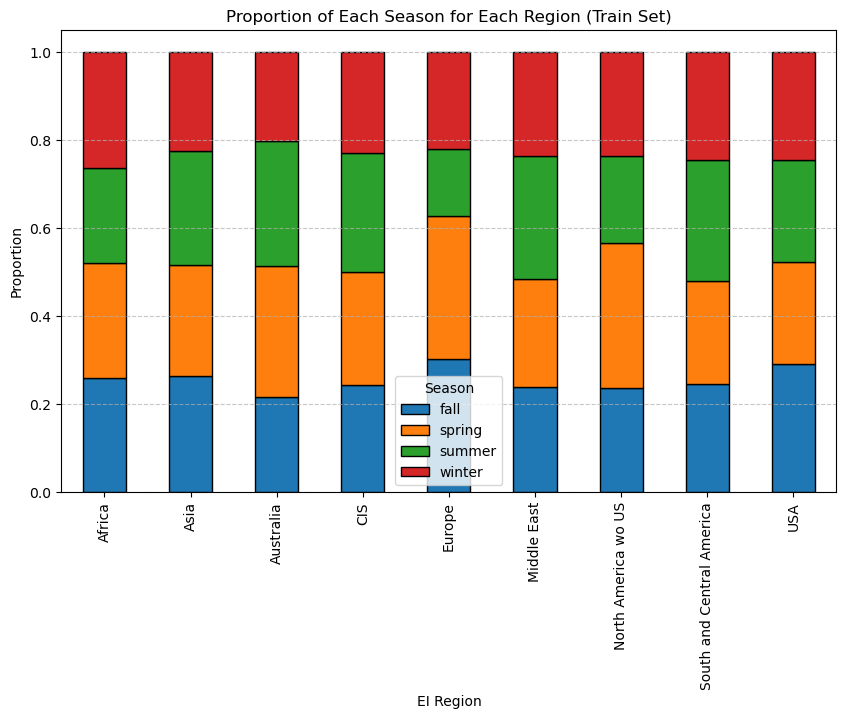

In [26]:
# Create a new 'season' column
def get_season(month):
    if month in [12, 1, 2]:
        return "winter"
    elif month in [3, 4, 5]:
        return "spring"
    elif month in [6, 7, 8]:
        return "summer"
    else:
        return "fall"


df_train_final["datetime"] = pd.to_datetime(df_train_final["datetime"], format="%Y-%m-%dT%H:%M:%S.%f%z")
df_train_final["season"] = df_train_final["datetime"].dt.month.apply(get_season)

# Count occurrences of each season per EI_region
season_counts = df_train_final.groupby(["EI_region", "season"]).size().unstack(fill_value=0)

# Normalize to get proportions
season_proportions = season_counts.div(season_counts.sum(axis=1), axis=0)

# Plot the proportions as a stacked bar chart
season_proportions.plot(kind="bar", stacked=True, figsize=(10, 6), edgecolor="black")

# Customize plot
plt.title("Proportion of Each Season for Each Region (Train Set)")
plt.xlabel("EI Region")
plt.ylabel("Proportion")
plt.legend(title="Season")
plt.xticks(rotation=90)
plt.grid(axis="y", linestyle="--", alpha=0.7)

# Show plot
plt.show()

# Appendix: Load other producing datasets

- For querying our DB programtically it is easiest to use your AWS VM instead of an Azure VM since there is some connection magic needed (Diehl is the expert on this)
- See Slide 21-25 in [Tile Selection + Reference tiles + Chip masking](https://docs.google.com/presentation/d/1p4pgQJjGQB4yssF7Wxs0aLuxp6xofJeKFjqrp1iUXSs/edit#slide=id.g3254c12f455_0_0) for details on the HIFLD/OGIM datasets

In [ ]:
### Connect to DB ###

# db_port = 5432
# db_name = "orbio"
# db_user = "readonly_user"
# db_host = "orbio-dev-db-ro.ccfdaoc3gfph.eu-central-1.rds.amazonaws.com"
# from getpass import getpass
# db_password = getpass("Read-only password (see https://git.orbio.earth/orbio/wiki/-/wikis/Playbooks/SQL-DBs-Access-&-Troubleshooting-(see-here-for-read-only-DBs!) ):")

# conn = sqlalchemy.create_engine(
#     f"postgresql+psycopg2://{db_user}:{db_password}@{db_host}:{db_port}/{db_name}"
# )

### Query HIFLD Data ###

# query = """
# SELECT geom
# FROM source
# WHERE origin_dataset = %s
# """
# url = 'https://hifld-geoplatform.opendata.arcgis.com/datasets/geoplatform::oil-and-natural-gas-wells/explore?location=35.790450%2C-102.912136%2C4.22'

# hifld = gpd.read_postgis(query, con=conn, params=(url,), geom_col='geom')

### Query OGIM USA Data ###

# query = """
# SELECT geom
# FROM source
# WHERE origin_dataset = 'ogim'
#   AND (TYPE <> 'OIL AND NATURAL GAS PIPELINES' AND TYPE <> 'NATURAL GAS FLARING DETECTIONS')
# """

# ogim_usa = gpd.read_postgis(query, con=conn, geom_col='geom')